# Keras modeling for cat detection

Welcome to keras for cat detection, in this will learn how to generate the model and testing with your own picture.


**Instructions:**
- Reuse previous data set and get better performance.

**You will learn to:**
- Build the general architecture of a learning algorithm, including:
    - Initializing parameters
    - Calculating the cost function and its gradient
    - Using an optimization algorithm (gradient descent) 
- Gather all three functions above into a main model function, in the right order.

## 1 - Packages ##

First, let's run the cell below to import all the packages that you will need during this assignment. 
- [numpy](www.numpy.org) is the fundamental package for scientific computing with Python.
- [h5py](http://www.h5py.org) is a common package to interact with a dataset that is stored on an H5 file.
- [matplotlib](http://matplotlib.org) is a famous library to plot graphs in Python.
- [PIL](http://www.pythonware.com/products/pil/) and [scipy](https://www.scipy.org/) are used here to test your model with your own picture at the end.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (7,7) # Make the figures a bit bigger

import h5py
import scipy
from PIL import Image
from scipy import ndimage
from lr_utils import load_dataset

from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.utils import np_utils
from keras import metrics

%matplotlib inline

Using TensorFlow backend.


## 2 - Overview of the Problem set ##

**Problem Statement**: You are given a dataset ("data.h5") containing:
    - a training set of m_train images labeled as cat (y=1) or non-cat (y=0)
    - a test set of m_test images labeled as cat or non-cat
    - each image is of shape (num_px, num_px, 3) where 3 is for the 3 channels (RGB). Thus, each image is square (height = num_px) and (width = num_px).

You will build a simple image-recognition algorithm that can correctly classify pictures as cat or non-cat.

Let's get more familiar with the dataset. Load the data by running the following code.

In [2]:
# Loading the data (cat/non-cat)
train_set_x_orig, train_set_y, test_set_x_orig, test_set_y, classes = load_dataset()

print('train_set_x_orig.shape=',train_set_x_orig.shape)
print('train_set_y.shape=',train_set_y.shape)
print('test_set_x_orig.shape=',test_set_x_orig.shape)
print('test_set_y.shape=',test_set_y.shape)
print(classes)


train_set_x_orig.shape= (209, 64, 64, 3)
train_set_y.shape= (1, 209)
test_set_x_orig.shape= (50, 64, 64, 3)
test_set_y.shape= (1, 50)
[b'non-cat' b'cat']


We added "_orig" at the end of image datasets (train and test) because we are going to preprocess them. After preprocessing, we will end up with train_set_x and test_set_x (the labels train_set_y and test_set_y don't need any preprocessing).

Each line of your train_set_x_orig and test_set_x_orig is an array representing an image. You can visualize an example by running the following code. Feel free also to change the `index` value and re-run to see other images. 

In [3]:
# Reshape the training and test examples

### START CODE HERE ### (≈ 2 lines of code)
X_train = train_set_x_orig.reshape(train_set_x_orig.shape[0],-1)/255
X_test = test_set_x_orig.reshape(test_set_x_orig.shape[0],-1)/255

### END CODE HERE ###
#X_train = train_set_x_flatten.T
#X_test = test_set_x_flatten.T

Y_train = train_set_y.T  #np_utils.to_categorical(train_set_y.T, nb_classes)
Y_test = test_set_y.T #np_utils.to_categorical(test_set_y.T, nb_classes)

print ("X_train shape: " + str(X_train.shape))
print ("X_test shape: " + str(X_test.shape))
print ("Y_train shape: " + str(Y_train.shape))
print ("Y_test shape: " + str(Y_test.shape))
print(X_train)


X_train shape: (209, 12288)
X_test shape: (50, 12288)
Y_train shape: (209, 1)
Y_test shape: (50, 1)
[[ 0.06666667  0.12156863  0.21960784 ...,  0.          0.          0.        ]
 [ 0.76862745  0.75294118  0.74509804 ...,  0.32156863  0.31372549
   0.31764706]
 [ 0.32156863  0.27843137  0.26666667 ...,  0.54117647  0.55294118
   0.55686275]
 ..., 
 [ 0.56078431  0.60784314  0.64705882 ...,  0.33333333  0.41960784
   0.58431373]
 [ 0.08627451  0.09411765  0.09019608 ...,  0.01568627  0.01960784  0.        ]
 [ 0.03137255  0.10980392  0.20784314 ...,  0.          0.          0.        ]]


## 3 - General Architecture of the learning algorithm ##

It's time to design a simple algorithm to distinguish cat images from non-cat images.

You will build a Logistic Regression, using a Neural Network mindset. The following Figure explains why **Logistic Regression is actually a very simple Neural Network!**

<img src="images/LogReg_kiank.png" style="width:650px;height:400px;">

**Mathematical expression of the algorithm**:

For one example $x^{(i)}$:
$$z^{(i)} = w^T x^{(i)} + b \tag{1}$$
$$\hat{y}^{(i)} = a^{(i)} = sigmoid(z^{(i)})\tag{2}$$ 
$$ \mathcal{L}(a^{(i)}, y^{(i)}) =  - y^{(i)}  \log(a^{(i)}) - (1-y^{(i)} )  \log(1-a^{(i)})\tag{3}$$

The cost is then computed by summing over all training examples:
$$ J = \frac{1}{m} \sum_{i=1}^m \mathcal{L}(a^{(i)}, y^{(i)})\tag{6}$$

**Key steps**:
In this exercise, you will carry out the following steps: 
    - Initialize the parameters of the model
    - Learn the parameters for the model by minimizing the cost  
    - Use the learned parameters to make predictions (on the test set)
    - Analyse the results and conclude

In [4]:
def createModel_org():
    model = Sequential()
    model.add(Dense(1,input_shape=(12288,)))
    model.add(Activation('sigmoid'))
    return model


model_org = createModel_org()
model_org.compile(loss='binary_crossentropy', optimizer='sgd',metrics=['accuracy'])

In [12]:
model_org.fit(X_train, Y_train,batch_size=8, epochs=10,verbose=1, validation_data=(X_test, Y_test))

Train on 209 samples, validate on 50 samples
Epoch 1/10
209/209 [==============================] - 0s - loss: 0.0681 - acc: 0.9904 - val_loss: 1.0455 - val_acc: 0.7200
Epoch 2/10
209/209 [==============================] - 0s - loss: 0.0637 - acc: 0.9952 - val_loss: 1.0731 - val_acc: 0.7200
Epoch 3/10
209/209 [==============================] - 0s - loss: 0.0745 - acc: 0.9856 - val_loss: 1.6575 - val_acc: 0.5000
Epoch 4/10
209/209 [==============================] - 0s - loss: 0.0680 - acc: 0.9904 - val_loss: 1.3045 - val_acc: 0.6400
Epoch 5/10
209/209 [==============================] - 0s - loss: 0.0720 - acc: 0.9952 - val_loss: 1.2217 - val_acc: 0.6600
Epoch 6/10
209/209 [==============================] - 0s - loss: 0.0666 - acc: 0.9904 - val_loss: 1.2450 - val_acc: 0.6200
Epoch 7/10
209/209 [==============================] - 0s - loss: 0.0533 - acc: 1.0000 - val_loss: 1.2577 - val_acc: 0.6400
Epoch 8/10
209/209 [==============================] - 0s - loss: 0.0618 - acc: 0.9952 - val_lo

In [488]:
def createModel():
    model = Sequential()
    model.add(Dense(128,input_shape=(12288,)))
    model.add(Activation('relu')) 
    model.add(Dropout(0.2))   
    
    model.add(Dense(64))
    model.add(Activation('relu'))
    
    model.add(Dense(16))
    model.add(Activation('relu'))
    
    model.add(Dense(8))
    model.add(Activation('relu'))
    
    model.add(Dense(4))
    model.add(Activation('relu'))
    
    #model.add(Dropout(0.2))
    model.add(Dense(1))
    model.add(Activation('sigmoid')) 

    return model

m = createModel()
#m.compile(loss='binary_crossentropy', optimizer='sgd',metrics=['accuracy'])
m.compile(loss='mean_squared_error', optimizer='sgd',metrics=['accuracy'])



In [ ]:
m.fit(X_train, Y_train,batch_size=8, epochs=100000,verbose=1, validation_data=(X_test, Y_test))


Train on 209 samples, validate on 50 samples
Epoch 1/100000
209/209 [==============================] - 0s - loss: 5.0936e-05 - acc: 1.0000 - val_loss: 0.2011 - val_acc: 0.7800
Epoch 2/100000
209/209 [==============================] - 0s - loss: 2.6432e-06 - acc: 1.0000 - val_loss: 0.2011 - val_acc: 0.7800
Epoch 3/100000
209/209 [==============================] - 0s - loss: 1.0017e-05 - acc: 1.0000 - val_loss: 0.2011 - val_acc: 0.7800
Epoch 4/100000
209/209 [==============================] - 0s - loss: 9.5253e-06 - acc: 1.0000 - val_loss: 0.2016 - val_acc: 0.7800
Epoch 5/100000
209/209 [==============================] - 0s - loss: 5.5497e-05 - acc: 1.0000 - val_loss: 0.1999 - val_acc: 0.7800
Epoch 6/100000
209/209 [==============================] - 0s - loss: 5.5807e-05 - acc: 1.0000 - val_loss: 0.2007 - val_acc: 0.7800
Epoch 7/100000
209/209 [==============================] - 0s - loss: 5.7807e-05 - acc: 1.0000 - val_loss: 0.1949 - val_acc: 0.7800
Epoch 8/100000
209/209 [==============

209/209 [==============================] - 0s - loss: 6.5286e-06 - acc: 1.0000 - val_loss: 0.1935 - val_acc: 0.7800
Epoch 125/100000
209/209 [==============================] - 0s - loss: 3.0638e-06 - acc: 1.0000 - val_loss: 0.1936 - val_acc: 0.7800
Epoch 126/100000
209/209 [==============================] - 0s - loss: 1.6355e-05 - acc: 1.0000 - val_loss: 0.1935 - val_acc: 0.7800
Epoch 127/100000
209/209 [==============================] - 0s - loss: 2.1719e-05 - acc: 1.0000 - val_loss: 0.1956 - val_acc: 0.7800
Epoch 128/100000
209/209 [==============================] - 0s - loss: 4.0497e-06 - acc: 1.0000 - val_loss: 0.1958 - val_acc: 0.7800
Epoch 129/100000
209/209 [==============================] - 0s - loss: 5.5165e-06 - acc: 1.0000 - val_loss: 0.1956 - val_acc: 0.7800
Epoch 130/100000
209/209 [==============================] - 0s - loss: 1.0211e-05 - acc: 1.0000 - val_loss: 0.1955 - val_acc: 0.7800
Epoch 131/100000
209/209 [==============================] - 0s - loss: 3.1718e-06 - ac

209/209 [==============================] - 0s - loss: 2.2054e-05 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7400
Epoch 247/100000
209/209 [==============================] - 0s - loss: 3.1514e-05 - acc: 1.0000 - val_loss: 0.2195 - val_acc: 0.7400
Epoch 248/100000
209/209 [==============================] - 0s - loss: 1.6963e-05 - acc: 1.0000 - val_loss: 0.2200 - val_acc: 0.7400
Epoch 249/100000
209/209 [==============================] - 0s - loss: 3.5305e-04 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 250/100000
209/209 [==============================] - 0s - loss: 1.7200e-05 - acc: 1.0000 - val_loss: 0.2107 - val_acc: 0.7800
Epoch 251/100000
209/209 [==============================] - 0s - loss: 9.2361e-06 - acc: 1.0000 - val_loss: 0.2111 - val_acc: 0.7800
Epoch 252/100000
209/209 [==============================] - 0s - loss: 5.1803e-06 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 253/100000
209/209 [==============================] - 0s - loss: 4.6276e-06 - ac

209/209 [==============================] - 0s - loss: 2.7408e-06 - acc: 1.0000 - val_loss: 0.1905 - val_acc: 0.7800
Epoch 369/100000
209/209 [==============================] - 0s - loss: 5.9408e-06 - acc: 1.0000 - val_loss: 0.1904 - val_acc: 0.7800
Epoch 370/100000
209/209 [==============================] - 0s - loss: 2.3623e-05 - acc: 1.0000 - val_loss: 0.1877 - val_acc: 0.7800
Epoch 371/100000
209/209 [==============================] - 0s - loss: 4.6784e-06 - acc: 1.0000 - val_loss: 0.1878 - val_acc: 0.7800
Epoch 372/100000
209/209 [==============================] - 0s - loss: 5.5953e-06 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.7800
Epoch 373/100000
209/209 [==============================] - 0s - loss: 4.5252e-06 - acc: 1.0000 - val_loss: 0.1878 - val_acc: 0.7800
Epoch 374/100000
209/209 [==============================] - 0s - loss: 1.4454e-05 - acc: 1.0000 - val_loss: 0.1878 - val_acc: 0.7800
Epoch 375/100000
209/209 [==============================] - 0s - loss: 3.0190e-05 - ac

209/209 [==============================] - 0s - loss: 9.9822e-06 - acc: 1.0000 - val_loss: 0.1896 - val_acc: 0.7800
Epoch 491/100000
209/209 [==============================] - 0s - loss: 5.2882e-06 - acc: 1.0000 - val_loss: 0.1896 - val_acc: 0.7800
Epoch 492/100000
209/209 [==============================] - 0s - loss: 3.6030e-04 - acc: 1.0000 - val_loss: 0.2031 - val_acc: 0.7600
Epoch 493/100000
209/209 [==============================] - 0s - loss: 0.0015 - acc: 0.9952 - val_loss: 0.1764 - val_acc: 0.8000
Epoch 494/100000
209/209 [==============================] - 0s - loss: 3.1797e-04 - acc: 1.0000 - val_loss: 0.2007 - val_acc: 0.7800
Epoch 495/100000
209/209 [==============================] - 0s - loss: 6.9208e-06 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 496/100000
209/209 [==============================] - 0s - loss: 0.0030 - acc: 0.9952 - val_loss: 0.2055 - val_acc: 0.7800
Epoch 497/100000
209/209 [==============================] - 0s - loss: 0.0026 - acc: 0.9952 - 

209/209 [==============================] - 0s - loss: 5.3697e-06 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.7800
Epoch 613/100000
209/209 [==============================] - 0s - loss: 1.8216e-04 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.7800
Epoch 614/100000
209/209 [==============================] - 0s - loss: 2.9719e-06 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.7800
Epoch 615/100000
209/209 [==============================] - 0s - loss: 7.5715e-06 - acc: 1.0000 - val_loss: 0.2021 - val_acc: 0.7800
Epoch 616/100000
209/209 [==============================] - 0s - loss: 6.1211e-06 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.7800
Epoch 617/100000
209/209 [==============================] - 0s - loss: 1.9644e-06 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.7800
Epoch 618/100000
209/209 [==============================] - 0s - loss: 3.2139e-05 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 619/100000
209/209 [==============================] - 0s - loss: 1.9998e-06 - ac

209/209 [==============================] - 0s - loss: 3.4905e-06 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.7600
Epoch 735/100000
209/209 [==============================] - 0s - loss: 2.4053e-06 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.7600
Epoch 736/100000
209/209 [==============================] - 0s - loss: 1.2553e-06 - acc: 1.0000 - val_loss: 0.2006 - val_acc: 0.7600
Epoch 737/100000
209/209 [==============================] - 0s - loss: 4.8892e-06 - acc: 1.0000 - val_loss: 0.2006 - val_acc: 0.7600
Epoch 738/100000
209/209 [==============================] - 0s - loss: 2.6302e-06 - acc: 1.0000 - val_loss: 0.2006 - val_acc: 0.7600
Epoch 739/100000
209/209 [==============================] - 0s - loss: 1.1099e-05 - acc: 1.0000 - val_loss: 0.2002 - val_acc: 0.7600
Epoch 740/100000
209/209 [==============================] - 0s - loss: 1.5120e-06 - acc: 1.0000 - val_loss: 0.2002 - val_acc: 0.7600
Epoch 741/100000
209/209 [==============================] - 0s - loss: 2.5552e-06 - ac

209/209 [==============================] - 0s - loss: 6.7137e-06 - acc: 1.0000 - val_loss: 0.1682 - val_acc: 0.8200
Epoch 857/100000
209/209 [==============================] - 0s - loss: 6.2679e-05 - acc: 1.0000 - val_loss: 0.1721 - val_acc: 0.8200
Epoch 858/100000
209/209 [==============================] - 0s - loss: 4.5437e-06 - acc: 1.0000 - val_loss: 0.1725 - val_acc: 0.8200
Epoch 859/100000
209/209 [==============================] - 0s - loss: 1.2272e-05 - acc: 1.0000 - val_loss: 0.1729 - val_acc: 0.8000
Epoch 860/100000
209/209 [==============================] - 0s - loss: 2.8222e-06 - acc: 1.0000 - val_loss: 0.1731 - val_acc: 0.8000
Epoch 861/100000
209/209 [==============================] - 0s - loss: 2.9980e-06 - acc: 1.0000 - val_loss: 0.1733 - val_acc: 0.8000
Epoch 862/100000
209/209 [==============================] - 0s - loss: 1.7124e-06 - acc: 1.0000 - val_loss: 0.1733 - val_acc: 0.8000
Epoch 863/100000
209/209 [==============================] - 0s - loss: 8.5916e-05 - ac

209/209 [==============================] - 0s - loss: 1.8490e-05 - acc: 1.0000 - val_loss: 0.1943 - val_acc: 0.7800
Epoch 979/100000
209/209 [==============================] - 0s - loss: 4.5296e-07 - acc: 1.0000 - val_loss: 0.1943 - val_acc: 0.7800
Epoch 980/100000
209/209 [==============================] - 0s - loss: 3.6182e-06 - acc: 1.0000 - val_loss: 0.1944 - val_acc: 0.7800
Epoch 981/100000
209/209 [==============================] - 0s - loss: 5.2760e-06 - acc: 1.0000 - val_loss: 0.1946 - val_acc: 0.7800
Epoch 982/100000
209/209 [==============================] - 0s - loss: 1.8595e-06 - acc: 1.0000 - val_loss: 0.1946 - val_acc: 0.7800
Epoch 983/100000
209/209 [==============================] - 0s - loss: 1.6254e-05 - acc: 1.0000 - val_loss: 0.1946 - val_acc: 0.7800
Epoch 984/100000
209/209 [==============================] - 0s - loss: 6.3485e-06 - acc: 1.0000 - val_loss: 0.1951 - val_acc: 0.7800
Epoch 985/100000
209/209 [==============================] - 0s - loss: 2.5071e-05 - ac

209/209 [==============================] - 0s - loss: 7.9403e-05 - acc: 1.0000 - val_loss: 0.1676 - val_acc: 0.8200
Epoch 1101/100000
209/209 [==============================] - 0s - loss: 1.8301e-05 - acc: 1.0000 - val_loss: 0.1703 - val_acc: 0.8000
Epoch 1102/100000
209/209 [==============================] - 0s - loss: 7.7581e-06 - acc: 1.0000 - val_loss: 0.1707 - val_acc: 0.8000
Epoch 1103/100000
209/209 [==============================] - 0s - loss: 2.2877e-05 - acc: 1.0000 - val_loss: 0.1729 - val_acc: 0.8000
Epoch 1104/100000
209/209 [==============================] - 0s - loss: 5.7430e-06 - acc: 1.0000 - val_loss: 0.1736 - val_acc: 0.8000
Epoch 1105/100000
209/209 [==============================] - 0s - loss: 1.7412e-06 - acc: 1.0000 - val_loss: 0.1736 - val_acc: 0.8000
Epoch 1106/100000
209/209 [==============================] - 0s - loss: 6.3837e-06 - acc: 1.0000 - val_loss: 0.1742 - val_acc: 0.8000
Epoch 1107/100000
209/209 [==============================] - 0s - loss: 8.4059e-

209/209 [==============================] - 0s - loss: 5.2123e-06 - acc: 1.0000 - val_loss: 0.1945 - val_acc: 0.7800
Epoch 1223/100000
209/209 [==============================] - 0s - loss: 2.3118e-05 - acc: 1.0000 - val_loss: 0.1955 - val_acc: 0.7800
Epoch 1224/100000
209/209 [==============================] - 0s - loss: 3.7785e-05 - acc: 1.0000 - val_loss: 0.1936 - val_acc: 0.7800
Epoch 1225/100000
209/209 [==============================] - 0s - loss: 2.0847e-05 - acc: 1.0000 - val_loss: 0.1945 - val_acc: 0.7800
Epoch 1226/100000
209/209 [==============================] - 0s - loss: 6.9020e-06 - acc: 1.0000 - val_loss: 0.1945 - val_acc: 0.7800
Epoch 1227/100000
209/209 [==============================] - 0s - loss: 2.6831e-06 - acc: 1.0000 - val_loss: 0.1945 - val_acc: 0.7800
Epoch 1228/100000
209/209 [==============================] - 0s - loss: 5.1843e-06 - acc: 1.0000 - val_loss: 0.1957 - val_acc: 0.7800
Epoch 1229/100000
209/209 [==============================] - 0s - loss: 5.5606e-

209/209 [==============================] - 0s - loss: 1.4108e-05 - acc: 1.0000 - val_loss: 0.1893 - val_acc: 0.7800
Epoch 1345/100000
209/209 [==============================] - 0s - loss: 1.1105e-05 - acc: 1.0000 - val_loss: 0.1904 - val_acc: 0.7800
Epoch 1346/100000
209/209 [==============================] - 0s - loss: 6.2809e-06 - acc: 1.0000 - val_loss: 0.1905 - val_acc: 0.7800
Epoch 1347/100000
209/209 [==============================] - 0s - loss: 6.7720e-06 - acc: 1.0000 - val_loss: 0.1904 - val_acc: 0.7800
Epoch 1348/100000
209/209 [==============================] - 0s - loss: 3.2277e-05 - acc: 1.0000 - val_loss: 0.1936 - val_acc: 0.7800
Epoch 1349/100000
209/209 [==============================] - 0s - loss: 1.5603e-05 - acc: 1.0000 - val_loss: 0.1940 - val_acc: 0.7800
Epoch 1350/100000
209/209 [==============================] - 0s - loss: 1.1827e-05 - acc: 1.0000 - val_loss: 0.1940 - val_acc: 0.7800
Epoch 1351/100000
209/209 [==============================] - 0s - loss: 9.0563e-

209/209 [==============================] - 0s - loss: 9.3351e-07 - acc: 1.0000 - val_loss: 0.2098 - val_acc: 0.7600
Epoch 1467/100000
209/209 [==============================] - 0s - loss: 5.4553e-06 - acc: 1.0000 - val_loss: 0.2102 - val_acc: 0.7600
Epoch 1468/100000
209/209 [==============================] - 0s - loss: 2.1921e-05 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7600
Epoch 1469/100000
209/209 [==============================] - 0s - loss: 1.6922e-05 - acc: 1.0000 - val_loss: 0.2112 - val_acc: 0.7600
Epoch 1470/100000
209/209 [==============================] - 0s - loss: 2.1140e-06 - acc: 1.0000 - val_loss: 0.2112 - val_acc: 0.7600
Epoch 1471/100000
209/209 [==============================] - 0s - loss: 1.5390e-05 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7600
Epoch 1472/100000
209/209 [==============================] - 0s - loss: 3.6313e-06 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7600cc: 
Epoch 1473/100000
209/209 [==============================] - 0s - loss: 3.86

209/209 [==============================] - 0s - loss: 6.3178e-06 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7600
Epoch 1589/100000
209/209 [==============================] - 0s - loss: 1.5728e-06 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7600
Epoch 1590/100000
209/209 [==============================] - 0s - loss: 2.7469e-06 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7600
Epoch 1591/100000
209/209 [==============================] - 0s - loss: 2.9055e-06 - acc: 1.0000 - val_loss: 0.2143 - val_acc: 0.7600
Epoch 1592/100000
209/209 [==============================] - 0s - loss: 7.7348e-06 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7600
Epoch 1593/100000
209/209 [==============================] - 0s - loss: 7.1963e-07 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7600
Epoch 1594/100000
209/209 [==============================] - 0s - loss: 7.6878e-07 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7600
Epoch 1595/100000
209/209 [==============================] - 0s - loss: 1.4239e-

209/209 [==============================] - 0s - loss: 1.7224e-06 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7600
Epoch 1711/100000
209/209 [==============================] - 0s - loss: 5.9721e-06 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7600
Epoch 1712/100000
209/209 [==============================] - 0s - loss: 5.3043e-04 - acc: 1.0000 - val_loss: 0.1911 - val_acc: 0.8000
Epoch 1713/100000
209/209 [==============================] - 0s - loss: 3.0275e-04 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7600
Epoch 1714/100000
209/209 [==============================] - 0s - loss: 1.0114e-05 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7600
Epoch 1715/100000
209/209 [==============================] - 0s - loss: 1.8687e-06 - acc: 1.0000 - val_loss: 0.2266 - val_acc: 0.7600
Epoch 1716/100000
209/209 [==============================] - 0s - loss: 3.1323e-06 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7600
Epoch 1717/100000
209/209 [==============================] - 0s - loss: 3.0632e-

209/209 [==============================] - 0s - loss: 8.0253e-06 - acc: 1.0000 - val_loss: 0.2066 - val_acc: 0.7800
Epoch 1833/100000
209/209 [==============================] - 0s - loss: 3.4961e-06 - acc: 1.0000 - val_loss: 0.2067 - val_acc: 0.7800
Epoch 1834/100000
209/209 [==============================] - 0s - loss: 3.8189e-06 - acc: 1.0000 - val_loss: 0.2069 - val_acc: 0.7800
Epoch 1835/100000
209/209 [==============================] - 0s - loss: 2.4098e-05 - acc: 1.0000 - val_loss: 0.2078 - val_acc: 0.7800
Epoch 1836/100000
209/209 [==============================] - 0s - loss: 2.4017e-05 - acc: 1.0000 - val_loss: 0.2105 - val_acc: 0.7800
Epoch 1837/100000
209/209 [==============================] - 0s - loss: 8.7238e-04 - acc: 1.0000 - val_loss: 0.2467 - val_acc: 0.7400
Epoch 1838/100000
209/209 [==============================] - 0s - loss: 1.5860e-04 - acc: 1.0000 - val_loss: 0.2319 - val_acc: 0.7400
Epoch 1839/100000
209/209 [==============================] - 0s - loss: 8.8936e-

209/209 [==============================] - 0s - loss: 3.8155e-06 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 1955/100000
209/209 [==============================] - 0s - loss: 1.1155e-06 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 1956/100000
209/209 [==============================] - 0s - loss: 7.4640e-07 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 1957/100000
209/209 [==============================] - 0s - loss: 3.0015e-04 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 1958/100000
209/209 [==============================] - 0s - loss: 2.8551e-06 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 1959/100000
209/209 [==============================] - 0s - loss: 1.4872e-06 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 1960/100000
209/209 [==============================] - 0s - loss: 8.7586e-06 - acc: 1.0000 - val_loss: 0.2157 - val_acc: 0.7800
Epoch 1961/100000
209/209 [==============================] - 0s - loss: 5.9362e-

209/209 [==============================] - 0s - loss: 3.8860e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 2077/100000
209/209 [==============================] - 0s - loss: 5.6764e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 2078/100000
209/209 [==============================] - 0s - loss: 2.0004e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 2079/100000
209/209 [==============================] - 0s - loss: 2.5446e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 2080/100000
209/209 [==============================] - 0s - loss: 2.3070e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 2081/100000
209/209 [==============================] - 0s - loss: 4.6429e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 2082/100000
209/209 [==============================] - 0s - loss: 1.9567e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 2083/100000
209/209 [==============================] - 0s - loss: 1.8147e-

209/209 [==============================] - 0s - loss: 6.9666e-05 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 2199/100000
209/209 [==============================] - 0s - loss: 1.2544e-06 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 2200/100000
209/209 [==============================] - 0s - loss: 1.1842e-06 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 2201/100000
209/209 [==============================] - 0s - loss: 1.0357e-06 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 2202/100000
209/209 [==============================] - 0s - loss: 5.6304e-05 - acc: 1.0000 - val_loss: 0.2102 - val_acc: 0.7800
Epoch 2203/100000
209/209 [==============================] - 0s - loss: 1.3420e-06 - acc: 1.0000 - val_loss: 0.2102 - val_acc: 0.7800
Epoch 2204/100000
209/209 [==============================] - 0s - loss: 4.4421e-06 - acc: 1.0000 - val_loss: 0.2102 - val_acc: 0.7800
Epoch 2205/100000
209/209 [==============================] - 0s - loss: 2.0156e-

209/209 [==============================] - 0s - loss: 9.8301e-07 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 2321/100000
209/209 [==============================] - 0s - loss: 2.3981e-06 - acc: 1.0000 - val_loss: 0.2104 - val_acc: 0.7800
Epoch 2322/100000
209/209 [==============================] - 0s - loss: 2.4078e-06 - acc: 1.0000 - val_loss: 0.2104 - val_acc: 0.7800
Epoch 2323/100000
209/209 [==============================] - 0s - loss: 8.6510e-07 - acc: 1.0000 - val_loss: 0.2104 - val_acc: 0.7800
Epoch 2324/100000
209/209 [==============================] - 0s - loss: 2.1832e-05 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7800
Epoch 2325/100000
209/209 [==============================] - 0s - loss: 1.6428e-06 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7800
Epoch 2326/100000
209/209 [==============================] - 0s - loss: 4.8639e-07 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7800
Epoch 2327/100000
209/209 [==============================] - 0s - loss: 7.3892e-

209/209 [==============================] - 0s - loss: 1.6867e-06 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2442/100000
209/209 [==============================] - 0s - loss: 5.6764e-07 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2443/100000
209/209 [==============================] - 0s - loss: 1.0388e-06 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2444/100000
209/209 [==============================] - 0s - loss: 4.3225e-06 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2445/100000
209/209 [==============================] - 0s - loss: 9.4156e-07 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2446/100000
209/209 [==============================] - 0s - loss: 5.6857e-07 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2447/100000
209/209 [==============================] - 0s - loss: 1.4402e-06 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2448/100000
209/209 [==============================] - 0s - loss: 8.2424e-

209/209 [==============================] - 0s - loss: 3.6114e-06 - acc: 1.0000 - val_loss: 0.1931 - val_acc: 0.8000
Epoch 2564/100000
209/209 [==============================] - 0s - loss: 5.6157e-07 - acc: 1.0000 - val_loss: 0.1931 - val_acc: 0.8000
Epoch 2565/100000
209/209 [==============================] - 0s - loss: 8.6093e-06 - acc: 1.0000 - val_loss: 0.1930 - val_acc: 0.8000
Epoch 2566/100000
209/209 [==============================] - 0s - loss: 1.5356e-05 - acc: 1.0000 - val_loss: 0.1931 - val_acc: 0.8000
Epoch 2567/100000
209/209 [==============================] - 0s - loss: 7.2586e-06 - acc: 1.0000 - val_loss: 0.1932 - val_acc: 0.8000
Epoch 2568/100000
209/209 [==============================] - 0s - loss: 3.3878e-06 - acc: 1.0000 - val_loss: 0.1932 - val_acc: 0.8000
Epoch 2569/100000
209/209 [==============================] - 0s - loss: 9.9366e-06 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 2570/100000
209/209 [==============================] - 0s - loss: 4.6534e-

209/209 [==============================] - 0s - loss: 3.5586e-07 - acc: 1.0000 - val_loss: 0.2108 - val_acc: 0.7600
Epoch 2686/100000
209/209 [==============================] - 0s - loss: 3.1733e-07 - acc: 1.0000 - val_loss: 0.2108 - val_acc: 0.7600
Epoch 2687/100000
209/209 [==============================] - 0s - loss: 4.6601e-07 - acc: 1.0000 - val_loss: 0.2108 - val_acc: 0.7600
Epoch 2688/100000
209/209 [==============================] - 0s - loss: 1.0165e-04 - acc: 1.0000 - val_loss: 0.2151 - val_acc: 0.7600
Epoch 2689/100000
209/209 [==============================] - 0s - loss: 1.0111e-06 - acc: 1.0000 - val_loss: 0.2151 - val_acc: 0.7600
Epoch 2690/100000
209/209 [==============================] - 0s - loss: 1.7069e-06 - acc: 1.0000 - val_loss: 0.2150 - val_acc: 0.7600
Epoch 2691/100000
209/209 [==============================] - 0s - loss: 6.8481e-07 - acc: 1.0000 - val_loss: 0.2150 - val_acc: 0.7600
Epoch 2692/100000
209/209 [==============================] - 0s - loss: 6.7399e-

209/209 [==============================] - 0s - loss: 4.5407e-07 - acc: 1.0000 - val_loss: 0.1891 - val_acc: 0.8000
Epoch 2808/100000
209/209 [==============================] - 0s - loss: 9.1053e-06 - acc: 1.0000 - val_loss: 0.1897 - val_acc: 0.8000
Epoch 2809/100000
209/209 [==============================] - 0s - loss: 2.4463e-05 - acc: 1.0000 - val_loss: 0.1913 - val_acc: 0.8000
Epoch 2810/100000
209/209 [==============================] - 0s - loss: 6.9834e-07 - acc: 1.0000 - val_loss: 0.1914 - val_acc: 0.8000
Epoch 2811/100000
209/209 [==============================] - 0s - loss: 4.9894e-06 - acc: 1.0000 - val_loss: 0.1914 - val_acc: 0.8000
Epoch 2812/100000
209/209 [==============================] - 0s - loss: 1.9880e-05 - acc: 1.0000 - val_loss: 0.1899 - val_acc: 0.8000
Epoch 2813/100000
209/209 [==============================] - 0s - loss: 5.3626e-06 - acc: 1.0000 - val_loss: 0.1903 - val_acc: 0.8000
Epoch 2814/100000
209/209 [==============================] - 0s - loss: 2.0606e-

209/209 [==============================] - 0s - loss: 2.3332e-06 - acc: 1.0000 - val_loss: 0.1948 - val_acc: 0.8000
Epoch 2930/100000
209/209 [==============================] - 0s - loss: 6.2751e-06 - acc: 1.0000 - val_loss: 0.1952 - val_acc: 0.8000
Epoch 2931/100000
209/209 [==============================] - 0s - loss: 1.3858e-06 - acc: 1.0000 - val_loss: 0.1952 - val_acc: 0.8000
Epoch 2932/100000
209/209 [==============================] - 0s - loss: 2.4962e-06 - acc: 1.0000 - val_loss: 0.1952 - val_acc: 0.8000
Epoch 2933/100000
209/209 [==============================] - 0s - loss: 9.7808e-07 - acc: 1.0000 - val_loss: 0.1952 - val_acc: 0.8000
Epoch 2934/100000
209/209 [==============================] - 0s - loss: 4.1800e-05 - acc: 1.0000 - val_loss: 0.1944 - val_acc: 0.8000
Epoch 2935/100000
209/209 [==============================] - 0s - loss: 1.0426e-06 - acc: 1.0000 - val_loss: 0.1944 - val_acc: 0.8000
Epoch 2936/100000
209/209 [==============================] - 0s - loss: 1.2550e-

209/209 [==============================] - 0s - loss: 1.7278e-06 - acc: 1.0000 - val_loss: 0.2043 - val_acc: 0.7800
Epoch 3052/100000
209/209 [==============================] - 0s - loss: 2.0040e-07 - acc: 1.0000 - val_loss: 0.2044 - val_acc: 0.7800
Epoch 3053/100000
209/209 [==============================] - 0s - loss: 1.8075e-06 - acc: 1.0000 - val_loss: 0.2044 - val_acc: 0.7800
Epoch 3054/100000
209/209 [==============================] - 0s - loss: 3.7807e-05 - acc: 1.0000 - val_loss: 0.2016 - val_acc: 0.7800
Epoch 3055/100000
209/209 [==============================] - 0s - loss: 8.8152e-07 - acc: 1.0000 - val_loss: 0.2016 - val_acc: 0.7800
Epoch 3056/100000
209/209 [==============================] - 0s - loss: 2.0138e-05 - acc: 1.0000 - val_loss: 0.1989 - val_acc: 0.8000
Epoch 3057/100000
209/209 [==============================] - 0s - loss: 4.6018e-06 - acc: 1.0000 - val_loss: 0.1989 - val_acc: 0.8000
Epoch 3058/100000
209/209 [==============================] - 0s - loss: 1.0622e-

209/209 [==============================] - 0s - loss: 1.7914e-04 - acc: 1.0000 - val_loss: 0.2068 - val_acc: 0.7600
Epoch 3174/100000
209/209 [==============================] - 0s - loss: 2.7193e-04 - acc: 1.0000 - val_loss: 0.2269 - val_acc: 0.7400
Epoch 3175/100000
209/209 [==============================] - 0s - loss: 3.0433e-04 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7200
Epoch 3176/100000
209/209 [==============================] - 0s - loss: 2.3228e-05 - acc: 1.0000 - val_loss: 0.2475 - val_acc: 0.7200
Epoch 3177/100000
209/209 [==============================] - 0s - loss: 0.0046 - acc: 0.9952 - val_loss: 0.2415 - val_acc: 0.7200
Epoch 3178/100000
209/209 [==============================] - 0s - loss: 2.9932e-05 - acc: 1.0000 - val_loss: 0.2405 - val_acc: 0.7200
Epoch 3179/100000
209/209 [==============================] - 0s - loss: 2.0824e-05 - acc: 1.0000 - val_loss: 0.2388 - val_acc: 0.7200
Epoch 3180/100000
209/209 [==============================] - 0s - loss: 1.4045e-06 -

209/209 [==============================] - 0s - loss: 3.2159e-05 - acc: 1.0000 - val_loss: 0.2377 - val_acc: 0.7400
Epoch 3296/100000
209/209 [==============================] - 0s - loss: 2.7937e-06 - acc: 1.0000 - val_loss: 0.2376 - val_acc: 0.7400
Epoch 3297/100000
209/209 [==============================] - 0s - loss: 3.7931e-05 - acc: 1.0000 - val_loss: 0.2333 - val_acc: 0.7400
Epoch 3298/100000
209/209 [==============================] - 0s - loss: 0.0014 - acc: 1.0000 - val_loss: 0.2193 - val_acc: 0.7600
Epoch 3299/100000
209/209 [==============================] - 0s - loss: 4.2843e-04 - acc: 1.0000 - val_loss: 0.2668 - val_acc: 0.7000
Epoch 3300/100000
209/209 [==============================] - 0s - loss: 1.3136e-05 - acc: 1.0000 - val_loss: 0.2674 - val_acc: 0.7000
Epoch 3301/100000
209/209 [==============================] - 0s - loss: 5.9813e-06 - acc: 1.0000 - val_loss: 0.2673 - val_acc: 0.7000
Epoch 3302/100000
209/209 [==============================] - 0s - loss: 8.4177e-06 -

209/209 [==============================] - 0s - loss: 5.3088e-04 - acc: 1.0000 - val_loss: 0.2098 - val_acc: 0.7600
Epoch 3418/100000
209/209 [==============================] - 0s - loss: 2.1571e-05 - acc: 1.0000 - val_loss: 0.2096 - val_acc: 0.7600
Epoch 3419/100000
209/209 [==============================] - 0s - loss: 2.7603e-05 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7600
Epoch 3420/100000
209/209 [==============================] - 0s - loss: 7.5387e-06 - acc: 1.0000 - val_loss: 0.2108 - val_acc: 0.7600
Epoch 3421/100000
209/209 [==============================] - 0s - loss: 3.1542e-06 - acc: 1.0000 - val_loss: 0.2108 - val_acc: 0.7600
Epoch 3422/100000
209/209 [==============================] - 0s - loss: 9.6289e-06 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7600
Epoch 3423/100000
209/209 [==============================] - 0s - loss: 1.3944e-04 - acc: 1.0000 - val_loss: 0.2162 - val_acc: 0.7600
Epoch 3424/100000
209/209 [==============================] - 0s - loss: 6.3242e-

209/209 [==============================] - 0s - loss: 1.0168e-05 - acc: 1.0000 - val_loss: 0.2228 - val_acc: 0.7600
Epoch 3540/100000
209/209 [==============================] - 0s - loss: 1.0062e-05 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7600
Epoch 3541/100000
209/209 [==============================] - 0s - loss: 2.4372e-06 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7600
Epoch 3542/100000
209/209 [==============================] - 0s - loss: 2.6385e-06 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7600
Epoch 3543/100000
209/209 [==============================] - 0s - loss: 6.6791e-07 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7600
Epoch 3544/100000
209/209 [==============================] - 0s - loss: 1.1784e-06 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7600
Epoch 3545/100000
209/209 [==============================] - 0s - loss: 1.3618e-06 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7600
Epoch 3546/100000
209/209 [==============================] - 0s - loss: 2.0837e-

209/209 [==============================] - 0s - loss: 1.0498e-05 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7600
Epoch 3662/100000
209/209 [==============================] - 0s - loss: 2.2231e-06 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7600
Epoch 3663/100000
209/209 [==============================] - 0s - loss: 1.1548e-05 - acc: 1.0000 - val_loss: 0.2160 - val_acc: 0.7600
Epoch 3664/100000
209/209 [==============================] - 0s - loss: 9.1400e-06 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 3665/100000
209/209 [==============================] - 0s - loss: 3.6377e-05 - acc: 1.0000 - val_loss: 0.2099 - val_acc: 0.7800
Epoch 3666/100000
209/209 [==============================] - 0s - loss: 1.9473e-06 - acc: 1.0000 - val_loss: 0.2099 - val_acc: 0.7800
Epoch 3667/100000
209/209 [==============================] - 0s - loss: 1.4846e-06 - acc: 1.0000 - val_loss: 0.2099 - val_acc: 0.7800
Epoch 3668/100000
209/209 [==============================] - 0s - loss: 1.3495e-

209/209 [==============================] - 0s - loss: 9.6429e-07 - acc: 1.0000 - val_loss: 0.2316 - val_acc: 0.7600
Epoch 3784/100000
209/209 [==============================] - 0s - loss: 1.0799e-06 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7600
Epoch 3785/100000
209/209 [==============================] - 0s - loss: 6.8033e-06 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7600
Epoch 3786/100000
209/209 [==============================] - 0s - loss: 5.1962e-07 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7600
Epoch 3787/100000
209/209 [==============================] - 0s - loss: 1.9483e-06 - acc: 1.0000 - val_loss: 0.2319 - val_acc: 0.7600
Epoch 3788/100000
209/209 [==============================] - 0s - loss: 1.0636e-06 - acc: 1.0000 - val_loss: 0.2319 - val_acc: 0.7600
Epoch 3789/100000
209/209 [==============================] - 0s - loss: 5.5902e-07 - acc: 1.0000 - val_loss: 0.2319 - val_acc: 0.7600
Epoch 3790/100000
209/209 [==============================] - 0s - loss: 2.7743e-

209/209 [==============================] - 0s - loss: 8.7560e-07 - acc: 1.0000 - val_loss: 0.1952 - val_acc: 0.7800
Epoch 3906/100000
209/209 [==============================] - 0s - loss: 6.3899e-06 - acc: 1.0000 - val_loss: 0.1944 - val_acc: 0.7800
Epoch 3907/100000
209/209 [==============================] - 0s - loss: 2.2781e-06 - acc: 1.0000 - val_loss: 0.1948 - val_acc: 0.7800
Epoch 3908/100000
209/209 [==============================] - 0s - loss: 7.1946e-07 - acc: 1.0000 - val_loss: 0.1949 - val_acc: 0.7800
Epoch 3909/100000
209/209 [==============================] - 0s - loss: 5.9133e-07 - acc: 1.0000 - val_loss: 0.1950 - val_acc: 0.7800
Epoch 3910/100000
209/209 [==============================] - 0s - loss: 1.4288e-06 - acc: 1.0000 - val_loss: 0.1951 - val_acc: 0.7800
Epoch 3911/100000
209/209 [==============================] - 0s - loss: 1.5933e-05 - acc: 1.0000 - val_loss: 0.1991 - val_acc: 0.7600
Epoch 3912/100000
209/209 [==============================] - 0s - loss: 5.3209e-

209/209 [==============================] - 0s - loss: 2.1408e-07 - acc: 1.0000 - val_loss: 0.2516 - val_acc: 0.7400
Epoch 4028/100000
209/209 [==============================] - 0s - loss: 2.6592e-06 - acc: 1.0000 - val_loss: 0.2514 - val_acc: 0.7400
Epoch 4029/100000
209/209 [==============================] - 0s - loss: 2.9908e-05 - acc: 1.0000 - val_loss: 0.2495 - val_acc: 0.7400
Epoch 4030/100000
209/209 [==============================] - 0s - loss: 1.0688e-06 - acc: 1.0000 - val_loss: 0.2494 - val_acc: 0.7400
Epoch 4031/100000
209/209 [==============================] - 0s - loss: 3.5042e-05 - acc: 1.0000 - val_loss: 0.2452 - val_acc: 0.7400
Epoch 4032/100000
209/209 [==============================] - 0s - loss: 4.9519e-07 - acc: 1.0000 - val_loss: 0.2452 - val_acc: 0.7400
Epoch 4033/100000
209/209 [==============================] - 0s - loss: 9.6044e-07 - acc: 1.0000 - val_loss: 0.2452 - val_acc: 0.7400
Epoch 4034/100000
209/209 [==============================] - 0s - loss: 3.5332e-

209/209 [==============================] - 0s - loss: 5.6963e-07 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7400
Epoch 4150/100000
209/209 [==============================] - 0s - loss: 3.9689e-06 - acc: 1.0000 - val_loss: 0.2365 - val_acc: 0.7400
Epoch 4151/100000
209/209 [==============================] - 0s - loss: 8.5551e-07 - acc: 1.0000 - val_loss: 0.2365 - val_acc: 0.7400
Epoch 4152/100000
209/209 [==============================] - 0s - loss: 7.2618e-07 - acc: 1.0000 - val_loss: 0.2365 - val_acc: 0.7400
Epoch 4153/100000
209/209 [==============================] - 0s - loss: 7.1321e-06 - acc: 1.0000 - val_loss: 0.2362 - val_acc: 0.7400
Epoch 4154/100000
209/209 [==============================] - 0s - loss: 3.8586e-07 - acc: 1.0000 - val_loss: 0.2362 - val_acc: 0.7400
Epoch 4155/100000
209/209 [==============================] - 0s - loss: 7.4487e-07 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7400
Epoch 4156/100000
209/209 [==============================] - 0s - loss: 1.2533e-

209/209 [==============================] - 0s - loss: 1.0077e-06 - acc: 1.0000 - val_loss: 0.2045 - val_acc: 0.7800
Epoch 4272/100000
209/209 [==============================] - 0s - loss: 8.7830e-07 - acc: 1.0000 - val_loss: 0.2045 - val_acc: 0.7800
Epoch 4273/100000
209/209 [==============================] - 0s - loss: 1.1654e-06 - acc: 1.0000 - val_loss: 0.2045 - val_acc: 0.7800
Epoch 4274/100000
209/209 [==============================] - 0s - loss: 1.0947e-06 - acc: 1.0000 - val_loss: 0.2046 - val_acc: 0.7800
Epoch 4275/100000
209/209 [==============================] - 0s - loss: 1.0288e-05 - acc: 1.0000 - val_loss: 0.2045 - val_acc: 0.7800
Epoch 4276/100000
209/209 [==============================] - 0s - loss: 7.6222e-07 - acc: 1.0000 - val_loss: 0.2045 - val_acc: 0.7800
Epoch 4277/100000
209/209 [==============================] - 0s - loss: 1.6957e-05 - acc: 1.0000 - val_loss: 0.2036 - val_acc: 0.7800
Epoch 4278/100000
209/209 [==============================] - 0s - loss: 1.0923e-

209/209 [==============================] - 0s - loss: 2.1526e-05 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7600
Epoch 4394/100000
209/209 [==============================] - 0s - loss: 5.8447e-07 - acc: 1.0000 - val_loss: 0.2185 - val_acc: 0.7600
Epoch 4395/100000
209/209 [==============================] - 0s - loss: 7.7756e-06 - acc: 1.0000 - val_loss: 0.2175 - val_acc: 0.7600
Epoch 4396/100000
209/209 [==============================] - 0s - loss: 4.1358e-06 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7600
Epoch 4397/100000
209/209 [==============================] - 0s - loss: 4.3101e-07 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7600
Epoch 4398/100000
209/209 [==============================] - 0s - loss: 3.8407e-06 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7600
Epoch 4399/100000
209/209 [==============================] - 0s - loss: 1.3129e-06 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7600
Epoch 4400/100000
209/209 [==============================] - 0s - loss: 2.0734e-

209/209 [==============================] - 0s - loss: 2.2135e-05 - acc: 1.0000 - val_loss: 0.2332 - val_acc: 0.7400
Epoch 4516/100000
209/209 [==============================] - 0s - loss: 4.8649e-06 - acc: 1.0000 - val_loss: 0.2330 - val_acc: 0.7400
Epoch 4517/100000
209/209 [==============================] - 0s - loss: 1.2156e-05 - acc: 1.0000 - val_loss: 0.2313 - val_acc: 0.7400
Epoch 4518/100000
209/209 [==============================] - 0s - loss: 1.9523e-06 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 4519/100000
209/209 [==============================] - 0s - loss: 4.9331e-06 - acc: 1.0000 - val_loss: 0.2313 - val_acc: 0.7400
Epoch 4520/100000
209/209 [==============================] - 0s - loss: 1.7819e-05 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7400
Epoch 4521/100000
209/209 [==============================] - 0s - loss: 7.3946e-07 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7400
Epoch 4522/100000
209/209 [==============================] - 0s - loss: 3.4762e-

209/209 [==============================] - 0s - loss: 2.5751e-06 - acc: 1.0000 - val_loss: 0.2162 - val_acc: 0.7800
Epoch 4638/100000
209/209 [==============================] - 0s - loss: 2.0811e-06 - acc: 1.0000 - val_loss: 0.2160 - val_acc: 0.7800
Epoch 4639/100000
209/209 [==============================] - 0s - loss: 9.5942e-07 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 4640/100000
209/209 [==============================] - 0s - loss: 1.1929e-06 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 4641/100000
209/209 [==============================] - 0s - loss: 3.6643e-06 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 4642/100000
209/209 [==============================] - 0s - loss: 4.6012e-06 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 4643/100000
209/209 [==============================] - 0s - loss: 1.9411e-05 - acc: 1.0000 - val_loss: 0.2175 - val_acc: 0.7800
Epoch 4644/100000
209/209 [==============================] - 0s - loss: 6.5859e-

209/209 [==============================] - 0s - loss: 1.0014e-06 - acc: 1.0000 - val_loss: 0.2146 - val_acc: 0.7800
Epoch 4760/100000
209/209 [==============================] - 0s - loss: 8.8561e-07 - acc: 1.0000 - val_loss: 0.2146 - val_acc: 0.7800
Epoch 4761/100000
209/209 [==============================] - 0s - loss: 7.8279e-07 - acc: 1.0000 - val_loss: 0.2146 - val_acc: 0.7800
Epoch 4762/100000
209/209 [==============================] - 0s - loss: 7.2723e-05 - acc: 1.0000 - val_loss: 0.2093 - val_acc: 0.7800
Epoch 4763/100000
209/209 [==============================] - 0s - loss: 3.0894e-06 - acc: 1.0000 - val_loss: 0.2095 - val_acc: 0.7800
Epoch 4764/100000
209/209 [==============================] - 0s - loss: 4.4994e-06 - acc: 1.0000 - val_loss: 0.2093 - val_acc: 0.7800
Epoch 4765/100000
209/209 [==============================] - 0s - loss: 4.2543e-07 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 4766/100000
209/209 [==============================] - 0s - loss: 3.8162e-

209/209 [==============================] - 0s - loss: 1.0749e-06 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7400
Epoch 4881/100000
209/209 [==============================] - 0s - loss: 2.0798e-06 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7400
Epoch 4882/100000
209/209 [==============================] - 0s - loss: 7.7828e-07 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 4883/100000
209/209 [==============================] - 0s - loss: 2.0141e-06 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7400
Epoch 4884/100000
209/209 [==============================] - 0s - loss: 1.3707e-06 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7400
Epoch 4885/100000
209/209 [==============================] - 0s - loss: 5.8699e-06 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7400
Epoch 4886/100000
209/209 [==============================] - 0s - loss: 5.8176e-06 - acc: 1.0000 - val_loss: 0.2378 - val_acc: 0.7400
Epoch 4887/100000
209/209 [==============================] - 0s - loss: 6.5518e-

209/209 [==============================] - 0s - loss: 3.0298e-07 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 5003/100000
209/209 [==============================] - 0s - loss: 5.5782e-07 - acc: 1.0000 - val_loss: 0.2157 - val_acc: 0.7800
Epoch 5004/100000
209/209 [==============================] - 0s - loss: 1.0622e-06 - acc: 1.0000 - val_loss: 0.2157 - val_acc: 0.7800
Epoch 5005/100000
209/209 [==============================] - 0s - loss: 1.6371e-06 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 5006/100000
209/209 [==============================] - 0s - loss: 4.3956e-07 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 5007/100000
209/209 [==============================] - 0s - loss: 3.2886e-07 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 5008/100000
209/209 [==============================] - 0s - loss: 2.0218e-06 - acc: 1.0000 - val_loss: 0.2160 - val_acc: 0.7800
Epoch 5009/100000
209/209 [==============================] - 0s - loss: 2.0265e-

209/209 [==============================] - 0s - loss: 2.1512e-06 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 5125/100000
209/209 [==============================] - 0s - loss: 7.5092e-07 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 5126/100000
209/209 [==============================] - 0s - loss: 8.2546e-07 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 5127/100000
209/209 [==============================] - 0s - loss: 6.2687e-07 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 5128/100000
209/209 [==============================] - 0s - loss: 8.6750e-07 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 5129/100000
209/209 [==============================] - 0s - loss: 2.9608e-05 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 5130/100000
209/209 [==============================] - 0s - loss: 1.7215e-06 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 5131/100000
209/209 [==============================] - 0s - loss: 1.5189e-

209/209 [==============================] - 0s - loss: 7.0854e-06 - acc: 1.0000 - val_loss: 0.2037 - val_acc: 0.7800
Epoch 5247/100000
209/209 [==============================] - 0s - loss: 3.4861e-07 - acc: 1.0000 - val_loss: 0.2037 - val_acc: 0.7800
Epoch 5248/100000
209/209 [==============================] - 0s - loss: 8.1237e-07 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 5249/100000
209/209 [==============================] - 0s - loss: 1.6125e-05 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 5250/100000
209/209 [==============================] - 0s - loss: 6.1515e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 5251/100000
209/209 [==============================] - 0s - loss: 6.6308e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 5252/100000
209/209 [==============================] - 0s - loss: 7.9503e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 5253/100000
209/209 [==============================] - 0s - loss: 8.5396e-

209/209 [==============================] - 0s - loss: 9.1269e-06 - acc: 1.0000 - val_loss: 0.2040 - val_acc: 0.7800
Epoch 5369/100000
209/209 [==============================] - 0s - loss: 8.6555e-07 - acc: 1.0000 - val_loss: 0.2040 - val_acc: 0.7800
Epoch 5370/100000
209/209 [==============================] - 0s - loss: 1.9822e-06 - acc: 1.0000 - val_loss: 0.2040 - val_acc: 0.7800
Epoch 5371/100000
209/209 [==============================] - 0s - loss: 1.6252e-05 - acc: 1.0000 - val_loss: 0.2048 - val_acc: 0.7800
Epoch 5372/100000
209/209 [==============================] - 0s - loss: 7.9669e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 5373/100000
209/209 [==============================] - 0s - loss: 9.4993e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 5374/100000
209/209 [==============================] - 0s - loss: 9.5158e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 5375/100000
209/209 [==============================] - 0s - loss: 8.2010e-

209/209 [==============================] - 0s - loss: 3.3465e-06 - acc: 1.0000 - val_loss: 0.2067 - val_acc: 0.7600
Epoch 5491/100000
209/209 [==============================] - 0s - loss: 2.8387e-06 - acc: 1.0000 - val_loss: 0.2069 - val_acc: 0.7600
Epoch 5492/100000
209/209 [==============================] - 0s - loss: 7.6574e-07 - acc: 1.0000 - val_loss: 0.2069 - val_acc: 0.7600
Epoch 5493/100000
209/209 [==============================] - 0s - loss: 3.9349e-07 - acc: 1.0000 - val_loss: 0.2069 - val_acc: 0.7600
Epoch 5494/100000
209/209 [==============================] - 0s - loss: 6.7978e-05 - acc: 1.0000 - val_loss: 0.2055 - val_acc: 0.7600
Epoch 5495/100000
209/209 [==============================] - 0s - loss: 1.3559e-06 - acc: 1.0000 - val_loss: 0.2056 - val_acc: 0.7600
Epoch 5496/100000
209/209 [==============================] - 0s - loss: 1.1478e-06 - acc: 1.0000 - val_loss: 0.2056 - val_acc: 0.7600
Epoch 5497/100000
209/209 [==============================] - 0s - loss: 7.5214e-

209/209 [==============================] - 0s - loss: 5.2136e-07 - acc: 1.0000 - val_loss: 0.2115 - val_acc: 0.7600
Epoch 5613/100000
209/209 [==============================] - 0s - loss: 8.5959e-07 - acc: 1.0000 - val_loss: 0.2116 - val_acc: 0.7600
Epoch 5614/100000
209/209 [==============================] - 0s - loss: 2.2243e-06 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7600
Epoch 5615/100000
209/209 [==============================] - 0s - loss: 9.0246e-07 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7600
Epoch 5616/100000
209/209 [==============================] - 0s - loss: 4.1069e-07 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7600
Epoch 5617/100000
209/209 [==============================] - 0s - loss: 4.9993e-07 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7600
Epoch 5618/100000
209/209 [==============================] - 0s - loss: 4.1976e-07 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7600
Epoch 5619/100000
209/209 [==============================] - 0s - loss: 3.0778e-

209/209 [==============================] - 0s - loss: 3.2415e-06 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7600
Epoch 5735/100000
209/209 [==============================] - 0s - loss: 9.8955e-07 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7600
Epoch 5736/100000
209/209 [==============================] - 0s - loss: 2.1422e-05 - acc: 1.0000 - val_loss: 0.2272 - val_acc: 0.7600
Epoch 5737/100000
209/209 [==============================] - 0s - loss: 8.8078e-07 - acc: 1.0000 - val_loss: 0.2272 - val_acc: 0.7600
Epoch 5738/100000
209/209 [==============================] - 0s - loss: 4.5304e-06 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 5739/100000
209/209 [==============================] - 0s - loss: 8.4001e-07 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 5740/100000
209/209 [==============================] - 0s - loss: 2.0507e-06 - acc: 1.0000 - val_loss: 0.2275 - val_acc: 0.7600
Epoch 5741/100000
209/209 [==============================] - 0s - loss: 1.4945e-

209/209 [==============================] - 0s - loss: 1.2103e-06 - acc: 1.0000 - val_loss: 0.2263 - val_acc: 0.7400
Epoch 5857/100000
209/209 [==============================] - 0s - loss: 1.3841e-06 - acc: 1.0000 - val_loss: 0.2263 - val_acc: 0.7400
Epoch 5858/100000
209/209 [==============================] - 0s - loss: 2.3362e-06 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7400
Epoch 5859/100000
209/209 [==============================] - 0s - loss: 3.0158e-07 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7400
Epoch 5860/100000
209/209 [==============================] - 0s - loss: 1.2100e-06 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7400
Epoch 5861/100000
209/209 [==============================] - 0s - loss: 8.9840e-07 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7400
Epoch 5862/100000
209/209 [==============================] - 0s - loss: 5.5964e-07 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7400
Epoch 5863/100000
209/209 [==============================] - 0s - loss: 3.1456e-

209/209 [==============================] - 0s - loss: 9.6253e-07 - acc: 1.0000 - val_loss: 0.2254 - val_acc: 0.7400
Epoch 5979/100000
209/209 [==============================] - 0s - loss: 4.7872e-06 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7400
Epoch 5980/100000
209/209 [==============================] - 0s - loss: 8.9695e-07 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7400
Epoch 5981/100000
209/209 [==============================] - 0s - loss: 6.2279e-07 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7400
Epoch 5982/100000
209/209 [==============================] - 0s - loss: 7.5567e-06 - acc: 1.0000 - val_loss: 0.2258 - val_acc: 0.7400
Epoch 5983/100000
209/209 [==============================] - 0s - loss: 8.0519e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7400
Epoch 5984/100000
209/209 [==============================] - 0s - loss: 1.4908e-06 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7400
Epoch 5985/100000
209/209 [==============================] - 0s - loss: 9.3201e-

209/209 [==============================] - 0s - loss: 5.5309e-07 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6101/100000
209/209 [==============================] - 0s - loss: 9.9355e-08 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6102/100000
209/209 [==============================] - 0s - loss: 1.1532e-06 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6103/100000
209/209 [==============================] - 0s - loss: 1.5337e-05 - acc: 1.0000 - val_loss: 0.2227 - val_acc: 0.7600
Epoch 6104/100000
209/209 [==============================] - 0s - loss: 1.8417e-07 - acc: 1.0000 - val_loss: 0.2227 - val_acc: 0.7600
Epoch 6105/100000
209/209 [==============================] - 0s - loss: 9.3089e-07 - acc: 1.0000 - val_loss: 0.2227 - val_acc: 0.7600
Epoch 6106/100000
209/209 [==============================] - 0s - loss: 3.5259e-07 - acc: 1.0000 - val_loss: 0.2227 - val_acc: 0.7600
Epoch 6107/100000
209/209 [==============================] - 0s - loss: 1.0972e-

209/209 [==============================] - 0s - loss: 4.9268e-07 - acc: 1.0000 - val_loss: 0.2113 - val_acc: 0.7600
Epoch 6223/100000
209/209 [==============================] - 0s - loss: 1.3278e-06 - acc: 1.0000 - val_loss: 0.2113 - val_acc: 0.7600
Epoch 6224/100000
209/209 [==============================] - 0s - loss: 4.9714e-06 - acc: 1.0000 - val_loss: 0.2116 - val_acc: 0.7600
Epoch 6225/100000
209/209 [==============================] - 0s - loss: 4.9669e-07 - acc: 1.0000 - val_loss: 0.2116 - val_acc: 0.7600
Epoch 6226/100000
209/209 [==============================] - 0s - loss: 6.0900e-07 - acc: 1.0000 - val_loss: 0.2116 - val_acc: 0.7600
Epoch 6227/100000
209/209 [==============================] - 0s - loss: 1.0032e-06 - acc: 1.0000 - val_loss: 0.2116 - val_acc: 0.7600
Epoch 6228/100000
209/209 [==============================] - 0s - loss: 3.7295e-06 - acc: 1.0000 - val_loss: 0.2117 - val_acc: 0.7600
Epoch 6229/100000
209/209 [==============================] - 0s - loss: 2.5857e-

209/209 [==============================] - 0s - loss: 8.0670e-07 - acc: 1.0000 - val_loss: 0.2216 - val_acc: 0.7600
Epoch 6345/100000
209/209 [==============================] - 0s - loss: 4.6193e-07 - acc: 1.0000 - val_loss: 0.2216 - val_acc: 0.7600
Epoch 6346/100000
209/209 [==============================] - 0s - loss: 7.3410e-07 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6347/100000
209/209 [==============================] - 0s - loss: 2.5727e-07 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6348/100000
209/209 [==============================] - 0s - loss: 3.9781e-07 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6349/100000
209/209 [==============================] - 0s - loss: 4.0882e-07 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6350/100000
209/209 [==============================] - 0s - loss: 5.4403e-07 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 6351/100000
209/209 [==============================] - 0s - loss: 6.3768e-

209/209 [==============================] - 0s - loss: 6.9944e-07 - acc: 1.0000 - val_loss: 0.2046 - val_acc: 0.7800
Epoch 6467/100000
209/209 [==============================] - 0s - loss: 5.2260e-07 - acc: 1.0000 - val_loss: 0.2046 - val_acc: 0.7800
Epoch 6468/100000
209/209 [==============================] - 0s - loss: 2.9416e-07 - acc: 1.0000 - val_loss: 0.2046 - val_acc: 0.7800
Epoch 6469/100000
209/209 [==============================] - 0s - loss: 1.0715e-06 - acc: 1.0000 - val_loss: 0.2048 - val_acc: 0.7800
Epoch 6470/100000
209/209 [==============================] - 0s - loss: 5.2775e-06 - acc: 1.0000 - val_loss: 0.2051 - val_acc: 0.7800
Epoch 6471/100000
209/209 [==============================] - 0s - loss: 2.9549e-07 - acc: 1.0000 - val_loss: 0.2051 - val_acc: 0.7800
Epoch 6472/100000
209/209 [==============================] - 0s - loss: 1.1587e-06 - acc: 1.0000 - val_loss: 0.2052 - val_acc: 0.7800
Epoch 6473/100000
209/209 [==============================] - 0s - loss: 6.2999e-

209/209 [==============================] - 0s - loss: 5.1886e-06 - acc: 1.0000 - val_loss: 0.2044 - val_acc: 0.7800
Epoch 6589/100000
209/209 [==============================] - 0s - loss: 3.3167e-06 - acc: 1.0000 - val_loss: 0.2044 - val_acc: 0.7800
Epoch 6590/100000
209/209 [==============================] - 0s - loss: 2.7611e-06 - acc: 1.0000 - val_loss: 0.2045 - val_acc: 0.7800
Epoch 6591/100000
209/209 [==============================] - 0s - loss: 7.0344e-06 - acc: 1.0000 - val_loss: 0.2046 - val_acc: 0.7800
Epoch 6592/100000
209/209 [==============================] - 0s - loss: 2.1071e-06 - acc: 1.0000 - val_loss: 0.2047 - val_acc: 0.7800
Epoch 6593/100000
209/209 [==============================] - 0s - loss: 2.2147e-06 - acc: 1.0000 - val_loss: 0.2047 - val_acc: 0.7800
Epoch 6594/100000
209/209 [==============================] - 0s - loss: 2.0579e-06 - acc: 1.0000 - val_loss: 0.2047 - val_acc: 0.7800
Epoch 6595/100000
209/209 [==============================] - 0s - loss: 4.4284e-

209/209 [==============================] - 0s - loss: 1.6296e-06 - acc: 1.0000 - val_loss: 0.2141 - val_acc: 0.7800
Epoch 6711/100000
209/209 [==============================] - 0s - loss: 1.7866e-06 - acc: 1.0000 - val_loss: 0.2141 - val_acc: 0.7800
Epoch 6712/100000
209/209 [==============================] - 0s - loss: 1.7806e-06 - acc: 1.0000 - val_loss: 0.2141 - val_acc: 0.7800
Epoch 6713/100000
209/209 [==============================] - 0s - loss: 9.3761e-07 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 6714/100000
209/209 [==============================] - 0s - loss: 1.9377e-06 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 6715/100000
209/209 [==============================] - 0s - loss: 1.1805e-07 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 6716/100000
209/209 [==============================] - 0s - loss: 2.1516e-07 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 6717/100000
209/209 [==============================] - 0s - loss: 8.1527e-

209/209 [==============================] - 0s - loss: 7.6600e-07 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7600
Epoch 6833/100000
209/209 [==============================] - 0s - loss: 8.9935e-06 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 6834/100000
209/209 [==============================] - 0s - loss: 1.1467e-05 - acc: 1.0000 - val_loss: 0.2238 - val_acc: 0.7600
Epoch 6835/100000
209/209 [==============================] - 0s - loss: 1.2727e-05 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 6836/100000
209/209 [==============================] - 0s - loss: 4.3985e-06 - acc: 1.0000 - val_loss: 0.2237 - val_acc: 0.7600
Epoch 6837/100000
209/209 [==============================] - 0s - loss: 1.6168e-04 - acc: 1.0000 - val_loss: 0.2255 - val_acc: 0.7600
Epoch 6838/100000
209/209 [==============================] - 0s - loss: 1.0977e-06 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 6839/100000
209/209 [==============================] - 0s - loss: 2.4396e-

209/209 [==============================] - 0s - loss: 6.7614e-07 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7600
Epoch 6955/100000
209/209 [==============================] - 0s - loss: 1.3635e-05 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 6956/100000
209/209 [==============================] - 0s - loss: 4.8749e-07 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 6957/100000
209/209 [==============================] - 0s - loss: 5.3542e-07 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7600
Epoch 6958/100000
209/209 [==============================] - 0s - loss: 1.4977e-06 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 6959/100000
209/209 [==============================] - 0s - loss: 2.5865e-07 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 6960/100000
209/209 [==============================] - 0s - loss: 8.4452e-07 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7600
Epoch 6961/100000
209/209 [==============================] - 0s - loss: 4.0281e-

209/209 [==============================] - 0s - loss: 2.4451e-04 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7600
Epoch 7077/100000
209/209 [==============================] - 0s - loss: 1.5776e-06 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7600
Epoch 7078/100000
209/209 [==============================] - 0s - loss: 4.3350e-07 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7600
Epoch 7079/100000
209/209 [==============================] - 0s - loss: 5.7438e-07 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7600
Epoch 7080/100000
209/209 [==============================] - 0s - loss: 8.0958e-06 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 7081/100000
209/209 [==============================] - 0s - loss: 2.4081e-07 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 7082/100000
209/209 [==============================] - 0s - loss: 1.5678e-06 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 7083/100000
209/209 [==============================] - 0s - loss: 3.8599e-

209/209 [==============================] - 0s - loss: 2.0610e-07 - acc: 1.0000 - val_loss: 0.2192 - val_acc: 0.7600
Epoch 7199/100000
209/209 [==============================] - 0s - loss: 1.4135e-06 - acc: 1.0000 - val_loss: 0.2191 - val_acc: 0.7600
Epoch 7200/100000
209/209 [==============================] - 0s - loss: 1.1491e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7600
Epoch 7201/100000
209/209 [==============================] - 0s - loss: 4.3374e-06 - acc: 1.0000 - val_loss: 0.2195 - val_acc: 0.7600
Epoch 7202/100000
209/209 [==============================] - 0s - loss: 5.0438e-07 - acc: 1.0000 - val_loss: 0.2195 - val_acc: 0.7600
Epoch 7203/100000
209/209 [==============================] - 0s - loss: 3.7829e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7600
Epoch 7204/100000
209/209 [==============================] - 0s - loss: 2.2159e-05 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 7205/100000
209/209 [==============================] - 0s - loss: 9.7768e-

209/209 [==============================] - 0s - loss: 1.0049e-05 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 7321/100000
209/209 [==============================] - 0s - loss: 1.6935e-06 - acc: 1.0000 - val_loss: 0.2245 - val_acc: 0.7600
Epoch 7322/100000
209/209 [==============================] - 0s - loss: 1.4053e-06 - acc: 1.0000 - val_loss: 0.2245 - val_acc: 0.7600
Epoch 7323/100000
209/209 [==============================] - 0s - loss: 4.8732e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 7324/100000
209/209 [==============================] - 0s - loss: 7.0662e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 7325/100000
209/209 [==============================] - 0s - loss: 2.4070e-06 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 7326/100000
209/209 [==============================] - 0s - loss: 2.4568e-06 - acc: 1.0000 - val_loss: 0.2248 - val_acc: 0.7600
Epoch 7327/100000
209/209 [==============================] - 0s - loss: 3.9655e-

209/209 [==============================] - 0s - loss: 4.0349e-06 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 7443/100000
209/209 [==============================] - 0s - loss: 7.3424e-07 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 7444/100000
209/209 [==============================] - 0s - loss: 6.6693e-07 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 7445/100000
209/209 [==============================] - 0s - loss: 0.0017 - acc: 0.9952 - val_loss: 0.2728 - val_acc: 0.7200
Epoch 7446/100000
209/209 [==============================] - 0s - loss: 4.2363e-06 - acc: 1.0000 - val_loss: 0.2728 - val_acc: 0.7200
Epoch 7447/100000
209/209 [==============================] - 0s - loss: 2.9875e-06 - acc: 1.0000 - val_loss: 0.2728 - val_acc: 0.7200
Epoch 7448/100000
209/209 [==============================] - 0s - loss: 2.2529e-05 - acc: 1.0000 - val_loss: 0.2720 - val_acc: 0.7200
Epoch 7449/100000
209/209 [==============================] - 0s - loss: 7.2784e-07 -

209/209 [==============================] - 0s - loss: 1.8611e-07 - acc: 1.0000 - val_loss: 0.1935 - val_acc: 0.8000
Epoch 7565/100000
209/209 [==============================] - 0s - loss: 1.3717e-06 - acc: 1.0000 - val_loss: 0.1936 - val_acc: 0.8000
Epoch 7566/100000
209/209 [==============================] - 0s - loss: 1.5540e-05 - acc: 1.0000 - val_loss: 0.1952 - val_acc: 0.8000
Epoch 7567/100000
209/209 [==============================] - 0s - loss: 4.0070e-06 - acc: 1.0000 - val_loss: 0.1954 - val_acc: 0.8000
Epoch 7568/100000
209/209 [==============================] - 0s - loss: 1.9565e-06 - acc: 1.0000 - val_loss: 0.1955 - val_acc: 0.8000
Epoch 7569/100000
209/209 [==============================] - 0s - loss: 4.1770e-06 - acc: 1.0000 - val_loss: 0.1962 - val_acc: 0.7800
Epoch 7570/100000
209/209 [==============================] - 0s - loss: 3.0131e-06 - acc: 1.0000 - val_loss: 0.1963 - val_acc: 0.7800
Epoch 7571/100000
209/209 [==============================] - 0s - loss: 4.4500e-

209/209 [==============================] - 0s - loss: 9.6945e-07 - acc: 1.0000 - val_loss: 0.2147 - val_acc: 0.7800
Epoch 7687/100000
209/209 [==============================] - 0s - loss: 1.1407e-06 - acc: 1.0000 - val_loss: 0.2148 - val_acc: 0.7800
Epoch 7688/100000
209/209 [==============================] - 0s - loss: 2.6693e-06 - acc: 1.0000 - val_loss: 0.2148 - val_acc: 0.7800
Epoch 7689/100000
209/209 [==============================] - 0s - loss: 1.3837e-06 - acc: 1.0000 - val_loss: 0.2148 - val_acc: 0.7800
Epoch 7690/100000
209/209 [==============================] - 0s - loss: 2.2762e-06 - acc: 1.0000 - val_loss: 0.2148 - val_acc: 0.7800
Epoch 7691/100000
209/209 [==============================] - 0s - loss: 5.5967e-07 - acc: 1.0000 - val_loss: 0.2148 - val_acc: 0.7800
Epoch 7692/100000
209/209 [==============================] - 0s - loss: 9.7207e-06 - acc: 1.0000 - val_loss: 0.2160 - val_acc: 0.7800
Epoch 7693/100000
209/209 [==============================] - 0s - loss: 6.3855e-

209/209 [==============================] - 0s - loss: 1.9006e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 7809/100000
209/209 [==============================] - 0s - loss: 2.2798e-06 - acc: 1.0000 - val_loss: 0.2221 - val_acc: 0.7800
Epoch 7810/100000
209/209 [==============================] - 0s - loss: 2.7318e-06 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 7811/100000
209/209 [==============================] - 0s - loss: 7.7598e-05 - acc: 1.0000 - val_loss: 0.2143 - val_acc: 0.7800
Epoch 7812/100000
209/209 [==============================] - 0s - loss: 3.2226e-07 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7800
Epoch 7813/100000
209/209 [==============================] - 0s - loss: 2.3138e-07 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7800
Epoch 7814/100000
209/209 [==============================] - 0s - loss: 6.9819e-07 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7800
Epoch 7815/100000
209/209 [==============================] - 0s - loss: 1.1977e-

209/209 [==============================] - 0s - loss: 2.3854e-07 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7800
Epoch 7931/100000
209/209 [==============================] - 0s - loss: 6.0649e-07 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7800
Epoch 7932/100000
209/209 [==============================] - 0s - loss: 4.3347e-07 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7800
Epoch 7933/100000
209/209 [==============================] - 0s - loss: 1.3152e-06 - acc: 1.0000 - val_loss: 0.2120 - val_acc: 0.7800
Epoch 7934/100000
209/209 [==============================] - 0s - loss: 1.5762e-07 - acc: 1.0000 - val_loss: 0.2120 - val_acc: 0.7800
Epoch 7935/100000
209/209 [==============================] - 0s - loss: 2.4478e-07 - acc: 1.0000 - val_loss: 0.2120 - val_acc: 0.7800
Epoch 7936/100000
209/209 [==============================] - 0s - loss: 1.7005e-07 - acc: 1.0000 - val_loss: 0.2120 - val_acc: 0.7800
Epoch 7937/100000
209/209 [==============================] - 0s - loss: 1.8626e-

209/209 [==============================] - 0s - loss: 5.4179e-07 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 8053/100000
209/209 [==============================] - 0s - loss: 7.9319e-07 - acc: 1.0000 - val_loss: 0.2277 - val_acc: 0.7600
Epoch 8054/100000
209/209 [==============================] - 0s - loss: 6.2571e-05 - acc: 1.0000 - val_loss: 0.2217 - val_acc: 0.7600
Epoch 8055/100000
209/209 [==============================] - 0s - loss: 1.2591e-06 - acc: 1.0000 - val_loss: 0.2218 - val_acc: 0.7600
Epoch 8056/100000
209/209 [==============================] - 0s - loss: 5.0585e-07 - acc: 1.0000 - val_loss: 0.2218 - val_acc: 0.7600
Epoch 8057/100000
209/209 [==============================] - 0s - loss: 4.0705e-07 - acc: 1.0000 - val_loss: 0.2218 - val_acc: 0.7600
Epoch 8058/100000
209/209 [==============================] - 0s - loss: 5.1644e-07 - acc: 1.0000 - val_loss: 0.2218 - val_acc: 0.7600
Epoch 8059/100000
209/209 [==============================] - 0s - loss: 3.8916e-

209/209 [==============================] - 0s - loss: 9.2705e-07 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 8175/100000
209/209 [==============================] - 0s - loss: 1.4727e-07 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 8176/100000
209/209 [==============================] - 0s - loss: 2.6435e-07 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7600
Epoch 8177/100000
209/209 [==============================] - 0s - loss: 9.8578e-07 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7600
Epoch 8178/100000
209/209 [==============================] - 0s - loss: 4.4316e-07 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7600
Epoch 8179/100000
209/209 [==============================] - 0s - loss: 1.4654e-07 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7600
Epoch 8180/100000
209/209 [==============================] - 0s - loss: 6.6091e-08 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7600
Epoch 8181/100000
209/209 [==============================] - 0s - loss: 2.2198e-

209/209 [==============================] - 0s - loss: 1.7980e-06 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 8297/100000
209/209 [==============================] - 0s - loss: 1.5890e-07 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 8298/100000
209/209 [==============================] - 0s - loss: 9.1639e-07 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 8299/100000
209/209 [==============================] - 0s - loss: 4.3346e-06 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 8300/100000
209/209 [==============================] - 0s - loss: 7.2770e-08 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 8301/100000
209/209 [==============================] - 0s - loss: 1.9841e-06 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 8302/100000
209/209 [==============================] - 0s - loss: 7.1234e-07 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 8303/100000
209/209 [==============================] - 0s - loss: 9.9064e-

209/209 [==============================] - 0s - loss: 3.9748e-05 - acc: 1.0000 - val_loss: 0.2314 - val_acc: 0.7600
Epoch 8419/100000
209/209 [==============================] - 0s - loss: 1.7049e-06 - acc: 1.0000 - val_loss: 0.2313 - val_acc: 0.7600
Epoch 8420/100000
209/209 [==============================] - 0s - loss: 1.2398e-05 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7600
Epoch 8421/100000
209/209 [==============================] - 0s - loss: 3.8107e-05 - acc: 1.0000 - val_loss: 0.2307 - val_acc: 0.7600
Epoch 8422/100000
209/209 [==============================] - 0s - loss: 6.0710e-07 - acc: 1.0000 - val_loss: 0.2307 - val_acc: 0.7600
Epoch 8423/100000
209/209 [==============================] - 0s - loss: 4.3737e-07 - acc: 1.0000 - val_loss: 0.2307 - val_acc: 0.7600
Epoch 8424/100000
209/209 [==============================] - 0s - loss: 1.4384e-05 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7600
Epoch 8425/100000
209/209 [==============================] - 0s - loss: 2.9017e-

209/209 [==============================] - 0s - loss: 2.6186e-05 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7400cc:
Epoch 8541/100000
209/209 [==============================] - 0s - loss: 3.8282e-06 - acc: 1.0000 - val_loss: 0.2362 - val_acc: 0.7400
Epoch 8542/100000
209/209 [==============================] - 0s - loss: 8.0869e-06 - acc: 1.0000 - val_loss: 0.2365 - val_acc: 0.7400
Epoch 8543/100000
209/209 [==============================] - 0s - loss: 1.0542e-06 - acc: 1.0000 - val_loss: 0.2365 - val_acc: 0.7400
Epoch 8544/100000
209/209 [==============================] - 0s - loss: 4.9963e-06 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7400
Epoch 8545/100000
209/209 [==============================] - 0s - loss: 2.3847e-05 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7400
Epoch 8546/100000
209/209 [==============================] - 0s - loss: 1.8074e-05 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 8547/100000
209/209 [==============================] - 0s - loss: 6.884

209/209 [==============================] - 0s - loss: 1.4946e-06 - acc: 1.0000 - val_loss: 0.2203 - val_acc: 0.7400
Epoch 8663/100000
209/209 [==============================] - 0s - loss: 5.1376e-06 - acc: 1.0000 - val_loss: 0.2201 - val_acc: 0.7400
Epoch 8664/100000
209/209 [==============================] - 0s - loss: 3.6980e-06 - acc: 1.0000 - val_loss: 0.2200 - val_acc: 0.7400
Epoch 8665/100000
209/209 [==============================] - 0s - loss: 7.0668e-05 - acc: 1.0000 - val_loss: 0.2238 - val_acc: 0.7600
Epoch 8666/100000
209/209 [==============================] - 0s - loss: 6.4307e-04 - acc: 1.0000 - val_loss: 0.1912 - val_acc: 0.7800
Epoch 8667/100000
209/209 [==============================] - 0s - loss: 9.8379e-05 - acc: 1.0000 - val_loss: 0.2032 - val_acc: 0.7800
Epoch 8668/100000
209/209 [==============================] - 0s - loss: 7.9752e-07 - acc: 1.0000 - val_loss: 0.2034 - val_acc: 0.7800
Epoch 8669/100000
209/209 [==============================] - 0s - loss: 6.6394e-

209/209 [==============================] - 0s - loss: 2.8378e-06 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7400
Epoch 8785/100000
209/209 [==============================] - 0s - loss: 1.1646e-06 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7400
Epoch 8786/100000
209/209 [==============================] - 0s - loss: 6.1968e-06 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7400
Epoch 8787/100000
209/209 [==============================] - 0s - loss: 9.5165e-04 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7400
Epoch 8788/100000
209/209 [==============================] - 0s - loss: 5.0870e-06 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 8789/100000
209/209 [==============================] - 0s - loss: 1.8110e-06 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 8790/100000
209/209 [==============================] - 0s - loss: 1.6633e-05 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 8791/100000
209/209 [==============================] - 0s - loss: 1.9979e-

209/209 [==============================] - 0s - loss: 6.8207e-06 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7200
Epoch 8907/100000
209/209 [==============================] - 0s - loss: 2.5529e-06 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7200
Epoch 8908/100000
209/209 [==============================] - 0s - loss: 3.1105e-05 - acc: 1.0000 - val_loss: 0.2238 - val_acc: 0.7200
Epoch 8909/100000
209/209 [==============================] - 0s - loss: 5.6204e-06 - acc: 1.0000 - val_loss: 0.2239 - val_acc: 0.7200
Epoch 8910/100000
209/209 [==============================] - 0s - loss: 2.8918e-05 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7200
Epoch 8911/100000
209/209 [==============================] - 0s - loss: 2.8803e-05 - acc: 1.0000 - val_loss: 0.2257 - val_acc: 0.7200
Epoch 8912/100000
209/209 [==============================] - 0s - loss: 2.6453e-05 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7200
Epoch 8913/100000
209/209 [==============================] - 0s - loss: 3.9004e-

209/209 [==============================] - 0s - loss: 2.5277e-06 - acc: 1.0000 - val_loss: 0.2316 - val_acc: 0.7200
Epoch 9029/100000
209/209 [==============================] - 0s - loss: 1.5581e-06 - acc: 1.0000 - val_loss: 0.2316 - val_acc: 0.7200
Epoch 9030/100000
209/209 [==============================] - 0s - loss: 3.4496e-05 - acc: 1.0000 - val_loss: 0.2248 - val_acc: 0.7400
Epoch 9031/100000
209/209 [==============================] - 0s - loss: 3.9610e-06 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7400
Epoch 9032/100000
209/209 [==============================] - 0s - loss: 4.8615e-06 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7400
Epoch 9033/100000
209/209 [==============================] - 0s - loss: 7.8673e-06 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7400
Epoch 9034/100000
209/209 [==============================] - 0s - loss: 3.6891e-06 - acc: 1.0000 - val_loss: 0.2248 - val_acc: 0.7400
Epoch 9035/100000
209/209 [==============================] - 0s - loss: 4.1585e-

209/209 [==============================] - 0s - loss: 1.0763e-05 - acc: 1.0000 - val_loss: 0.1989 - val_acc: 0.7600
Epoch 9151/100000
209/209 [==============================] - 0s - loss: 1.6984e-06 - acc: 1.0000 - val_loss: 0.1989 - val_acc: 0.7600
Epoch 9152/100000
209/209 [==============================] - 0s - loss: 5.4238e-07 - acc: 1.0000 - val_loss: 0.1989 - val_acc: 0.7600
Epoch 9153/100000
209/209 [==============================] - 0s - loss: 3.3879e-06 - acc: 1.0000 - val_loss: 0.1991 - val_acc: 0.7600
Epoch 9154/100000
209/209 [==============================] - 0s - loss: 9.8951e-07 - acc: 1.0000 - val_loss: 0.1992 - val_acc: 0.7600
Epoch 9155/100000
209/209 [==============================] - 0s - loss: 1.6535e-06 - acc: 1.0000 - val_loss: 0.1992 - val_acc: 0.7600
Epoch 9156/100000
209/209 [==============================] - 0s - loss: 4.2364e-04 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7200
Epoch 9157/100000
209/209 [==============================] - 0s - loss: 4.8548e-

209/209 [==============================] - 0s - loss: 1.4343e-06 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7400
Epoch 9272/100000
209/209 [==============================] - 0s - loss: 1.0214e-05 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7400
Epoch 9273/100000
209/209 [==============================] - 0s - loss: 2.4017e-06 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7400
Epoch 9274/100000
209/209 [==============================] - 0s - loss: 2.5091e-06 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 9275/100000
209/209 [==============================] - 0s - loss: 4.9962e-05 - acc: 1.0000 - val_loss: 0.2242 - val_acc: 0.7400
Epoch 9276/100000
209/209 [==============================] - 0s - loss: 1.1448e-05 - acc: 1.0000 - val_loss: 0.2242 - val_acc: 0.7400
Epoch 9277/100000
209/209 [==============================] - 0s - loss: 1.2908e-04 - acc: 1.0000 - val_loss: 0.2292 - val_acc: 0.7400
Epoch 9278/100000
209/209 [==============================] - 0s - loss: 3.7642e-

209/209 [==============================] - 0s - loss: 7.6703e-06 - acc: 1.0000 - val_loss: 0.2423 - val_acc: 0.7400
Epoch 9393/100000
209/209 [==============================] - 0s - loss: 1.2267e-05 - acc: 1.0000 - val_loss: 0.2442 - val_acc: 0.7200
Epoch 9394/100000
209/209 [==============================] - 0s - loss: 1.7625e-06 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7200
Epoch 9395/100000
209/209 [==============================] - 0s - loss: 7.5872e-07 - acc: 1.0000 - val_loss: 0.2440 - val_acc: 0.7200
Epoch 9396/100000
209/209 [==============================] - 0s - loss: 2.3381e-05 - acc: 1.0000 - val_loss: 0.2465 - val_acc: 0.7000
Epoch 9397/100000
209/209 [==============================] - 0s - loss: 7.6294e-07 - acc: 1.0000 - val_loss: 0.2465 - val_acc: 0.7000
Epoch 9398/100000
209/209 [==============================] - 0s - loss: 2.4115e-05 - acc: 1.0000 - val_loss: 0.2440 - val_acc: 0.7200
Epoch 9399/100000
209/209 [==============================] - 0s - loss: 1.1049e-

209/209 [==============================] - 0s - loss: 8.2558e-07 - acc: 1.0000 - val_loss: 0.2091 - val_acc: 0.7600
Epoch 9515/100000
209/209 [==============================] - 0s - loss: 5.1962e-06 - acc: 1.0000 - val_loss: 0.2097 - val_acc: 0.7400
Epoch 9516/100000
209/209 [==============================] - 0s - loss: 2.6298e-05 - acc: 1.0000 - val_loss: 0.2128 - val_acc: 0.7400
Epoch 9517/100000
209/209 [==============================] - 0s - loss: 0.0012 - acc: 0.9952 - val_loss: 0.2770 - val_acc: 0.7000
Epoch 9518/100000
209/209 [==============================] - 0s - loss: 2.9456e-04 - acc: 1.0000 - val_loss: 0.2503 - val_acc: 0.7400
Epoch 9519/100000
209/209 [==============================] - 0s - loss: 4.5669e-07 - acc: 1.0000 - val_loss: 0.2503 - val_acc: 0.7400
Epoch 9520/100000
209/209 [==============================] - 0s - loss: 2.1658e-06 - acc: 1.0000 - val_loss: 0.2503 - val_acc: 0.7400
Epoch 9521/100000
209/209 [==============================] - 0s - loss: 2.0183e-06 -

209/209 [==============================] - 0s - loss: 1.6372e-06 - acc: 1.0000 - val_loss: 0.2330 - val_acc: 0.7400
Epoch 9637/100000
209/209 [==============================] - 0s - loss: 6.9006e-07 - acc: 1.0000 - val_loss: 0.2330 - val_acc: 0.7400
Epoch 9638/100000
209/209 [==============================] - 0s - loss: 2.1265e-06 - acc: 1.0000 - val_loss: 0.2329 - val_acc: 0.7400
Epoch 9639/100000
209/209 [==============================] - 0s - loss: 5.9924e-07 - acc: 1.0000 - val_loss: 0.2329 - val_acc: 0.7400
Epoch 9640/100000
209/209 [==============================] - 0s - loss: 5.6944e-07 - acc: 1.0000 - val_loss: 0.2329 - val_acc: 0.7400
Epoch 9641/100000
209/209 [==============================] - 0s - loss: 3.9895e-07 - acc: 1.0000 - val_loss: 0.2328 - val_acc: 0.7400
Epoch 9642/100000
209/209 [==============================] - 0s - loss: 3.9729e-07 - acc: 1.0000 - val_loss: 0.2328 - val_acc: 0.7400
Epoch 9643/100000
209/209 [==============================] - 0s - loss: 9.3220e-

209/209 [==============================] - 0s - loss: 6.7999e-06 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7400
Epoch 9759/100000
209/209 [==============================] - 0s - loss: 3.7238e-06 - acc: 1.0000 - val_loss: 0.2214 - val_acc: 0.7400
Epoch 9760/100000
209/209 [==============================] - 0s - loss: 8.5912e-07 - acc: 1.0000 - val_loss: 0.2214 - val_acc: 0.7400
Epoch 9761/100000
209/209 [==============================] - 0s - loss: 8.8295e-07 - acc: 1.0000 - val_loss: 0.2214 - val_acc: 0.7400
Epoch 9762/100000
209/209 [==============================] - 0s - loss: 2.5606e-07 - acc: 1.0000 - val_loss: 0.2214 - val_acc: 0.7400
Epoch 9763/100000
209/209 [==============================] - 0s - loss: 8.0672e-06 - acc: 1.0000 - val_loss: 0.2209 - val_acc: 0.7600
Epoch 9764/100000
209/209 [==============================] - 0s - loss: 7.8414e-07 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7600
Epoch 9765/100000
209/209 [==============================] - 0s - loss: 1.2363e-

209/209 [==============================] - 0s - loss: 1.7583e-04 - acc: 1.0000 - val_loss: 0.2085 - val_acc: 0.7600
Epoch 9881/100000
209/209 [==============================] - 0s - loss: 6.4154e-07 - acc: 1.0000 - val_loss: 0.2085 - val_acc: 0.7600
Epoch 9882/100000
209/209 [==============================] - 0s - loss: 5.8590e-06 - acc: 1.0000 - val_loss: 0.2086 - val_acc: 0.7600
Epoch 9883/100000
209/209 [==============================] - 0s - loss: 3.2623e-06 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7600
Epoch 9884/100000
209/209 [==============================] - 0s - loss: 5.5746e-07 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7600
Epoch 9885/100000
209/209 [==============================] - 0s - loss: 3.6070e-08 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7600
Epoch 9886/100000
209/209 [==============================] - 0s - loss: 1.3679e-07 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7600
Epoch 9887/100000
209/209 [==============================] - 0s - loss: 2.1666e-

209/209 [==============================] - 0s - loss: 4.5783e-04 - acc: 1.0000 - val_loss: 0.1847 - val_acc: 0.8000
Epoch 10003/100000
209/209 [==============================] - 0s - loss: 7.0351e-06 - acc: 1.0000 - val_loss: 0.1865 - val_acc: 0.8000
Epoch 10004/100000
209/209 [==============================] - 0s - loss: 1.8600e-04 - acc: 1.0000 - val_loss: 0.2177 - val_acc: 0.7600
Epoch 10005/100000
209/209 [==============================] - 0s - loss: 8.8686e-06 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7600
Epoch 10006/100000
209/209 [==============================] - 0s - loss: 1.9157e-06 - acc: 1.0000 - val_loss: 0.2174 - val_acc: 0.7600
Epoch 10007/100000
209/209 [==============================] - 0s - loss: 5.5530e-05 - acc: 1.0000 - val_loss: 0.2207 - val_acc: 0.7600
Epoch 10008/100000
209/209 [==============================] - 0s - loss: 3.8240e-06 - acc: 1.0000 - val_loss: 0.2207 - val_acc: 0.7600
Epoch 10009/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.3308e-05 - acc: 1.0000 - val_loss: 0.2875 - val_acc: 0.6800
Epoch 10064/100000
209/209 [==============================] - 0s - loss: 9.7940e-05 - acc: 1.0000 - val_loss: 0.2757 - val_acc: 0.7000
Epoch 10065/100000
209/209 [==============================] - 0s - loss: 3.6694e-06 - acc: 1.0000 - val_loss: 0.2756 - val_acc: 0.7000
Epoch 10066/100000
209/209 [==============================] - 0s - loss: 1.7256e-05 - acc: 1.0000 - val_loss: 0.2770 - val_acc: 0.7000
Epoch 10067/100000
209/209 [==============================] - 0s - loss: 5.0467e-06 - acc: 1.0000 - val_loss: 0.2772 - val_acc: 0.7000
Epoch 10068/100000
209/209 [==============================] - 0s - loss: 3.6984e-05 - acc: 1.0000 - val_loss: 0.2696 - val_acc: 0.7000
Epoch 10069/100000
209/209 [==============================] - 0s - loss: 2.2213e-06 - acc: 1.0000 - val_loss: 0.2696 - val_acc: 0.7000
Epoch 10070/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.6689e-06 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7200
Epoch 10184/100000
209/209 [==============================] - 0s - loss: 6.9107e-06 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7200
Epoch 10185/100000
209/209 [==============================] - 0s - loss: 1.1805e-04 - acc: 1.0000 - val_loss: 0.2436 - val_acc: 0.7200
Epoch 10186/100000
209/209 [==============================] - 0s - loss: 0.0250 - acc: 0.9569 - val_loss: 0.1833 - val_acc: 0.8000
Epoch 10187/100000
209/209 [==============================] - 0s - loss: 1.6282e-04 - acc: 1.0000 - val_loss: 0.2075 - val_acc: 0.7800
Epoch 10188/100000
209/209 [==============================] - 0s - loss: 9.9370e-04 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 10189/100000
209/209 [==============================] - 0s - loss: 8.1080e-06 - acc: 1.0000 - val_loss: 0.2237 - val_acc: 0.7600
Epoch 10190/100000
209/209 [==============================] - 0s - loss: 0.002

209/209 [==============================] - 0s - loss: 6.9125e-07 - acc: 1.0000 - val_loss: 0.2202 - val_acc: 0.7600
Epoch 10306/100000
209/209 [==============================] - 0s - loss: 6.5036e-06 - acc: 1.0000 - val_loss: 0.2209 - val_acc: 0.7600
Epoch 10307/100000
209/209 [==============================] - 0s - loss: 1.3296e-05 - acc: 1.0000 - val_loss: 0.2212 - val_acc: 0.7600
Epoch 10308/100000
209/209 [==============================] - 0s - loss: 5.0542e-06 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 10309/100000
209/209 [==============================] - 0s - loss: 0.0041 - acc: 0.9952 - val_loss: 0.2425 - val_acc: 0.7400
Epoch 10310/100000
209/209 [==============================] - 0s - loss: 1.7938e-05 - acc: 1.0000 - val_loss: 0.2417 - val_acc: 0.7400
Epoch 10311/100000
209/209 [==============================] - 0s - loss: 1.4656e-05 - acc: 1.0000 - val_loss: 0.2415 - val_acc: 0.7400
Epoch 10312/100000
209/209 [==============================] - 0s - loss: 1.382

209/209 [==============================] - 0s - loss: 3.6926e-06 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7400
Epoch 10426/100000
209/209 [==============================] - 0s - loss: 2.1348e-05 - acc: 1.0000 - val_loss: 0.2308 - val_acc: 0.7400
Epoch 10427/100000
209/209 [==============================] - 0s - loss: 2.2645e-06 - acc: 1.0000 - val_loss: 0.2308 - val_acc: 0.7400
Epoch 10428/100000
209/209 [==============================] - 0s - loss: 1.1821e-06 - acc: 1.0000 - val_loss: 0.2308 - val_acc: 0.7400
Epoch 10429/100000
209/209 [==============================] - 0s - loss: 1.3483e-05 - acc: 1.0000 - val_loss: 0.2308 - val_acc: 0.7400
Epoch 10430/100000
209/209 [==============================] - 0s - loss: 3.0689e-06 - acc: 1.0000 - val_loss: 0.2308 - val_acc: 0.7400
Epoch 10431/100000
209/209 [==============================] - 0s - loss: 1.2020e-05 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 10432/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 2.9297e-07 - acc: 1.0000 - val_loss: 0.2349 - val_acc: 0.7400
Epoch 10546/100000
209/209 [==============================] - 0s - loss: 1.5162e-05 - acc: 1.0000 - val_loss: 0.2364 - val_acc: 0.7400
Epoch 10547/100000
209/209 [==============================] - 0s - loss: 3.8144e-05 - acc: 1.0000 - val_loss: 0.2334 - val_acc: 0.7400
Epoch 10548/100000
209/209 [==============================] - 0s - loss: 1.0544e-04 - acc: 1.0000 - val_loss: 0.2097 - val_acc: 0.7600
Epoch 10549/100000
209/209 [==============================] - 0s - loss: 6.2785e-06 - acc: 1.0000 - val_loss: 0.2105 - val_acc: 0.7600
Epoch 10550/100000
209/209 [==============================] - 0s - loss: 1.0545e-05 - acc: 1.0000 - val_loss: 0.2104 - val_acc: 0.7600
Epoch 10551/100000
209/209 [==============================] - 0s - loss: 4.2253e-05 - acc: 1.0000 - val_loss: 0.2151 - val_acc: 0.7600
Epoch 10552/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.8771e-04 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7400
Epoch 10666/100000
209/209 [==============================] - 0s - loss: 1.0011e-06 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7400
Epoch 10667/100000
209/209 [==============================] - 0s - loss: 3.8142e-06 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7400
Epoch 10668/100000
209/209 [==============================] - 0s - loss: 1.0457e-06 - acc: 1.0000 - val_loss: 0.2275 - val_acc: 0.7400
Epoch 10669/100000
209/209 [==============================] - 0s - loss: 1.5896e-06 - acc: 1.0000 - val_loss: 0.2275 - val_acc: 0.7400
Epoch 10670/100000
209/209 [==============================] - 0s - loss: 2.3193e-06 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7400
Epoch 10671/100000
209/209 [==============================] - 0s - loss: 4.0639e-07 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7400
Epoch 10672/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 2.5864e-05 - acc: 1.0000 - val_loss: 0.2328 - val_acc: 0.7200
Epoch 10786/100000
209/209 [==============================] - 0s - loss: 9.7428e-07 - acc: 1.0000 - val_loss: 0.2328 - val_acc: 0.7200
Epoch 10787/100000
209/209 [==============================] - 0s - loss: 3.1126e-07 - acc: 1.0000 - val_loss: 0.2328 - val_acc: 0.7200
Epoch 10788/100000
209/209 [==============================] - 0s - loss: 2.6192e-06 - acc: 1.0000 - val_loss: 0.2329 - val_acc: 0.7200
Epoch 10789/100000
209/209 [==============================] - 0s - loss: 9.5795e-07 - acc: 1.0000 - val_loss: 0.2328 - val_acc: 0.7200
Epoch 10790/100000
209/209 [==============================] - 0s - loss: 1.6916e-05 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7400
Epoch 10791/100000
209/209 [==============================] - 0s - loss: 5.9896e-07 - acc: 1.0000 - val_loss: 0.2265 - val_acc: 0.7400
Epoch 10792/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 4.2988e-07 - acc: 1.0000 - val_loss: 0.2371 - val_acc: 0.7400
Epoch 10906/100000
209/209 [==============================] - 0s - loss: 2.4106e-04 - acc: 1.0000 - val_loss: 0.2371 - val_acc: 0.7400
Epoch 10907/100000
209/209 [==============================] - 0s - loss: 3.6927e-04 - acc: 1.0000 - val_loss: 0.2400 - val_acc: 0.7400
Epoch 10908/100000
209/209 [==============================] - 0s - loss: 1.2259e-06 - acc: 1.0000 - val_loss: 0.2400 - val_acc: 0.7400
Epoch 10909/100000
209/209 [==============================] - 0s - loss: 2.1373e-06 - acc: 1.0000 - val_loss: 0.2400 - val_acc: 0.7400
Epoch 10910/100000
209/209 [==============================] - 0s - loss: 9.2326e-07 - acc: 1.0000 - val_loss: 0.2400 - val_acc: 0.7400
Epoch 10911/100000
209/209 [==============================] - 0s - loss: 1.7257e-06 - acc: 1.0000 - val_loss: 0.2401 - val_acc: 0.7400
Epoch 10912/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.7518e-07 - acc: 1.0000 - val_loss: 0.2475 - val_acc: 0.7000
Epoch 11026/100000
209/209 [==============================] - 0s - loss: 9.0309e-06 - acc: 1.0000 - val_loss: 0.2472 - val_acc: 0.7000
Epoch 11027/100000
209/209 [==============================] - 0s - loss: 1.5296e-06 - acc: 1.0000 - val_loss: 0.2472 - val_acc: 0.7000
Epoch 11028/100000
209/209 [==============================] - 0s - loss: 5.8854e-07 - acc: 1.0000 - val_loss: 0.2472 - val_acc: 0.7000
Epoch 11029/100000
209/209 [==============================] - 0s - loss: 2.3047e-04 - acc: 1.0000 - val_loss: 0.2490 - val_acc: 0.7000
Epoch 11030/100000
209/209 [==============================] - 0s - loss: 6.0298e-06 - acc: 1.0000 - val_loss: 0.2489 - val_acc: 0.7000
Epoch 11031/100000
209/209 [==============================] - 0s - loss: 2.7025e-06 - acc: 1.0000 - val_loss: 0.2488 - val_acc: 0.7000
Epoch 11032/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.5279e-06 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7600
Epoch 11146/100000
209/209 [==============================] - 0s - loss: 1.1737e-05 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 11147/100000
209/209 [==============================] - 0s - loss: 6.2041e-07 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 11148/100000
209/209 [==============================] - 0s - loss: 5.4846e-06 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600cc
Epoch 11149/100000
209/209 [==============================] - 0s - loss: 3.8881e-06 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 11150/100000
209/209 [==============================] - 0s - loss: 1.2888e-06 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 11151/100000
209/209 [==============================] - 0s - loss: 7.0785e-07 - acc: 1.0000 - val_loss: 0.2321 - val_acc: 0.7600
Epoch 11152/100000
209/209 [==============================] - 0s - loss:

209/209 [==============================] - 0s - loss: 3.4152e-06 - acc: 1.0000 - val_loss: 0.2290 - val_acc: 0.7400
Epoch 11266/100000
209/209 [==============================] - 0s - loss: 8.1751e-07 - acc: 1.0000 - val_loss: 0.2290 - val_acc: 0.7400
Epoch 11267/100000
209/209 [==============================] - 0s - loss: 4.3738e-06 - acc: 1.0000 - val_loss: 0.2290 - val_acc: 0.7400
Epoch 11268/100000
209/209 [==============================] - 0s - loss: 2.6967e-06 - acc: 1.0000 - val_loss: 0.2290 - val_acc: 0.7400
Epoch 11269/100000
209/209 [==============================] - 0s - loss: 1.2655e-05 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7400
Epoch 11270/100000
209/209 [==============================] - 0s - loss: 3.1813e-07 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7400
Epoch 11271/100000
209/209 [==============================] - 0s - loss: 1.1585e-06 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7400
Epoch 11272/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.4995e-05 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 11388/100000
209/209 [==============================] - 0s - loss: 5.8022e-05 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 11389/100000
209/209 [==============================] - 0s - loss: 4.8253e-05 - acc: 1.0000 - val_loss: 0.2263 - val_acc: 0.7600
Epoch 11390/100000
209/209 [==============================] - 0s - loss: 0.0022 - acc: 0.9952 - val_loss: 0.2195 - val_acc: 0.7600
Epoch 11391/100000
209/209 [==============================] - 0s - loss: 2.8100e-05 - acc: 1.0000 - val_loss: 0.2200 - val_acc: 0.7600
Epoch 11392/100000
209/209 [==============================] - 0s - loss: 8.0280e-05 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7600
Epoch 11393/100000
209/209 [==============================] - 0s - loss: 0.0022 - acc: 1.0000 - val_loss: 0.2089 - val_acc: 0.7600
Epoch 11394/100000
209/209 [==============================] - 0s - loss: 1.4913e-0

209/209 [==============================] - 0s - loss: 6.4303e-05 - acc: 1.0000 - val_loss: 0.2491 - val_acc: 0.7400
Epoch 11508/100000
209/209 [==============================] - 0s - loss: 1.8171e-04 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 11509/100000
209/209 [==============================] - 0s - loss: 4.0299e-06 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 11510/100000
209/209 [==============================] - 0s - loss: 1.2752e-06 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 11511/100000
209/209 [==============================] - 0s - loss: 5.2993e-06 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 11512/100000
209/209 [==============================] - 0s - loss: 1.4203e-06 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 11513/100000
209/209 [==============================] - 0s - loss: 1.5140e-04 - acc: 1.0000 - val_loss: 0.2536 - val_acc: 0.7400
Epoch 11514/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.6752e-05 - acc: 1.0000 - val_loss: 0.2494 - val_acc: 0.7400
Epoch 11628/100000
209/209 [==============================] - 0s - loss: 2.8084e-06 - acc: 1.0000 - val_loss: 0.2494 - val_acc: 0.7400
Epoch 11629/100000
209/209 [==============================] - 0s - loss: 8.8958e-07 - acc: 1.0000 - val_loss: 0.2494 - val_acc: 0.7400
Epoch 11630/100000
209/209 [==============================] - 0s - loss: 1.3056e-06 - acc: 1.0000 - val_loss: 0.2494 - val_acc: 0.7400
Epoch 11631/100000
209/209 [==============================] - 0s - loss: 9.7969e-07 - acc: 1.0000 - val_loss: 0.2494 - val_acc: 0.7400
Epoch 11632/100000
209/209 [==============================] - 0s - loss: 1.7548e-05 - acc: 1.0000 - val_loss: 0.2496 - val_acc: 0.7400
Epoch 11633/100000
209/209 [==============================] - 0s - loss: 1.2531e-05 - acc: 1.0000 - val_loss: 0.2496 - val_acc: 0.7400
Epoch 11634/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.1954e-06 - acc: 1.0000 - val_loss: 0.2504 - val_acc: 0.7400
Epoch 11748/100000
209/209 [==============================] - 0s - loss: 1.6451e-06 - acc: 1.0000 - val_loss: 0.2504 - val_acc: 0.7400
Epoch 11749/100000
209/209 [==============================] - 0s - loss: 1.0200e-06 - acc: 1.0000 - val_loss: 0.2504 - val_acc: 0.7400
Epoch 11750/100000
209/209 [==============================] - 0s - loss: 8.1681e-07 - acc: 1.0000 - val_loss: 0.2504 - val_acc: 0.7400
Epoch 11751/100000
209/209 [==============================] - 0s - loss: 7.8157e-07 - acc: 1.0000 - val_loss: 0.2504 - val_acc: 0.7400
Epoch 11752/100000
209/209 [==============================] - 0s - loss: 1.7230e-06 - acc: 1.0000 - val_loss: 0.2504 - val_acc: 0.7400
Epoch 11753/100000
209/209 [==============================] - 0s - loss: 3.2126e-07 - acc: 1.0000 - val_loss: 0.2504 - val_acc: 0.7400
Epoch 11754/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 0.0283 - acc: 0.9713 - val_loss: 0.2047 - val_acc: 0.7800
Epoch 11869/100000
209/209 [==============================] - 0s - loss: 0.0587 - acc: 0.9330 - val_loss: 0.4147 - val_acc: 0.5800
Epoch 11870/100000
209/209 [==============================] - 0s - loss: 0.0315 - acc: 0.9665 - val_loss: 0.2145 - val_acc: 0.7600
Epoch 11871/100000
209/209 [==============================] - 0s - loss: 0.0058 - acc: 0.9952 - val_loss: 0.1721 - val_acc: 0.8200
Epoch 11872/100000
209/209 [==============================] - 0s - loss: 0.0573 - acc: 0.9426 - val_loss: 0.2305 - val_acc: 0.7600
Epoch 11873/100000
209/209 [==============================] - 0s - loss: 0.0470 - acc: 0.9474 - val_loss: 0.1667 - val_acc: 0.8200
Epoch 11874/100000
209/209 [==============================] - 0s - loss: 0.0387 - acc: 0.9569 - val_loss: 0.3437 - val_acc: 0.6600
Epoch 11875/100000
209/209 [==============================] - 0s - loss: 0.0503 - acc: 0.9474 - val_lo

209/209 [==============================] - 0s - loss: 3.4283e-06 - acc: 1.0000 - val_loss: 0.2442 - val_acc: 0.7400
Epoch 11990/100000
209/209 [==============================] - 0s - loss: 0.0033 - acc: 0.9904 - val_loss: 0.2296 - val_acc: 0.7800
Epoch 11991/100000
209/209 [==============================] - 0s - loss: 0.0044 - acc: 0.9952 - val_loss: 0.2099 - val_acc: 0.7600
Epoch 11992/100000
209/209 [==============================] - 0s - loss: 0.0032 - acc: 0.9952 - val_loss: 0.1808 - val_acc: 0.8200
Epoch 11993/100000
209/209 [==============================] - 0s - loss: 6.6980e-05 - acc: 1.0000 - val_loss: 0.1838 - val_acc: 0.8200
Epoch 11994/100000
209/209 [==============================] - 0s - loss: 2.8409e-04 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7600
Epoch 11995/100000
209/209 [==============================] - 0s - loss: 6.2404e-06 - acc: 1.0000 - val_loss: 0.2067 - val_acc: 0.7600
Epoch 11996/100000
209/209 [==============================] - 0s - loss: 4.0249e-05 - 

209/209 [==============================] - 0s - loss: 1.3091e-04 - acc: 1.0000 - val_loss: 0.2647 - val_acc: 0.7200
Epoch 12051/100000
209/209 [==============================] - 0s - loss: 1.6627e-05 - acc: 1.0000 - val_loss: 0.2636 - val_acc: 0.7200
Epoch 12052/100000
209/209 [==============================] - 0s - loss: 1.7755e-05 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 12053/100000
209/209 [==============================] - 0s - loss: 9.6149e-07 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 12054/100000
209/209 [==============================] - 0s - loss: 7.4689e-07 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 12055/100000
209/209 [==============================] - 0s - loss: 1.4103e-06 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 12056/100000
209/209 [==============================] - 0s - loss: 3.3217e-05 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 12057/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.7840e-04 - acc: 1.0000 - val_loss: 0.2609 - val_acc: 0.7200
Epoch 12172/100000
209/209 [==============================] - 0s - loss: 0.0012 - acc: 1.0000 - val_loss: 0.1796 - val_acc: 0.8200
Epoch 12173/100000
209/209 [==============================] - 0s - loss: 0.0073 - acc: 0.9904 - val_loss: 0.2315 - val_acc: 0.7600
Epoch 12174/100000
209/209 [==============================] - 0s - loss: 0.0046 - acc: 0.9952 - val_loss: 0.2305 - val_acc: 0.7600
Epoch 12175/100000
209/209 [==============================] - 0s - loss: 1.7644e-06 - acc: 1.0000 - val_loss: 0.2304 - val_acc: 0.7600
Epoch 12176/100000
209/209 [==============================] - 0s - loss: 7.3962e-07 - acc: 1.0000 - val_loss: 0.2304 - val_acc: 0.7600
Epoch 12177/100000
209/209 [==============================] - 0s - loss: 3.3397e-06 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7600
Epoch 12178/100000
209/209 [==============================] - 0s - loss: 4.7120e-07 - 

209/209 [==============================] - 0s - loss: 1.3287e-06 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7600
Epoch 12293/100000
209/209 [==============================] - 0s - loss: 6.9523e-06 - acc: 1.0000 - val_loss: 0.2185 - val_acc: 0.7600
Epoch 12294/100000
209/209 [==============================] - 0s - loss: 7.5600e-06 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7600
Epoch 12295/100000
209/209 [==============================] - 0s - loss: 8.8343e-07 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7600
Epoch 12296/100000
209/209 [==============================] - 0s - loss: 6.8914e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7600
Epoch 12297/100000
209/209 [==============================] - 0s - loss: 2.8108e-05 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7600
Epoch 12298/100000
209/209 [==============================] - 0s - loss: 8.0665e-07 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7600
Epoch 12299/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 6.1058e-07 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7400
Epoch 12413/100000
209/209 [==============================] - 0s - loss: 4.5549e-07 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7400
Epoch 12414/100000
209/209 [==============================] - 0s - loss: 1.0876e-06 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7400
Epoch 12415/100000
209/209 [==============================] - 0s - loss: 3.5975e-06 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7400
Epoch 12416/100000
209/209 [==============================] - 0s - loss: 3.5112e-06 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7400
Epoch 12417/100000
209/209 [==============================] - 0s - loss: 1.1897e-06 - acc: 1.0000 - val_loss: 0.2373 - val_acc: 0.7400
Epoch 12418/100000
209/209 [==============================] - 0s - loss: 4.1014e-05 - acc: 1.0000 - val_loss: 0.2369 - val_acc: 0.7400
Epoch 12419/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 2.5377e-07 - acc: 1.0000 - val_loss: 0.2411 - val_acc: 0.7200
Epoch 12533/100000
209/209 [==============================] - 0s - loss: 3.4307e-07 - acc: 1.0000 - val_loss: 0.2411 - val_acc: 0.7200
Epoch 12534/100000
209/209 [==============================] - 0s - loss: 2.8708e-07 - acc: 1.0000 - val_loss: 0.2411 - val_acc: 0.7200
Epoch 12535/100000
209/209 [==============================] - 0s - loss: 1.6700e-07 - acc: 1.0000 - val_loss: 0.2411 - val_acc: 0.7200
Epoch 12536/100000
209/209 [==============================] - 0s - loss: 1.5860e-06 - acc: 1.0000 - val_loss: 0.2410 - val_acc: 0.7200
Epoch 12537/100000
209/209 [==============================] - 0s - loss: 8.2650e-06 - acc: 1.0000 - val_loss: 0.2410 - val_acc: 0.7200
Epoch 12538/100000
209/209 [==============================] - 0s - loss: 6.9099e-07 - acc: 1.0000 - val_loss: 0.2411 - val_acc: 0.7200
Epoch 12539/100000
209/209 [==============================] - 0s - loss: 0

209/209 [==============================] - 0s - loss: 2.2312e-05 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7400
Epoch 12653/100000
209/209 [==============================] - 0s - loss: 9.5068e-07 - acc: 1.0000 - val_loss: 0.2442 - val_acc: 0.7400
Epoch 12654/100000
209/209 [==============================] - 0s - loss: 6.3790e-07 - acc: 1.0000 - val_loss: 0.2442 - val_acc: 0.7400
Epoch 12655/100000
209/209 [==============================] - 0s - loss: 1.1927e-05 - acc: 1.0000 - val_loss: 0.2436 - val_acc: 0.7400
Epoch 12656/100000
209/209 [==============================] - 0s - loss: 3.0094e-07 - acc: 1.0000 - val_loss: 0.2436 - val_acc: 0.7400
Epoch 12657/100000
209/209 [==============================] - 0s - loss: 5.8833e-07 - acc: 1.0000 - val_loss: 0.2436 - val_acc: 0.7400
Epoch 12658/100000
209/209 [==============================] - 0s - loss: 1.9054e-07 - acc: 1.0000 - val_loss: 0.2436 - val_acc: 0.7400
Epoch 12659/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 6.9368e-07 - acc: 1.0000 - val_loss: 0.2463 - val_acc: 0.7400
Epoch 12773/100000
209/209 [==============================] - 0s - loss: 2.4730e-07 - acc: 1.0000 - val_loss: 0.2463 - val_acc: 0.7400
Epoch 12774/100000
209/209 [==============================] - 0s - loss: 3.3668e-06 - acc: 1.0000 - val_loss: 0.2462 - val_acc: 0.7400
Epoch 12775/100000
209/209 [==============================] - 0s - loss: 1.1076e-05 - acc: 1.0000 - val_loss: 0.2455 - val_acc: 0.7400
Epoch 12776/100000
209/209 [==============================] - 0s - loss: 3.1854e-07 - acc: 1.0000 - val_loss: 0.2455 - val_acc: 0.7400
Epoch 12777/100000
209/209 [==============================] - 0s - loss: 3.1673e-07 - acc: 1.0000 - val_loss: 0.2455 - val_acc: 0.7400
Epoch 12778/100000
209/209 [==============================] - 0s - loss: 1.9585e-06 - acc: 1.0000 - val_loss: 0.2455 - val_acc: 0.7400
Epoch 12779/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 2.9654e-04 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 12894/100000
209/209 [==============================] - 0s - loss: 8.4541e-05 - acc: 1.0000 - val_loss: 0.2244 - val_acc: 0.7600
Epoch 12895/100000
209/209 [==============================] - 0s - loss: 0.0041 - acc: 0.9952 - val_loss: 0.2421 - val_acc: 0.7600
Epoch 12896/100000
209/209 [==============================] - 0s - loss: 5.6007e-05 - acc: 1.0000 - val_loss: 0.2431 - val_acc: 0.7600
Epoch 12897/100000
209/209 [==============================] - 0s - loss: 2.4058e-05 - acc: 1.0000 - val_loss: 0.2423 - val_acc: 0.7600
Epoch 12898/100000
209/209 [==============================] - 0s - loss: 1.3140e-04 - acc: 1.0000 - val_loss: 0.2465 - val_acc: 0.7400
Epoch 12899/100000
209/209 [==============================] - 0s - loss: 2.2321e-05 - acc: 1.0000 - val_loss: 0.2469 - val_acc: 0.7400
Epoch 12900/100000
209/209 [==============================] - 0s - loss: 2.803

209/209 [==============================] - 0s - loss: 2.2481e-05 - acc: 1.0000 - val_loss: 0.2244 - val_acc: 0.7800
Epoch 13015/100000
209/209 [==============================] - 0s - loss: 3.1413e-06 - acc: 1.0000 - val_loss: 0.2245 - val_acc: 0.7800
Epoch 13016/100000
209/209 [==============================] - 0s - loss: 1.7080e-05 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 13017/100000
209/209 [==============================] - 0s - loss: 2.3803e-06 - acc: 1.0000 - val_loss: 0.2276 - val_acc: 0.7600
Epoch 13018/100000
209/209 [==============================] - 0s - loss: 2.2146e-05 - acc: 1.0000 - val_loss: 0.2293 - val_acc: 0.7600
Epoch 13019/100000
209/209 [==============================] - 0s - loss: 3.0610e-07 - acc: 1.0000 - val_loss: 0.2293 - val_acc: 0.7600
Epoch 13020/100000
209/209 [==============================] - 0s - loss: 3.6492e-06 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 13021/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.0267e-05 - acc: 1.0000 - val_loss: 0.2160 - val_acc: 0.7600
Epoch 13135/100000
209/209 [==============================] - 0s - loss: 1.4848e-06 - acc: 1.0000 - val_loss: 0.2160 - val_acc: 0.7600
Epoch 13136/100000
209/209 [==============================] - 0s - loss: 4.0880e-05 - acc: 1.0000 - val_loss: 0.2177 - val_acc: 0.7600
Epoch 13137/100000
209/209 [==============================] - 0s - loss: 1.2631e-05 - acc: 1.0000 - val_loss: 0.2187 - val_acc: 0.7600
Epoch 13138/100000
209/209 [==============================] - 0s - loss: 8.6098e-07 - acc: 1.0000 - val_loss: 0.2188 - val_acc: 0.7600
Epoch 13139/100000
209/209 [==============================] - 0s - loss: 9.2284e-06 - acc: 1.0000 - val_loss: 0.2188 - val_acc: 0.7600
Epoch 13140/100000
209/209 [==============================] - 0s - loss: 1.2000e-05 - acc: 1.0000 - val_loss: 0.2196 - val_acc: 0.7600
Epoch 13141/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.0286e-06 - acc: 1.0000 - val_loss: 0.2075 - val_acc: 0.7800
Epoch 13196/100000
209/209 [==============================] - 0s - loss: 6.8978e-05 - acc: 1.0000 - val_loss: 0.2150 - val_acc: 0.7800
Epoch 13197/100000
209/209 [==============================] - 0s - loss: 1.0445e-05 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7600
Epoch 13198/100000
209/209 [==============================] - 0s - loss: 1.6574e-06 - acc: 1.0000 - val_loss: 0.2166 - val_acc: 0.7600
Epoch 13199/100000
209/209 [==============================] - 0s - loss: 7.3800e-06 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7600
Epoch 13200/100000
209/209 [==============================] - 0s - loss: 5.7442e-07 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7600
Epoch 13201/100000
209/209 [==============================] - 0s - loss: 0.0033 - acc: 0.9952 - val_loss: 0.2993 - val_acc: 0.7000
Epoch 13202/100000
209/209 [==============================] - 0s - loss: 0.003

209/209 [==============================] - 0s - loss: 7.6222e-05 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7400
Epoch 13317/100000
209/209 [==============================] - 0s - loss: 4.0867e-06 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7400
Epoch 13318/100000
209/209 [==============================] - 0s - loss: 6.3653e-06 - acc: 1.0000 - val_loss: 0.2415 - val_acc: 0.7400
Epoch 13319/100000
209/209 [==============================] - 0s - loss: 2.0211e-06 - acc: 1.0000 - val_loss: 0.2413 - val_acc: 0.7400
Epoch 13320/100000
209/209 [==============================] - 0s - loss: 2.1217e-05 - acc: 1.0000 - val_loss: 0.2404 - val_acc: 0.7400
Epoch 13321/100000
209/209 [==============================] - 0s - loss: 8.1933e-05 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7400
Epoch 13322/100000
209/209 [==============================] - 0s - loss: 1.2342e-05 - acc: 1.0000 - val_loss: 0.2299 - val_acc: 0.7400
Epoch 13323/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 5.3816e-04 - acc: 1.0000 - val_loss: 0.2198 - val_acc: 0.7600cc: 1
Epoch 13437/100000
209/209 [==============================] - 0s - loss: 9.3899e-07 - acc: 1.0000 - val_loss: 0.2199 - val_acc: 0.7600
Epoch 13438/100000
209/209 [==============================] - 0s - loss: 1.7328e-06 - acc: 1.0000 - val_loss: 0.2200 - val_acc: 0.7600
Epoch 13439/100000
209/209 [==============================] - 0s - loss: 3.4378e-04 - acc: 1.0000 - val_loss: 0.2411 - val_acc: 0.7600
Epoch 13440/100000
209/209 [==============================] - 0s - loss: 4.4674e-06 - acc: 1.0000 - val_loss: 0.2413 - val_acc: 0.7600
Epoch 13441/100000
209/209 [==============================] - 0s - loss: 2.2829e-06 - acc: 1.0000 - val_loss: 0.2413 - val_acc: 0.7600
Epoch 13442/100000
209/209 [==============================] - 0s - loss: 1.4070e-05 - acc: 1.0000 - val_loss: 0.2416 - val_acc: 0.7600
Epoch 13443/100000
209/209 [==============================] - 0s - lo

209/209 [==============================] - 0s - loss: 6.0932e-04 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7600
Epoch 13557/100000
209/209 [==============================] - 0s - loss: 9.5675e-06 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7600
Epoch 13558/100000
209/209 [==============================] - 0s - loss: 4.5009e-06 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7600
Epoch 13559/100000
209/209 [==============================] - 0s - loss: 2.0833e-05 - acc: 1.0000 - val_loss: 0.2386 - val_acc: 0.7600
Epoch 13560/100000
209/209 [==============================] - 0s - loss: 1.0099e-05 - acc: 1.0000 - val_loss: 0.2385 - val_acc: 0.7600
Epoch 13561/100000
209/209 [==============================] - 0s - loss: 1.4983e-05 - acc: 1.0000 - val_loss: 0.2377 - val_acc: 0.7600
Epoch 13562/100000
209/209 [==============================] - 0s - loss: 1.5959e-06 - acc: 1.0000 - val_loss: 0.2377 - val_acc: 0.7600
Epoch 13563/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 3.2396e-06 - acc: 1.0000 - val_loss: 0.2466 - val_acc: 0.7400
Epoch 13677/100000
209/209 [==============================] - 0s - loss: 6.1955e-06 - acc: 1.0000 - val_loss: 0.2466 - val_acc: 0.7400
Epoch 13678/100000
209/209 [==============================] - 0s - loss: 2.9568e-06 - acc: 1.0000 - val_loss: 0.2467 - val_acc: 0.7400
Epoch 13679/100000
209/209 [==============================] - 0s - loss: 1.8512e-06 - acc: 1.0000 - val_loss: 0.2467 - val_acc: 0.7400
Epoch 13680/100000
209/209 [==============================] - 0s - loss: 3.9363e-05 - acc: 1.0000 - val_loss: 0.2473 - val_acc: 0.7400
Epoch 13681/100000
209/209 [==============================] - 0s - loss: 4.5751e-07 - acc: 1.0000 - val_loss: 0.2473 - val_acc: 0.7400
Epoch 13682/100000
209/209 [==============================] - 0s - loss: 1.2508e-05 - acc: 1.0000 - val_loss: 0.2477 - val_acc: 0.7400
Epoch 13683/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.4291e-06 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 13797/100000
209/209 [==============================] - 0s - loss: 5.2335e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 13798/100000
209/209 [==============================] - 0s - loss: 1.6050e-06 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 13799/100000
209/209 [==============================] - 0s - loss: 1.3698e-06 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 13800/100000
209/209 [==============================] - 0s - loss: 2.5831e-06 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 13801/100000
209/209 [==============================] - 0s - loss: 4.1099e-07 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 13802/100000
209/209 [==============================] - 0s - loss: 2.0679e-07 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 13803/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 1.8587e-06 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 13917/100000
209/209 [==============================] - 0s - loss: 4.5330e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 13918/100000
209/209 [==============================] - 0s - loss: 4.8109e-06 - acc: 1.0000 - val_loss: 0.2394 - val_acc: 0.7400
Epoch 13919/100000
209/209 [==============================] - 0s - loss: 3.1071e-07 - acc: 1.0000 - val_loss: 0.2394 - val_acc: 0.7400
Epoch 13920/100000
209/209 [==============================] - 0s - loss: 1.7250e-05 - acc: 1.0000 - val_loss: 0.2386 - val_acc: 0.7400
Epoch 13921/100000
209/209 [==============================] - 0s - loss: 1.1518e-04 - acc: 1.0000 - val_loss: 0.2432 - val_acc: 0.7200
Epoch 13922/100000
209/209 [==============================] - 0s - loss: 2.1845e-05 - acc: 1.0000 - val_loss: 0.2427 - val_acc: 0.7200
Epoch 13923/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.0123e-06 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7400
Epoch 14037/100000
209/209 [==============================] - 0s - loss: 1.0021e-06 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7400
Epoch 14038/100000
209/209 [==============================] - 0s - loss: 1.7385e-05 - acc: 1.0000 - val_loss: 0.2533 - val_acc: 0.7400cc: 
Epoch 14039/100000
209/209 [==============================] - 0s - loss: 5.7583e-07 - acc: 1.0000 - val_loss: 0.2533 - val_acc: 0.7400
Epoch 14040/100000
209/209 [==============================] - 0s - loss: 2.4216e-06 - acc: 1.0000 - val_loss: 0.2533 - val_acc: 0.7400
Epoch 14041/100000
209/209 [==============================] - 0s - loss: 3.3035e-07 - acc: 1.0000 - val_loss: 0.2533 - val_acc: 0.7400
Epoch 14042/100000
209/209 [==============================] - 0s - loss: 8.3269e-06 - acc: 1.0000 - val_loss: 0.2533 - val_acc: 0.7400
Epoch 14043/100000
209/209 [==============================] - 0s - los

209/209 [==============================] - 0s - loss: 1.3574e-06 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7400
Epoch 14157/100000
209/209 [==============================] - 0s - loss: 2.7965e-07 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7400
Epoch 14158/100000
209/209 [==============================] - 0s - loss: 1.3801e-06 - acc: 1.0000 - val_loss: 0.2356 - val_acc: 0.7400
Epoch 14159/100000
209/209 [==============================] - 0s - loss: 4.1837e-06 - acc: 1.0000 - val_loss: 0.2356 - val_acc: 0.7400
Epoch 14160/100000
209/209 [==============================] - 0s - loss: 1.2988e-06 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 14161/100000
209/209 [==============================] - 0s - loss: 2.2507e-06 - acc: 1.0000 - val_loss: 0.2353 - val_acc: 0.7400
Epoch 14162/100000
209/209 [==============================] - 0s - loss: 3.8535e-06 - acc: 1.0000 - val_loss: 0.2353 - val_acc: 0.7400
Epoch 14163/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 3.6027e-07 - acc: 1.0000 - val_loss: 0.2418 - val_acc: 0.7400
Epoch 14277/100000
209/209 [==============================] - 0s - loss: 2.7686e-07 - acc: 1.0000 - val_loss: 0.2418 - val_acc: 0.7400
Epoch 14278/100000
209/209 [==============================] - 0s - loss: 3.3450e-05 - acc: 1.0000 - val_loss: 0.2412 - val_acc: 0.7400
Epoch 14279/100000
209/209 [==============================] - 0s - loss: 6.2752e-06 - acc: 1.0000 - val_loss: 0.2417 - val_acc: 0.7400
Epoch 14280/100000
209/209 [==============================] - 0s - loss: 4.0838e-07 - acc: 1.0000 - val_loss: 0.2417 - val_acc: 0.7400
Epoch 14281/100000
209/209 [==============================] - 0s - loss: 2.5575e-06 - acc: 1.0000 - val_loss: 0.2417 - val_acc: 0.7400
Epoch 14282/100000
209/209 [==============================] - 0s - loss: 1.6240e-06 - acc: 1.0000 - val_loss: 0.2418 - val_acc: 0.7400
Epoch 14283/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.1013e-06 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 14397/100000
209/209 [==============================] - 0s - loss: 6.5165e-06 - acc: 1.0000 - val_loss: 0.2286 - val_acc: 0.7600
Epoch 14398/100000
209/209 [==============================] - 0s - loss: 2.8719e-06 - acc: 1.0000 - val_loss: 0.2287 - val_acc: 0.7600
Epoch 14399/100000
209/209 [==============================] - 0s - loss: 7.0613e-06 - acc: 1.0000 - val_loss: 0.2286 - val_acc: 0.7600
Epoch 14400/100000
209/209 [==============================] - 0s - loss: 9.7505e-08 - acc: 1.0000 - val_loss: 0.2286 - val_acc: 0.7600
Epoch 14401/100000
209/209 [==============================] - 0s - loss: 3.0512e-06 - acc: 1.0000 - val_loss: 0.2287 - val_acc: 0.7600
Epoch 14402/100000
209/209 [==============================] - 0s - loss: 3.1727e-07 - acc: 1.0000 - val_loss: 0.2287 - val_acc: 0.7600
Epoch 14403/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.0027e-06 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7800
Epoch 14517/100000
209/209 [==============================] - 0s - loss: 1.4083e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 14518/100000
209/209 [==============================] - 0s - loss: 1.3798e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 14519/100000
209/209 [==============================] - 0s - loss: 1.4513e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 14520/100000
209/209 [==============================] - 0s - loss: 8.7467e-07 - acc: 1.0000 - val_loss: 0.2191 - val_acc: 0.7800
Epoch 14521/100000
209/209 [==============================] - 0s - loss: 6.1543e-07 - acc: 1.0000 - val_loss: 0.2191 - val_acc: 0.7800
Epoch 14522/100000
209/209 [==============================] - 0s - loss: 1.5516e-06 - acc: 1.0000 - val_loss: 0.2191 - val_acc: 0.7800
Epoch 14523/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 2.7943e-06 - acc: 1.0000 - val_loss: 0.2391 - val_acc: 0.7600
Epoch 14637/100000
209/209 [==============================] - 0s - loss: 1.1330e-06 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7600
Epoch 14638/100000
209/209 [==============================] - 0s - loss: 3.1317e-07 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7600
Epoch 14639/100000
209/209 [==============================] - 0s - loss: 4.7716e-07 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7600
Epoch 14640/100000
209/209 [==============================] - 0s - loss: 3.5619e-07 - acc: 1.0000 - val_loss: 0.2391 - val_acc: 0.7600
Epoch 14641/100000
209/209 [==============================] - 0s - loss: 2.6619e-06 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7600
Epoch 14642/100000
209/209 [==============================] - 0s - loss: 4.2787e-07 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7600
Epoch 14643/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.1200e-06 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 14757/100000
209/209 [==============================] - 0s - loss: 2.4119e-06 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 14758/100000
209/209 [==============================] - 0s - loss: 1.2568e-06 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 14759/100000
209/209 [==============================] - 0s - loss: 2.2872e-05 - acc: 1.0000 - val_loss: 0.2296 - val_acc: 0.7600
Epoch 14760/100000
209/209 [==============================] - 0s - loss: 8.7744e-07 - acc: 1.0000 - val_loss: 0.2296 - val_acc: 0.7600
Epoch 14761/100000
209/209 [==============================] - 0s - loss: 1.9062e-06 - acc: 1.0000 - val_loss: 0.2296 - val_acc: 0.7600
Epoch 14762/100000
209/209 [==============================] - 0s - loss: 1.2305e-06 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 14763/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.0794e-06 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 14877/100000
209/209 [==============================] - 0s - loss: 8.7999e-07 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 14878/100000
209/209 [==============================] - 0s - loss: 1.0455e-06 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 14879/100000
209/209 [==============================] - 0s - loss: 4.7383e-07 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 14880/100000
209/209 [==============================] - 0s - loss: 1.2524e-06 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 14881/100000
209/209 [==============================] - 0s - loss: 1.1426e-06 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 14882/100000
209/209 [==============================] - 0s - loss: 2.4099e-07 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 14883/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 4.8606e-05 - acc: 1.0000 - val_loss: 0.2344 - val_acc: 0.7600
Epoch 14997/100000
209/209 [==============================] - 0s - loss: 1.1160e-06 - acc: 1.0000 - val_loss: 0.2344 - val_acc: 0.7600
Epoch 14998/100000
209/209 [==============================] - 0s - loss: 1.1509e-05 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 14999/100000
209/209 [==============================] - 0s - loss: 7.5909e-05 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7600
Epoch 15000/100000
209/209 [==============================] - 0s - loss: 8.6466e-07 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7600
Epoch 15001/100000
209/209 [==============================] - 0s - loss: 5.4915e-07 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7600
Epoch 15002/100000
209/209 [==============================] - 0s - loss: 3.9098e-05 - acc: 1.0000 - val_loss: 0.2338 - val_acc: 0.7600
Epoch 15003/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 5.9386e-06 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7800
Epoch 15117/100000
209/209 [==============================] - 0s - loss: 5.3795e-07 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7800
Epoch 15118/100000
209/209 [==============================] - 0s - loss: 1.0322e-06 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7800
Epoch 15119/100000
209/209 [==============================] - 0s - loss: 4.3472e-06 - acc: 1.0000 - val_loss: 0.2191 - val_acc: 0.7800
Epoch 15120/100000
209/209 [==============================] - 0s - loss: 2.3054e-06 - acc: 1.0000 - val_loss: 0.2191 - val_acc: 0.7800
Epoch 15121/100000
209/209 [==============================] - 0s - loss: 1.8106e-06 - acc: 1.0000 - val_loss: 0.2192 - val_acc: 0.7800
Epoch 15122/100000
209/209 [==============================] - 0s - loss: 6.6998e-06 - acc: 1.0000 - val_loss: 0.2195 - val_acc: 0.7800
Epoch 15123/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 4.3667e-07 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 15237/100000
209/209 [==============================] - 0s - loss: 1.5682e-05 - acc: 1.0000 - val_loss: 0.2332 - val_acc: 0.7600
Epoch 15238/100000
209/209 [==============================] - 0s - loss: 5.0457e-06 - acc: 1.0000 - val_loss: 0.2333 - val_acc: 0.7600
Epoch 15239/100000
209/209 [==============================] - 0s - loss: 3.6557e-06 - acc: 1.0000 - val_loss: 0.2333 - val_acc: 0.7600
Epoch 15240/100000
209/209 [==============================] - 0s - loss: 1.3740e-06 - acc: 1.0000 - val_loss: 0.2333 - val_acc: 0.7600
Epoch 15241/100000
209/209 [==============================] - 0s - loss: 1.7996e-06 - acc: 1.0000 - val_loss: 0.2333 - val_acc: 0.7600
Epoch 15242/100000
209/209 [==============================] - 0s - loss: 1.7358e-06 - acc: 1.0000 - val_loss: 0.2333 - val_acc: 0.7600
Epoch 15243/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.7367e-06 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 15357/100000
209/209 [==============================] - 0s - loss: 5.1873e-07 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 15358/100000
209/209 [==============================] - 0s - loss: 5.8872e-07 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 15359/100000
209/209 [==============================] - 0s - loss: 4.4821e-06 - acc: 1.0000 - val_loss: 0.2183 - val_acc: 0.7600
Epoch 15360/100000
209/209 [==============================] - 0s - loss: 4.8064e-07 - acc: 1.0000 - val_loss: 0.2183 - val_acc: 0.7600
Epoch 15361/100000
209/209 [==============================] - 0s - loss: 5.9395e-07 - acc: 1.0000 - val_loss: 0.2183 - val_acc: 0.7600
Epoch 15362/100000
209/209 [==============================] - 0s - loss: 4.6705e-07 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7600
Epoch 15363/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.6223e-06 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 15477/100000
209/209 [==============================] - 0s - loss: 3.6525e-07 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 15478/100000
209/209 [==============================] - 0s - loss: 1.6170e-06 - acc: 1.0000 - val_loss: 0.2304 - val_acc: 0.7600
Epoch 15479/100000
209/209 [==============================] - 0s - loss: 4.6117e-07 - acc: 1.0000 - val_loss: 0.2304 - val_acc: 0.7600
Epoch 15480/100000
209/209 [==============================] - 0s - loss: 1.3668e-07 - acc: 1.0000 - val_loss: 0.2304 - val_acc: 0.7600
Epoch 15481/100000
209/209 [==============================] - 0s - loss: 2.0007e-06 - acc: 1.0000 - val_loss: 0.2304 - val_acc: 0.7600
Epoch 15482/100000
209/209 [==============================] - 0s - loss: 5.2820e-07 - acc: 1.0000 - val_loss: 0.2304 - val_acc: 0.7600
Epoch 15483/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.5095e-04 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 15597/100000
209/209 [==============================] - 0s - loss: 8.7987e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 15598/100000
209/209 [==============================] - 0s - loss: 3.1576e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 15599/100000
209/209 [==============================] - 0s - loss: 4.2802e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 15600/100000
209/209 [==============================] - 0s - loss: 1.4028e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 15601/100000
209/209 [==============================] - 0s - loss: 1.9906e-06 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 15602/100000
209/209 [==============================] - 0s - loss: 1.0581e-06 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 15603/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 3.6862e-07 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 15717/100000
209/209 [==============================] - 0s - loss: 3.8860e-06 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 15718/100000
209/209 [==============================] - 0s - loss: 4.5018e-07 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 15719/100000
209/209 [==============================] - 0s - loss: 1.0502e-06 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 15720/100000
209/209 [==============================] - 0s - loss: 4.6426e-08 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 15721/100000
209/209 [==============================] - 0s - loss: 2.3326e-06 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 15722/100000
209/209 [==============================] - 0s - loss: 6.2041e-08 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 15723/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.3219e-06 - acc: 1.0000 - val_loss: 0.1860 - val_acc: 0.8000
Epoch 15837/100000
209/209 [==============================] - 0s - loss: 4.4334e-07 - acc: 1.0000 - val_loss: 0.1860 - val_acc: 0.8000
Epoch 15838/100000
209/209 [==============================] - 0s - loss: 5.4600e-06 - acc: 1.0000 - val_loss: 0.1861 - val_acc: 0.8000
Epoch 15839/100000
209/209 [==============================] - 0s - loss: 1.4269e-06 - acc: 1.0000 - val_loss: 0.1861 - val_acc: 0.8000
Epoch 15840/100000
209/209 [==============================] - 0s - loss: 1.6046e-06 - acc: 1.0000 - val_loss: 0.1862 - val_acc: 0.8000cc:
Epoch 15841/100000
209/209 [==============================] - 0s - loss: 1.9768e-06 - acc: 1.0000 - val_loss: 0.1862 - val_acc: 0.8000
Epoch 15842/100000
209/209 [==============================] - 0s - loss: 1.1950e-05 - acc: 1.0000 - val_loss: 0.1862 - val_acc: 0.8000
Epoch 15843/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 1.9409e-07 - acc: 1.0000 - val_loss: 0.2137 - val_acc: 0.7600
Epoch 15957/100000
209/209 [==============================] - 0s - loss: 6.6335e-07 - acc: 1.0000 - val_loss: 0.2138 - val_acc: 0.7600
Epoch 15958/100000
209/209 [==============================] - 0s - loss: 4.5327e-07 - acc: 1.0000 - val_loss: 0.2138 - val_acc: 0.7600
Epoch 15959/100000
209/209 [==============================] - 0s - loss: 1.2291e-06 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7600
Epoch 15960/100000
209/209 [==============================] - 0s - loss: 4.8029e-07 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7600
Epoch 15961/100000
209/209 [==============================] - 0s - loss: 1.3711e-06 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7600
Epoch 15962/100000
209/209 [==============================] - 0s - loss: 4.7163e-07 - acc: 1.0000 - val_loss: 0.2144 - val_acc: 0.7600
Epoch 15963/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.0076e-07 - acc: 1.0000 - val_loss: 0.2613 - val_acc: 0.7200
Epoch 16077/100000
209/209 [==============================] - 0s - loss: 5.5924e-07 - acc: 1.0000 - val_loss: 0.2613 - val_acc: 0.7200
Epoch 16078/100000
209/209 [==============================] - 0s - loss: 7.5216e-06 - acc: 1.0000 - val_loss: 0.2613 - val_acc: 0.7200
Epoch 16079/100000
209/209 [==============================] - 0s - loss: 7.1712e-06 - acc: 1.0000 - val_loss: 0.2612 - val_acc: 0.7200
Epoch 16080/100000
209/209 [==============================] - 0s - loss: 8.2614e-08 - acc: 1.0000 - val_loss: 0.2612 - val_acc: 0.7200
Epoch 16081/100000
209/209 [==============================] - 0s - loss: 4.6188e-07 - acc: 1.0000 - val_loss: 0.2612 - val_acc: 0.7200
Epoch 16082/100000
209/209 [==============================] - 0s - loss: 6.1752e-08 - acc: 1.0000 - val_loss: 0.2612 - val_acc: 0.7200
Epoch 16083/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 6.5265e-07 - acc: 1.0000 - val_loss: 0.2063 - val_acc: 0.7800
Epoch 16197/100000
209/209 [==============================] - 0s - loss: 2.5289e-06 - acc: 1.0000 - val_loss: 0.2064 - val_acc: 0.7800
Epoch 16198/100000
209/209 [==============================] - 0s - loss: 1.1439e-06 - acc: 1.0000 - val_loss: 0.2064 - val_acc: 0.7800
Epoch 16199/100000
209/209 [==============================] - 0s - loss: 4.4416e-07 - acc: 1.0000 - val_loss: 0.2064 - val_acc: 0.7800
Epoch 16200/100000
209/209 [==============================] - 0s - loss: 6.0564e-07 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 16201/100000
209/209 [==============================] - 0s - loss: 1.5329e-06 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 16202/100000
209/209 [==============================] - 0s - loss: 3.0517e-07 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 16203/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 9.6352e-08 - acc: 1.0000 - val_loss: 0.2486 - val_acc: 0.7400
Epoch 16318/100000
209/209 [==============================] - 0s - loss: 2.0235e-07 - acc: 1.0000 - val_loss: 0.2485 - val_acc: 0.7400
Epoch 16319/100000
209/209 [==============================] - 0s - loss: 2.1684e-07 - acc: 1.0000 - val_loss: 0.2486 - val_acc: 0.7400
Epoch 16320/100000
209/209 [==============================] - 0s - loss: 1.1039e-07 - acc: 1.0000 - val_loss: 0.2486 - val_acc: 0.7400
Epoch 16321/100000
209/209 [==============================] - 0s - loss: 1.2439e-06 - acc: 1.0000 - val_loss: 0.2486 - val_acc: 0.7400
Epoch 16322/100000
209/209 [==============================] - 0s - loss: 1.1703e-06 - acc: 1.0000 - val_loss: 0.2487 - val_acc: 0.7400
Epoch 16323/100000
209/209 [==============================] - 0s - loss: 3.2802e-07 - acc: 1.0000 - val_loss: 0.2487 - val_acc: 0.7400
Epoch 16324/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 0.0013 - acc: 0.9952 - val_loss: 0.2891 - val_acc: 0.7000
Epoch 16379/100000
209/209 [==============================] - 0s - loss: 0.0035 - acc: 0.9952 - val_loss: 0.2218 - val_acc: 0.7800
Epoch 16380/100000
209/209 [==============================] - 0s - loss: 1.8800e-04 - acc: 1.0000 - val_loss: 0.2287 - val_acc: 0.7600
Epoch 16381/100000
209/209 [==============================] - 0s - loss: 2.9021e-04 - acc: 1.0000 - val_loss: 0.2676 - val_acc: 0.7000
Epoch 16382/100000
209/209 [==============================] - 0s - loss: 6.4270e-07 - acc: 1.0000 - val_loss: 0.2676 - val_acc: 0.7000
Epoch 16383/100000
209/209 [==============================] - 0s - loss: 1.7984e-06 - acc: 1.0000 - val_loss: 0.2676 - val_acc: 0.7000
Epoch 16384/100000
209/209 [==============================] - 0s - loss: 3.6604e-06 - acc: 1.0000 - val_loss: 0.2676 - val_acc: 0.7000
Epoch 16385/100000
209/209 [==============================] - 0s - loss: 1.5859e-0

209/209 [==============================] - 0s - loss: 5.7340e-06 - acc: 1.0000 - val_loss: 0.2665 - val_acc: 0.7200
Epoch 16499/100000
209/209 [==============================] - 0s - loss: 1.7694e-05 - acc: 1.0000 - val_loss: 0.2665 - val_acc: 0.7200
Epoch 16500/100000
209/209 [==============================] - 0s - loss: 4.3857e-06 - acc: 1.0000 - val_loss: 0.2665 - val_acc: 0.7200
Epoch 16501/100000
209/209 [==============================] - 0s - loss: 1.6175e-06 - acc: 1.0000 - val_loss: 0.2665 - val_acc: 0.7200
Epoch 16502/100000
209/209 [==============================] - 0s - loss: 4.0639e-07 - acc: 1.0000 - val_loss: 0.2665 - val_acc: 0.7200
Epoch 16503/100000
209/209 [==============================] - 0s - loss: 1.8549e-05 - acc: 1.0000 - val_loss: 0.2662 - val_acc: 0.7200
Epoch 16504/100000
209/209 [==============================] - 0s - loss: 1.6361e-06 - acc: 1.0000 - val_loss: 0.2662 - val_acc: 0.7200
Epoch 16505/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.8373e-07 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 16619/100000
209/209 [==============================] - 0s - loss: 2.0388e-06 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 16620/100000
209/209 [==============================] - 0s - loss: 6.8239e-07 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 16621/100000
209/209 [==============================] - 0s - loss: 1.7994e-06 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 16622/100000
209/209 [==============================] - 0s - loss: 2.6331e-07 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 16623/100000
209/209 [==============================] - 0s - loss: 2.2252e-06 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 16624/100000
209/209 [==============================] - 0s - loss: 8.5886e-07 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 16625/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.0021e-05 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 16739/100000
209/209 [==============================] - 0s - loss: 3.4958e-07 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 16740/100000
209/209 [==============================] - 0s - loss: 8.7717e-07 - acc: 1.0000 - val_loss: 0.2643 - val_acc: 0.7200
Epoch 16741/100000
209/209 [==============================] - 0s - loss: 1.9150e-04 - acc: 1.0000 - val_loss: 0.2585 - val_acc: 0.7400
Epoch 16742/100000
209/209 [==============================] - 0s - loss: 3.0950e-07 - acc: 1.0000 - val_loss: 0.2585 - val_acc: 0.7400
Epoch 16743/100000
209/209 [==============================] - 0s - loss: 4.8382e-07 - acc: 1.0000 - val_loss: 0.2585 - val_acc: 0.7400
Epoch 16744/100000
209/209 [==============================] - 0s - loss: 2.5436e-07 - acc: 1.0000 - val_loss: 0.2585 - val_acc: 0.7400
Epoch 16745/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 6.4534e-05 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 16859/100000
209/209 [==============================] - 0s - loss: 3.0892e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 16860/100000
209/209 [==============================] - 0s - loss: 1.5829e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 16861/100000
209/209 [==============================] - 0s - loss: 4.9547e-05 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 16862/100000
209/209 [==============================] - 0s - loss: 2.1113e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 16863/100000
209/209 [==============================] - 0s - loss: 1.9964e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 16864/100000
209/209 [==============================] - 0s - loss: 1.5341e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 16865/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.6627e-07 - acc: 1.0000 - val_loss: 0.2656 - val_acc: 0.7200
Epoch 16979/100000
209/209 [==============================] - 0s - loss: 4.1543e-07 - acc: 1.0000 - val_loss: 0.2656 - val_acc: 0.7200
Epoch 16980/100000
209/209 [==============================] - 0s - loss: 4.4478e-06 - acc: 1.0000 - val_loss: 0.2651 - val_acc: 0.7200
Epoch 16981/100000
209/209 [==============================] - 0s - loss: 7.0151e-08 - acc: 1.0000 - val_loss: 0.2651 - val_acc: 0.7200
Epoch 16982/100000
209/209 [==============================] - 0s - loss: 4.2805e-07 - acc: 1.0000 - val_loss: 0.2651 - val_acc: 0.7200
Epoch 16983/100000
209/209 [==============================] - 0s - loss: 4.5530e-08 - acc: 1.0000 - val_loss: 0.2651 - val_acc: 0.7200
Epoch 16984/100000
209/209 [==============================] - 0s - loss: 1.1533e-06 - acc: 1.0000 - val_loss: 0.2651 - val_acc: 0.7200
Epoch 16985/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 4.4869e-06 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7400
Epoch 17099/100000
209/209 [==============================] - 0s - loss: 4.0168e-07 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7400
Epoch 17100/100000
209/209 [==============================] - 0s - loss: 2.3866e-06 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7400
Epoch 17101/100000
209/209 [==============================] - 0s - loss: 3.5922e-06 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7400
Epoch 17102/100000
209/209 [==============================] - 0s - loss: 1.5062e-06 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7400
Epoch 17103/100000
209/209 [==============================] - 0s - loss: 4.3415e-07 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7400
Epoch 17104/100000
209/209 [==============================] - 0s - loss: 1.5667e-06 - acc: 1.0000 - val_loss: 0.2380 - val_acc: 0.7400
Epoch 17105/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 1.0221e-07 - acc: 1.0000 - val_loss: 0.2391 - val_acc: 0.7600
Epoch 17219/100000
209/209 [==============================] - 0s - loss: 7.5441e-08 - acc: 1.0000 - val_loss: 0.2391 - val_acc: 0.7600
Epoch 17220/100000
209/209 [==============================] - 0s - loss: 2.2639e-07 - acc: 1.0000 - val_loss: 0.2391 - val_acc: 0.7600
Epoch 17221/100000
209/209 [==============================] - 0s - loss: 0.0014 - acc: 0.9952 - val_loss: 0.1959 - val_acc: 0.8000
Epoch 17222/100000
209/209 [==============================] - 0s - loss: 7.7969e-05 - acc: 1.0000 - val_loss: 0.2051 - val_acc: 0.7800
Epoch 17223/100000
209/209 [==============================] - 0s - loss: 5.2208e-05 - acc: 1.0000 - val_loss: 0.2117 - val_acc: 0.7800
Epoch 17224/100000
209/209 [==============================] - 0s - loss: 1.9635e-06 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7800
Epoch 17225/100000
209/209 [==============================] - 0s - loss: 6.337

209/209 [==============================] - 0s - loss: 5.1027e-07 - acc: 1.0000 - val_loss: 0.2437 - val_acc: 0.7400
Epoch 17339/100000
209/209 [==============================] - 0s - loss: 2.5211e-04 - acc: 1.0000 - val_loss: 0.2413 - val_acc: 0.7400
Epoch 17340/100000
209/209 [==============================] - 0s - loss: 4.6153e-07 - acc: 1.0000 - val_loss: 0.2413 - val_acc: 0.7400
Epoch 17341/100000
209/209 [==============================] - 0s - loss: 5.7529e-07 - acc: 1.0000 - val_loss: 0.2413 - val_acc: 0.7400
Epoch 17342/100000
209/209 [==============================] - 0s - loss: 6.0906e-07 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7400
Epoch 17343/100000
209/209 [==============================] - 0s - loss: 8.6850e-06 - acc: 1.0000 - val_loss: 0.2415 - val_acc: 0.7400
Epoch 17344/100000
209/209 [==============================] - 0s - loss: 3.9566e-07 - acc: 1.0000 - val_loss: 0.2415 - val_acc: 0.7400
Epoch 17345/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.3189e-06 - acc: 1.0000 - val_loss: 0.2467 - val_acc: 0.7400
Epoch 17459/100000
209/209 [==============================] - 0s - loss: 2.7074e-07 - acc: 1.0000 - val_loss: 0.2467 - val_acc: 0.7400
Epoch 17460/100000
209/209 [==============================] - 0s - loss: 2.9339e-04 - acc: 1.0000 - val_loss: 0.2267 - val_acc: 0.7400
Epoch 17461/100000
209/209 [==============================] - 0s - loss: 3.0178e-07 - acc: 1.0000 - val_loss: 0.2267 - val_acc: 0.7400
Epoch 17462/100000
209/209 [==============================] - 0s - loss: 2.7775e-04 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7400
Epoch 17463/100000
209/209 [==============================] - 0s - loss: 5.8520e-07 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7400
Epoch 17464/100000
209/209 [==============================] - 0s - loss: 9.3121e-07 - acc: 1.0000 - val_loss: 0.2390 - val_acc: 0.7400cc: 
Epoch 17465/100000
209/209 [==============================] - 0s - los

209/209 [==============================] - 0s - loss: 3.6437e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 17579/100000
209/209 [==============================] - 0s - loss: 3.2079e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 17580/100000
209/209 [==============================] - 0s - loss: 3.4148e-06 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 17581/100000
209/209 [==============================] - 0s - loss: 6.6371e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 17582/100000
209/209 [==============================] - 0s - loss: 1.2628e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 17583/100000
209/209 [==============================] - 0s - loss: 7.5535e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 17584/100000
209/209 [==============================] - 0s - loss: 8.4263e-06 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 17585/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 3.0655e-06 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 17699/100000
209/209 [==============================] - 0s - loss: 1.4687e-06 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 17700/100000
209/209 [==============================] - 0s - loss: 7.5892e-07 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 17701/100000
209/209 [==============================] - 0s - loss: 1.0812e-06 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 17702/100000
209/209 [==============================] - 0s - loss: 3.0727e-06 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 17703/100000
209/209 [==============================] - 0s - loss: 8.5221e-07 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 17704/100000
209/209 [==============================] - 0s - loss: 3.2493e-07 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 17705/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 4.3683e-06 - acc: 1.0000 - val_loss: 0.2559 - val_acc: 0.7200
Epoch 17819/100000
209/209 [==============================] - 0s - loss: 2.4267e-07 - acc: 1.0000 - val_loss: 0.2559 - val_acc: 0.7200
Epoch 17820/100000
209/209 [==============================] - 0s - loss: 1.4137e-06 - acc: 1.0000 - val_loss: 0.2559 - val_acc: 0.7200
Epoch 17821/100000
209/209 [==============================] - 0s - loss: 1.5224e-06 - acc: 1.0000 - val_loss: 0.2559 - val_acc: 0.7200
Epoch 17822/100000
209/209 [==============================] - 0s - loss: 4.6309e-07 - acc: 1.0000 - val_loss: 0.2559 - val_acc: 0.7200
Epoch 17823/100000
209/209 [==============================] - 0s - loss: 4.4437e-06 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7200
Epoch 17824/100000
209/209 [==============================] - 0s - loss: 2.2182e-04 - acc: 1.0000 - val_loss: 0.2425 - val_acc: 0.7400
Epoch 17825/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 9.5339e-07 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7600
Epoch 17939/100000
209/209 [==============================] - 0s - loss: 2.2102e-07 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7600
Epoch 17940/100000
209/209 [==============================] - 0s - loss: 2.2176e-07 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7600
Epoch 17941/100000
209/209 [==============================] - 0s - loss: 1.2099e-06 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7600
Epoch 17942/100000
209/209 [==============================] - 0s - loss: 1.1843e-07 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7600
Epoch 17943/100000
209/209 [==============================] - 0s - loss: 7.0470e-06 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7600
Epoch 17944/100000
209/209 [==============================] - 0s - loss: 2.3991e-06 - acc: 1.0000 - val_loss: 0.2414 - val_acc: 0.7600
Epoch 17945/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.7919e-06 - acc: 1.0000 - val_loss: 0.2450 - val_acc: 0.7400
Epoch 18059/100000
209/209 [==============================] - 0s - loss: 8.7686e-07 - acc: 1.0000 - val_loss: 0.2450 - val_acc: 0.7400
Epoch 18060/100000
209/209 [==============================] - 0s - loss: 2.3282e-05 - acc: 1.0000 - val_loss: 0.2452 - val_acc: 0.7400
Epoch 18061/100000
209/209 [==============================] - 0s - loss: 6.8901e-07 - acc: 1.0000 - val_loss: 0.2452 - val_acc: 0.7400
Epoch 18062/100000
209/209 [==============================] - 0s - loss: 2.7981e-06 - acc: 1.0000 - val_loss: 0.2453 - val_acc: 0.7400
Epoch 18063/100000
209/209 [==============================] - 0s - loss: 3.3324e-05 - acc: 1.0000 - val_loss: 0.2469 - val_acc: 0.7400
Epoch 18064/100000
209/209 [==============================] - 0s - loss: 3.2787e-06 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 18065/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 5.5254e-07 - acc: 1.0000 - val_loss: 0.2533 - val_acc: 0.7400
Epoch 18179/100000
209/209 [==============================] - 0s - loss: 5.3962e-06 - acc: 1.0000 - val_loss: 0.2534 - val_acc: 0.7400
Epoch 18180/100000
209/209 [==============================] - 0s - loss: 4.1278e-06 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 18181/100000
209/209 [==============================] - 0s - loss: 9.9016e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 18182/100000
209/209 [==============================] - 0s - loss: 4.1247e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 18183/100000
209/209 [==============================] - 0s - loss: 1.9991e-06 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 18184/100000
209/209 [==============================] - 0s - loss: 6.0182e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 18185/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 7.5471e-07 - acc: 1.0000 - val_loss: 0.2443 - val_acc: 0.7400
Epoch 18299/100000
209/209 [==============================] - 0s - loss: 5.9169e-06 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7400
Epoch 18300/100000
209/209 [==============================] - 0s - loss: 1.3178e-06 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7400
Epoch 18301/100000
209/209 [==============================] - 0s - loss: 1.3682e-06 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7400
Epoch 18302/100000
209/209 [==============================] - 0s - loss: 7.0763e-06 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7400
Epoch 18303/100000
209/209 [==============================] - 0s - loss: 5.2795e-07 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7400
Epoch 18304/100000
209/209 [==============================] - 0s - loss: 6.6048e-07 - acc: 1.0000 - val_loss: 0.2441 - val_acc: 0.7400
Epoch 18305/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.9612e-06 - acc: 1.0000 - val_loss: 0.2515 - val_acc: 0.7400
Epoch 18419/100000
209/209 [==============================] - 0s - loss: 6.0552e-07 - acc: 1.0000 - val_loss: 0.2515 - val_acc: 0.7400
Epoch 18420/100000
209/209 [==============================] - 0s - loss: 5.6676e-07 - acc: 1.0000 - val_loss: 0.2515 - val_acc: 0.7400
Epoch 18421/100000
209/209 [==============================] - 0s - loss: 3.6614e-07 - acc: 1.0000 - val_loss: 0.2515 - val_acc: 0.7400
Epoch 18422/100000
209/209 [==============================] - 0s - loss: 8.0009e-07 - acc: 1.0000 - val_loss: 0.2515 - val_acc: 0.7400
Epoch 18423/100000
209/209 [==============================] - 0s - loss: 6.6648e-06 - acc: 1.0000 - val_loss: 0.2516 - val_acc: 0.7400
Epoch 18424/100000
209/209 [==============================] - 0s - loss: 4.9092e-07 - acc: 1.0000 - val_loss: 0.2516 - val_acc: 0.7400
Epoch 18425/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 4.9714e-06 - acc: 1.0000 - val_loss: 0.2519 - val_acc: 0.7400
Epoch 18539/100000
209/209 [==============================] - 0s - loss: 2.2519e-07 - acc: 1.0000 - val_loss: 0.2519 - val_acc: 0.7400
Epoch 18540/100000
209/209 [==============================] - 0s - loss: 1.0177e-07 - acc: 1.0000 - val_loss: 0.2519 - val_acc: 0.7400
Epoch 18541/100000
209/209 [==============================] - 0s - loss: 5.2539e-07 - acc: 1.0000 - val_loss: 0.2519 - val_acc: 0.7400
Epoch 18542/100000
209/209 [==============================] - 0s - loss: 1.0434e-07 - acc: 1.0000 - val_loss: 0.2519 - val_acc: 0.7400
Epoch 18543/100000
209/209 [==============================] - 0s - loss: 3.5164e-06 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 18544/100000
209/209 [==============================] - 0s - loss: 3.1766e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 18545/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 1.7001e-07 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 18659/100000
209/209 [==============================] - 0s - loss: 4.1849e-07 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 18660/100000
209/209 [==============================] - 0s - loss: 4.2326e-07 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 18661/100000
209/209 [==============================] - 0s - loss: 7.2497e-08 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 18662/100000
209/209 [==============================] - 0s - loss: 7.1316e-07 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 18663/100000
209/209 [==============================] - 0s - loss: 1.7646e-06 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 18664/100000
209/209 [==============================] - 0s - loss: 6.3936e-07 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 18665/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.5358e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 18779/100000
209/209 [==============================] - 0s - loss: 3.8955e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 18780/100000
209/209 [==============================] - 0s - loss: 1.2501e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 18781/100000
209/209 [==============================] - 0s - loss: 8.4930e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 18782/100000
209/209 [==============================] - 0s - loss: 8.2153e-08 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 18783/100000
209/209 [==============================] - 0s - loss: 5.2623e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 18784/100000
209/209 [==============================] - 0s - loss: 2.4809e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 18785/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 2.2532e-07 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.7400
Epoch 18899/100000
209/209 [==============================] - 0s - loss: 4.8711e-07 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.7400
Epoch 18900/100000
209/209 [==============================] - 0s - loss: 8.2274e-07 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.7400
Epoch 18901/100000
209/209 [==============================] - 0s - loss: 3.9171e-07 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.7400
Epoch 18902/100000
209/209 [==============================] - 0s - loss: 3.5644e-07 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.7400
Epoch 18903/100000
209/209 [==============================] - 0s - loss: 2.3471e-07 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.7400
Epoch 18904/100000
209/209 [==============================] - 0s - loss: 8.2995e-08 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.7400
Epoch 18905/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 4.4377e-06 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19019/100000
209/209 [==============================] - 0s - loss: 8.7126e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400cc:
Epoch 19020/100000
209/209 [==============================] - 0s - loss: 3.6881e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19021/100000
209/209 [==============================] - 0s - loss: 6.2585e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19022/100000
209/209 [==============================] - 0s - loss: 1.1878e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19023/100000
209/209 [==============================] - 0s - loss: 2.3426e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19024/100000
209/209 [==============================] - 0s - loss: 2.3237e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19025/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 2.4066e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19139/100000
209/209 [==============================] - 0s - loss: 1.0977e-06 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19140/100000
209/209 [==============================] - 0s - loss: 3.4417e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19141/100000
209/209 [==============================] - 0s - loss: 4.2225e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19142/100000
209/209 [==============================] - 0s - loss: 1.6410e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19143/100000
209/209 [==============================] - 0s - loss: 1.5825e-06 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19144/100000
209/209 [==============================] - 0s - loss: 5.1357e-07 - acc: 1.0000 - val_loss: 0.2538 - val_acc: 0.7400
Epoch 19145/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.8816e-06 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 19259/100000
209/209 [==============================] - 0s - loss: 1.1310e-06 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 19260/100000
209/209 [==============================] - 0s - loss: 2.3322e-04 - acc: 1.0000 - val_loss: 0.2547 - val_acc: 0.7400
Epoch 19261/100000
209/209 [==============================] - 0s - loss: 5.0889e-07 - acc: 1.0000 - val_loss: 0.2547 - val_acc: 0.7400
Epoch 19262/100000
209/209 [==============================] - 0s - loss: 3.5587e-07 - acc: 1.0000 - val_loss: 0.2547 - val_acc: 0.7400
Epoch 19263/100000
209/209 [==============================] - 0s - loss: 7.5521e-08 - acc: 1.0000 - val_loss: 0.2547 - val_acc: 0.7400
Epoch 19264/100000
209/209 [==============================] - 0s - loss: 2.3506e-07 - acc: 1.0000 - val_loss: 0.2547 - val_acc: 0.7400
Epoch 19265/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.1452e-06 - acc: 1.0000 - val_loss: 0.2292 - val_acc: 0.7400
Epoch 19379/100000
209/209 [==============================] - 0s - loss: 1.6016e-06 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7400
Epoch 19380/100000
209/209 [==============================] - 0s - loss: 4.1582e-06 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7400
Epoch 19381/100000
209/209 [==============================] - 0s - loss: 7.9109e-07 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7400
Epoch 19382/100000
209/209 [==============================] - 0s - loss: 6.1429e-07 - acc: 1.0000 - val_loss: 0.2301 - val_acc: 0.7400
Epoch 19383/100000
209/209 [==============================] - 0s - loss: 1.0448e-05 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7400
Epoch 19384/100000
209/209 [==============================] - 0s - loss: 3.2489e-07 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7400
Epoch 19385/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 8.6325e-07 - acc: 1.0000 - val_loss: 0.2097 - val_acc: 0.7800
Epoch 19499/100000
209/209 [==============================] - 0s - loss: 4.2924e-07 - acc: 1.0000 - val_loss: 0.2097 - val_acc: 0.7800
Epoch 19500/100000
209/209 [==============================] - 0s - loss: 3.1130e-05 - acc: 1.0000 - val_loss: 0.2115 - val_acc: 0.7800
Epoch 19501/100000
209/209 [==============================] - 0s - loss: 1.1644e-07 - acc: 1.0000 - val_loss: 0.2115 - val_acc: 0.7800
Epoch 19502/100000
209/209 [==============================] - 0s - loss: 1.1369e-05 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7800
Epoch 19503/100000
209/209 [==============================] - 0s - loss: 5.3854e-07 - acc: 1.0000 - val_loss: 0.2119 - val_acc: 0.7800
Epoch 19504/100000
209/209 [==============================] - 0s - loss: 1.7974e-06 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 19505/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.2755e-07 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 19619/100000
209/209 [==============================] - 0s - loss: 1.2053e-07 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 19620/100000
209/209 [==============================] - 0s - loss: 7.4561e-06 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 19621/100000
209/209 [==============================] - 0s - loss: 4.1178e-07 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 19622/100000
209/209 [==============================] - 0s - loss: 8.1469e-07 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 19623/100000
209/209 [==============================] - 0s - loss: 3.7137e-07 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 19624/100000
209/209 [==============================] - 0s - loss: 5.4082e-07 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 19625/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.7002e-06 - acc: 1.0000 - val_loss: 0.2493 - val_acc: 0.7400
Epoch 19739/100000
209/209 [==============================] - 0s - loss: 1.8958e-06 - acc: 1.0000 - val_loss: 0.2493 - val_acc: 0.7400
Epoch 19740/100000
209/209 [==============================] - 0s - loss: 7.2465e-04 - acc: 1.0000 - val_loss: 0.3171 - val_acc: 0.6800
Epoch 19741/100000
209/209 [==============================] - 0s - loss: 0.0055 - acc: 0.9952 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 19742/100000
209/209 [==============================] - 0s - loss: 6.1884e-05 - acc: 1.0000 - val_loss: 0.2250 - val_acc: 0.7800
Epoch 19743/100000
209/209 [==============================] - 0s - loss: 5.5133e-07 - acc: 1.0000 - val_loss: 0.2250 - val_acc: 0.7800
Epoch 19744/100000
209/209 [==============================] - 0s - loss: 1.3479e-06 - acc: 1.0000 - val_loss: 0.2250 - val_acc: 0.7800
Epoch 19745/100000
209/209 [==============================] - 0s - loss: 4.429

209/209 [==============================] - 0s - loss: 4.4540e-07 - acc: 1.0000 - val_loss: 0.2417 - val_acc: 0.7400
Epoch 19859/100000
209/209 [==============================] - 0s - loss: 1.8179e-06 - acc: 1.0000 - val_loss: 0.2419 - val_acc: 0.7400
Epoch 19860/100000
209/209 [==============================] - 0s - loss: 3.1446e-04 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7800
Epoch 19861/100000
209/209 [==============================] - 0s - loss: 2.1252e-06 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7800
Epoch 19862/100000
209/209 [==============================] - 0s - loss: 5.6870e-07 - acc: 1.0000 - val_loss: 0.2250 - val_acc: 0.7800
Epoch 19863/100000
209/209 [==============================] - 0s - loss: 8.2627e-07 - acc: 1.0000 - val_loss: 0.2250 - val_acc: 0.7800
Epoch 19864/100000
209/209 [==============================] - 0s - loss: 6.3931e-07 - acc: 1.0000 - val_loss: 0.2251 - val_acc: 0.7800
Epoch 19865/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 3.0024e-06 - acc: 1.0000 - val_loss: 0.2313 - val_acc: 0.7400
Epoch 19979/100000
209/209 [==============================] - 0s - loss: 2.2791e-05 - acc: 1.0000 - val_loss: 0.2338 - val_acc: 0.7400
Epoch 19980/100000
209/209 [==============================] - 0s - loss: 1.4735e-06 - acc: 1.0000 - val_loss: 0.2340 - val_acc: 0.7400
Epoch 19981/100000
209/209 [==============================] - 0s - loss: 1.3120e-06 - acc: 1.0000 - val_loss: 0.2339 - val_acc: 0.7400
Epoch 19982/100000
209/209 [==============================] - 0s - loss: 3.0976e-06 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 19983/100000
209/209 [==============================] - 0s - loss: 7.7376e-06 - acc: 1.0000 - val_loss: 0.2349 - val_acc: 0.7400
Epoch 19984/100000
209/209 [==============================] - 0s - loss: 1.3635e-05 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7400
Epoch 19985/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.8945e-07 - acc: 1.0000 - val_loss: 0.2536 - val_acc: 0.7400
Epoch 20099/100000
209/209 [==============================] - 0s - loss: 6.1022e-07 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7400
Epoch 20100/100000
209/209 [==============================] - 0s - loss: 9.4082e-05 - acc: 1.0000 - val_loss: 0.2523 - val_acc: 0.7400
Epoch 20101/100000
209/209 [==============================] - 0s - loss: 1.7197e-06 - acc: 1.0000 - val_loss: 0.2523 - val_acc: 0.7400
Epoch 20102/100000
209/209 [==============================] - 0s - loss: 1.7297e-06 - acc: 1.0000 - val_loss: 0.2523 - val_acc: 0.7400
Epoch 20103/100000
209/209 [==============================] - 0s - loss: 2.6182e-07 - acc: 1.0000 - val_loss: 0.2523 - val_acc: 0.7400
Epoch 20104/100000
209/209 [==============================] - 0s - loss: 9.2335e-08 - acc: 1.0000 - val_loss: 0.2523 - val_acc: 0.7400
Epoch 20105/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 1.9073e-07 - acc: 1.0000 - val_loss: 0.2405 - val_acc: 0.7600
Epoch 20219/100000
209/209 [==============================] - 0s - loss: 2.7377e-07 - acc: 1.0000 - val_loss: 0.2405 - val_acc: 0.7600
Epoch 20220/100000
209/209 [==============================] - 0s - loss: 2.1049e-06 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 20221/100000
209/209 [==============================] - 0s - loss: 3.0505e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 20222/100000
209/209 [==============================] - 0s - loss: 2.2605e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 20223/100000
209/209 [==============================] - 0s - loss: 2.0530e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 20224/100000
209/209 [==============================] - 0s - loss: 1.3944e-06 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 20225/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.5793e-07 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 20339/100000
209/209 [==============================] - 0s - loss: 3.4009e-07 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 20340/100000
209/209 [==============================] - 0s - loss: 5.1975e-07 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 20341/100000
209/209 [==============================] - 0s - loss: 1.0994e-05 - acc: 1.0000 - val_loss: 0.2281 - val_acc: 0.7600
Epoch 20342/100000
209/209 [==============================] - 0s - loss: 4.3611e-08 - acc: 1.0000 - val_loss: 0.2281 - val_acc: 0.7600
Epoch 20343/100000
209/209 [==============================] - 0s - loss: 1.7582e-07 - acc: 1.0000 - val_loss: 0.2281 - val_acc: 0.7600
Epoch 20344/100000
209/209 [==============================] - 0s - loss: 2.5140e-07 - acc: 1.0000 - val_loss: 0.2281 - val_acc: 0.7600
Epoch 20345/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.0479e-07 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7600
Epoch 20459/100000
209/209 [==============================] - 0s - loss: 1.1861e-07 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7600
Epoch 20460/100000
209/209 [==============================] - 0s - loss: 2.1047e-07 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7600
Epoch 20461/100000
209/209 [==============================] - 0s - loss: 4.6609e-08 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7600
Epoch 20462/100000
209/209 [==============================] - 0s - loss: 1.4408e-05 - acc: 1.0000 - val_loss: 0.2324 - val_acc: 0.7600
Epoch 20463/100000
209/209 [==============================] - 0s - loss: 5.9189e-05 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 20464/100000
209/209 [==============================] - 0s - loss: 7.5398e-08 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 20465/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.7201e-06 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7600
Epoch 20579/100000
209/209 [==============================] - 0s - loss: 3.7343e-08 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7600
Epoch 20580/100000
209/209 [==============================] - 0s - loss: 1.2913e-06 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7600
Epoch 20581/100000
209/209 [==============================] - 0s - loss: 8.1038e-08 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7600
Epoch 20582/100000
209/209 [==============================] - 0s - loss: 1.9638e-08 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7600
Epoch 20583/100000
209/209 [==============================] - 0s - loss: 2.6517e-08 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7600
Epoch 20584/100000
209/209 [==============================] - 0s - loss: 2.0891e-07 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7600
Epoch 20585/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 3.0291e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7600
Epoch 20699/100000
209/209 [==============================] - 0s - loss: 6.3333e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7600
Epoch 20700/100000
209/209 [==============================] - 0s - loss: 4.2516e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7600
Epoch 20701/100000
209/209 [==============================] - 0s - loss: 1.8441e-07 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7600
Epoch 20702/100000
209/209 [==============================] - 0s - loss: 8.2032e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7600
Epoch 20703/100000
209/209 [==============================] - 0s - loss: 6.8530e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7600
Epoch 20704/100000
209/209 [==============================] - 0s - loss: 7.9821e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7600
Epoch 20705/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 4.4617e-07 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7600
Epoch 20819/100000
209/209 [==============================] - 0s - loss: 1.0016e-06 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7600
Epoch 20820/100000
209/209 [==============================] - 0s - loss: 1.8733e-06 - acc: 1.0000 - val_loss: 0.2308 - val_acc: 0.7600
Epoch 20821/100000
209/209 [==============================] - 0s - loss: 1.6034e-07 - acc: 1.0000 - val_loss: 0.2308 - val_acc: 0.7600
Epoch 20822/100000
209/209 [==============================] - 0s - loss: 3.2246e-06 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7600
Epoch 20823/100000
209/209 [==============================] - 0s - loss: 1.0964e-05 - acc: 1.0000 - val_loss: 0.2296 - val_acc: 0.7600
Epoch 20824/100000
209/209 [==============================] - 0s - loss: 1.4814e-05 - acc: 1.0000 - val_loss: 0.2301 - val_acc: 0.7600
Epoch 20825/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.0868e-06 - acc: 1.0000 - val_loss: 0.2188 - val_acc: 0.7800
Epoch 20939/100000
209/209 [==============================] - 0s - loss: 4.9677e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 20940/100000
209/209 [==============================] - 0s - loss: 1.7627e-07 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 20941/100000
209/209 [==============================] - 0s - loss: 1.3506e-07 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 20942/100000
209/209 [==============================] - 0s - loss: 1.9946e-07 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 20943/100000
209/209 [==============================] - 0s - loss: 1.1097e-05 - acc: 1.0000 - val_loss: 0.2193 - val_acc: 0.7800
Epoch 20944/100000
209/209 [==============================] - 0s - loss: 6.6391e-08 - acc: 1.0000 - val_loss: 0.2193 - val_acc: 0.7800
Epoch 20945/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 3.5525e-07 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 21059/100000
209/209 [==============================] - 0s - loss: 1.3651e-07 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 21060/100000
209/209 [==============================] - 0s - loss: 2.2078e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 21061/100000
209/209 [==============================] - 0s - loss: 1.7590e-07 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 21062/100000
209/209 [==============================] - 0s - loss: 6.3862e-07 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 21063/100000
209/209 [==============================] - 0s - loss: 8.6170e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 21064/100000
209/209 [==============================] - 0s - loss: 5.6785e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 21065/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 7.2874e-07 - acc: 1.0000 - val_loss: 0.2561 - val_acc: 0.7400
Epoch 21179/100000
209/209 [==============================] - 0s - loss: 1.1142e-06 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 21180/100000
209/209 [==============================] - 0s - loss: 1.6299e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 21181/100000
209/209 [==============================] - 0s - loss: 3.8466e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 21182/100000
209/209 [==============================] - 0s - loss: 5.6395e-07 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 21183/100000
209/209 [==============================] - 0s - loss: 4.5730e-06 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 21184/100000
209/209 [==============================] - 0s - loss: 1.2853e-06 - acc: 1.0000 - val_loss: 0.2560 - val_acc: 0.7400
Epoch 21185/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.1038e-06 - acc: 1.0000 - val_loss: 0.2135 - val_acc: 0.7800
Epoch 21299/100000
209/209 [==============================] - 0s - loss: 4.1688e-07 - acc: 1.0000 - val_loss: 0.2135 - val_acc: 0.7800cc:
Epoch 21300/100000
209/209 [==============================] - 0s - loss: 8.4421e-08 - acc: 1.0000 - val_loss: 0.2135 - val_acc: 0.7800
Epoch 21301/100000
209/209 [==============================] - 0s - loss: 7.9486e-08 - acc: 1.0000 - val_loss: 0.2135 - val_acc: 0.7800
Epoch 21302/100000
209/209 [==============================] - 0s - loss: 1.7205e-05 - acc: 1.0000 - val_loss: 0.2136 - val_acc: 0.7800
Epoch 21303/100000
209/209 [==============================] - 0s - loss: 3.3059e-05 - acc: 1.0000 - val_loss: 0.2122 - val_acc: 0.7800
Epoch 21304/100000
209/209 [==============================] - 0s - loss: 9.3784e-07 - acc: 1.0000 - val_loss: 0.2122 - val_acc: 0.7800
Epoch 21305/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 7.6380e-07 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 21419/100000
209/209 [==============================] - 0s - loss: 3.9171e-07 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 21420/100000
209/209 [==============================] - 0s - loss: 6.7640e-06 - acc: 1.0000 - val_loss: 0.2266 - val_acc: 0.7600
Epoch 21421/100000
209/209 [==============================] - 0s - loss: 2.5762e-06 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 21422/100000
209/209 [==============================] - 0s - loss: 1.4727e-06 - acc: 1.0000 - val_loss: 0.2269 - val_acc: 0.7600
Epoch 21423/100000
209/209 [==============================] - 0s - loss: 1.2430e-04 - acc: 1.0000 - val_loss: 0.2334 - val_acc: 0.7600
Epoch 21424/100000
209/209 [==============================] - 0s - loss: 8.9400e-08 - acc: 1.0000 - val_loss: 0.2334 - val_acc: 0.7600
Epoch 21425/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 2.5742e-07 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 21539/100000
209/209 [==============================] - 0s - loss: 4.5205e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 21540/100000
209/209 [==============================] - 0s - loss: 1.3770e-07 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 21541/100000
209/209 [==============================] - 0s - loss: 7.2660e-07 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 21542/100000
209/209 [==============================] - 0s - loss: 1.9296e-05 - acc: 1.0000 - val_loss: 0.2357 - val_acc: 0.7400
Epoch 21543/100000
209/209 [==============================] - 0s - loss: 3.5740e-08 - acc: 1.0000 - val_loss: 0.2357 - val_acc: 0.7400
Epoch 21544/100000
209/209 [==============================] - 0s - loss: 7.7811e-08 - acc: 1.0000 - val_loss: 0.2357 - val_acc: 0.7400
Epoch 21545/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 9.5553e-08 - acc: 1.0000 - val_loss: 0.2524 - val_acc: 0.7400
Epoch 21659/100000
209/209 [==============================] - 0s - loss: 4.6826e-07 - acc: 1.0000 - val_loss: 0.2524 - val_acc: 0.7400
Epoch 21660/100000
209/209 [==============================] - 0s - loss: 2.1855e-07 - acc: 1.0000 - val_loss: 0.2524 - val_acc: 0.7400
Epoch 21661/100000
209/209 [==============================] - 0s - loss: 4.3296e-07 - acc: 1.0000 - val_loss: 0.2524 - val_acc: 0.7400
Epoch 21662/100000
209/209 [==============================] - 0s - loss: 7.3518e-08 - acc: 1.0000 - val_loss: 0.2524 - val_acc: 0.7400
Epoch 21663/100000
209/209 [==============================] - 0s - loss: 2.4735e-07 - acc: 1.0000 - val_loss: 0.2524 - val_acc: 0.7400
Epoch 21664/100000
209/209 [==============================] - 0s - loss: 4.5915e-08 - acc: 1.0000 - val_loss: 0.2524 - val_acc: 0.7400
Epoch 21665/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 6.3154e-08 - acc: 1.0000 - val_loss: 0.2621 - val_acc: 0.7200
Epoch 21779/100000
209/209 [==============================] - 0s - loss: 2.7884e-06 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 21780/100000
209/209 [==============================] - 0s - loss: 1.4681e-07 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 21781/100000
209/209 [==============================] - 0s - loss: 5.4272e-08 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 21782/100000
209/209 [==============================] - 0s - loss: 2.0469e-07 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 21783/100000
209/209 [==============================] - 0s - loss: 3.0150e-07 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 21784/100000
209/209 [==============================] - 0s - loss: 9.4424e-08 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 21785/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.9836e-07 - acc: 1.0000 - val_loss: 0.2619 - val_acc: 0.7200
Epoch 21899/100000
209/209 [==============================] - 0s - loss: 2.0554e-07 - acc: 1.0000 - val_loss: 0.2619 - val_acc: 0.7200cc:
Epoch 21900/100000
209/209 [==============================] - 0s - loss: 3.8433e-07 - acc: 1.0000 - val_loss: 0.2619 - val_acc: 0.7200
Epoch 21901/100000
209/209 [==============================] - 0s - loss: 2.1958e-08 - acc: 1.0000 - val_loss: 0.2619 - val_acc: 0.7200
Epoch 21902/100000
209/209 [==============================] - 0s - loss: 3.5764e-08 - acc: 1.0000 - val_loss: 0.2619 - val_acc: 0.7200
Epoch 21903/100000
209/209 [==============================] - 0s - loss: 1.9099e-07 - acc: 1.0000 - val_loss: 0.2619 - val_acc: 0.7200
Epoch 21904/100000
209/209 [==============================] - 0s - loss: 3.5760e-07 - acc: 1.0000 - val_loss: 0.2619 - val_acc: 0.7200
Epoch 21905/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 2.5621e-07 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 22019/100000
209/209 [==============================] - 0s - loss: 2.5734e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 22020/100000
209/209 [==============================] - 0s - loss: 7.8866e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 22021/100000
209/209 [==============================] - 0s - loss: 1.9068e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 22022/100000
209/209 [==============================] - 0s - loss: 1.4145e-07 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 22023/100000
209/209 [==============================] - 0s - loss: 7.1997e-08 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 22024/100000
209/209 [==============================] - 0s - loss: 1.1807e-07 - acc: 1.0000 - val_loss: 0.2341 - val_acc: 0.7400
Epoch 22025/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.2662e-07 - acc: 1.0000 - val_loss: 0.2239 - val_acc: 0.7600
Epoch 22139/100000
209/209 [==============================] - 0s - loss: 1.3070e-07 - acc: 1.0000 - val_loss: 0.2239 - val_acc: 0.7600
Epoch 22140/100000
209/209 [==============================] - 0s - loss: 1.7000e-07 - acc: 1.0000 - val_loss: 0.2239 - val_acc: 0.7600
Epoch 22141/100000
209/209 [==============================] - 0s - loss: 5.1644e-06 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 22142/100000
209/209 [==============================] - 0s - loss: 2.4392e-07 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 22143/100000
209/209 [==============================] - 0s - loss: 1.2208e-07 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 22144/100000
209/209 [==============================] - 0s - loss: 8.7867e-08 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 22145/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.7843e-06 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 22259/100000
209/209 [==============================] - 0s - loss: 7.4372e-08 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 22260/100000
209/209 [==============================] - 0s - loss: 1.6014e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 22261/100000
209/209 [==============================] - 0s - loss: 2.8915e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 22262/100000
209/209 [==============================] - 0s - loss: 1.1823e-06 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 22263/100000
209/209 [==============================] - 0s - loss: 1.2357e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 22264/100000
209/209 [==============================] - 0s - loss: 1.7528e-07 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7600
Epoch 22265/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 2.0133e-06 - acc: 1.0000 - val_loss: 0.2293 - val_acc: 0.7600
Epoch 22379/100000
209/209 [==============================] - 0s - loss: 4.6950e-06 - acc: 1.0000 - val_loss: 0.2293 - val_acc: 0.7600
Epoch 22380/100000
209/209 [==============================] - 0s - loss: 1.7196e-06 - acc: 1.0000 - val_loss: 0.2293 - val_acc: 0.7600
Epoch 22381/100000
209/209 [==============================] - 0s - loss: 3.5718e-07 - acc: 1.0000 - val_loss: 0.2293 - val_acc: 0.7600
Epoch 22382/100000
209/209 [==============================] - 0s - loss: 7.3474e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 22383/100000
209/209 [==============================] - 0s - loss: 1.1238e-06 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 22384/100000
209/209 [==============================] - 0s - loss: 3.2434e-05 - acc: 1.0000 - val_loss: 0.2315 - val_acc: 0.7600
Epoch 22385/100000
209/209 [==============================] - 0s - loss: 0

209/209 [==============================] - 0s - loss: 9.2897e-07 - acc: 1.0000 - val_loss: 0.2503 - val_acc: 0.7400
Epoch 22499/100000
209/209 [==============================] - 0s - loss: 3.8848e-06 - acc: 1.0000 - val_loss: 0.2502 - val_acc: 0.7400
Epoch 22500/100000
209/209 [==============================] - 0s - loss: 1.5573e-07 - acc: 1.0000 - val_loss: 0.2502 - val_acc: 0.7400
Epoch 22501/100000
209/209 [==============================] - 0s - loss: 5.2594e-07 - acc: 1.0000 - val_loss: 0.2502 - val_acc: 0.7400
Epoch 22502/100000
209/209 [==============================] - 0s - loss: 1.8369e-06 - acc: 1.0000 - val_loss: 0.2502 - val_acc: 0.7400
Epoch 22503/100000
209/209 [==============================] - 0s - loss: 3.0892e-05 - acc: 1.0000 - val_loss: 0.2499 - val_acc: 0.7400
Epoch 22504/100000
209/209 [==============================] - 0s - loss: 3.0790e-07 - acc: 1.0000 - val_loss: 0.2499 - val_acc: 0.7400
Epoch 22505/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 5.5074e-07 - acc: 1.0000 - val_loss: 0.2495 - val_acc: 0.7400
Epoch 22619/100000
209/209 [==============================] - 0s - loss: 9.9588e-08 - acc: 1.0000 - val_loss: 0.2495 - val_acc: 0.7400
Epoch 22620/100000
209/209 [==============================] - 0s - loss: 1.0380e-07 - acc: 1.0000 - val_loss: 0.2495 - val_acc: 0.7400
Epoch 22621/100000
209/209 [==============================] - 0s - loss: 5.5609e-07 - acc: 1.0000 - val_loss: 0.2495 - val_acc: 0.7400
Epoch 22622/100000
209/209 [==============================] - 0s - loss: 8.2411e-08 - acc: 1.0000 - val_loss: 0.2495 - val_acc: 0.7400
Epoch 22623/100000
209/209 [==============================] - 0s - loss: 2.0726e-06 - acc: 1.0000 - val_loss: 0.2495 - val_acc: 0.7400
Epoch 22624/100000
209/209 [==============================] - 0s - loss: 2.7891e-07 - acc: 1.0000 - val_loss: 0.2496 - val_acc: 0.7400
Epoch 22625/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.7776e-07 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7600
Epoch 22739/100000
209/209 [==============================] - 0s - loss: 4.2449e-07 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7600
Epoch 22740/100000
209/209 [==============================] - 0s - loss: 2.1741e-07 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7600
Epoch 22741/100000
209/209 [==============================] - 0s - loss: 2.5322e-07 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7600
Epoch 22742/100000
209/209 [==============================] - 0s - loss: 1.0763e-06 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7600
Epoch 22743/100000
209/209 [==============================] - 0s - loss: 3.6268e-06 - acc: 1.0000 - val_loss: 0.2356 - val_acc: 0.7600
Epoch 22744/100000
209/209 [==============================] - 0s - loss: 8.7714e-07 - acc: 1.0000 - val_loss: 0.2356 - val_acc: 0.7600
Epoch 22745/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 5.9536e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22859/100000
209/209 [==============================] - 0s - loss: 1.8469e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22860/100000
209/209 [==============================] - 0s - loss: 8.6901e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22861/100000
209/209 [==============================] - 0s - loss: 1.0840e-06 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22862/100000
209/209 [==============================] - 0s - loss: 2.6207e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22863/100000
209/209 [==============================] - 0s - loss: 1.9598e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22864/100000
209/209 [==============================] - 0s - loss: 4.8803e-08 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22865/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 6.8598e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22979/100000
209/209 [==============================] - 0s - loss: 1.9146e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22980/100000
209/209 [==============================] - 0s - loss: 5.6922e-08 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22981/100000
209/209 [==============================] - 0s - loss: 2.7763e-08 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22982/100000
209/209 [==============================] - 0s - loss: 2.0808e-06 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22983/100000
209/209 [==============================] - 0s - loss: 2.5452e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22984/100000
209/209 [==============================] - 0s - loss: 1.8661e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 22985/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.7858e-08 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 23099/100000
209/209 [==============================] - 0s - loss: 8.5614e-08 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 23100/100000
209/209 [==============================] - 0s - loss: 3.1356e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 23101/100000
209/209 [==============================] - 0s - loss: 3.3697e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 23102/100000
209/209 [==============================] - 0s - loss: 1.1880e-08 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 23103/100000
209/209 [==============================] - 0s - loss: 9.5825e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 23104/100000
209/209 [==============================] - 0s - loss: 5.0907e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 23105/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.3315e-06 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 23219/100000
209/209 [==============================] - 0s - loss: 2.0726e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 23220/100000
209/209 [==============================] - 0s - loss: 3.4078e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 23221/100000
209/209 [==============================] - 0s - loss: 6.1650e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 23222/100000
209/209 [==============================] - 0s - loss: 1.1307e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 23223/100000
209/209 [==============================] - 0s - loss: 2.3435e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 23224/100000
209/209 [==============================] - 0s - loss: 2.4921e-06 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 23225/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 1.1919e-06 - acc: 1.0000 - val_loss: 0.2521 - val_acc: 0.7400
Epoch 23339/100000
209/209 [==============================] - 0s - loss: 4.3706e-07 - acc: 1.0000 - val_loss: 0.2521 - val_acc: 0.7400
Epoch 23340/100000
209/209 [==============================] - 0s - loss: 1.5866e-07 - acc: 1.0000 - val_loss: 0.2521 - val_acc: 0.7400
Epoch 23341/100000
209/209 [==============================] - 0s - loss: 1.6035e-08 - acc: 1.0000 - val_loss: 0.2521 - val_acc: 0.7400
Epoch 23342/100000
209/209 [==============================] - 0s - loss: 2.6707e-08 - acc: 1.0000 - val_loss: 0.2521 - val_acc: 0.7400
Epoch 23343/100000
209/209 [==============================] - 0s - loss: 7.9539e-08 - acc: 1.0000 - val_loss: 0.2521 - val_acc: 0.7400
Epoch 23344/100000
209/209 [==============================] - 0s - loss: 6.7389e-08 - acc: 1.0000 - val_loss: 0.2521 - val_acc: 0.7400
Epoch 23345/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 8.6632e-08 - acc: 1.0000 - val_loss: 0.2452 - val_acc: 0.7200
Epoch 23459/100000
209/209 [==============================] - 0s - loss: 3.2007e-07 - acc: 1.0000 - val_loss: 0.2453 - val_acc: 0.7200
Epoch 23460/100000
209/209 [==============================] - 0s - loss: 3.6591e-07 - acc: 1.0000 - val_loss: 0.2453 - val_acc: 0.7200
Epoch 23461/100000
209/209 [==============================] - 0s - loss: 5.1207e-07 - acc: 1.0000 - val_loss: 0.2453 - val_acc: 0.7200
Epoch 23462/100000
209/209 [==============================] - 0s - loss: 4.5205e-08 - acc: 1.0000 - val_loss: 0.2453 - val_acc: 0.7200
Epoch 23463/100000
209/209 [==============================] - 0s - loss: 7.4073e-08 - acc: 1.0000 - val_loss: 0.2453 - val_acc: 0.7200
Epoch 23464/100000
209/209 [==============================] - 0s - loss: 2.7503e-06 - acc: 1.0000 - val_loss: 0.2443 - val_acc: 0.7200
Epoch 23465/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 2.7523e-07 - acc: 1.0000 - val_loss: 0.2207 - val_acc: 0.7800
Epoch 23579/100000
209/209 [==============================] - 0s - loss: 1.8199e-07 - acc: 1.0000 - val_loss: 0.2207 - val_acc: 0.7800
Epoch 23580/100000
209/209 [==============================] - 0s - loss: 7.5176e-08 - acc: 1.0000 - val_loss: 0.2207 - val_acc: 0.7800
Epoch 23581/100000
209/209 [==============================] - 0s - loss: 1.6721e-07 - acc: 1.0000 - val_loss: 0.2207 - val_acc: 0.7800
Epoch 23582/100000
209/209 [==============================] - 0s - loss: 1.8483e-07 - acc: 1.0000 - val_loss: 0.2207 - val_acc: 0.7800
Epoch 23583/100000
209/209 [==============================] - 0s - loss: 3.8536e-07 - acc: 1.0000 - val_loss: 0.2208 - val_acc: 0.7800
Epoch 23584/100000
209/209 [==============================] - 0s - loss: 1.0553e-07 - acc: 1.0000 - val_loss: 0.2208 - val_acc: 0.7800
Epoch 23585/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.5703e-08 - acc: 1.0000 - val_loss: 0.2178 - val_acc: 0.7600
Epoch 23699/100000
209/209 [==============================] - 0s - loss: 9.0983e-07 - acc: 1.0000 - val_loss: 0.2178 - val_acc: 0.7600
Epoch 23700/100000
209/209 [==============================] - 0s - loss: 6.5614e-08 - acc: 1.0000 - val_loss: 0.2178 - val_acc: 0.7600
Epoch 23701/100000
209/209 [==============================] - 0s - loss: 3.3482e-08 - acc: 1.0000 - val_loss: 0.2178 - val_acc: 0.7600
Epoch 23702/100000
209/209 [==============================] - 0s - loss: 2.1321e-07 - acc: 1.0000 - val_loss: 0.2178 - val_acc: 0.7600
Epoch 23703/100000
209/209 [==============================] - 0s - loss: 1.0760e-07 - acc: 1.0000 - val_loss: 0.2178 - val_acc: 0.7600
Epoch 23704/100000
209/209 [==============================] - 0s - loss: 1.3277e-07 - acc: 1.0000 - val_loss: 0.2178 - val_acc: 0.7600
Epoch 23705/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 0.0046 - acc: 0.9952 - val_loss: 0.2110 - val_acc: 0.7600
Epoch 23819/100000
209/209 [==============================] - 0s - loss: 3.4323e-08 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7600
Epoch 23820/100000
209/209 [==============================] - 0s - loss: 6.1967e-06 - acc: 1.0000 - val_loss: 0.2102 - val_acc: 0.7600
Epoch 23821/100000
209/209 [==============================] - 0s - loss: 3.0024e-06 - acc: 1.0000 - val_loss: 0.2102 - val_acc: 0.7600
Epoch 23822/100000
209/209 [==============================] - 0s - loss: 6.7922e-04 - acc: 1.0000 - val_loss: 0.1932 - val_acc: 0.8000
Epoch 23823/100000
209/209 [==============================] - 0s - loss: 3.2415e-07 - acc: 1.0000 - val_loss: 0.1932 - val_acc: 0.8000
Epoch 23824/100000
209/209 [==============================] - 0s - loss: 3.4721e-07 - acc: 1.0000 - val_loss: 0.1933 - val_acc: 0.8000
Epoch 23825/100000
209/209 [==============================] - 0s - loss: 7.797

209/209 [==============================] - 0s - loss: 7.4351e-07 - acc: 1.0000 - val_loss: 0.2155 - val_acc: 0.7800
Epoch 23939/100000
209/209 [==============================] - 0s - loss: 6.2263e-07 - acc: 1.0000 - val_loss: 0.2155 - val_acc: 0.7800
Epoch 23940/100000
209/209 [==============================] - 0s - loss: 1.6213e-07 - acc: 1.0000 - val_loss: 0.2155 - val_acc: 0.7800
Epoch 23941/100000
209/209 [==============================] - 0s - loss: 2.8905e-07 - acc: 1.0000 - val_loss: 0.2155 - val_acc: 0.7800
Epoch 23942/100000
209/209 [==============================] - 0s - loss: 1.0907e-07 - acc: 1.0000 - val_loss: 0.2155 - val_acc: 0.7800
Epoch 23943/100000
209/209 [==============================] - 0s - loss: 2.1933e-06 - acc: 1.0000 - val_loss: 0.2154 - val_acc: 0.7800
Epoch 23944/100000
209/209 [==============================] - 0s - loss: 4.5967e-07 - acc: 1.0000 - val_loss: 0.2154 - val_acc: 0.7800
Epoch 23945/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 9.7301e-07 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 24059/100000
209/209 [==============================] - 0s - loss: 9.0962e-06 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 24060/100000
209/209 [==============================] - 0s - loss: 1.0773e-05 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 24061/100000
209/209 [==============================] - 0s - loss: 1.5348e-07 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 24062/100000
209/209 [==============================] - 0s - loss: 3.5390e-06 - acc: 1.0000 - val_loss: 0.2185 - val_acc: 0.7800
Epoch 24063/100000
209/209 [==============================] - 0s - loss: 8.3435e-08 - acc: 1.0000 - val_loss: 0.2185 - val_acc: 0.7800
Epoch 24064/100000
209/209 [==============================] - 0s - loss: 1.3733e-06 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 24065/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.8170e-07 - acc: 1.0000 - val_loss: 0.2302 - val_acc: 0.7400
Epoch 24179/100000
209/209 [==============================] - 0s - loss: 3.5609e-06 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7400
Epoch 24180/100000
209/209 [==============================] - 0s - loss: 4.1845e-07 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7400
Epoch 24181/100000
209/209 [==============================] - 0s - loss: 1.4703e-07 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7400
Epoch 24182/100000
209/209 [==============================] - 0s - loss: 5.0779e-08 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7400
Epoch 24183/100000
209/209 [==============================] - 0s - loss: 3.1475e-08 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7400
Epoch 24184/100000
209/209 [==============================] - 0s - loss: 3.1374e-08 - acc: 1.0000 - val_loss: 0.2298 - val_acc: 0.7400
Epoch 24185/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.8154e-07 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 24299/100000
209/209 [==============================] - 0s - loss: 1.1685e-07 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 24300/100000
209/209 [==============================] - 0s - loss: 1.3854e-06 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 24301/100000
209/209 [==============================] - 0s - loss: 4.3579e-06 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 24302/100000
209/209 [==============================] - 0s - loss: 3.7900e-07 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 24303/100000
209/209 [==============================] - 0s - loss: 1.2240e-06 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 24304/100000
209/209 [==============================] - 0s - loss: 1.3746e-06 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 24305/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 2.8395e-07 - acc: 1.0000 - val_loss: 0.2003 - val_acc: 0.8000
Epoch 24419/100000
209/209 [==============================] - 0s - loss: 3.5251e-06 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.8000
Epoch 24420/100000
209/209 [==============================] - 0s - loss: 1.2353e-07 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.8000
Epoch 24421/100000
209/209 [==============================] - 0s - loss: 5.8519e-07 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.8000
Epoch 24422/100000
209/209 [==============================] - 0s - loss: 5.8207e-07 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.8000
Epoch 24423/100000
209/209 [==============================] - 0s - loss: 1.0847e-06 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.8000
Epoch 24424/100000
209/209 [==============================] - 0s - loss: 5.3569e-08 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.8000
Epoch 24425/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.4054e-07 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 24539/100000
209/209 [==============================] - 0s - loss: 5.2285e-07 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 24540/100000
209/209 [==============================] - 0s - loss: 4.2254e-08 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 24541/100000
209/209 [==============================] - 0s - loss: 3.3905e-07 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 24542/100000
209/209 [==============================] - 0s - loss: 1.0011e-06 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 24543/100000
209/209 [==============================] - 0s - loss: 2.6118e-08 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 24544/100000
209/209 [==============================] - 0s - loss: 2.1404e-07 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 24545/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.1487e-06 - acc: 1.0000 - val_loss: 0.2098 - val_acc: 0.7800
Epoch 24660/100000
209/209 [==============================] - 0s - loss: 5.7973e-07 - acc: 1.0000 - val_loss: 0.2098 - val_acc: 0.7800
Epoch 24661/100000
209/209 [==============================] - 0s - loss: 1.0372e-05 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 24662/100000
209/209 [==============================] - 0s - loss: 5.3562e-07 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 24663/100000
209/209 [==============================] - 0s - loss: 4.1487e-06 - acc: 1.0000 - val_loss: 0.2106 - val_acc: 0.7800
Epoch 24664/100000
209/209 [==============================] - 0s - loss: 2.0303e-07 - acc: 1.0000 - val_loss: 0.2106 - val_acc: 0.7800
Epoch 24665/100000
209/209 [==============================] - 0s - loss: 1.8414e-07 - acc: 1.0000 - val_loss: 0.2106 - val_acc: 0.7800
Epoch 24666/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 6.4053e-07 - acc: 1.0000 - val_loss: 0.2195 - val_acc: 0.7800
Epoch 24780/100000
209/209 [==============================] - 0s - loss: 1.3159e-07 - acc: 1.0000 - val_loss: 0.2196 - val_acc: 0.7800
Epoch 24781/100000
209/209 [==============================] - 0s - loss: 1.5963e-07 - acc: 1.0000 - val_loss: 0.2196 - val_acc: 0.7800
Epoch 24782/100000
209/209 [==============================] - 0s - loss: 2.0118e-05 - acc: 1.0000 - val_loss: 0.2187 - val_acc: 0.7800
Epoch 24783/100000
209/209 [==============================] - 0s - loss: 2.3731e-07 - acc: 1.0000 - val_loss: 0.2187 - val_acc: 0.7800
Epoch 24784/100000
209/209 [==============================] - 0s - loss: 2.9992e-06 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 24785/100000
209/209 [==============================] - 0s - loss: 1.6075e-06 - acc: 1.0000 - val_loss: 0.2188 - val_acc: 0.7800
Epoch 24786/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.6685e-06 - acc: 1.0000 - val_loss: 0.2342 - val_acc: 0.7400
Epoch 24900/100000
209/209 [==============================] - 0s - loss: 1.0836e-07 - acc: 1.0000 - val_loss: 0.2342 - val_acc: 0.7400
Epoch 24901/100000
209/209 [==============================] - 0s - loss: 3.1868e-07 - acc: 1.0000 - val_loss: 0.2342 - val_acc: 0.7400
Epoch 24902/100000
209/209 [==============================] - 0s - loss: 2.6873e-07 - acc: 1.0000 - val_loss: 0.2342 - val_acc: 0.7400
Epoch 24903/100000
209/209 [==============================] - 0s - loss: 3.0570e-07 - acc: 1.0000 - val_loss: 0.2342 - val_acc: 0.7400
Epoch 24904/100000
209/209 [==============================] - 0s - loss: 8.8733e-05 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7600
Epoch 24905/100000
209/209 [==============================] - 0s - loss: 2.8912e-07 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7600
Epoch 24906/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 5.8458e-08 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25020/100000
209/209 [==============================] - 0s - loss: 3.5381e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25021/100000
209/209 [==============================] - 0s - loss: 9.2007e-08 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25022/100000
209/209 [==============================] - 0s - loss: 9.9760e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25023/100000
209/209 [==============================] - 0s - loss: 7.0806e-08 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25024/100000
209/209 [==============================] - 0s - loss: 1.0452e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25025/100000
209/209 [==============================] - 0s - loss: 4.3266e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25026/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 6.8512e-07 - acc: 1.0000 - val_loss: 0.2564 - val_acc: 0.7400
Epoch 25140/100000
209/209 [==============================] - 0s - loss: 2.6177e-08 - acc: 1.0000 - val_loss: 0.2564 - val_acc: 0.7400
Epoch 25141/100000
209/209 [==============================] - 0s - loss: 8.8621e-05 - acc: 1.0000 - val_loss: 0.2574 - val_acc: 0.7400
Epoch 25142/100000
209/209 [==============================] - 0s - loss: 4.6932e-08 - acc: 1.0000 - val_loss: 0.2574 - val_acc: 0.7400
Epoch 25143/100000
209/209 [==============================] - 0s - loss: 5.0913e-08 - acc: 1.0000 - val_loss: 0.2574 - val_acc: 0.7400
Epoch 25144/100000
209/209 [==============================] - 0s - loss: 2.5529e-06 - acc: 1.0000 - val_loss: 0.2574 - val_acc: 0.7400
Epoch 25145/100000
209/209 [==============================] - 0s - loss: 2.2774e-08 - acc: 1.0000 - val_loss: 0.2574 - val_acc: 0.7400
Epoch 25146/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 1.9318e-06 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 25260/100000
209/209 [==============================] - 0s - loss: 3.7355e-07 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 25261/100000
209/209 [==============================] - 0s - loss: 3.2083e-06 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 25262/100000
209/209 [==============================] - 0s - loss: 3.9410e-06 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 25263/100000
209/209 [==============================] - 0s - loss: 1.7678e-07 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 25264/100000
209/209 [==============================] - 0s - loss: 1.9424e-07 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 25265/100000
209/209 [==============================] - 0s - loss: 1.3372e-05 - acc: 1.0000 - val_loss: 0.2141 - val_acc: 0.7800
Epoch 25266/100000
209/209 [==============================] - 0s - loss: 0

209/209 [==============================] - 0s - loss: 8.6578e-08 - acc: 1.0000 - val_loss: 0.2135 - val_acc: 0.7800
Epoch 25380/100000
209/209 [==============================] - 0s - loss: 4.9760e-06 - acc: 1.0000 - val_loss: 0.2139 - val_acc: 0.7800
Epoch 25381/100000
209/209 [==============================] - 0s - loss: 1.0734e-05 - acc: 1.0000 - val_loss: 0.2145 - val_acc: 0.7800
Epoch 25382/100000
209/209 [==============================] - 0s - loss: 6.8856e-07 - acc: 1.0000 - val_loss: 0.2145 - val_acc: 0.7800
Epoch 25383/100000
209/209 [==============================] - 0s - loss: 1.7028e-06 - acc: 1.0000 - val_loss: 0.2146 - val_acc: 0.7800
Epoch 25384/100000
209/209 [==============================] - 0s - loss: 5.7268e-07 - acc: 1.0000 - val_loss: 0.2147 - val_acc: 0.7800
Epoch 25385/100000
209/209 [==============================] - 0s - loss: 4.3683e-06 - acc: 1.0000 - val_loss: 0.2151 - val_acc: 0.7800
Epoch 25386/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 2.3712e-06 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 25500/100000
209/209 [==============================] - 0s - loss: 1.1580e-07 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 25501/100000
209/209 [==============================] - 0s - loss: 5.4040e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 25502/100000
209/209 [==============================] - 0s - loss: 1.7222e-06 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7600
Epoch 25503/100000
209/209 [==============================] - 0s - loss: 8.7411e-07 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7600
Epoch 25504/100000
209/209 [==============================] - 0s - loss: 1.8558e-07 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7600
Epoch 25505/100000
209/209 [==============================] - 0s - loss: 1.1971e-05 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7600
Epoch 25506/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 9.1669e-08 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 25620/100000
209/209 [==============================] - 0s - loss: 5.2305e-08 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 25621/100000
209/209 [==============================] - 0s - loss: 6.2666e-07 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 25622/100000
209/209 [==============================] - 0s - loss: 2.5053e-06 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 25623/100000
209/209 [==============================] - 0s - loss: 5.1246e-08 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 25624/100000
209/209 [==============================] - 0s - loss: 5.9557e-07 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 25625/100000
209/209 [==============================] - 0s - loss: 2.2917e-08 - acc: 1.0000 - val_loss: 0.2518 - val_acc: 0.7400
Epoch 25626/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 9.7842e-08 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25740/100000
209/209 [==============================] - 0s - loss: 2.3042e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25741/100000
209/209 [==============================] - 0s - loss: 3.6597e-07 - acc: 1.0000 - val_loss: 0.2535 - val_acc: 0.7400
Epoch 25742/100000
209/209 [==============================] - 0s - loss: 2.5402e-04 - acc: 1.0000 - val_loss: 0.2508 - val_acc: 0.7400
Epoch 25743/100000
209/209 [==============================] - 0s - loss: 9.8795e-08 - acc: 1.0000 - val_loss: 0.2508 - val_acc: 0.7400
Epoch 25744/100000
209/209 [==============================] - 0s - loss: 8.8394e-06 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25745/100000
209/209 [==============================] - 0s - loss: 3.1609e-08 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25746/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 2.1516e-08 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25860/100000
209/209 [==============================] - 0s - loss: 2.2854e-07 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25861/100000
209/209 [==============================] - 0s - loss: 2.0503e-08 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25862/100000
209/209 [==============================] - 0s - loss: 1.9694e-06 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25863/100000
209/209 [==============================] - 0s - loss: 7.1442e-08 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25864/100000
209/209 [==============================] - 0s - loss: 3.6305e-07 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25865/100000
209/209 [==============================] - 0s - loss: 2.6079e-07 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 25866/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.0546e-07 - acc: 1.0000 - val_loss: 0.2491 - val_acc: 0.7400
Epoch 25980/100000
209/209 [==============================] - 0s - loss: 6.4270e-07 - acc: 1.0000 - val_loss: 0.2491 - val_acc: 0.7400
Epoch 25981/100000
209/209 [==============================] - 0s - loss: 4.3805e-07 - acc: 1.0000 - val_loss: 0.2491 - val_acc: 0.7400
Epoch 25982/100000
209/209 [==============================] - 0s - loss: 3.9027e-07 - acc: 1.0000 - val_loss: 0.2492 - val_acc: 0.7400
Epoch 25983/100000
209/209 [==============================] - 0s - loss: 9.3461e-08 - acc: 1.0000 - val_loss: 0.2492 - val_acc: 0.7400
Epoch 25984/100000
209/209 [==============================] - 0s - loss: 6.0644e-08 - acc: 1.0000 - val_loss: 0.2492 - val_acc: 0.7400
Epoch 25985/100000
209/209 [==============================] - 0s - loss: 7.8840e-08 - acc: 1.0000 - val_loss: 0.2492 - val_acc: 0.7400
Epoch 25986/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.8764e-07 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 26100/100000
209/209 [==============================] - 0s - loss: 7.0602e-08 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 26101/100000
209/209 [==============================] - 0s - loss: 1.2811e-08 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 26102/100000
209/209 [==============================] - 0s - loss: 3.5404e-07 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 26103/100000
209/209 [==============================] - 0s - loss: 1.2112e-08 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 26104/100000
209/209 [==============================] - 0s - loss: 7.5337e-06 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 26105/100000
209/209 [==============================] - 0s - loss: 5.9731e-08 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 26106/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.2063e-07 - acc: 1.0000 - val_loss: 0.2378 - val_acc: 0.7600
Epoch 26220/100000
209/209 [==============================] - 0s - loss: 1.8396e-08 - acc: 1.0000 - val_loss: 0.2378 - val_acc: 0.7600
Epoch 26221/100000
209/209 [==============================] - 0s - loss: 7.4236e-07 - acc: 1.0000 - val_loss: 0.2378 - val_acc: 0.7600
Epoch 26222/100000
209/209 [==============================] - 0s - loss: 1.8098e-06 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7600
Epoch 26223/100000
209/209 [==============================] - 0s - loss: 5.7927e-08 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7600
Epoch 26224/100000
209/209 [==============================] - 0s - loss: 1.0666e-06 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7600
Epoch 26225/100000
209/209 [==============================] - 0s - loss: 4.5461e-08 - acc: 1.0000 - val_loss: 0.2379 - val_acc: 0.7600
Epoch 26226/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 8.5139e-08 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 26340/100000
209/209 [==============================] - 0s - loss: 2.8566e-08 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 26341/100000
209/209 [==============================] - 0s - loss: 2.0520e-06 - acc: 1.0000 - val_loss: 0.2278 - val_acc: 0.7600
Epoch 26342/100000
209/209 [==============================] - 0s - loss: 7.5223e-06 - acc: 1.0000 - val_loss: 0.2272 - val_acc: 0.7600
Epoch 26343/100000
209/209 [==============================] - 0s - loss: 1.0787e-07 - acc: 1.0000 - val_loss: 0.2272 - val_acc: 0.7600
Epoch 26344/100000
209/209 [==============================] - 0s - loss: 8.3652e-07 - acc: 1.0000 - val_loss: 0.2272 - val_acc: 0.7600
Epoch 26345/100000
209/209 [==============================] - 0s - loss: 5.8843e-06 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 26346/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.1282e-07 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 26460/100000
209/209 [==============================] - 0s - loss: 2.7172e-08 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 26461/100000
209/209 [==============================] - 0s - loss: 4.2405e-08 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 26462/100000
209/209 [==============================] - 0s - loss: 7.9271e-07 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 26463/100000
209/209 [==============================] - 0s - loss: 1.9807e-05 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 26464/100000
209/209 [==============================] - 0s - loss: 2.9928e-07 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 26465/100000
209/209 [==============================] - 0s - loss: 3.8113e-08 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 26466/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 5.8598e-07 - acc: 1.0000 - val_loss: 0.2054 - val_acc: 0.7800
Epoch 26580/100000
209/209 [==============================] - 0s - loss: 6.1973e-07 - acc: 1.0000 - val_loss: 0.2055 - val_acc: 0.7800
Epoch 26581/100000
209/209 [==============================] - 0s - loss: 1.8607e-07 - acc: 1.0000 - val_loss: 0.2055 - val_acc: 0.7800
Epoch 26582/100000
209/209 [==============================] - 0s - loss: 9.9970e-07 - acc: 1.0000 - val_loss: 0.2055 - val_acc: 0.7800
Epoch 26583/100000
209/209 [==============================] - 0s - loss: 7.5603e-04 - acc: 1.0000 - val_loss: 0.1999 - val_acc: 0.8000
Epoch 26584/100000
209/209 [==============================] - 0s - loss: 9.1294e-07 - acc: 1.0000 - val_loss: 0.1999 - val_acc: 0.8000
Epoch 26585/100000
209/209 [==============================] - 0s - loss: 2.9561e-06 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.8000
Epoch 26586/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 0.0039 - acc: 0.9952 - val_loss: 0.2396 - val_acc: 0.7600
Epoch 26700/100000
209/209 [==============================] - 0s - loss: 2.6888e-04 - acc: 1.0000 - val_loss: 0.2399 - val_acc: 0.7600
Epoch 26701/100000
209/209 [==============================] - 0s - loss: 2.3525e-06 - acc: 1.0000 - val_loss: 0.2399 - val_acc: 0.7600
Epoch 26702/100000
209/209 [==============================] - 0s - loss: 1.9503e-06 - acc: 1.0000 - val_loss: 0.2399 - val_acc: 0.7600
Epoch 26703/100000
209/209 [==============================] - 0s - loss: 3.7177e-07 - acc: 1.0000 - val_loss: 0.2399 - val_acc: 0.7600
Epoch 26704/100000
209/209 [==============================] - 0s - loss: 1.6771e-06 - acc: 1.0000 - val_loss: 0.2399 - val_acc: 0.7600
Epoch 26705/100000
209/209 [==============================] - 0s - loss: 2.3308e-06 - acc: 1.0000 - val_loss: 0.2399 - val_acc: 0.7600
Epoch 26706/100000
209/209 [==============================] - 0s - loss: 2.459

209/209 [==============================] - 0s - loss: 9.0272e-07 - acc: 1.0000 - val_loss: 0.2106 - val_acc: 0.7800
Epoch 26820/100000
209/209 [==============================] - 0s - loss: 2.0930e-06 - acc: 1.0000 - val_loss: 0.2108 - val_acc: 0.7800
Epoch 26821/100000
209/209 [==============================] - 0s - loss: 1.1381e-06 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7800
Epoch 26822/100000
209/209 [==============================] - 0s - loss: 7.7660e-07 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7800
Epoch 26823/100000
209/209 [==============================] - 0s - loss: 3.9204e-07 - acc: 1.0000 - val_loss: 0.2109 - val_acc: 0.7800
Epoch 26824/100000
209/209 [==============================] - 0s - loss: 6.9955e-05 - acc: 1.0000 - val_loss: 0.2105 - val_acc: 0.7800
Epoch 26825/100000
209/209 [==============================] - 0s - loss: 1.0337e-05 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 26826/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.3803e-07 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7400
Epoch 26940/100000
209/209 [==============================] - 0s - loss: 2.7382e-07 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7400
Epoch 26941/100000
209/209 [==============================] - 0s - loss: 1.4458e-07 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7400
Epoch 26942/100000
209/209 [==============================] - 0s - loss: 1.8658e-07 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7400
Epoch 26943/100000
209/209 [==============================] - 0s - loss: 7.4739e-07 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 26944/100000
209/209 [==============================] - 0s - loss: 6.3331e-07 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7400
Epoch 26945/100000
209/209 [==============================] - 0s - loss: 3.2462e-07 - acc: 1.0000 - val_loss: 0.2408 - val_acc: 0.7400
Epoch 26946/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 6.6936e-07 - acc: 1.0000 - val_loss: 0.2650 - val_acc: 0.7200
Epoch 27060/100000
209/209 [==============================] - 0s - loss: 4.5674e-07 - acc: 1.0000 - val_loss: 0.2650 - val_acc: 0.7200
Epoch 27061/100000
209/209 [==============================] - 0s - loss: 2.0255e-07 - acc: 1.0000 - val_loss: 0.2650 - val_acc: 0.7200
Epoch 27062/100000
209/209 [==============================] - 0s - loss: 3.3115e-05 - acc: 1.0000 - val_loss: 0.2666 - val_acc: 0.7200
Epoch 27063/100000
209/209 [==============================] - 0s - loss: 2.1082e-07 - acc: 1.0000 - val_loss: 0.2666 - val_acc: 0.7200
Epoch 27064/100000
209/209 [==============================] - 0s - loss: 2.9696e-07 - acc: 1.0000 - val_loss: 0.2666 - val_acc: 0.7200
Epoch 27065/100000
209/209 [==============================] - 0s - loss: 1.9929e-04 - acc: 1.0000 - val_loss: 0.2667 - val_acc: 0.7200
Epoch 27066/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.8275e-07 - acc: 1.0000 - val_loss: 0.2507 - val_acc: 0.7400
Epoch 27180/100000
209/209 [==============================] - 0s - loss: 1.6006e-07 - acc: 1.0000 - val_loss: 0.2507 - val_acc: 0.7400
Epoch 27181/100000
209/209 [==============================] - 0s - loss: 1.3225e-06 - acc: 1.0000 - val_loss: 0.2508 - val_acc: 0.7400
Epoch 27182/100000
209/209 [==============================] - 0s - loss: 2.3171e-07 - acc: 1.0000 - val_loss: 0.2508 - val_acc: 0.7400
Epoch 27183/100000
209/209 [==============================] - 0s - loss: 5.8356e-07 - acc: 1.0000 - val_loss: 0.2508 - val_acc: 0.7400
Epoch 27184/100000
209/209 [==============================] - 0s - loss: 1.8099e-04 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7400
Epoch 27185/100000
209/209 [==============================] - 0s - loss: 3.5882e-07 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7400
Epoch 27186/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 2.6049e-07 - acc: 1.0000 - val_loss: 0.2432 - val_acc: 0.7400
Epoch 27300/100000
209/209 [==============================] - 0s - loss: 3.8800e-07 - acc: 1.0000 - val_loss: 0.2432 - val_acc: 0.7400
Epoch 27301/100000
209/209 [==============================] - 0s - loss: 1.0945e-06 - acc: 1.0000 - val_loss: 0.2432 - val_acc: 0.7400
Epoch 27302/100000
209/209 [==============================] - 0s - loss: 3.4107e-07 - acc: 1.0000 - val_loss: 0.2432 - val_acc: 0.7400
Epoch 27303/100000
209/209 [==============================] - 0s - loss: 8.5238e-07 - acc: 1.0000 - val_loss: 0.2433 - val_acc: 0.7400
Epoch 27304/100000
209/209 [==============================] - 0s - loss: 8.2948e-08 - acc: 1.0000 - val_loss: 0.2433 - val_acc: 0.7400
Epoch 27305/100000
209/209 [==============================] - 0s - loss: 1.3511e-07 - acc: 1.0000 - val_loss: 0.2433 - val_acc: 0.7400
Epoch 27306/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 7.8774e-07 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7400
Epoch 27420/100000
209/209 [==============================] - 0s - loss: 1.2670e-07 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7400
Epoch 27421/100000
209/209 [==============================] - 0s - loss: 2.1273e-07 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7400
Epoch 27422/100000
209/209 [==============================] - 0s - loss: 3.6339e-08 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7400
Epoch 27423/100000
209/209 [==============================] - 0s - loss: 2.0342e-07 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7400
Epoch 27424/100000
209/209 [==============================] - 0s - loss: 8.3434e-08 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7400
Epoch 27425/100000
209/209 [==============================] - 0s - loss: 1.0524e-07 - acc: 1.0000 - val_loss: 0.2283 - val_acc: 0.7400
Epoch 27426/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 1.9090e-07 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 27540/100000
209/209 [==============================] - 0s - loss: 2.8477e-08 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 27541/100000
209/209 [==============================] - 0s - loss: 1.7798e-07 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 27542/100000
209/209 [==============================] - 0s - loss: 2.1146e-07 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 27543/100000
209/209 [==============================] - 0s - loss: 8.6799e-08 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 27544/100000
209/209 [==============================] - 0s - loss: 1.6061e-07 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 27545/100000
209/209 [==============================] - 0s - loss: 7.3222e-07 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 27546/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.7779e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 27660/100000
209/209 [==============================] - 0s - loss: 1.1649e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 27661/100000
209/209 [==============================] - 0s - loss: 3.8432e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 27662/100000
209/209 [==============================] - 0s - loss: 1.1533e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 27663/100000
209/209 [==============================] - 0s - loss: 9.1190e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 27664/100000
209/209 [==============================] - 0s - loss: 1.4531e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 27665/100000
209/209 [==============================] - 0s - loss: 7.2723e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 27666/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 8.9020e-07 - acc: 1.0000 - val_loss: 0.1989 - val_acc: 0.7800
Epoch 27780/100000
209/209 [==============================] - 0s - loss: 2.3375e-07 - acc: 1.0000 - val_loss: 0.1989 - val_acc: 0.7800
Epoch 27781/100000
209/209 [==============================] - 0s - loss: 4.6930e-07 - acc: 1.0000 - val_loss: 0.1990 - val_acc: 0.7800
Epoch 27782/100000
209/209 [==============================] - 0s - loss: 5.1285e-07 - acc: 1.0000 - val_loss: 0.1990 - val_acc: 0.7800
Epoch 27783/100000
209/209 [==============================] - 0s - loss: 3.4953e-07 - acc: 1.0000 - val_loss: 0.1990 - val_acc: 0.7800
Epoch 27784/100000
209/209 [==============================] - 0s - loss: 2.1404e-07 - acc: 1.0000 - val_loss: 0.1990 - val_acc: 0.7800
Epoch 27785/100000
209/209 [==============================] - 0s - loss: 3.5016e-08 - acc: 1.0000 - val_loss: 0.1990 - val_acc: 0.7800
Epoch 27786/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.0098e-06 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800cc: 
Epoch 27900/100000
209/209 [==============================] - 0s - loss: 1.0630e-07 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 27901/100000
209/209 [==============================] - 0s - loss: 2.5663e-07 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 27902/100000
209/209 [==============================] - 0s - loss: 2.6249e-07 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 27903/100000
209/209 [==============================] - 0s - loss: 1.8328e-07 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 27904/100000
209/209 [==============================] - 0s - loss: 1.5077e-07 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 27905/100000
209/209 [==============================] - 0s - loss: 3.5787e-06 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 27906/100000
209/209 [==============================] - 0s - los

209/209 [==============================] - 0s - loss: 1.1204e-06 - acc: 1.0000 - val_loss: 0.2194 - val_acc: 0.7800
Epoch 28020/100000
209/209 [==============================] - 0s - loss: 2.4589e-07 - acc: 1.0000 - val_loss: 0.2194 - val_acc: 0.7800
Epoch 28021/100000
209/209 [==============================] - 0s - loss: 2.0963e-06 - acc: 1.0000 - val_loss: 0.2195 - val_acc: 0.7800
Epoch 28022/100000
209/209 [==============================] - 0s - loss: 4.7903e-05 - acc: 1.0000 - val_loss: 0.2273 - val_acc: 0.7600
Epoch 28023/100000
209/209 [==============================] - 0s - loss: 9.2831e-08 - acc: 1.0000 - val_loss: 0.2273 - val_acc: 0.7600
Epoch 28024/100000
209/209 [==============================] - 0s - loss: 2.5369e-07 - acc: 1.0000 - val_loss: 0.2273 - val_acc: 0.7600
Epoch 28025/100000
209/209 [==============================] - 0s - loss: 3.5424e-08 - acc: 1.0000 - val_loss: 0.2273 - val_acc: 0.7600
Epoch 28026/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 9.2669e-08 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 28140/100000
209/209 [==============================] - 0s - loss: 3.6407e-06 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 28141/100000
209/209 [==============================] - 0s - loss: 1.9829e-07 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 28142/100000
209/209 [==============================] - 0s - loss: 5.1743e-07 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 28143/100000
209/209 [==============================] - 0s - loss: 3.8885e-07 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 28144/100000
209/209 [==============================] - 0s - loss: 3.9534e-06 - acc: 1.0000 - val_loss: 0.2288 - val_acc: 0.7600
Epoch 28145/100000
209/209 [==============================] - 0s - loss: 3.0599e-06 - acc: 1.0000 - val_loss: 0.2289 - val_acc: 0.7600
Epoch 28146/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.3507e-06 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7600
Epoch 28260/100000
209/209 [==============================] - 0s - loss: 9.9271e-08 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7600
Epoch 28261/100000
209/209 [==============================] - 0s - loss: 1.9261e-07 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7600
Epoch 28262/100000
209/209 [==============================] - 0s - loss: 4.3251e-06 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7600
Epoch 28263/100000
209/209 [==============================] - 0s - loss: 1.7721e-07 - acc: 1.0000 - val_loss: 0.2249 - val_acc: 0.7600
Epoch 28264/100000
209/209 [==============================] - 0s - loss: 1.1623e-06 - acc: 1.0000 - val_loss: 0.2250 - val_acc: 0.7600
Epoch 28265/100000
209/209 [==============================] - 0s - loss: 8.1364e-08 - acc: 1.0000 - val_loss: 0.2250 - val_acc: 0.7600
Epoch 28266/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 9.4714e-08 - acc: 1.0000 - val_loss: 0.2581 - val_acc: 0.7200
Epoch 28380/100000
209/209 [==============================] - 0s - loss: 1.4321e-06 - acc: 1.0000 - val_loss: 0.2581 - val_acc: 0.7200
Epoch 28381/100000
209/209 [==============================] - 0s - loss: 4.9487e-07 - acc: 1.0000 - val_loss: 0.2581 - val_acc: 0.7200
Epoch 28382/100000
209/209 [==============================] - 0s - loss: 9.3502e-07 - acc: 1.0000 - val_loss: 0.2581 - val_acc: 0.7200
Epoch 28383/100000
209/209 [==============================] - 0s - loss: 5.4577e-08 - acc: 1.0000 - val_loss: 0.2581 - val_acc: 0.7200
Epoch 28384/100000
209/209 [==============================] - 0s - loss: 9.5100e-08 - acc: 1.0000 - val_loss: 0.2581 - val_acc: 0.7200
Epoch 28385/100000
209/209 [==============================] - 0s - loss: 1.9245e-07 - acc: 1.0000 - val_loss: 0.2581 - val_acc: 0.7200
Epoch 28386/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 6.4640e-08 - acc: 1.0000 - val_loss: 0.2349 - val_acc: 0.7600
Epoch 28500/100000
209/209 [==============================] - 0s - loss: 4.8654e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 28501/100000
209/209 [==============================] - 0s - loss: 3.5755e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 28502/100000
209/209 [==============================] - 0s - loss: 1.2515e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 28503/100000
209/209 [==============================] - 0s - loss: 1.8491e-08 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 28504/100000
209/209 [==============================] - 0s - loss: 1.0656e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 28505/100000
209/209 [==============================] - 0s - loss: 1.0399e-07 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7600
Epoch 28506/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 5.4464e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 28620/100000
209/209 [==============================] - 0s - loss: 3.2174e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 28621/100000
209/209 [==============================] - 0s - loss: 9.6710e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 28622/100000
209/209 [==============================] - 0s - loss: 2.8798e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 28623/100000
209/209 [==============================] - 0s - loss: 8.9705e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 28624/100000
209/209 [==============================] - 0s - loss: 1.4568e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 28625/100000
209/209 [==============================] - 0s - loss: 2.0152e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 28626/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 4.1238e-07 - acc: 1.0000 - val_loss: 0.2218 - val_acc: 0.7600
Epoch 28740/100000
209/209 [==============================] - 0s - loss: 3.8264e-05 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7600
Epoch 28741/100000
209/209 [==============================] - 0s - loss: 4.0100e-07 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7600
Epoch 28742/100000
209/209 [==============================] - 0s - loss: 5.8127e-08 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7600
Epoch 28743/100000
209/209 [==============================] - 0s - loss: 7.1973e-07 - acc: 1.0000 - val_loss: 0.2154 - val_acc: 0.7600
Epoch 28744/100000
209/209 [==============================] - 0s - loss: 6.5156e-07 - acc: 1.0000 - val_loss: 0.2154 - val_acc: 0.7600
Epoch 28745/100000
209/209 [==============================] - 0s - loss: 1.1443e-07 - acc: 1.0000 - val_loss: 0.2154 - val_acc: 0.7600
Epoch 28746/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.1712e-05 - acc: 1.0000 - val_loss: 0.1894 - val_acc: 0.8200
Epoch 28860/100000
209/209 [==============================] - 0s - loss: 1.0623e-06 - acc: 1.0000 - val_loss: 0.1895 - val_acc: 0.8200
Epoch 28861/100000
209/209 [==============================] - 0s - loss: 5.2935e-07 - acc: 1.0000 - val_loss: 0.1895 - val_acc: 0.8200
Epoch 28862/100000
209/209 [==============================] - 0s - loss: 2.0125e-07 - acc: 1.0000 - val_loss: 0.1895 - val_acc: 0.8200
Epoch 28863/100000
209/209 [==============================] - 0s - loss: 1.1514e-07 - acc: 1.0000 - val_loss: 0.1895 - val_acc: 0.8200
Epoch 28864/100000
209/209 [==============================] - 0s - loss: 8.1284e-08 - acc: 1.0000 - val_loss: 0.1895 - val_acc: 0.8200
Epoch 28865/100000
209/209 [==============================] - 0s - loss: 1.8862e-07 - acc: 1.0000 - val_loss: 0.1895 - val_acc: 0.8200
Epoch 28866/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.2578e-07 - acc: 1.0000 - val_loss: 0.1980 - val_acc: 0.7800
Epoch 28980/100000
209/209 [==============================] - 0s - loss: 5.4550e-06 - acc: 1.0000 - val_loss: 0.1980 - val_acc: 0.7800
Epoch 28981/100000
209/209 [==============================] - 0s - loss: 1.2609e-07 - acc: 1.0000 - val_loss: 0.1980 - val_acc: 0.7800
Epoch 28982/100000
209/209 [==============================] - 0s - loss: 2.7041e-07 - acc: 1.0000 - val_loss: 0.1980 - val_acc: 0.7800
Epoch 28983/100000
209/209 [==============================] - 0s - loss: 6.9787e-07 - acc: 1.0000 - val_loss: 0.1979 - val_acc: 0.7800
Epoch 28984/100000
209/209 [==============================] - 0s - loss: 3.0919e-06 - acc: 1.0000 - val_loss: 0.1981 - val_acc: 0.7800
Epoch 28985/100000
209/209 [==============================] - 0s - loss: 4.8694e-07 - acc: 1.0000 - val_loss: 0.1981 - val_acc: 0.7800
Epoch 28986/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 4.4560e-08 - acc: 1.0000 - val_loss: 0.2498 - val_acc: 0.7400
Epoch 29100/100000
209/209 [==============================] - 0s - loss: 1.1478e-07 - acc: 1.0000 - val_loss: 0.2498 - val_acc: 0.7400
Epoch 29101/100000
209/209 [==============================] - 0s - loss: 4.1279e-06 - acc: 1.0000 - val_loss: 0.2500 - val_acc: 0.7400
Epoch 29102/100000
209/209 [==============================] - 0s - loss: 1.6610e-07 - acc: 1.0000 - val_loss: 0.2500 - val_acc: 0.7400
Epoch 29103/100000
209/209 [==============================] - 0s - loss: 1.6185e-07 - acc: 1.0000 - val_loss: 0.2500 - val_acc: 0.7400
Epoch 29104/100000
209/209 [==============================] - 0s - loss: 8.8798e-08 - acc: 1.0000 - val_loss: 0.2500 - val_acc: 0.7400
Epoch 29105/100000
209/209 [==============================] - 0s - loss: 7.7688e-08 - acc: 1.0000 - val_loss: 0.2500 - val_acc: 0.7400
Epoch 29106/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 2.0053e-06 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 29220/100000
209/209 [==============================] - 0s - loss: 6.6346e-07 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 29221/100000
209/209 [==============================] - 0s - loss: 1.1871e-06 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 29222/100000
209/209 [==============================] - 0s - loss: 1.1780e-07 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 29223/100000
209/209 [==============================] - 0s - loss: 8.1558e-07 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 29224/100000
209/209 [==============================] - 0s - loss: 5.0321e-07 - acc: 1.0000 - val_loss: 0.2516 - val_acc: 0.7400
Epoch 29225/100000
209/209 [==============================] - 0s - loss: 2.6857e-06 - acc: 1.0000 - val_loss: 0.2515 - val_acc: 0.7400
Epoch 29226/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.3394e-08 - acc: 1.0000 - val_loss: 0.2567 - val_acc: 0.7200
Epoch 29340/100000
209/209 [==============================] - 0s - loss: 6.5894e-05 - acc: 1.0000 - val_loss: 0.2567 - val_acc: 0.7400
Epoch 29341/100000
209/209 [==============================] - 0s - loss: 9.6070e-07 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 29342/100000
209/209 [==============================] - 0s - loss: 8.3498e-08 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 29343/100000
209/209 [==============================] - 0s - loss: 2.3429e-07 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 29344/100000
209/209 [==============================] - 0s - loss: 2.3079e-08 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 29345/100000
209/209 [==============================] - 0s - loss: 2.6489e-07 - acc: 1.0000 - val_loss: 0.2568 - val_acc: 0.7400
Epoch 29346/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 8.4188e-08 - acc: 1.0000 - val_loss: 0.2708 - val_acc: 0.7200
Epoch 29460/100000
209/209 [==============================] - 0s - loss: 1.4030e-06 - acc: 1.0000 - val_loss: 0.2708 - val_acc: 0.7200
Epoch 29461/100000
209/209 [==============================] - 0s - loss: 7.5533e-08 - acc: 1.0000 - val_loss: 0.2708 - val_acc: 0.7200
Epoch 29462/100000
209/209 [==============================] - 0s - loss: 1.7251e-08 - acc: 1.0000 - val_loss: 0.2708 - val_acc: 0.7200
Epoch 29463/100000
209/209 [==============================] - 0s - loss: 1.9187e-08 - acc: 1.0000 - val_loss: 0.2708 - val_acc: 0.7200
Epoch 29464/100000
209/209 [==============================] - 0s - loss: 3.2992e-08 - acc: 1.0000 - val_loss: 0.2708 - val_acc: 0.7200
Epoch 29465/100000
209/209 [==============================] - 0s - loss: 2.6622e-08 - acc: 1.0000 - val_loss: 0.2708 - val_acc: 0.7200
Epoch 29466/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.4129e-07 - acc: 1.0000 - val_loss: 0.2474 - val_acc: 0.7400
Epoch 29580/100000
209/209 [==============================] - 0s - loss: 2.0835e-08 - acc: 1.0000 - val_loss: 0.2474 - val_acc: 0.7400
Epoch 29581/100000
209/209 [==============================] - 0s - loss: 6.1107e-07 - acc: 1.0000 - val_loss: 0.2474 - val_acc: 0.7400
Epoch 29582/100000
209/209 [==============================] - 0s - loss: 2.0734e-08 - acc: 1.0000 - val_loss: 0.2474 - val_acc: 0.7400
Epoch 29583/100000
209/209 [==============================] - 0s - loss: 1.0941e-07 - acc: 1.0000 - val_loss: 0.2474 - val_acc: 0.7400
Epoch 29584/100000
209/209 [==============================] - 0s - loss: 8.0530e-08 - acc: 1.0000 - val_loss: 0.2475 - val_acc: 0.7400
Epoch 29585/100000
209/209 [==============================] - 0s - loss: 8.0169e-08 - acc: 1.0000 - val_loss: 0.2475 - val_acc: 0.7400
Epoch 29586/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.7488e-06 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 29700/100000
209/209 [==============================] - 0s - loss: 3.7939e-07 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 29701/100000
209/209 [==============================] - 0s - loss: 2.9673e-07 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 29702/100000
209/209 [==============================] - 0s - loss: 9.3664e-08 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 29703/100000
209/209 [==============================] - 0s - loss: 3.4306e-07 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 29704/100000
209/209 [==============================] - 0s - loss: 5.1152e-08 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 29705/100000
209/209 [==============================] - 0s - loss: 8.4566e-07 - acc: 1.0000 - val_loss: 0.2510 - val_acc: 0.7400
Epoch 29706/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.2983e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 29820/100000
209/209 [==============================] - 0s - loss: 1.0028e-05 - acc: 1.0000 - val_loss: 0.2519 - val_acc: 0.7400
Epoch 29821/100000
209/209 [==============================] - 0s - loss: 1.4749e-06 - acc: 1.0000 - val_loss: 0.2519 - val_acc: 0.7400
Epoch 29822/100000
209/209 [==============================] - 0s - loss: 3.6600e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 29823/100000
209/209 [==============================] - 0s - loss: 8.7921e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 29824/100000
209/209 [==============================] - 0s - loss: 4.8918e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 29825/100000
209/209 [==============================] - 0s - loss: 5.9484e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 29826/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 3.8339e-07 - acc: 1.0000 - val_loss: 0.2526 - val_acc: 0.7400
Epoch 29940/100000
209/209 [==============================] - 0s - loss: 5.5351e-07 - acc: 1.0000 - val_loss: 0.2526 - val_acc: 0.7400
Epoch 29941/100000
209/209 [==============================] - 0s - loss: 4.3902e-07 - acc: 1.0000 - val_loss: 0.2526 - val_acc: 0.7400
Epoch 29942/100000
209/209 [==============================] - 0s - loss: 2.1202e-07 - acc: 1.0000 - val_loss: 0.2527 - val_acc: 0.7400
Epoch 29943/100000
209/209 [==============================] - 0s - loss: 3.7829e-08 - acc: 1.0000 - val_loss: 0.2527 - val_acc: 0.7400
Epoch 29944/100000
209/209 [==============================] - 0s - loss: 4.0937e-08 - acc: 1.0000 - val_loss: 0.2526 - val_acc: 0.7400
Epoch 29945/100000
209/209 [==============================] - 0s - loss: 2.0442e-07 - acc: 1.0000 - val_loss: 0.2527 - val_acc: 0.7400
Epoch 29946/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.3942e-06 - acc: 1.0000 - val_loss: 0.2530 - val_acc: 0.7400
Epoch 30060/100000
209/209 [==============================] - 0s - loss: 7.6212e-08 - acc: 1.0000 - val_loss: 0.2530 - val_acc: 0.7400
Epoch 30061/100000
209/209 [==============================] - 0s - loss: 1.3709e-07 - acc: 1.0000 - val_loss: 0.2530 - val_acc: 0.7400
Epoch 30062/100000
209/209 [==============================] - 0s - loss: 8.7765e-08 - acc: 1.0000 - val_loss: 0.2530 - val_acc: 0.7400
Epoch 30063/100000
209/209 [==============================] - 0s - loss: 2.6176e-08 - acc: 1.0000 - val_loss: 0.2530 - val_acc: 0.7400
Epoch 30064/100000
209/209 [==============================] - 0s - loss: 1.5798e-06 - acc: 1.0000 - val_loss: 0.2531 - val_acc: 0.7400
Epoch 30065/100000
209/209 [==============================] - 0s - loss: 4.4522e-08 - acc: 1.0000 - val_loss: 0.2531 - val_acc: 0.7400
Epoch 30066/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 4.4304e-08 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 30180/100000
209/209 [==============================] - 0s - loss: 5.0955e-08 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 30181/100000
209/209 [==============================] - 0s - loss: 3.6713e-07 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 30182/100000
209/209 [==============================] - 0s - loss: 8.1484e-08 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 30183/100000
209/209 [==============================] - 0s - loss: 5.3180e-08 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 30184/100000
209/209 [==============================] - 0s - loss: 3.5841e-07 - acc: 1.0000 - val_loss: 0.2517 - val_acc: 0.7400
Epoch 30185/100000
209/209 [==============================] - 0s - loss: 3.3750e-04 - acc: 1.0000 - val_loss: 0.2458 - val_acc: 0.7400
Epoch 30186/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 6.2175e-08 - acc: 1.0000 - val_loss: 0.2482 - val_acc: 0.7400
Epoch 30300/100000
209/209 [==============================] - 0s - loss: 1.0687e-06 - acc: 1.0000 - val_loss: 0.2482 - val_acc: 0.7400
Epoch 30301/100000
209/209 [==============================] - 0s - loss: 2.8899e-06 - acc: 1.0000 - val_loss: 0.2483 - val_acc: 0.7400
Epoch 30302/100000
209/209 [==============================] - 0s - loss: 2.9003e-08 - acc: 1.0000 - val_loss: 0.2483 - val_acc: 0.7400
Epoch 30303/100000
209/209 [==============================] - 0s - loss: 1.2314e-07 - acc: 1.0000 - val_loss: 0.2483 - val_acc: 0.7400
Epoch 30304/100000
209/209 [==============================] - 0s - loss: 1.9380e-07 - acc: 1.0000 - val_loss: 0.2483 - val_acc: 0.7400
Epoch 30305/100000
209/209 [==============================] - 0s - loss: 1.3593e-07 - acc: 1.0000 - val_loss: 0.2483 - val_acc: 0.7400
Epoch 30306/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.6228e-08 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 30420/100000
209/209 [==============================] - 0s - loss: 1.0067e-06 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 30421/100000
209/209 [==============================] - 0s - loss: 1.1601e-06 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 30422/100000
209/209 [==============================] - 0s - loss: 2.4030e-07 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 30423/100000
209/209 [==============================] - 0s - loss: 1.6682e-07 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 30424/100000
209/209 [==============================] - 0s - loss: 2.2112e-07 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 30425/100000
209/209 [==============================] - 0s - loss: 1.0277e-07 - acc: 1.0000 - val_loss: 0.2303 - val_acc: 0.7600
Epoch 30426/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.5528e-08 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 30540/100000
209/209 [==============================] - 0s - loss: 2.1065e-07 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 30541/100000
209/209 [==============================] - 0s - loss: 5.0502e-08 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 30542/100000
209/209 [==============================] - 0s - loss: 4.8102e-08 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 30543/100000
209/209 [==============================] - 0s - loss: 1.2117e-07 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 30544/100000
209/209 [==============================] - 0s - loss: 1.1770e-08 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 30545/100000
209/209 [==============================] - 0s - loss: 2.2394e-08 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 30546/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.5476e-07 - acc: 1.0000 - val_loss: 0.2625 - val_acc: 0.7200
Epoch 30660/100000
209/209 [==============================] - 0s - loss: 1.1872e-08 - acc: 1.0000 - val_loss: 0.2625 - val_acc: 0.7200
Epoch 30661/100000
209/209 [==============================] - 0s - loss: 3.9115e-07 - acc: 1.0000 - val_loss: 0.2625 - val_acc: 0.7200
Epoch 30662/100000
209/209 [==============================] - 0s - loss: 2.0898e-08 - acc: 1.0000 - val_loss: 0.2625 - val_acc: 0.7200
Epoch 30663/100000
209/209 [==============================] - 0s - loss: 1.3341e-07 - acc: 1.0000 - val_loss: 0.2625 - val_acc: 0.7200
Epoch 30664/100000
209/209 [==============================] - 0s - loss: 4.8123e-04 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 30665/100000
209/209 [==============================] - 0s - loss: 3.8850e-08 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 30666/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 9.6042e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7600
Epoch 30780/100000
209/209 [==============================] - 0s - loss: 1.3082e-07 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7600
Epoch 30781/100000
209/209 [==============================] - 0s - loss: 5.4169e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7600
Epoch 30782/100000
209/209 [==============================] - 0s - loss: 2.0482e-07 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7600
Epoch 30783/100000
209/209 [==============================] - 0s - loss: 3.8896e-07 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 30784/100000
209/209 [==============================] - 0s - loss: 1.3757e-06 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 30785/100000
209/209 [==============================] - 0s - loss: 4.7280e-08 - acc: 1.0000 - val_loss: 0.2382 - val_acc: 0.7600
Epoch 30786/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 5.1599e-08 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7600
Epoch 30900/100000
209/209 [==============================] - 0s - loss: 1.4994e-06 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7600
Epoch 30901/100000
209/209 [==============================] - 0s - loss: 1.5862e-07 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7600
Epoch 30902/100000
209/209 [==============================] - 0s - loss: 9.8037e-08 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7600
Epoch 30903/100000
209/209 [==============================] - 0s - loss: 2.6700e-06 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7600
Epoch 30904/100000
209/209 [==============================] - 0s - loss: 1.0504e-08 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7600
Epoch 30905/100000
209/209 [==============================] - 0s - loss: 6.3769e-08 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7600
Epoch 30906/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.8276e-07 - acc: 1.0000 - val_loss: 0.2426 - val_acc: 0.7400
Epoch 31020/100000
209/209 [==============================] - 0s - loss: 1.1435e-07 - acc: 1.0000 - val_loss: 0.2426 - val_acc: 0.7400
Epoch 31021/100000
209/209 [==============================] - 0s - loss: 1.0756e-07 - acc: 1.0000 - val_loss: 0.2426 - val_acc: 0.7400
Epoch 31022/100000
209/209 [==============================] - 0s - loss: 1.8042e-06 - acc: 1.0000 - val_loss: 0.2434 - val_acc: 0.7400
Epoch 31023/100000
209/209 [==============================] - 0s - loss: 2.8111e-07 - acc: 1.0000 - val_loss: 0.2434 - val_acc: 0.7400
Epoch 31024/100000
209/209 [==============================] - 0s - loss: 9.8759e-07 - acc: 1.0000 - val_loss: 0.2434 - val_acc: 0.7400
Epoch 31025/100000
209/209 [==============================] - 0s - loss: 1.7350e-07 - acc: 1.0000 - val_loss: 0.2434 - val_acc: 0.7400
Epoch 31026/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 5.2582e-06 - acc: 1.0000 - val_loss: 0.2007 - val_acc: 0.8000
Epoch 31140/100000
209/209 [==============================] - 0s - loss: 5.2177e-07 - acc: 1.0000 - val_loss: 0.2007 - val_acc: 0.8000
Epoch 31141/100000
209/209 [==============================] - 0s - loss: 7.1105e-05 - acc: 1.0000 - val_loss: 0.2070 - val_acc: 0.8000
Epoch 31142/100000
209/209 [==============================] - 0s - loss: 1.9583e-08 - acc: 1.0000 - val_loss: 0.2070 - val_acc: 0.8000
Epoch 31143/100000
209/209 [==============================] - 0s - loss: 8.3970e-08 - acc: 1.0000 - val_loss: 0.2070 - val_acc: 0.8000
Epoch 31144/100000
209/209 [==============================] - 0s - loss: 2.2323e-08 - acc: 1.0000 - val_loss: 0.2070 - val_acc: 0.8000
Epoch 31145/100000
209/209 [==============================] - 0s - loss: 2.9863e-08 - acc: 1.0000 - val_loss: 0.2070 - val_acc: 0.8000
Epoch 31146/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.8890e-08 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 31260/100000
209/209 [==============================] - 0s - loss: 5.3079e-08 - acc: 1.0000 - val_loss: 0.2121 - val_acc: 0.7800
Epoch 31261/100000
209/209 [==============================] - 0s - loss: 1.0216e-05 - acc: 1.0000 - val_loss: 0.2132 - val_acc: 0.7800
Epoch 31262/100000
209/209 [==============================] - 0s - loss: 3.0350e-06 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31263/100000
209/209 [==============================] - 0s - loss: 4.3849e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31264/100000
209/209 [==============================] - 0s - loss: 4.9844e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31265/100000
209/209 [==============================] - 0s - loss: 1.1890e-07 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31266/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 6.6676e-08 - acc: 1.0000 - val_loss: 0.2351 - val_acc: 0.7400
Epoch 31380/100000
209/209 [==============================] - 0s - loss: 4.6958e-06 - acc: 1.0000 - val_loss: 0.2351 - val_acc: 0.7400
Epoch 31381/100000
209/209 [==============================] - 0s - loss: 1.6321e-08 - acc: 1.0000 - val_loss: 0.2351 - val_acc: 0.7400
Epoch 31382/100000
209/209 [==============================] - 0s - loss: 6.5619e-07 - acc: 1.0000 - val_loss: 0.2351 - val_acc: 0.7400
Epoch 31383/100000
209/209 [==============================] - 0s - loss: 3.9231e-07 - acc: 1.0000 - val_loss: 0.2351 - val_acc: 0.7400
Epoch 31384/100000
209/209 [==============================] - 0s - loss: 1.9103e-06 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7400
Epoch 31385/100000
209/209 [==============================] - 0s - loss: 3.5140e-08 - acc: 1.0000 - val_loss: 0.2350 - val_acc: 0.7400
Epoch 31386/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.7748e-07 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 31500/100000
209/209 [==============================] - 0s - loss: 9.6005e-07 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 31501/100000
209/209 [==============================] - 0s - loss: 1.4869e-07 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 31502/100000
209/209 [==============================] - 0s - loss: 7.0843e-08 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400cc:
Epoch 31503/100000
209/209 [==============================] - 0s - loss: 2.3613e-08 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 31504/100000
209/209 [==============================] - 0s - loss: 2.3608e-08 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 31505/100000
209/209 [==============================] - 0s - loss: 1.2546e-07 - acc: 1.0000 - val_loss: 0.2352 - val_acc: 0.7400
Epoch 31506/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 7.5776e-07 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7600
Epoch 31620/100000
209/209 [==============================] - 0s - loss: 1.7790e-08 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7600
Epoch 31621/100000
209/209 [==============================] - 0s - loss: 1.3557e-07 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7600
Epoch 31622/100000
209/209 [==============================] - 0s - loss: 1.0346e-07 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7600
Epoch 31623/100000
209/209 [==============================] - 0s - loss: 2.6347e-08 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7600
Epoch 31624/100000
209/209 [==============================] - 0s - loss: 8.4969e-07 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7600
Epoch 31625/100000
209/209 [==============================] - 0s - loss: 1.6907e-08 - acc: 1.0000 - val_loss: 0.2264 - val_acc: 0.7600
Epoch 31626/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 1.3030e-08 - acc: 1.0000 - val_loss: 0.2160 - val_acc: 0.7800
Epoch 31740/100000
209/209 [==============================] - 0s - loss: 7.1884e-07 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 31741/100000
209/209 [==============================] - 0s - loss: 8.9147e-06 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 31742/100000
209/209 [==============================] - 0s - loss: 8.8114e-05 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31743/100000
209/209 [==============================] - 0s - loss: 1.3844e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31744/100000
209/209 [==============================] - 0s - loss: 4.6258e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31745/100000
209/209 [==============================] - 0s - loss: 3.4833e-07 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 31746/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 8.7170e-08 - acc: 1.0000 - val_loss: 0.2155 - val_acc: 0.7800
Epoch 31860/100000
209/209 [==============================] - 0s - loss: 5.1444e-07 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 31861/100000
209/209 [==============================] - 0s - loss: 1.8355e-07 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 31862/100000
209/209 [==============================] - 0s - loss: 2.4490e-08 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 31863/100000
209/209 [==============================] - 0s - loss: 4.2866e-07 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 31864/100000
209/209 [==============================] - 0s - loss: 9.5820e-09 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7800
Epoch 31865/100000
209/209 [==============================] - 0s - loss: 2.7393e-06 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 31866/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 6.7214e-08 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 31980/100000
209/209 [==============================] - 0s - loss: 1.6641e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 31981/100000
209/209 [==============================] - 0s - loss: 1.5718e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 31982/100000
209/209 [==============================] - 0s - loss: 2.7224e-08 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 31983/100000
209/209 [==============================] - 0s - loss: 2.5466e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 31984/100000
209/209 [==============================] - 0s - loss: 6.9376e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 31985/100000
209/209 [==============================] - 0s - loss: 4.4149e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 31986/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.4726e-07 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 32100/100000
209/209 [==============================] - 0s - loss: 4.5200e-08 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 32101/100000
209/209 [==============================] - 0s - loss: 6.1060e-08 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 32102/100000
209/209 [==============================] - 0s - loss: 3.4895e-08 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 32103/100000
209/209 [==============================] - 0s - loss: 3.7783e-07 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 32104/100000
209/209 [==============================] - 0s - loss: 7.0788e-08 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 32105/100000
209/209 [==============================] - 0s - loss: 7.6210e-07 - acc: 1.0000 - val_loss: 0.2094 - val_acc: 0.7800
Epoch 32106/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 2.6836e-07 - acc: 1.0000 - val_loss: 0.2131 - val_acc: 0.7800
Epoch 32220/100000
209/209 [==============================] - 0s - loss: 9.3776e-08 - acc: 1.0000 - val_loss: 0.2131 - val_acc: 0.7800
Epoch 32221/100000
209/209 [==============================] - 0s - loss: 7.3587e-07 - acc: 1.0000 - val_loss: 0.2131 - val_acc: 0.7800
Epoch 32222/100000
209/209 [==============================] - 0s - loss: 1.7172e-05 - acc: 1.0000 - val_loss: 0.2140 - val_acc: 0.7800
Epoch 32223/100000
209/209 [==============================] - 0s - loss: 5.7847e-07 - acc: 1.0000 - val_loss: 0.2140 - val_acc: 0.7800
Epoch 32224/100000
209/209 [==============================] - 0s - loss: 3.1000e-08 - acc: 1.0000 - val_loss: 0.2140 - val_acc: 0.7800
Epoch 32225/100000
209/209 [==============================] - 0s - loss: 4.0138e-07 - acc: 1.0000 - val_loss: 0.2140 - val_acc: 0.7800
Epoch 32226/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.2499e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 32340/100000
209/209 [==============================] - 0s - loss: 3.0994e-06 - acc: 1.0000 - val_loss: 0.2050 - val_acc: 0.7800
Epoch 32341/100000
209/209 [==============================] - 0s - loss: 1.5138e-05 - acc: 1.0000 - val_loss: 0.2063 - val_acc: 0.7800
Epoch 32342/100000
209/209 [==============================] - 0s - loss: 8.0482e-07 - acc: 1.0000 - val_loss: 0.2063 - val_acc: 0.7800
Epoch 32343/100000
209/209 [==============================] - 0s - loss: 8.2353e-07 - acc: 1.0000 - val_loss: 0.2063 - val_acc: 0.7800
Epoch 32344/100000
209/209 [==============================] - 0s - loss: 3.6866e-07 - acc: 1.0000 - val_loss: 0.2063 - val_acc: 0.7800
Epoch 32345/100000
209/209 [==============================] - 0s - loss: 5.4628e-06 - acc: 1.0000 - val_loss: 0.2066 - val_acc: 0.7800
Epoch 32346/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 8.3736e-08 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 32460/100000
209/209 [==============================] - 0s - loss: 3.8497e-07 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 32461/100000
209/209 [==============================] - 0s - loss: 6.2105e-08 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 32462/100000
209/209 [==============================] - 0s - loss: 3.5486e-07 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 32463/100000
209/209 [==============================] - 0s - loss: 9.9420e-08 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 32464/100000
209/209 [==============================] - 0s - loss: 1.0133e-07 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 32465/100000
209/209 [==============================] - 0s - loss: 2.8889e-07 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 32466/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 2.7168e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 32580/100000
209/209 [==============================] - 0s - loss: 1.5619e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 32581/100000
209/209 [==============================] - 0s - loss: 6.0949e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 32582/100000
209/209 [==============================] - 0s - loss: 1.3117e-05 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 32583/100000
209/209 [==============================] - 0s - loss: 1.6019e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 32584/100000
209/209 [==============================] - 0s - loss: 2.3439e-06 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 32585/100000
209/209 [==============================] - 0s - loss: 6.4456e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 32586/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 4.4753e-07 - acc: 1.0000 - val_loss: 0.2267 - val_acc: 0.7600
Epoch 32700/100000
209/209 [==============================] - 0s - loss: 2.4812e-07 - acc: 1.0000 - val_loss: 0.2267 - val_acc: 0.7600
Epoch 32701/100000
209/209 [==============================] - 0s - loss: 3.6990e-06 - acc: 1.0000 - val_loss: 0.2267 - val_acc: 0.7600
Epoch 32702/100000
209/209 [==============================] - 0s - loss: 1.9392e-07 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 32703/100000
209/209 [==============================] - 0s - loss: 2.1277e-07 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 32704/100000
209/209 [==============================] - 0s - loss: 9.7172e-06 - acc: 1.0000 - val_loss: 0.2272 - val_acc: 0.7600
Epoch 32705/100000
209/209 [==============================] - 0s - loss: 1.3208e-06 - acc: 1.0000 - val_loss: 0.2272 - val_acc: 0.7600
Epoch 32706/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.8008e-07 - acc: 1.0000 - val_loss: 0.2102 - val_acc: 0.7800
Epoch 32820/100000
209/209 [==============================] - 0s - loss: 8.2643e-07 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 32821/100000
209/209 [==============================] - 0s - loss: 1.0061e-07 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 32822/100000
209/209 [==============================] - 0s - loss: 1.2392e-06 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 32823/100000
209/209 [==============================] - 0s - loss: 5.6594e-08 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 32824/100000
209/209 [==============================] - 0s - loss: 1.4794e-07 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 32825/100000
209/209 [==============================] - 0s - loss: 1.0397e-07 - acc: 1.0000 - val_loss: 0.2103 - val_acc: 0.7800
Epoch 32826/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 2.5759e-07 - acc: 1.0000 - val_loss: 0.2048 - val_acc: 0.7800
Epoch 32940/100000
209/209 [==============================] - 0s - loss: 9.9587e-07 - acc: 1.0000 - val_loss: 0.2049 - val_acc: 0.7800
Epoch 32941/100000
209/209 [==============================] - 0s - loss: 9.3207e-07 - acc: 1.0000 - val_loss: 0.2050 - val_acc: 0.7800
Epoch 32942/100000
209/209 [==============================] - 0s - loss: 7.4999e-07 - acc: 1.0000 - val_loss: 0.2050 - val_acc: 0.7800
Epoch 32943/100000
209/209 [==============================] - 0s - loss: 1.8426e-06 - acc: 1.0000 - val_loss: 0.2050 - val_acc: 0.7800
Epoch 32944/100000
209/209 [==============================] - 0s - loss: 7.5283e-07 - acc: 1.0000 - val_loss: 0.2051 - val_acc: 0.7800
Epoch 32945/100000
209/209 [==============================] - 0s - loss: 9.4139e-07 - acc: 1.0000 - val_loss: 0.2052 - val_acc: 0.7800
Epoch 32946/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 1.2894e-06 - acc: 1.0000 - val_loss: 0.2216 - val_acc: 0.7400
Epoch 33060/100000
209/209 [==============================] - 0s - loss: 6.1116e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7400
Epoch 33061/100000
209/209 [==============================] - 0s - loss: 1.2620e-07 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7400
Epoch 33062/100000
209/209 [==============================] - 0s - loss: 6.4951e-06 - acc: 1.0000 - val_loss: 0.2218 - val_acc: 0.7400
Epoch 33063/100000
209/209 [==============================] - 0s - loss: 5.8893e-07 - acc: 1.0000 - val_loss: 0.2218 - val_acc: 0.7400
Epoch 33064/100000
209/209 [==============================] - 0s - loss: 1.7432e-07 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7400
Epoch 33065/100000
209/209 [==============================] - 0s - loss: 1.8075e-07 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7400
Epoch 33066/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 6.8231e-08 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7400
Epoch 33180/100000
209/209 [==============================] - 0s - loss: 3.9778e-06 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7400
Epoch 33181/100000
209/209 [==============================] - 0s - loss: 8.6240e-08 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7400
Epoch 33182/100000
209/209 [==============================] - 0s - loss: 7.7441e-08 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7400
Epoch 33183/100000
209/209 [==============================] - 0s - loss: 1.2238e-05 - acc: 1.0000 - val_loss: 0.2402 - val_acc: 0.7400
Epoch 33184/100000
209/209 [==============================] - 0s - loss: 1.9458e-07 - acc: 1.0000 - val_loss: 0.2402 - val_acc: 0.7400
Epoch 33185/100000
209/209 [==============================] - 0s - loss: 3.4265e-07 - acc: 1.0000 - val_loss: 0.2402 - val_acc: 0.7400
Epoch 33186/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.2473e-06 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 33300/100000
209/209 [==============================] - 0s - loss: 4.6369e-07 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400cc
Epoch 33301/100000
209/209 [==============================] - 0s - loss: 4.6673e-08 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 33302/100000
209/209 [==============================] - 0s - loss: 3.8476e-07 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 33303/100000
209/209 [==============================] - 0s - loss: 9.7232e-08 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 33304/100000
209/209 [==============================] - 0s - loss: 1.4702e-06 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7400
Epoch 33305/100000
209/209 [==============================] - 0s - loss: 1.8041e-07 - acc: 1.0000 - val_loss: 0.2398 - val_acc: 0.7400
Epoch 33306/100000
209/209 [==============================] - 0s - loss:

209/209 [==============================] - 0s - loss: 6.4644e-07 - acc: 1.0000 - val_loss: 0.1831 - val_acc: 0.8000
Epoch 33420/100000
209/209 [==============================] - 0s - loss: 4.9629e-07 - acc: 1.0000 - val_loss: 0.1831 - val_acc: 0.8000
Epoch 33421/100000
209/209 [==============================] - 0s - loss: 5.8537e-07 - acc: 1.0000 - val_loss: 0.1831 - val_acc: 0.8000
Epoch 33422/100000
209/209 [==============================] - 0s - loss: 1.2689e-06 - acc: 1.0000 - val_loss: 0.1831 - val_acc: 0.8000
Epoch 33423/100000
209/209 [==============================] - 0s - loss: 8.4915e-08 - acc: 1.0000 - val_loss: 0.1831 - val_acc: 0.8000
Epoch 33424/100000
209/209 [==============================] - 0s - loss: 2.0260e-07 - acc: 1.0000 - val_loss: 0.1831 - val_acc: 0.8000
Epoch 33425/100000
209/209 [==============================] - 0s - loss: 1.7267e-07 - acc: 1.0000 - val_loss: 0.1831 - val_acc: 0.8000
Epoch 33426/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.5606e-06 - acc: 1.0000 - val_loss: 0.1900 - val_acc: 0.8000
Epoch 33540/100000
209/209 [==============================] - 0s - loss: 3.2064e-07 - acc: 1.0000 - val_loss: 0.1900 - val_acc: 0.8000
Epoch 33541/100000
209/209 [==============================] - 0s - loss: 1.9767e-07 - acc: 1.0000 - val_loss: 0.1901 - val_acc: 0.8000
Epoch 33542/100000
209/209 [==============================] - 0s - loss: 2.6779e-07 - acc: 1.0000 - val_loss: 0.1901 - val_acc: 0.8000
Epoch 33543/100000
209/209 [==============================] - 0s - loss: 1.1640e-06 - acc: 1.0000 - val_loss: 0.1901 - val_acc: 0.8000
Epoch 33544/100000
209/209 [==============================] - 0s - loss: 2.2050e-07 - acc: 1.0000 - val_loss: 0.1901 - val_acc: 0.8000
Epoch 33545/100000
209/209 [==============================] - 0s - loss: 1.2171e-06 - acc: 1.0000 - val_loss: 0.1901 - val_acc: 0.8000
Epoch 33546/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 8.8214e-08 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.8000
Epoch 33660/100000
209/209 [==============================] - 0s - loss: 5.1841e-07 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.8000
Epoch 33661/100000
209/209 [==============================] - 0s - loss: 1.0903e-06 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.8000
Epoch 33662/100000
209/209 [==============================] - 0s - loss: 6.0886e-08 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.8000
Epoch 33663/100000
209/209 [==============================] - 0s - loss: 8.5459e-08 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.8000
Epoch 33664/100000
209/209 [==============================] - 0s - loss: 9.5837e-07 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.8000
Epoch 33665/100000
209/209 [==============================] - 0s - loss: 1.1174e-07 - acc: 1.0000 - val_loss: 0.1974 - val_acc: 0.8000
Epoch 33666/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 3.3732e-08 - acc: 1.0000 - val_loss: 0.2055 - val_acc: 0.7800
Epoch 33780/100000
209/209 [==============================] - 0s - loss: 1.4069e-07 - acc: 1.0000 - val_loss: 0.2056 - val_acc: 0.7800
Epoch 33781/100000
209/209 [==============================] - 0s - loss: 7.2079e-08 - acc: 1.0000 - val_loss: 0.2056 - val_acc: 0.7800
Epoch 33782/100000
209/209 [==============================] - 0s - loss: 4.0592e-07 - acc: 1.0000 - val_loss: 0.2056 - val_acc: 0.7800
Epoch 33783/100000
209/209 [==============================] - 0s - loss: 2.4876e-07 - acc: 1.0000 - val_loss: 0.2056 - val_acc: 0.7800
Epoch 33784/100000
209/209 [==============================] - 0s - loss: 3.0943e-06 - acc: 1.0000 - val_loss: 0.2058 - val_acc: 0.7800
Epoch 33785/100000
209/209 [==============================] - 0s - loss: 3.4073e-07 - acc: 1.0000 - val_loss: 0.2058 - val_acc: 0.7800
Epoch 33786/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.4922e-08 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7600
Epoch 33900/100000
209/209 [==============================] - 0s - loss: 8.9556e-08 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7600
Epoch 33901/100000
209/209 [==============================] - 0s - loss: 1.4213e-07 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7600
Epoch 33902/100000
209/209 [==============================] - 0s - loss: 3.1577e-07 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7600
Epoch 33903/100000
209/209 [==============================] - 0s - loss: 2.7232e-07 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7600
Epoch 33904/100000
209/209 [==============================] - 0s - loss: 3.0291e-08 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7600
Epoch 33905/100000
209/209 [==============================] - 0s - loss: 1.5959e-07 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7600
Epoch 33906/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 4.1667e-07 - acc: 1.0000 - val_loss: 0.2113 - val_acc: 0.7600
Epoch 34020/100000
209/209 [==============================] - 0s - loss: 4.7416e-06 - acc: 1.0000 - val_loss: 0.2114 - val_acc: 0.7600
Epoch 34021/100000
209/209 [==============================] - 0s - loss: 4.1542e-06 - acc: 1.0000 - val_loss: 0.2112 - val_acc: 0.7600
Epoch 34022/100000
209/209 [==============================] - 0s - loss: 7.4013e-07 - acc: 1.0000 - val_loss: 0.2113 - val_acc: 0.7600
Epoch 34023/100000
209/209 [==============================] - 0s - loss: 3.8955e-08 - acc: 1.0000 - val_loss: 0.2113 - val_acc: 0.7600
Epoch 34024/100000
209/209 [==============================] - 0s - loss: 6.5046e-07 - acc: 1.0000 - val_loss: 0.2113 - val_acc: 0.7600
Epoch 34025/100000
209/209 [==============================] - 0s - loss: 7.8149e-08 - acc: 1.0000 - val_loss: 0.2113 - val_acc: 0.7600
Epoch 34026/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 5.9387e-08 - acc: 1.0000 - val_loss: 0.2188 - val_acc: 0.7600
Epoch 34140/100000
209/209 [==============================] - 0s - loss: 3.5484e-08 - acc: 1.0000 - val_loss: 0.2188 - val_acc: 0.7600
Epoch 34141/100000
209/209 [==============================] - 0s - loss: 1.0906e-07 - acc: 1.0000 - val_loss: 0.2188 - val_acc: 0.7600
Epoch 34142/100000
209/209 [==============================] - 0s - loss: 2.4844e-07 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7600
Epoch 34143/100000
209/209 [==============================] - 0s - loss: 1.7527e-07 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7600
Epoch 34144/100000
209/209 [==============================] - 0s - loss: 4.5599e-07 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7600
Epoch 34145/100000
209/209 [==============================] - 0s - loss: 4.9156e-07 - acc: 1.0000 - val_loss: 0.2189 - val_acc: 0.7600
Epoch 34146/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 5.0672e-08 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 34260/100000
209/209 [==============================] - 0s - loss: 2.3814e-06 - acc: 1.0000 - val_loss: 0.2258 - val_acc: 0.7600
Epoch 34261/100000
209/209 [==============================] - 0s - loss: 5.0166e-08 - acc: 1.0000 - val_loss: 0.2258 - val_acc: 0.7600
Epoch 34262/100000
209/209 [==============================] - 0s - loss: 2.9354e-08 - acc: 1.0000 - val_loss: 0.2258 - val_acc: 0.7600
Epoch 34263/100000
209/209 [==============================] - 0s - loss: 8.4067e-07 - acc: 1.0000 - val_loss: 0.2258 - val_acc: 0.7600
Epoch 34264/100000
209/209 [==============================] - 0s - loss: 2.7111e-05 - acc: 1.0000 - val_loss: 0.2252 - val_acc: 0.7600
Epoch 34265/100000
209/209 [==============================] - 0s - loss: 4.9923e-08 - acc: 1.0000 - val_loss: 0.2252 - val_acc: 0.7600
Epoch 34266/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.1679e-06 - acc: 1.0000 - val_loss: 0.2285 - val_acc: 0.7600
Epoch 34380/100000
209/209 [==============================] - 0s - loss: 2.6708e-07 - acc: 1.0000 - val_loss: 0.2285 - val_acc: 0.7600
Epoch 34381/100000
209/209 [==============================] - 0s - loss: 6.1675e-08 - acc: 1.0000 - val_loss: 0.2285 - val_acc: 0.7600
Epoch 34382/100000
209/209 [==============================] - 0s - loss: 4.9994e-08 - acc: 1.0000 - val_loss: 0.2285 - val_acc: 0.7600
Epoch 34383/100000
209/209 [==============================] - 0s - loss: 5.5650e-07 - acc: 1.0000 - val_loss: 0.2285 - val_acc: 0.7600
Epoch 34384/100000
209/209 [==============================] - 0s - loss: 6.5171e-07 - acc: 1.0000 - val_loss: 0.2285 - val_acc: 0.7600
Epoch 34385/100000
209/209 [==============================] - 0s - loss: 1.8215e-08 - acc: 1.0000 - val_loss: 0.2285 - val_acc: 0.7600
Epoch 34386/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 9.3087e-08 - acc: 1.0000 - val_loss: 0.2269 - val_acc: 0.7600
Epoch 34500/100000
209/209 [==============================] - 0s - loss: 9.8691e-08 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600cc
Epoch 34501/100000
209/209 [==============================] - 0s - loss: 1.2373e-07 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34502/100000
209/209 [==============================] - 0s - loss: 1.3454e-07 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34503/100000
209/209 [==============================] - 0s - loss: 9.2672e-08 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34504/100000
209/209 [==============================] - 0s - loss: 2.0348e-06 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34505/100000
209/209 [==============================] - 0s - loss: 1.2481e-07 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34506/100000
209/209 [==============================] - 0s - loss:

209/209 [==============================] - 0s - loss: 3.6253e-08 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34620/100000
209/209 [==============================] - 0s - loss: 1.4074e-08 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34621/100000
209/209 [==============================] - 0s - loss: 5.0768e-07 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34622/100000
209/209 [==============================] - 0s - loss: 8.8511e-08 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34623/100000
209/209 [==============================] - 0s - loss: 6.7225e-07 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34624/100000
209/209 [==============================] - 0s - loss: 6.5892e-08 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34625/100000
209/209 [==============================] - 0s - loss: 7.6141e-08 - acc: 1.0000 - val_loss: 0.2270 - val_acc: 0.7600
Epoch 34626/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 9.4191e-09 - acc: 1.0000 - val_loss: 0.2222 - val_acc: 0.7600
Epoch 34740/100000
209/209 [==============================] - 0s - loss: 3.7823e-07 - acc: 1.0000 - val_loss: 0.2222 - val_acc: 0.7600
Epoch 34741/100000
209/209 [==============================] - 0s - loss: 1.0298e-08 - acc: 1.0000 - val_loss: 0.2222 - val_acc: 0.7600
Epoch 34742/100000
209/209 [==============================] - 0s - loss: 4.2258e-08 - acc: 1.0000 - val_loss: 0.2222 - val_acc: 0.7600
Epoch 34743/100000
209/209 [==============================] - 0s - loss: 2.0682e-06 - acc: 1.0000 - val_loss: 0.2222 - val_acc: 0.7600
Epoch 34744/100000
209/209 [==============================] - 0s - loss: 9.9694e-08 - acc: 1.0000 - val_loss: 0.2222 - val_acc: 0.7600
Epoch 34745/100000
209/209 [==============================] - 0s - loss: 3.1750e-08 - acc: 1.0000 - val_loss: 0.2222 - val_acc: 0.7600
Epoch 34746/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.9530e-07 - acc: 1.0000 - val_loss: 0.2235 - val_acc: 0.7600
Epoch 34860/100000
209/209 [==============================] - 0s - loss: 7.6088e-07 - acc: 1.0000 - val_loss: 0.2235 - val_acc: 0.7600
Epoch 34861/100000
209/209 [==============================] - 0s - loss: 3.7974e-08 - acc: 1.0000 - val_loss: 0.2235 - val_acc: 0.7600
Epoch 34862/100000
209/209 [==============================] - 0s - loss: 1.4897e-08 - acc: 1.0000 - val_loss: 0.2235 - val_acc: 0.7600
Epoch 34863/100000
209/209 [==============================] - 0s - loss: 1.4959e-08 - acc: 1.0000 - val_loss: 0.2235 - val_acc: 0.7600
Epoch 34864/100000
209/209 [==============================] - 0s - loss: 6.7191e-08 - acc: 1.0000 - val_loss: 0.2235 - val_acc: 0.7600
Epoch 34865/100000
209/209 [==============================] - 0s - loss: 1.4933e-06 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7600
Epoch 34866/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 4.1682e-08 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 34980/100000
209/209 [==============================] - 0s - loss: 3.9955e-08 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 34981/100000
209/209 [==============================] - 0s - loss: 8.4676e-08 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 34982/100000
209/209 [==============================] - 0s - loss: 6.2625e-08 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 34983/100000
209/209 [==============================] - 0s - loss: 3.3748e-06 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 34984/100000
209/209 [==============================] - 0s - loss: 5.2135e-07 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 34985/100000
209/209 [==============================] - 0s - loss: 4.6029e-07 - acc: 1.0000 - val_loss: 0.2234 - val_acc: 0.7600
Epoch 34986/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 3.1394e-06 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 35100/100000
209/209 [==============================] - 0s - loss: 7.8012e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 35101/100000
209/209 [==============================] - 0s - loss: 3.5750e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 35102/100000
209/209 [==============================] - 0s - loss: 2.2628e-06 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 35103/100000
209/209 [==============================] - 0s - loss: 6.4031e-09 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 35104/100000
209/209 [==============================] - 0s - loss: 3.2258e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 35105/100000
209/209 [==============================] - 0s - loss: 5.3025e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 35106/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.1871e-06 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.7800
Epoch 35220/100000
209/209 [==============================] - 0s - loss: 3.4468e-08 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.7800
Epoch 35221/100000
209/209 [==============================] - 0s - loss: 3.9165e-08 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.7800
Epoch 35222/100000
209/209 [==============================] - 0s - loss: 7.8515e-08 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.7800
Epoch 35223/100000
209/209 [==============================] - 0s - loss: 1.1296e-06 - acc: 1.0000 - val_loss: 0.2005 - val_acc: 0.7800
Epoch 35224/100000
209/209 [==============================] - 0s - loss: 4.1035e-06 - acc: 1.0000 - val_loss: 0.2006 - val_acc: 0.7800
Epoch 35225/100000
209/209 [==============================] - 0s - loss: 4.5249e-08 - acc: 1.0000 - val_loss: 0.2006 - val_acc: 0.7800
Epoch 35226/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 4.3921e-08 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 35340/100000
209/209 [==============================] - 0s - loss: 2.3403e-08 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800cc:
Epoch 35341/100000
209/209 [==============================] - 0s - loss: 1.5390e-08 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 35342/100000
209/209 [==============================] - 0s - loss: 3.8076e-08 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 35343/100000
209/209 [==============================] - 0s - loss: 9.0634e-08 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 35344/100000
209/209 [==============================] - 0s - loss: 5.9320e-07 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 35345/100000
209/209 [==============================] - 0s - loss: 2.3861e-08 - acc: 1.0000 - val_loss: 0.2065 - val_acc: 0.7800
Epoch 35346/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 6.9883e-08 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7800
Epoch 35460/100000
209/209 [==============================] - 0s - loss: 4.0957e-08 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7800
Epoch 35461/100000
209/209 [==============================] - 0s - loss: 1.7450e-08 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7800
Epoch 35462/100000
209/209 [==============================] - 0s - loss: 2.1797e-07 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7800
Epoch 35463/100000
209/209 [==============================] - 0s - loss: 3.2941e-07 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7800
Epoch 35464/100000
209/209 [==============================] - 0s - loss: 3.9120e-08 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7800
Epoch 35465/100000
209/209 [==============================] - 0s - loss: 1.2959e-08 - acc: 1.0000 - val_loss: 0.2087 - val_acc: 0.7800
Epoch 35466/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.6064e-07 - acc: 1.0000 - val_loss: 0.2422 - val_acc: 0.7400
Epoch 35580/100000
209/209 [==============================] - 0s - loss: 1.2234e-06 - acc: 1.0000 - val_loss: 0.2421 - val_acc: 0.7400
Epoch 35581/100000
209/209 [==============================] - 0s - loss: 5.4021e-08 - acc: 1.0000 - val_loss: 0.2421 - val_acc: 0.7400
Epoch 35582/100000
209/209 [==============================] - 0s - loss: 9.7333e-09 - acc: 1.0000 - val_loss: 0.2421 - val_acc: 0.7400
Epoch 35583/100000
209/209 [==============================] - 0s - loss: 2.8778e-08 - acc: 1.0000 - val_loss: 0.2421 - val_acc: 0.7400
Epoch 35584/100000
209/209 [==============================] - 0s - loss: 1.1514e-08 - acc: 1.0000 - val_loss: 0.2421 - val_acc: 0.7400
Epoch 35585/100000
209/209 [==============================] - 0s - loss: 1.2710e-08 - acc: 1.0000 - val_loss: 0.2421 - val_acc: 0.7400
Epoch 35586/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 4.3460e-08 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 35700/100000
209/209 [==============================] - 0s - loss: 1.8461e-06 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 35701/100000
209/209 [==============================] - 0s - loss: 7.5433e-08 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 35702/100000
209/209 [==============================] - 0s - loss: 6.1218e-08 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 35703/100000
209/209 [==============================] - 0s - loss: 3.2307e-08 - acc: 1.0000 - val_loss: 0.2225 - val_acc: 0.7600
Epoch 35704/100000
209/209 [==============================] - 0s - loss: 1.8561e-06 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7600
Epoch 35705/100000
209/209 [==============================] - 0s - loss: 7.3978e-09 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7600
Epoch 35706/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 2.2287e-07 - acc: 1.0000 - val_loss: 0.2257 - val_acc: 0.7600
Epoch 35820/100000
209/209 [==============================] - 0s - loss: 1.6056e-06 - acc: 1.0000 - val_loss: 0.2257 - val_acc: 0.7600
Epoch 35821/100000
209/209 [==============================] - 0s - loss: 9.4776e-05 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7200
Epoch 35822/100000
209/209 [==============================] - 0s - loss: 8.9199e-08 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7200
Epoch 35823/100000
209/209 [==============================] - 0s - loss: 6.1077e-08 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7200
Epoch 35824/100000
209/209 [==============================] - 0s - loss: 3.0441e-08 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7200
Epoch 35825/100000
209/209 [==============================] - 0s - loss: 1.4964e-06 - acc: 1.0000 - val_loss: 0.2394 - val_acc: 0.7200
Epoch 35826/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 3.4250e-06 - acc: 1.0000 - val_loss: 0.2316 - val_acc: 0.7400
Epoch 35940/100000
209/209 [==============================] - 0s - loss: 3.4512e-06 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 35941/100000
209/209 [==============================] - 0s - loss: 1.3631e-06 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 35942/100000
209/209 [==============================] - 0s - loss: 3.9156e-08 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 35943/100000
209/209 [==============================] - 0s - loss: 3.8992e-07 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 35944/100000
209/209 [==============================] - 0s - loss: 5.6996e-08 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 35945/100000
209/209 [==============================] - 0s - loss: 1.8622e-04 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7600
Epoch 35946/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 2.3211e-08 - acc: 1.0000 - val_loss: 0.2252 - val_acc: 0.7400
Epoch 36060/100000
209/209 [==============================] - 0s - loss: 4.3607e-08 - acc: 1.0000 - val_loss: 0.2252 - val_acc: 0.7400
Epoch 36061/100000
209/209 [==============================] - 0s - loss: 5.7221e-08 - acc: 1.0000 - val_loss: 0.2252 - val_acc: 0.7400
Epoch 36062/100000
209/209 [==============================] - 0s - loss: 8.6476e-08 - acc: 1.0000 - val_loss: 0.2252 - val_acc: 0.7400
Epoch 36063/100000
209/209 [==============================] - 0s - loss: 1.1522e-07 - acc: 1.0000 - val_loss: 0.2253 - val_acc: 0.7400
Epoch 36064/100000
209/209 [==============================] - 0s - loss: 1.9325e-08 - acc: 1.0000 - val_loss: 0.2253 - val_acc: 0.7400
Epoch 36065/100000
209/209 [==============================] - 0s - loss: 1.5912e-07 - acc: 1.0000 - val_loss: 0.2253 - val_acc: 0.7400
Epoch 36066/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.6817e-08 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7400
Epoch 36180/100000
209/209 [==============================] - 0s - loss: 1.4343e-07 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7400
Epoch 36181/100000
209/209 [==============================] - 0s - loss: 2.0426e-08 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7400
Epoch 36182/100000
209/209 [==============================] - 0s - loss: 2.3927e-07 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7400
Epoch 36183/100000
209/209 [==============================] - 0s - loss: 1.0595e-07 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7400
Epoch 36184/100000
209/209 [==============================] - 0s - loss: 2.2156e-07 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7400
Epoch 36185/100000
209/209 [==============================] - 0s - loss: 3.1392e-07 - acc: 1.0000 - val_loss: 0.2323 - val_acc: 0.7400
Epoch 36186/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 2.4814e-08 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7400
Epoch 36300/100000
209/209 [==============================] - 0s - loss: 1.2081e-07 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7400
Epoch 36301/100000
209/209 [==============================] - 0s - loss: 5.5323e-08 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7400
Epoch 36302/100000
209/209 [==============================] - 0s - loss: 2.4242e-08 - acc: 1.0000 - val_loss: 0.2355 - val_acc: 0.7400
Epoch 36303/100000
209/209 [==============================] - 0s - loss: 2.7281e-07 - acc: 1.0000 - val_loss: 0.2354 - val_acc: 0.7400
Epoch 36304/100000
209/209 [==============================] - 0s - loss: 1.4661e-08 - acc: 1.0000 - val_loss: 0.2354 - val_acc: 0.7400
Epoch 36305/100000
209/209 [==============================] - 0s - loss: 1.7117e-08 - acc: 1.0000 - val_loss: 0.2354 - val_acc: 0.7400
Epoch 36306/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.2512e-07 - acc: 1.0000 - val_loss: 0.2344 - val_acc: 0.7400
Epoch 36420/100000
209/209 [==============================] - 0s - loss: 4.8851e-07 - acc: 1.0000 - val_loss: 0.2343 - val_acc: 0.7400
Epoch 36421/100000
209/209 [==============================] - 0s - loss: 1.4181e-06 - acc: 1.0000 - val_loss: 0.2343 - val_acc: 0.7400
Epoch 36422/100000
209/209 [==============================] - 0s - loss: 3.0104e-08 - acc: 1.0000 - val_loss: 0.2343 - val_acc: 0.7400
Epoch 36423/100000
209/209 [==============================] - 0s - loss: 6.1835e-08 - acc: 1.0000 - val_loss: 0.2343 - val_acc: 0.7400
Epoch 36424/100000
209/209 [==============================] - 0s - loss: 5.0217e-07 - acc: 1.0000 - val_loss: 0.2342 - val_acc: 0.7400
Epoch 36425/100000
209/209 [==============================] - 0s - loss: 1.3755e-07 - acc: 1.0000 - val_loss: 0.2342 - val_acc: 0.7400
Epoch 36426/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 2.0729e-08 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 36540/100000
209/209 [==============================] - 0s - loss: 1.3613e-07 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7400
Epoch 36541/100000
209/209 [==============================] - 0s - loss: 4.0313e-08 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7400
Epoch 36542/100000
209/209 [==============================] - 0s - loss: 6.1102e-08 - acc: 1.0000 - val_loss: 0.2317 - val_acc: 0.7400
Epoch 36543/100000
209/209 [==============================] - 0s - loss: 1.4236e-07 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 36544/100000
209/209 [==============================] - 0s - loss: 3.0707e-08 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 36545/100000
209/209 [==============================] - 0s - loss: 1.0375e-08 - acc: 1.0000 - val_loss: 0.2318 - val_acc: 0.7400
Epoch 36546/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 6.5470e-07 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 36660/100000
209/209 [==============================] - 0s - loss: 6.4377e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 36661/100000
209/209 [==============================] - 0s - loss: 2.8429e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 36662/100000
209/209 [==============================] - 0s - loss: 5.7570e-06 - acc: 1.0000 - val_loss: 0.2384 - val_acc: 0.7400
Epoch 36663/100000
209/209 [==============================] - 0s - loss: 3.7547e-07 - acc: 1.0000 - val_loss: 0.2384 - val_acc: 0.7400
Epoch 36664/100000
209/209 [==============================] - 0s - loss: 5.4882e-08 - acc: 1.0000 - val_loss: 0.2384 - val_acc: 0.7400
Epoch 36665/100000
209/209 [==============================] - 0s - loss: 1.2773e-07 - acc: 1.0000 - val_loss: 0.2384 - val_acc: 0.7400
Epoch 36666/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 5.6308e-08 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36780/100000
209/209 [==============================] - 0s - loss: 2.5578e-06 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36781/100000
209/209 [==============================] - 0s - loss: 2.9230e-06 - acc: 1.0000 - val_loss: 0.2309 - val_acc: 0.7400
Epoch 36782/100000
209/209 [==============================] - 0s - loss: 2.5252e-07 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 36783/100000
209/209 [==============================] - 0s - loss: 3.3895e-08 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 36784/100000
209/209 [==============================] - 0s - loss: 3.8558e-08 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 36785/100000
209/209 [==============================] - 0s - loss: 6.5097e-08 - acc: 1.0000 - val_loss: 0.2310 - val_acc: 0.7400
Epoch 36786/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.9428e-07 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36900/100000
209/209 [==============================] - 0s - loss: 2.5201e-07 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36901/100000
209/209 [==============================] - 0s - loss: 2.6007e-07 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36902/100000
209/209 [==============================] - 0s - loss: 1.8825e-06 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36903/100000
209/209 [==============================] - 0s - loss: 1.0921e-07 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36904/100000
209/209 [==============================] - 0s - loss: 2.5723e-08 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36905/100000
209/209 [==============================] - 0s - loss: 2.7767e-08 - acc: 1.0000 - val_loss: 0.2312 - val_acc: 0.7400
Epoch 36906/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.4806e-07 - acc: 1.0000 - val_loss: 0.2703 - val_acc: 0.7200
Epoch 37020/100000
209/209 [==============================] - 0s - loss: 1.0216e-08 - acc: 1.0000 - val_loss: 0.2703 - val_acc: 0.7200
Epoch 37021/100000
209/209 [==============================] - 0s - loss: 8.9197e-09 - acc: 1.0000 - val_loss: 0.2703 - val_acc: 0.7200
Epoch 37022/100000
209/209 [==============================] - 0s - loss: 2.9724e-08 - acc: 1.0000 - val_loss: 0.2703 - val_acc: 0.7200
Epoch 37023/100000
209/209 [==============================] - 0s - loss: 4.4198e-09 - acc: 1.0000 - val_loss: 0.2703 - val_acc: 0.7200
Epoch 37024/100000
209/209 [==============================] - 0s - loss: 8.3104e-09 - acc: 1.0000 - val_loss: 0.2703 - val_acc: 0.7200
Epoch 37025/100000
209/209 [==============================] - 0s - loss: 1.3619e-08 - acc: 1.0000 - val_loss: 0.2703 - val_acc: 0.7200
Epoch 37026/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 5.0045e-06 - acc: 1.0000 - val_loss: 0.1908 - val_acc: 0.8200
Epoch 37140/100000
209/209 [==============================] - 0s - loss: 7.7241e-08 - acc: 1.0000 - val_loss: 0.1908 - val_acc: 0.8200
Epoch 37141/100000
209/209 [==============================] - 0s - loss: 1.2991e-08 - acc: 1.0000 - val_loss: 0.1908 - val_acc: 0.8200
Epoch 37142/100000
209/209 [==============================] - 0s - loss: 7.3251e-08 - acc: 1.0000 - val_loss: 0.1908 - val_acc: 0.8200
Epoch 37143/100000
209/209 [==============================] - 0s - loss: 2.9673e-05 - acc: 1.0000 - val_loss: 0.1876 - val_acc: 0.8200
Epoch 37144/100000
209/209 [==============================] - 0s - loss: 2.8656e-07 - acc: 1.0000 - val_loss: 0.1876 - val_acc: 0.8200
Epoch 37145/100000
209/209 [==============================] - 0s - loss: 9.8061e-07 - acc: 1.0000 - val_loss: 0.1877 - val_acc: 0.8200
Epoch 37146/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 5.3146e-08 - acc: 1.0000 - val_loss: 0.2583 - val_acc: 0.7200
Epoch 37260/100000
209/209 [==============================] - 0s - loss: 3.7942e-06 - acc: 1.0000 - val_loss: 0.2582 - val_acc: 0.7200
Epoch 37261/100000
209/209 [==============================] - 0s - loss: 1.0806e-08 - acc: 1.0000 - val_loss: 0.2582 - val_acc: 0.7200
Epoch 37262/100000
209/209 [==============================] - 0s - loss: 1.3761e-08 - acc: 1.0000 - val_loss: 0.2582 - val_acc: 0.7200
Epoch 37263/100000
209/209 [==============================] - 0s - loss: 2.9967e-07 - acc: 1.0000 - val_loss: 0.2582 - val_acc: 0.7200
Epoch 37264/100000
209/209 [==============================] - 0s - loss: 3.3360e-07 - acc: 1.0000 - val_loss: 0.2582 - val_acc: 0.7200
Epoch 37265/100000
209/209 [==============================] - 0s - loss: 2.6886e-07 - acc: 1.0000 - val_loss: 0.2582 - val_acc: 0.7200
Epoch 37266/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 4.1692e-08 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 37380/100000
209/209 [==============================] - 0s - loss: 4.8413e-07 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 37381/100000
209/209 [==============================] - 0s - loss: 1.3825e-07 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 37382/100000
209/209 [==============================] - 0s - loss: 2.5759e-08 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 37383/100000
209/209 [==============================] - 0s - loss: 3.6345e-07 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 37384/100000
209/209 [==============================] - 0s - loss: 4.6494e-08 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 37385/100000
209/209 [==============================] - 0s - loss: 2.6696e-07 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 37386/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.8424e-08 - acc: 1.0000 - val_loss: 0.2594 - val_acc: 0.7200
Epoch 37500/100000
209/209 [==============================] - 0s - loss: 9.8900e-08 - acc: 1.0000 - val_loss: 0.2595 - val_acc: 0.7200
Epoch 37501/100000
209/209 [==============================] - 0s - loss: 1.7020e-07 - acc: 1.0000 - val_loss: 0.2595 - val_acc: 0.7200
Epoch 37502/100000
209/209 [==============================] - 0s - loss: 1.5806e-08 - acc: 1.0000 - val_loss: 0.2595 - val_acc: 0.7200
Epoch 37503/100000
209/209 [==============================] - 0s - loss: 8.6162e-09 - acc: 1.0000 - val_loss: 0.2595 - val_acc: 0.7200
Epoch 37504/100000
209/209 [==============================] - 0s - loss: 1.7223e-07 - acc: 1.0000 - val_loss: 0.2594 - val_acc: 0.7200
Epoch 37505/100000
209/209 [==============================] - 0s - loss: 1.6122e-07 - acc: 1.0000 - val_loss: 0.2594 - val_acc: 0.7200
Epoch 37506/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.4918e-08 - acc: 1.0000 - val_loss: 0.2601 - val_acc: 0.7200
Epoch 37620/100000
209/209 [==============================] - 0s - loss: 9.7435e-08 - acc: 1.0000 - val_loss: 0.2601 - val_acc: 0.7200
Epoch 37621/100000
209/209 [==============================] - 0s - loss: 2.8982e-08 - acc: 1.0000 - val_loss: 0.2601 - val_acc: 0.7200
Epoch 37622/100000
209/209 [==============================] - 0s - loss: 3.1282e-08 - acc: 1.0000 - val_loss: 0.2601 - val_acc: 0.7200
Epoch 37623/100000
209/209 [==============================] - 0s - loss: 4.4937e-09 - acc: 1.0000 - val_loss: 0.2601 - val_acc: 0.7200
Epoch 37624/100000
209/209 [==============================] - 0s - loss: 6.6325e-08 - acc: 1.0000 - val_loss: 0.2601 - val_acc: 0.7200
Epoch 37625/100000
209/209 [==============================] - 0s - loss: 3.6518e-07 - acc: 1.0000 - val_loss: 0.2601 - val_acc: 0.7200
Epoch 37626/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 8.0770e-08 - acc: 1.0000 - val_loss: 0.2607 - val_acc: 0.7200
Epoch 37740/100000
209/209 [==============================] - 0s - loss: 1.3086e-07 - acc: 1.0000 - val_loss: 0.2607 - val_acc: 0.7200
Epoch 37741/100000
209/209 [==============================] - 0s - loss: 9.8598e-08 - acc: 1.0000 - val_loss: 0.2607 - val_acc: 0.7200
Epoch 37742/100000
209/209 [==============================] - 0s - loss: 2.6247e-07 - acc: 1.0000 - val_loss: 0.2608 - val_acc: 0.7200
Epoch 37743/100000
209/209 [==============================] - 0s - loss: 1.7304e-08 - acc: 1.0000 - val_loss: 0.2608 - val_acc: 0.7200
Epoch 37744/100000
209/209 [==============================] - 0s - loss: 8.6127e-08 - acc: 1.0000 - val_loss: 0.2608 - val_acc: 0.7200
Epoch 37745/100000
209/209 [==============================] - 0s - loss: 3.7309e-08 - acc: 1.0000 - val_loss: 0.2608 - val_acc: 0.7200
Epoch 37746/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 7.7963e-08 - acc: 1.0000 - val_loss: 0.2669 - val_acc: 0.7200
Epoch 37860/100000
209/209 [==============================] - 0s - loss: 3.4706e-08 - acc: 1.0000 - val_loss: 0.2669 - val_acc: 0.7200
Epoch 37861/100000
209/209 [==============================] - 0s - loss: 3.1711e-09 - acc: 1.0000 - val_loss: 0.2669 - val_acc: 0.7200
Epoch 37862/100000
209/209 [==============================] - 0s - loss: 4.0079e-08 - acc: 1.0000 - val_loss: 0.2669 - val_acc: 0.7200
Epoch 37863/100000
209/209 [==============================] - 0s - loss: 5.8102e-08 - acc: 1.0000 - val_loss: 0.2669 - val_acc: 0.7200
Epoch 37864/100000
209/209 [==============================] - 0s - loss: 2.3373e-08 - acc: 1.0000 - val_loss: 0.2669 - val_acc: 0.7200
Epoch 37865/100000
209/209 [==============================] - 0s - loss: 5.7931e-07 - acc: 1.0000 - val_loss: 0.2669 - val_acc: 0.7200
Epoch 37866/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.2458e-08 - acc: 1.0000 - val_loss: 0.2659 - val_acc: 0.7200
Epoch 37980/100000
209/209 [==============================] - 0s - loss: 1.2293e-08 - acc: 1.0000 - val_loss: 0.2659 - val_acc: 0.7200
Epoch 37981/100000
209/209 [==============================] - 0s - loss: 3.1563e-08 - acc: 1.0000 - val_loss: 0.2659 - val_acc: 0.7200
Epoch 37982/100000
209/209 [==============================] - 0s - loss: 2.1358e-06 - acc: 1.0000 - val_loss: 0.2660 - val_acc: 0.7200
Epoch 37983/100000
209/209 [==============================] - 0s - loss: 1.2253e-07 - acc: 1.0000 - val_loss: 0.2660 - val_acc: 0.7200
Epoch 37984/100000
209/209 [==============================] - 0s - loss: 1.6130e-08 - acc: 1.0000 - val_loss: 0.2660 - val_acc: 0.7200
Epoch 37985/100000
209/209 [==============================] - 0s - loss: 2.9673e-08 - acc: 1.0000 - val_loss: 0.2660 - val_acc: 0.7200
Epoch 37986/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.9071e-08 - acc: 1.0000 - val_loss: 0.2646 - val_acc: 0.7200
Epoch 38100/100000
209/209 [==============================] - 0s - loss: 1.6510e-08 - acc: 1.0000 - val_loss: 0.2646 - val_acc: 0.7200
Epoch 38101/100000
209/209 [==============================] - 0s - loss: 9.6459e-07 - acc: 1.0000 - val_loss: 0.2646 - val_acc: 0.7200
Epoch 38102/100000
209/209 [==============================] - 0s - loss: 1.0479e-07 - acc: 1.0000 - val_loss: 0.2646 - val_acc: 0.7200
Epoch 38103/100000
209/209 [==============================] - 0s - loss: 1.2976e-07 - acc: 1.0000 - val_loss: 0.2646 - val_acc: 0.7200
Epoch 38104/100000
209/209 [==============================] - 0s - loss: 5.8517e-09 - acc: 1.0000 - val_loss: 0.2646 - val_acc: 0.7200
Epoch 38105/100000
209/209 [==============================] - 0s - loss: 9.3820e-09 - acc: 1.0000 - val_loss: 0.2646 - val_acc: 0.7200
Epoch 38106/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.7263e-08 - acc: 1.0000 - val_loss: 0.2693 - val_acc: 0.7200
Epoch 38220/100000
209/209 [==============================] - 0s - loss: 3.4772e-08 - acc: 1.0000 - val_loss: 0.2693 - val_acc: 0.7200
Epoch 38221/100000
209/209 [==============================] - 0s - loss: 8.1557e-08 - acc: 1.0000 - val_loss: 0.2693 - val_acc: 0.7200
Epoch 38222/100000
209/209 [==============================] - 0s - loss: 7.9676e-08 - acc: 1.0000 - val_loss: 0.2693 - val_acc: 0.7200
Epoch 38223/100000
209/209 [==============================] - 0s - loss: 1.6391e-08 - acc: 1.0000 - val_loss: 0.2693 - val_acc: 0.7200
Epoch 38224/100000
209/209 [==============================] - 0s - loss: 4.5273e-07 - acc: 1.0000 - val_loss: 0.2693 - val_acc: 0.7200
Epoch 38225/100000
209/209 [==============================] - 0s - loss: 6.8188e-08 - acc: 1.0000 - val_loss: 0.2693 - val_acc: 0.7200
Epoch 38226/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.3167e-08 - acc: 1.0000 - val_loss: 0.2620 - val_acc: 0.7200
Epoch 38340/100000
209/209 [==============================] - 0s - loss: 1.7601e-08 - acc: 1.0000 - val_loss: 0.2620 - val_acc: 0.7200
Epoch 38341/100000
209/209 [==============================] - 0s - loss: 4.2599e-08 - acc: 1.0000 - val_loss: 0.2620 - val_acc: 0.7200
Epoch 38342/100000
209/209 [==============================] - 0s - loss: 1.6475e-08 - acc: 1.0000 - val_loss: 0.2620 - val_acc: 0.7200
Epoch 38343/100000
209/209 [==============================] - 0s - loss: 1.5683e-07 - acc: 1.0000 - val_loss: 0.2620 - val_acc: 0.7200
Epoch 38344/100000
209/209 [==============================] - 0s - loss: 1.4547e-08 - acc: 1.0000 - val_loss: 0.2620 - val_acc: 0.7200
Epoch 38345/100000
209/209 [==============================] - 0s - loss: 4.9709e-09 - acc: 1.0000 - val_loss: 0.2620 - val_acc: 0.7200
Epoch 38346/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.6448e-08 - acc: 1.0000 - val_loss: 0.2640 - val_acc: 0.7200
Epoch 38460/100000
209/209 [==============================] - 0s - loss: 2.9894e-08 - acc: 1.0000 - val_loss: 0.2640 - val_acc: 0.7200
Epoch 38461/100000
209/209 [==============================] - 0s - loss: 1.8025e-08 - acc: 1.0000 - val_loss: 0.2640 - val_acc: 0.7200
Epoch 38462/100000
209/209 [==============================] - 0s - loss: 4.3751e-08 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 38463/100000
209/209 [==============================] - 0s - loss: 1.9917e-08 - acc: 1.0000 - val_loss: 0.2640 - val_acc: 0.7200
Epoch 38464/100000
209/209 [==============================] - 0s - loss: 3.4296e-08 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 38465/100000
209/209 [==============================] - 0s - loss: 7.5396e-08 - acc: 1.0000 - val_loss: 0.2641 - val_acc: 0.7200
Epoch 38466/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.6306e-08 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 38580/100000
209/209 [==============================] - 0s - loss: 2.3950e-08 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 38581/100000
209/209 [==============================] - 0s - loss: 6.3119e-09 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 38582/100000
209/209 [==============================] - 0s - loss: 2.0192e-06 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 38583/100000
209/209 [==============================] - 0s - loss: 9.0266e-08 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 38584/100000
209/209 [==============================] - 0s - loss: 3.7256e-06 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 38585/100000
209/209 [==============================] - 0s - loss: 3.8030e-08 - acc: 1.0000 - val_loss: 0.2642 - val_acc: 0.7200
Epoch 38586/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.5123e-08 - acc: 1.0000 - val_loss: 0.2632 - val_acc: 0.7200
Epoch 38700/100000
209/209 [==============================] - 0s - loss: 2.3965e-06 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 38701/100000
209/209 [==============================] - 0s - loss: 1.2957e-07 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 38702/100000
209/209 [==============================] - 0s - loss: 7.0867e-08 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 38703/100000
209/209 [==============================] - 0s - loss: 1.7145e-08 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 38704/100000
209/209 [==============================] - 0s - loss: 1.7027e-07 - acc: 1.0000 - val_loss: 0.2633 - val_acc: 0.7200
Epoch 38705/100000
209/209 [==============================] - 0s - loss: 1.4341e-05 - acc: 1.0000 - val_loss: 0.2637 - val_acc: 0.7200
Epoch 38706/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.1792e-07 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 38820/100000
209/209 [==============================] - 0s - loss: 9.5971e-07 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 38821/100000
209/209 [==============================] - 0s - loss: 5.4212e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 38822/100000
209/209 [==============================] - 0s - loss: 7.9893e-09 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 38823/100000
209/209 [==============================] - 0s - loss: 7.3734e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 38824/100000
209/209 [==============================] - 0s - loss: 1.4590e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 38825/100000
209/209 [==============================] - 0s - loss: 6.2161e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 38826/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 1.7853e-08 - acc: 1.0000 - val_loss: 0.2740 - val_acc: 0.7200
Epoch 38940/100000
209/209 [==============================] - 0s - loss: 2.5441e-07 - acc: 1.0000 - val_loss: 0.2740 - val_acc: 0.7200
Epoch 38941/100000
209/209 [==============================] - 0s - loss: 2.8552e-07 - acc: 1.0000 - val_loss: 0.2740 - val_acc: 0.7200
Epoch 38942/100000
209/209 [==============================] - 0s - loss: 2.4064e-08 - acc: 1.0000 - val_loss: 0.2740 - val_acc: 0.7200
Epoch 38943/100000
209/209 [==============================] - 0s - loss: 2.9772e-08 - acc: 1.0000 - val_loss: 0.2740 - val_acc: 0.7200
Epoch 38944/100000
209/209 [==============================] - 0s - loss: 5.5286e-08 - acc: 1.0000 - val_loss: 0.2740 - val_acc: 0.7200
Epoch 38945/100000
209/209 [==============================] - 0s - loss: 5.6131e-08 - acc: 1.0000 - val_loss: 0.2740 - val_acc: 0.7200
Epoch 38946/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 7.4953e-08 - acc: 1.0000 - val_loss: 0.2742 - val_acc: 0.7200
Epoch 39060/100000
209/209 [==============================] - 0s - loss: 1.6749e-08 - acc: 1.0000 - val_loss: 0.2742 - val_acc: 0.7200
Epoch 39061/100000
209/209 [==============================] - 0s - loss: 1.1644e-07 - acc: 1.0000 - val_loss: 0.2742 - val_acc: 0.7200
Epoch 39062/100000
209/209 [==============================] - 0s - loss: 2.3679e-07 - acc: 1.0000 - val_loss: 0.2742 - val_acc: 0.7200
Epoch 39063/100000
209/209 [==============================] - 0s - loss: 2.0463e-06 - acc: 1.0000 - val_loss: 0.2742 - val_acc: 0.7200
Epoch 39064/100000
209/209 [==============================] - 0s - loss: 1.2796e-08 - acc: 1.0000 - val_loss: 0.2742 - val_acc: 0.7200
Epoch 39065/100000
209/209 [==============================] - 0s - loss: 8.8293e-08 - acc: 1.0000 - val_loss: 0.2742 - val_acc: 0.7200
Epoch 39066/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 8.4358e-08 - acc: 1.0000 - val_loss: 0.2739 - val_acc: 0.7200
Epoch 39180/100000
209/209 [==============================] - 0s - loss: 4.3101e-08 - acc: 1.0000 - val_loss: 0.2739 - val_acc: 0.7200
Epoch 39181/100000
209/209 [==============================] - 0s - loss: 1.5045e-08 - acc: 1.0000 - val_loss: 0.2739 - val_acc: 0.7200
Epoch 39182/100000
209/209 [==============================] - 0s - loss: 2.0326e-08 - acc: 1.0000 - val_loss: 0.2739 - val_acc: 0.7200
Epoch 39183/100000
209/209 [==============================] - 0s - loss: 4.8968e-09 - acc: 1.0000 - val_loss: 0.2739 - val_acc: 0.7200
Epoch 39184/100000
209/209 [==============================] - 0s - loss: 6.2701e-09 - acc: 1.0000 - val_loss: 0.2739 - val_acc: 0.7200
Epoch 39185/100000
209/209 [==============================] - 0s - loss: 3.7395e-07 - acc: 1.0000 - val_loss: 0.2739 - val_acc: 0.7200
Epoch 39186/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.9984e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 39300/100000
209/209 [==============================] - 0s - loss: 2.0614e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 39301/100000
209/209 [==============================] - 0s - loss: 7.4070e-07 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 39302/100000
209/209 [==============================] - 0s - loss: 4.5026e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 39303/100000
209/209 [==============================] - 0s - loss: 2.9481e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 39304/100000
209/209 [==============================] - 0s - loss: 3.6027e-08 - acc: 1.0000 - val_loss: 0.2731 - val_acc: 0.7200
Epoch 39305/100000
209/209 [==============================] - 0s - loss: 1.0270e-05 - acc: 1.0000 - val_loss: 0.2733 - val_acc: 0.7200
Epoch 39306/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 3.8059e-08 - acc: 1.0000 - val_loss: 0.2719 - val_acc: 0.7200
Epoch 39420/100000
209/209 [==============================] - 0s - loss: 5.0201e-08 - acc: 1.0000 - val_loss: 0.2719 - val_acc: 0.7200
Epoch 39421/100000
209/209 [==============================] - 0s - loss: 2.0870e-08 - acc: 1.0000 - val_loss: 0.2719 - val_acc: 0.7200
Epoch 39422/100000
209/209 [==============================] - 0s - loss: 3.9290e-06 - acc: 1.0000 - val_loss: 0.2718 - val_acc: 0.7200
Epoch 39423/100000
209/209 [==============================] - 0s - loss: 3.5728e-09 - acc: 1.0000 - val_loss: 0.2718 - val_acc: 0.7200
Epoch 39424/100000
209/209 [==============================] - 0s - loss: 2.6589e-09 - acc: 1.0000 - val_loss: 0.2718 - val_acc: 0.7200
Epoch 39425/100000
209/209 [==============================] - 0s - loss: 8.3666e-08 - acc: 1.0000 - val_loss: 0.2718 - val_acc: 0.7200
Epoch 39426/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 2.2240e-07 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 39540/100000
209/209 [==============================] - 0s - loss: 1.2352e-07 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 39541/100000
209/209 [==============================] - 0s - loss: 1.1865e-06 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 39542/100000
209/209 [==============================] - 0s - loss: 1.8388e-07 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 39543/100000
209/209 [==============================] - 0s - loss: 1.6589e-07 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 39544/100000
209/209 [==============================] - 0s - loss: 7.0195e-08 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 39545/100000
209/209 [==============================] - 0s - loss: 3.5489e-08 - acc: 1.0000 - val_loss: 0.2236 - val_acc: 0.7600
Epoch 39546/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 2.2863e-07 - acc: 1.0000 - val_loss: 0.2705 - val_acc: 0.7200
Epoch 39660/100000
209/209 [==============================] - 0s - loss: 2.1427e-07 - acc: 1.0000 - val_loss: 0.2705 - val_acc: 0.7200
Epoch 39661/100000
209/209 [==============================] - 0s - loss: 3.6754e-08 - acc: 1.0000 - val_loss: 0.2705 - val_acc: 0.7200
Epoch 39662/100000
209/209 [==============================] - 0s - loss: 8.8750e-04 - acc: 1.0000 - val_loss: 0.2125 - val_acc: 0.7800
Epoch 39663/100000
209/209 [==============================] - 0s - loss: 1.7468e-06 - acc: 1.0000 - val_loss: 0.2126 - val_acc: 0.7800
Epoch 39664/100000
209/209 [==============================] - 0s - loss: 5.0225e-08 - acc: 1.0000 - val_loss: 0.2126 - val_acc: 0.7800
Epoch 39665/100000
209/209 [==============================] - 0s - loss: 3.6707e-06 - acc: 1.0000 - val_loss: 0.2124 - val_acc: 0.7800
Epoch 39666/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.2463e-08 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7600
Epoch 39780/100000
209/209 [==============================] - 0s - loss: 1.2628e-08 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7600
Epoch 39781/100000
209/209 [==============================] - 0s - loss: 9.0405e-07 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7600
Epoch 39782/100000
209/209 [==============================] - 0s - loss: 2.7330e-08 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7600
Epoch 39783/100000
209/209 [==============================] - 0s - loss: 2.1960e-08 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7600
Epoch 39784/100000
209/209 [==============================] - 0s - loss: 4.8496e-08 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7600
Epoch 39785/100000
209/209 [==============================] - 0s - loss: 2.1407e-08 - acc: 1.0000 - val_loss: 0.2300 - val_acc: 0.7600
Epoch 39786/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.3528e-08 - acc: 1.0000 - val_loss: 0.2604 - val_acc: 0.7200
Epoch 39900/100000
209/209 [==============================] - 0s - loss: 1.4576e-06 - acc: 1.0000 - val_loss: 0.2605 - val_acc: 0.7200
Epoch 39901/100000
209/209 [==============================] - 0s - loss: 3.4673e-08 - acc: 1.0000 - val_loss: 0.2605 - val_acc: 0.7200
Epoch 39902/100000
209/209 [==============================] - 0s - loss: 1.5233e-08 - acc: 1.0000 - val_loss: 0.2605 - val_acc: 0.7200
Epoch 39903/100000
209/209 [==============================] - 0s - loss: 5.1348e-08 - acc: 1.0000 - val_loss: 0.2605 - val_acc: 0.7200
Epoch 39904/100000
209/209 [==============================] - 0s - loss: 1.3050e-07 - acc: 1.0000 - val_loss: 0.2605 - val_acc: 0.7200
Epoch 39905/100000
209/209 [==============================] - 0s - loss: 4.3209e-06 - acc: 1.0000 - val_loss: 0.2605 - val_acc: 0.7200
Epoch 39906/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.0314e-07 - acc: 1.0000 - val_loss: 0.2154 - val_acc: 0.7600
Epoch 40020/100000
209/209 [==============================] - 0s - loss: 9.8929e-07 - acc: 1.0000 - val_loss: 0.2154 - val_acc: 0.7600
Epoch 40021/100000
209/209 [==============================] - 0s - loss: 1.8280e-06 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7600
Epoch 40022/100000
209/209 [==============================] - 0s - loss: 3.3803e-08 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7600
Epoch 40023/100000
209/209 [==============================] - 0s - loss: 4.9122e-08 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7600
Epoch 40024/100000
209/209 [==============================] - 0s - loss: 4.1818e-07 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7600
Epoch 40025/100000
209/209 [==============================] - 0s - loss: 1.0865e-07 - acc: 1.0000 - val_loss: 0.2156 - val_acc: 0.7600
Epoch 40026/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 1.4552e-07 - acc: 1.0000 - val_loss: 0.2296 - val_acc: 0.7600
Epoch 40140/100000
209/209 [==============================] - 0s - loss: 4.1270e-08 - acc: 1.0000 - val_loss: 0.2296 - val_acc: 0.7600
Epoch 40141/100000
209/209 [==============================] - 0s - loss: 3.9340e-08 - acc: 1.0000 - val_loss: 0.2296 - val_acc: 0.7600
Epoch 40142/100000
209/209 [==============================] - 0s - loss: 2.0740e-07 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 40143/100000
209/209 [==============================] - 0s - loss: 1.1400e-08 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 40144/100000
209/209 [==============================] - 0s - loss: 3.7130e-08 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 40145/100000
209/209 [==============================] - 0s - loss: 4.6141e-07 - acc: 1.0000 - val_loss: 0.2297 - val_acc: 0.7600
Epoch 40146/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.1207e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 40260/100000
209/209 [==============================] - 0s - loss: 3.5632e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 40261/100000
209/209 [==============================] - 0s - loss: 1.5610e-08 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 40262/100000
209/209 [==============================] - 0s - loss: 5.9961e-07 - acc: 1.0000 - val_loss: 0.2396 - val_acc: 0.7400
Epoch 40263/100000
209/209 [==============================] - 0s - loss: 6.6183e-08 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 40264/100000
209/209 [==============================] - 0s - loss: 8.6469e-08 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 40265/100000
209/209 [==============================] - 0s - loss: 1.1916e-08 - acc: 1.0000 - val_loss: 0.2397 - val_acc: 0.7400
Epoch 40266/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 4.5689e-08 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 40380/100000
209/209 [==============================] - 0s - loss: 7.3688e-07 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 40381/100000
209/209 [==============================] - 0s - loss: 2.5174e-07 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 40382/100000
209/209 [==============================] - 0s - loss: 5.2290e-07 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 40383/100000
209/209 [==============================] - 0s - loss: 1.4258e-08 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 40384/100000
209/209 [==============================] - 0s - loss: 2.1725e-08 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 40385/100000
209/209 [==============================] - 0s - loss: 2.4137e-06 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 40386/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.7275e-08 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 40500/100000
209/209 [==============================] - 0s - loss: 5.6499e-08 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 40501/100000
209/209 [==============================] - 0s - loss: 6.1214e-09 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 40502/100000
209/209 [==============================] - 0s - loss: 4.2439e-08 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 40503/100000
209/209 [==============================] - 0s - loss: 2.9502e-08 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 40504/100000
209/209 [==============================] - 0s - loss: 1.7684e-07 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 40505/100000
209/209 [==============================] - 0s - loss: 1.5814e-07 - acc: 1.0000 - val_loss: 0.2639 - val_acc: 0.7200
Epoch 40506/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 3.4117e-08 - acc: 1.0000 - val_loss: 0.2580 - val_acc: 0.7200
Epoch 40620/100000
209/209 [==============================] - 0s - loss: 1.9189e-08 - acc: 1.0000 - val_loss: 0.2580 - val_acc: 0.7200cc
Epoch 40621/100000
209/209 [==============================] - 0s - loss: 4.1144e-08 - acc: 1.0000 - val_loss: 0.2580 - val_acc: 0.7200
Epoch 40622/100000
209/209 [==============================] - 0s - loss: 1.3926e-07 - acc: 1.0000 - val_loss: 0.2580 - val_acc: 0.7200
Epoch 40623/100000
209/209 [==============================] - 0s - loss: 7.2858e-08 - acc: 1.0000 - val_loss: 0.2580 - val_acc: 0.7200
Epoch 40624/100000
209/209 [==============================] - 0s - loss: 1.3411e-08 - acc: 1.0000 - val_loss: 0.2580 - val_acc: 0.7200
Epoch 40625/100000
209/209 [==============================] - 0s - loss: 1.6994e-08 - acc: 1.0000 - val_loss: 0.2580 - val_acc: 0.7200
Epoch 40626/100000
209/209 [==============================] - 0s - loss:

209/209 [==============================] - 0s - loss: 1.9330e-08 - acc: 1.0000 - val_loss: 0.2631 - val_acc: 0.7200
Epoch 40740/100000
209/209 [==============================] - 0s - loss: 3.3792e-08 - acc: 1.0000 - val_loss: 0.2631 - val_acc: 0.7200
Epoch 40741/100000
209/209 [==============================] - 0s - loss: 1.0578e-07 - acc: 1.0000 - val_loss: 0.2632 - val_acc: 0.7200
Epoch 40742/100000
209/209 [==============================] - 0s - loss: 8.4914e-08 - acc: 1.0000 - val_loss: 0.2632 - val_acc: 0.7200
Epoch 40743/100000
209/209 [==============================] - 0s - loss: 1.4126e-08 - acc: 1.0000 - val_loss: 0.2632 - val_acc: 0.7200
Epoch 40744/100000
209/209 [==============================] - 0s - loss: 1.0864e-07 - acc: 1.0000 - val_loss: 0.2632 - val_acc: 0.7200
Epoch 40745/100000
209/209 [==============================] - 0s - loss: 4.8857e-06 - acc: 1.0000 - val_loss: 0.2629 - val_acc: 0.7200
Epoch 40746/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 4.7178e-07 - acc: 1.0000 - val_loss: 0.2614 - val_acc: 0.7200
Epoch 40860/100000
209/209 [==============================] - 0s - loss: 6.1424e-09 - acc: 1.0000 - val_loss: 0.2614 - val_acc: 0.7200
Epoch 40861/100000
209/209 [==============================] - 0s - loss: 1.8971e-07 - acc: 1.0000 - val_loss: 0.2614 - val_acc: 0.7200
Epoch 40862/100000
209/209 [==============================] - 0s - loss: 1.6298e-08 - acc: 1.0000 - val_loss: 0.2614 - val_acc: 0.7200
Epoch 40863/100000
209/209 [==============================] - 0s - loss: 2.6325e-05 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 40864/100000
209/209 [==============================] - 0s - loss: 2.6063e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 40865/100000
209/209 [==============================] - 0s - loss: 4.4984e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 40866/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 1.6975e-07 - acc: 1.0000 - val_loss: 0.2133 - val_acc: 0.7400
Epoch 40980/100000
209/209 [==============================] - 0s - loss: 1.1935e-05 - acc: 1.0000 - val_loss: 0.2130 - val_acc: 0.7400
Epoch 40981/100000
209/209 [==============================] - 0s - loss: 4.9519e-07 - acc: 1.0000 - val_loss: 0.2130 - val_acc: 0.7400
Epoch 40982/100000
209/209 [==============================] - 0s - loss: 1.0297e-06 - acc: 1.0000 - val_loss: 0.2131 - val_acc: 0.7400
Epoch 40983/100000
209/209 [==============================] - 0s - loss: 2.3062e-06 - acc: 1.0000 - val_loss: 0.2132 - val_acc: 0.7400
Epoch 40984/100000
209/209 [==============================] - 0s - loss: 2.8117e-07 - acc: 1.0000 - val_loss: 0.2132 - val_acc: 0.7400
Epoch 40985/100000
209/209 [==============================] - 0s - loss: 1.2857e-07 - acc: 1.0000 - val_loss: 0.2132 - val_acc: 0.7400
Epoch 40986/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.6484e-07 - acc: 1.0000 - val_loss: 0.2540 - val_acc: 0.7400
Epoch 41100/100000
209/209 [==============================] - 0s - loss: 9.7141e-08 - acc: 1.0000 - val_loss: 0.2540 - val_acc: 0.7400
Epoch 41101/100000
209/209 [==============================] - 0s - loss: 1.3236e-08 - acc: 1.0000 - val_loss: 0.2540 - val_acc: 0.7400
Epoch 41102/100000
209/209 [==============================] - 0s - loss: 2.7695e-07 - acc: 1.0000 - val_loss: 0.2540 - val_acc: 0.7400
Epoch 41103/100000
209/209 [==============================] - 0s - loss: 4.1014e-08 - acc: 1.0000 - val_loss: 0.2540 - val_acc: 0.7400
Epoch 41104/100000
209/209 [==============================] - 0s - loss: 2.0063e-08 - acc: 1.0000 - val_loss: 0.2540 - val_acc: 0.7400
Epoch 41105/100000
209/209 [==============================] - 0s - loss: 1.0273e-06 - acc: 1.0000 - val_loss: 0.2540 - val_acc: 0.7400
Epoch 41106/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 4.0397e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 41220/100000
209/209 [==============================] - 0s - loss: 2.7344e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 41221/100000
209/209 [==============================] - 0s - loss: 9.8491e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 41222/100000
209/209 [==============================] - 0s - loss: 2.1024e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 41223/100000
209/209 [==============================] - 0s - loss: 1.4702e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 41224/100000
209/209 [==============================] - 0s - loss: 3.0178e-07 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 41225/100000
209/209 [==============================] - 0s - loss: 1.7430e-08 - acc: 1.0000 - val_loss: 0.2520 - val_acc: 0.7400
Epoch 41226/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 4.0500e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 41340/100000
209/209 [==============================] - 0s - loss: 4.8661e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 41341/100000
209/209 [==============================] - 0s - loss: 5.4720e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 41342/100000
209/209 [==============================] - 0s - loss: 2.9765e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 41343/100000
209/209 [==============================] - 0s - loss: 6.2555e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 41344/100000
209/209 [==============================] - 0s - loss: 3.4669e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 41345/100000
209/209 [==============================] - 0s - loss: 3.6785e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 41346/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 8.3677e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7400
Epoch 41460/100000
209/209 [==============================] - 0s - loss: 3.3665e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7400
Epoch 41461/100000
209/209 [==============================] - 0s - loss: 1.0814e-07 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7400
Epoch 41462/100000
209/209 [==============================] - 0s - loss: 2.1065e-06 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7400
Epoch 41463/100000
209/209 [==============================] - 0s - loss: 9.7818e-08 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7400
Epoch 41464/100000
209/209 [==============================] - 0s - loss: 7.2543e-08 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7400
Epoch 41465/100000
209/209 [==============================] - 0s - loss: 7.2364e-09 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7400
Epoch 41466/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 6.0263e-08 - acc: 1.0000 - val_loss: 0.2436 - val_acc: 0.7200
Epoch 41580/100000
209/209 [==============================] - 0s - loss: 2.0125e-08 - acc: 1.0000 - val_loss: 0.2436 - val_acc: 0.7200
Epoch 41581/100000
209/209 [==============================] - 0s - loss: 6.6367e-07 - acc: 1.0000 - val_loss: 0.2437 - val_acc: 0.7200
Epoch 41582/100000
209/209 [==============================] - 0s - loss: 3.4350e-08 - acc: 1.0000 - val_loss: 0.2437 - val_acc: 0.7200
Epoch 41583/100000
209/209 [==============================] - 0s - loss: 7.5816e-07 - acc: 1.0000 - val_loss: 0.2439 - val_acc: 0.7200
Epoch 41584/100000
209/209 [==============================] - 0s - loss: 7.7708e-08 - acc: 1.0000 - val_loss: 0.2439 - val_acc: 0.7200
Epoch 41585/100000
209/209 [==============================] - 0s - loss: 2.9650e-07 - acc: 1.0000 - val_loss: 0.2440 - val_acc: 0.7200
Epoch 41586/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 2.3205e-08 - acc: 1.0000 - val_loss: 0.2554 - val_acc: 0.7200
Epoch 41700/100000
209/209 [==============================] - 0s - loss: 2.7374e-08 - acc: 1.0000 - val_loss: 0.2554 - val_acc: 0.7200
Epoch 41701/100000
209/209 [==============================] - 0s - loss: 6.9252e-08 - acc: 1.0000 - val_loss: 0.2554 - val_acc: 0.7200
Epoch 41702/100000
209/209 [==============================] - 0s - loss: 1.7591e-06 - acc: 1.0000 - val_loss: 0.2555 - val_acc: 0.7200
Epoch 41703/100000
209/209 [==============================] - 0s - loss: 1.0387e-08 - acc: 1.0000 - val_loss: 0.2555 - val_acc: 0.7200
Epoch 41704/100000
209/209 [==============================] - 0s - loss: 6.7408e-08 - acc: 1.0000 - val_loss: 0.2555 - val_acc: 0.7200
Epoch 41705/100000
209/209 [==============================] - 0s - loss: 2.1615e-07 - acc: 1.0000 - val_loss: 0.2554 - val_acc: 0.7200
Epoch 41706/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 1.4766e-07 - acc: 1.0000 - val_loss: 0.2557 - val_acc: 0.7200
Epoch 41820/100000
209/209 [==============================] - 0s - loss: 1.8112e-08 - acc: 1.0000 - val_loss: 0.2557 - val_acc: 0.7200
Epoch 41821/100000
209/209 [==============================] - 0s - loss: 3.5038e-08 - acc: 1.0000 - val_loss: 0.2557 - val_acc: 0.7200
Epoch 41822/100000
209/209 [==============================] - 0s - loss: 1.8578e-08 - acc: 1.0000 - val_loss: 0.2557 - val_acc: 0.7200
Epoch 41823/100000
209/209 [==============================] - 0s - loss: 9.7446e-09 - acc: 1.0000 - val_loss: 0.2557 - val_acc: 0.7200
Epoch 41824/100000
209/209 [==============================] - 0s - loss: 4.8826e-07 - acc: 1.0000 - val_loss: 0.2557 - val_acc: 0.7200
Epoch 41825/100000
209/209 [==============================] - 0s - loss: 7.9853e-09 - acc: 1.0000 - val_loss: 0.2557 - val_acc: 0.7200
Epoch 41826/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 3.1984e-07 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7200
Epoch 41940/100000
209/209 [==============================] - 0s - loss: 1.1551e-08 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7200
Epoch 41941/100000
209/209 [==============================] - 0s - loss: 4.6447e-08 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7200
Epoch 41942/100000
209/209 [==============================] - 0s - loss: 4.8323e-09 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7200
Epoch 41943/100000
209/209 [==============================] - 0s - loss: 4.9558e-08 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7200
Epoch 41944/100000
209/209 [==============================] - 0s - loss: 2.4353e-08 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7200
Epoch 41945/100000
209/209 [==============================] - 0s - loss: 9.1524e-08 - acc: 1.0000 - val_loss: 0.2546 - val_acc: 0.7200
Epoch 41946/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 1.1020e-08 - acc: 1.0000 - val_loss: 0.2545 - val_acc: 0.7200
Epoch 42060/100000
209/209 [==============================] - 0s - loss: 5.4197e-08 - acc: 1.0000 - val_loss: 0.2545 - val_acc: 0.7200
Epoch 42061/100000
209/209 [==============================] - 0s - loss: 2.1043e-08 - acc: 1.0000 - val_loss: 0.2545 - val_acc: 0.7200
Epoch 42062/100000
209/209 [==============================] - 0s - loss: 2.3504e-08 - acc: 1.0000 - val_loss: 0.2545 - val_acc: 0.7200
Epoch 42063/100000
209/209 [==============================] - 0s - loss: 5.7295e-08 - acc: 1.0000 - val_loss: 0.2545 - val_acc: 0.7200
Epoch 42064/100000
209/209 [==============================] - 0s - loss: 2.8450e-08 - acc: 1.0000 - val_loss: 0.2545 - val_acc: 0.7200
Epoch 42065/100000
209/209 [==============================] - 0s - loss: 3.0610e-08 - acc: 1.0000 - val_loss: 0.2545 - val_acc: 0.7200
Epoch 42066/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 3.3684e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42180/100000
209/209 [==============================] - 0s - loss: 3.1539e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42181/100000
209/209 [==============================] - 0s - loss: 3.6688e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42182/100000
209/209 [==============================] - 0s - loss: 3.0588e-07 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42183/100000
209/209 [==============================] - 0s - loss: 2.1673e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42184/100000
209/209 [==============================] - 0s - loss: 7.1022e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42185/100000
209/209 [==============================] - 0s - loss: 1.5429e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42186/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 8.7695e-08 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42300/100000
209/209 [==============================] - 0s - loss: 2.1844e-07 - acc: 1.0000 - val_loss: 0.2617 - val_acc: 0.7200
Epoch 42301/100000
209/209 [==============================] - 0s - loss: 2.0196e-07 - acc: 1.0000 - val_loss: 0.2618 - val_acc: 0.7200
Epoch 42302/100000
209/209 [==============================] - 0s - loss: 5.5928e-08 - acc: 1.0000 - val_loss: 0.2618 - val_acc: 0.7200
Epoch 42303/100000
209/209 [==============================] - 0s - loss: 2.9935e-08 - acc: 1.0000 - val_loss: 0.2618 - val_acc: 0.7200
Epoch 42304/100000
209/209 [==============================] - 0s - loss: 9.2757e-09 - acc: 1.0000 - val_loss: 0.2618 - val_acc: 0.7200
Epoch 42305/100000
209/209 [==============================] - 0s - loss: 1.7091e-08 - acc: 1.0000 - val_loss: 0.2618 - val_acc: 0.7200
Epoch 42306/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.6013e-07 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 42420/100000
209/209 [==============================] - 0s - loss: 1.2203e-08 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 42421/100000
209/209 [==============================] - 0s - loss: 2.4722e-07 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 42422/100000
209/209 [==============================] - 0s - loss: 3.9880e-09 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 42423/100000
209/209 [==============================] - 0s - loss: 6.1711e-08 - acc: 1.0000 - val_loss: 0.2622 - val_acc: 0.7200
Epoch 42424/100000
209/209 [==============================] - 0s - loss: 1.6554e-04 - acc: 1.0000 - val_loss: 0.2749 - val_acc: 0.7200
Epoch 42425/100000
209/209 [==============================] - 0s - loss: 1.9639e-09 - acc: 1.0000 - val_loss: 0.2749 - val_acc: 0.7200
Epoch 42426/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.1600e-06 - acc: 1.0000 - val_loss: 0.2273 - val_acc: 0.7600
Epoch 42540/100000
209/209 [==============================] - 0s - loss: 5.4854e-07 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 42541/100000
209/209 [==============================] - 0s - loss: 1.7296e-08 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 42542/100000
209/209 [==============================] - 0s - loss: 1.4485e-08 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 42543/100000
209/209 [==============================] - 0s - loss: 2.8905e-08 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 42544/100000
209/209 [==============================] - 0s - loss: 2.8147e-08 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 42545/100000
209/209 [==============================] - 0s - loss: 4.5378e-07 - acc: 1.0000 - val_loss: 0.2274 - val_acc: 0.7600
Epoch 42546/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 1.7064e-07 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 42660/100000
209/209 [==============================] - 0s - loss: 1.1023e-08 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 42661/100000
209/209 [==============================] - 0s - loss: 1.4332e-08 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 42662/100000
209/209 [==============================] - 0s - loss: 5.7413e-08 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 42663/100000
209/209 [==============================] - 0s - loss: 1.1189e-07 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 42664/100000
209/209 [==============================] - 0s - loss: 4.2646e-08 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 42665/100000
209/209 [==============================] - 0s - loss: 1.4311e-08 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7600
Epoch 42666/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 6.8797e-08 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 42780/100000
209/209 [==============================] - 0s - loss: 7.6167e-08 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 42781/100000
209/209 [==============================] - 0s - loss: 3.9866e-08 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 42782/100000
209/209 [==============================] - 0s - loss: 1.5757e-06 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 42783/100000
209/209 [==============================] - 0s - loss: 6.5983e-07 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 42784/100000
209/209 [==============================] - 0s - loss: 8.6510e-09 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 42785/100000
209/209 [==============================] - 0s - loss: 2.4291e-08 - acc: 1.0000 - val_loss: 0.2470 - val_acc: 0.7400
Epoch 42786/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.7683e-08 - acc: 1.0000 - val_loss: 0.2456 - val_acc: 0.7400
Epoch 42900/100000
209/209 [==============================] - 0s - loss: 1.1482e-08 - acc: 1.0000 - val_loss: 0.2456 - val_acc: 0.7400
Epoch 42901/100000
209/209 [==============================] - 0s - loss: 2.8890e-07 - acc: 1.0000 - val_loss: 0.2457 - val_acc: 0.7400
Epoch 42902/100000
209/209 [==============================] - 0s - loss: 1.3229e-07 - acc: 1.0000 - val_loss: 0.2457 - val_acc: 0.7400
Epoch 42903/100000
209/209 [==============================] - 0s - loss: 2.5095e-04 - acc: 1.0000 - val_loss: 0.2307 - val_acc: 0.7600
Epoch 42904/100000
209/209 [==============================] - 0s - loss: 4.0323e-08 - acc: 1.0000 - val_loss: 0.2307 - val_acc: 0.7600
Epoch 42905/100000
209/209 [==============================] - 0s - loss: 4.8556e-09 - acc: 1.0000 - val_loss: 0.2307 - val_acc: 0.7600
Epoch 42906/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.2845e-07 - acc: 1.0000 - val_loss: 0.1817 - val_acc: 0.8200
Epoch 43020/100000
209/209 [==============================] - 0s - loss: 6.9024e-07 - acc: 1.0000 - val_loss: 0.1817 - val_acc: 0.8200
Epoch 43021/100000
209/209 [==============================] - 0s - loss: 2.8804e-06 - acc: 1.0000 - val_loss: 0.1819 - val_acc: 0.8200
Epoch 43022/100000
209/209 [==============================] - 0s - loss: 4.5287e-07 - acc: 1.0000 - val_loss: 0.1819 - val_acc: 0.8200
Epoch 43023/100000
209/209 [==============================] - 0s - loss: 0.0033 - acc: 0.9952 - val_loss: 0.1781 - val_acc: 0.8000
Epoch 43024/100000
209/209 [==============================] - 0s - loss: 2.2180e-06 - acc: 1.0000 - val_loss: 0.1780 - val_acc: 0.8200
Epoch 43025/100000
209/209 [==============================] - 0s - loss: 8.7343e-06 - acc: 1.0000 - val_loss: 0.1775 - val_acc: 0.8200
Epoch 43026/100000
209/209 [==============================] - 0s - loss: 8.609

209/209 [==============================] - 0s - loss: 1.0557e-06 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 43140/100000
209/209 [==============================] - 0s - loss: 1.1673e-08 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 43141/100000
209/209 [==============================] - 0s - loss: 7.4545e-09 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 43142/100000
209/209 [==============================] - 0s - loss: 5.8123e-07 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 43143/100000
209/209 [==============================] - 0s - loss: 1.9944e-07 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 43144/100000
209/209 [==============================] - 0s - loss: 1.2982e-07 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 43145/100000
209/209 [==============================] - 0s - loss: 6.0016e-08 - acc: 1.0000 - val_loss: 0.2331 - val_acc: 0.7600
Epoch 43146/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.3066e-08 - acc: 1.0000 - val_loss: 0.1860 - val_acc: 0.8000
Epoch 43260/100000
209/209 [==============================] - 0s - loss: 4.6791e-07 - acc: 1.0000 - val_loss: 0.1860 - val_acc: 0.8000
Epoch 43261/100000
209/209 [==============================] - 0s - loss: 8.4613e-07 - acc: 1.0000 - val_loss: 0.1861 - val_acc: 0.8000
Epoch 43262/100000
209/209 [==============================] - 0s - loss: 5.5541e-08 - acc: 1.0000 - val_loss: 0.1861 - val_acc: 0.8000
Epoch 43263/100000
209/209 [==============================] - 0s - loss: 1.5677e-07 - acc: 1.0000 - val_loss: 0.1861 - val_acc: 0.8000
Epoch 43264/100000
209/209 [==============================] - 0s - loss: 2.5232e-08 - acc: 1.0000 - val_loss: 0.1861 - val_acc: 0.8000
Epoch 43265/100000
209/209 [==============================] - 0s - loss: 1.0869e-08 - acc: 1.0000 - val_loss: 0.1861 - val_acc: 0.8000
Epoch 43266/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.5443e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 43380/100000
209/209 [==============================] - 0s - loss: 5.2036e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 43381/100000
209/209 [==============================] - 0s - loss: 2.0505e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 43382/100000
209/209 [==============================] - 0s - loss: 1.5770e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 43383/100000
209/209 [==============================] - 0s - loss: 2.5307e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 43384/100000
209/209 [==============================] - 0s - loss: 9.8321e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 43385/100000
209/209 [==============================] - 0s - loss: 5.0027e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 43386/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.3109e-08 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7800
Epoch 43500/100000
209/209 [==============================] - 0s - loss: 3.5065e-08 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7800
Epoch 43501/100000
209/209 [==============================] - 0s - loss: 3.0337e-08 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7800
Epoch 43502/100000
209/209 [==============================] - 0s - loss: 2.3060e-07 - acc: 1.0000 - val_loss: 0.2152 - val_acc: 0.7800
Epoch 43503/100000
209/209 [==============================] - 0s - loss: 8.1103e-09 - acc: 1.0000 - val_loss: 0.2152 - val_acc: 0.7800
Epoch 43504/100000
209/209 [==============================] - 0s - loss: 1.8197e-07 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7800
Epoch 43505/100000
209/209 [==============================] - 0s - loss: 1.3683e-06 - acc: 1.0000 - val_loss: 0.2153 - val_acc: 0.7800
Epoch 43506/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 9.4475e-08 - acc: 1.0000 - val_loss: 0.2175 - val_acc: 0.7800
Epoch 43620/100000
209/209 [==============================] - 0s - loss: 6.3139e-08 - acc: 1.0000 - val_loss: 0.2175 - val_acc: 0.7800
Epoch 43621/100000
209/209 [==============================] - 0s - loss: 1.1486e-06 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 43622/100000
209/209 [==============================] - 0s - loss: 1.0373e-07 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 43623/100000
209/209 [==============================] - 0s - loss: 2.4532e-06 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 43624/100000
209/209 [==============================] - 0s - loss: 2.5692e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 43625/100000
209/209 [==============================] - 0s - loss: 3.6424e-07 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7800
Epoch 43626/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 3.8407e-06 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43740/100000
209/209 [==============================] - 0s - loss: 3.1924e-08 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43741/100000
209/209 [==============================] - 0s - loss: 1.9496e-08 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43742/100000
209/209 [==============================] - 0s - loss: 2.6097e-07 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43743/100000
209/209 [==============================] - 0s - loss: 4.5390e-08 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43744/100000
209/209 [==============================] - 0s - loss: 4.7261e-08 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43745/100000
209/209 [==============================] - 0s - loss: 4.0429e-08 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43746/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 8.1914e-08 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43860/100000
209/209 [==============================] - 0s - loss: 1.4705e-07 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43861/100000
209/209 [==============================] - 0s - loss: 5.5967e-07 - acc: 1.0000 - val_loss: 0.2206 - val_acc: 0.7800
Epoch 43862/100000
209/209 [==============================] - 0s - loss: 1.1944e-08 - acc: 1.0000 - val_loss: 0.2206 - val_acc: 0.7800
Epoch 43863/100000
209/209 [==============================] - 0s - loss: 3.7472e-08 - acc: 1.0000 - val_loss: 0.2206 - val_acc: 0.7800
Epoch 43864/100000
209/209 [==============================] - 0s - loss: 5.5634e-08 - acc: 1.0000 - val_loss: 0.2206 - val_acc: 0.7800
Epoch 43865/100000
209/209 [==============================] - 0s - loss: 4.8974e-07 - acc: 1.0000 - val_loss: 0.2205 - val_acc: 0.7800
Epoch 43866/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.4496e-08 - acc: 1.0000 - val_loss: 0.2208 - val_acc: 0.7800
Epoch 43980/100000
209/209 [==============================] - 0s - loss: 4.3565e-06 - acc: 1.0000 - val_loss: 0.2211 - val_acc: 0.7800
Epoch 43981/100000
209/209 [==============================] - 0s - loss: 6.5642e-08 - acc: 1.0000 - val_loss: 0.2211 - val_acc: 0.7800
Epoch 43982/100000
209/209 [==============================] - 0s - loss: 3.2311e-08 - acc: 1.0000 - val_loss: 0.2211 - val_acc: 0.7800
Epoch 43983/100000
209/209 [==============================] - 0s - loss: 9.7341e-08 - acc: 1.0000 - val_loss: 0.2211 - val_acc: 0.7800
Epoch 43984/100000
209/209 [==============================] - 0s - loss: 5.3155e-08 - acc: 1.0000 - val_loss: 0.2211 - val_acc: 0.7800
Epoch 43985/100000
209/209 [==============================] - 0s - loss: 4.3163e-08 - acc: 1.0000 - val_loss: 0.2211 - val_acc: 0.7800
Epoch 43986/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.3866e-07 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 44100/100000
209/209 [==============================] - 0s - loss: 3.6603e-08 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 44101/100000
209/209 [==============================] - 0s - loss: 4.9226e-06 - acc: 1.0000 - val_loss: 0.2244 - val_acc: 0.7600
Epoch 44102/100000
209/209 [==============================] - 0s - loss: 1.2192e-08 - acc: 1.0000 - val_loss: 0.2244 - val_acc: 0.7600
Epoch 44103/100000
209/209 [==============================] - 0s - loss: 1.7558e-07 - acc: 1.0000 - val_loss: 0.2245 - val_acc: 0.7600
Epoch 44104/100000
209/209 [==============================] - 0s - loss: 5.7494e-08 - acc: 1.0000 - val_loss: 0.2245 - val_acc: 0.7600
Epoch 44105/100000
209/209 [==============================] - 0s - loss: 6.1596e-08 - acc: 1.0000 - val_loss: 0.2245 - val_acc: 0.7600
Epoch 44106/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 1.8252e-07 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 44220/100000
209/209 [==============================] - 0s - loss: 9.0083e-08 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 44221/100000
209/209 [==============================] - 0s - loss: 5.4148e-09 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 44222/100000
209/209 [==============================] - 0s - loss: 1.7153e-08 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 44223/100000
209/209 [==============================] - 0s - loss: 2.4004e-07 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 44224/100000
209/209 [==============================] - 0s - loss: 3.7206e-08 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 44225/100000
209/209 [==============================] - 0s - loss: 8.7974e-09 - acc: 1.0000 - val_loss: 0.2336 - val_acc: 0.7600
Epoch 44226/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 2.0051e-08 - acc: 1.0000 - val_loss: 0.1875 - val_acc: 0.8000
Epoch 44340/100000
209/209 [==============================] - 0s - loss: 1.4751e-07 - acc: 1.0000 - val_loss: 0.1875 - val_acc: 0.8000
Epoch 44341/100000
209/209 [==============================] - 0s - loss: 8.5102e-08 - acc: 1.0000 - val_loss: 0.1875 - val_acc: 0.8000
Epoch 44342/100000
209/209 [==============================] - 0s - loss: 1.8375e-07 - acc: 1.0000 - val_loss: 0.1875 - val_acc: 0.8000
Epoch 44343/100000
209/209 [==============================] - 0s - loss: 3.0602e-08 - acc: 1.0000 - val_loss: 0.1875 - val_acc: 0.8000
Epoch 44344/100000
209/209 [==============================] - 0s - loss: 1.4664e-08 - acc: 1.0000 - val_loss: 0.1875 - val_acc: 0.8000
Epoch 44345/100000
209/209 [==============================] - 0s - loss: 1.1394e-08 - acc: 1.0000 - val_loss: 0.1875 - val_acc: 0.8000
Epoch 44346/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.5386e-08 - acc: 1.0000 - val_loss: 0.2305 - val_acc: 0.7200
Epoch 44460/100000
209/209 [==============================] - 0s - loss: 8.1225e-08 - acc: 1.0000 - val_loss: 0.2305 - val_acc: 0.7200
Epoch 44461/100000
209/209 [==============================] - 0s - loss: 1.3733e-08 - acc: 1.0000 - val_loss: 0.2305 - val_acc: 0.7200
Epoch 44462/100000
209/209 [==============================] - 0s - loss: 9.6341e-08 - acc: 1.0000 - val_loss: 0.2305 - val_acc: 0.7200
Epoch 44463/100000
209/209 [==============================] - 0s - loss: 8.3342e-08 - acc: 1.0000 - val_loss: 0.2305 - val_acc: 0.7200
Epoch 44464/100000
209/209 [==============================] - 0s - loss: 3.6063e-07 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7200
Epoch 44465/100000
209/209 [==============================] - 0s - loss: 3.5463e-08 - acc: 1.0000 - val_loss: 0.2306 - val_acc: 0.7200
Epoch 44466/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.8092e-08 - acc: 1.0000 - val_loss: 0.2206 - val_acc: 0.7400
Epoch 44580/100000
209/209 [==============================] - 0s - loss: 5.6676e-08 - acc: 1.0000 - val_loss: 0.2206 - val_acc: 0.7400
Epoch 44581/100000
209/209 [==============================] - 0s - loss: 4.3368e-06 - acc: 1.0000 - val_loss: 0.2208 - val_acc: 0.7400
Epoch 44582/100000
209/209 [==============================] - 0s - loss: 7.9466e-09 - acc: 1.0000 - val_loss: 0.2208 - val_acc: 0.7400
Epoch 44583/100000
209/209 [==============================] - 0s - loss: 1.5040e-08 - acc: 1.0000 - val_loss: 0.2209 - val_acc: 0.7400
Epoch 44584/100000
209/209 [==============================] - 0s - loss: 3.8324e-08 - acc: 1.0000 - val_loss: 0.2209 - val_acc: 0.7400
Epoch 44585/100000
209/209 [==============================] - 0s - loss: 1.5725e-08 - acc: 1.0000 - val_loss: 0.2209 - val_acc: 0.7400
Epoch 44586/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 5.7474e-07 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 44700/100000
209/209 [==============================] - 0s - loss: 7.1193e-08 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 44701/100000
209/209 [==============================] - 0s - loss: 1.5928e-08 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 44702/100000
209/209 [==============================] - 0s - loss: 1.0181e-08 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 44703/100000
209/209 [==============================] - 0s - loss: 1.8315e-07 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 44704/100000
209/209 [==============================] - 0s - loss: 1.8423e-08 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 44705/100000
209/209 [==============================] - 0s - loss: 9.7861e-08 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7400
Epoch 44706/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 7.6156e-08 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 44820/100000
209/209 [==============================] - 0s - loss: 1.1833e-08 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 44821/100000
209/209 [==============================] - 0s - loss: 4.3992e-08 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 44822/100000
209/209 [==============================] - 0s - loss: 4.3250e-07 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 44823/100000
209/209 [==============================] - 0s - loss: 7.1161e-08 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 44824/100000
209/209 [==============================] - 0s - loss: 1.4564e-08 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 44825/100000
209/209 [==============================] - 0s - loss: 3.8559e-08 - acc: 1.0000 - val_loss: 0.2271 - val_acc: 0.7400
Epoch 44826/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.9084e-07 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7400
Epoch 44940/100000
209/209 [==============================] - 0s - loss: 7.8247e-08 - acc: 1.0000 - val_loss: 0.2260 - val_acc: 0.7400
Epoch 44941/100000
209/209 [==============================] - 0s - loss: 9.1944e-06 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7400
Epoch 44942/100000
209/209 [==============================] - 0s - loss: 2.2021e-07 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7400
Epoch 44943/100000
209/209 [==============================] - 0s - loss: 8.5652e-08 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7400
Epoch 44944/100000
209/209 [==============================] - 0s - loss: 2.5561e-07 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7400
Epoch 44945/100000
209/209 [==============================] - 0s - loss: 1.7111e-08 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7400
Epoch 44946/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 1.4660e-08 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 45060/100000
209/209 [==============================] - 0s - loss: 4.0338e-09 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 45061/100000
209/209 [==============================] - 0s - loss: 9.6559e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45062/100000
209/209 [==============================] - 0s - loss: 1.4050e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800cc:
Epoch 45063/100000
209/209 [==============================] - 0s - loss: 3.6065e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45064/100000
209/209 [==============================] - 0s - loss: 1.0070e-06 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 45065/100000
209/209 [==============================] - 0s - loss: 6.7912e-09 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 45066/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 4.2530e-08 - acc: 1.0000 - val_loss: 0.2175 - val_acc: 0.7800
Epoch 45180/100000
209/209 [==============================] - 0s - loss: 2.4605e-08 - acc: 1.0000 - val_loss: 0.2175 - val_acc: 0.7800
Epoch 45181/100000
209/209 [==============================] - 0s - loss: 6.2760e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 45182/100000
209/209 [==============================] - 0s - loss: 1.7796e-06 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 45183/100000
209/209 [==============================] - 0s - loss: 3.4481e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 45184/100000
209/209 [==============================] - 0s - loss: 8.4442e-09 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 45185/100000
209/209 [==============================] - 0s - loss: 1.4208e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 45186/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 6.9895e-08 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 45300/100000
209/209 [==============================] - 0s - loss: 2.3424e-08 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 45301/100000
209/209 [==============================] - 0s - loss: 1.2026e-07 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 45302/100000
209/209 [==============================] - 0s - loss: 1.0476e-08 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 45303/100000
209/209 [==============================] - 0s - loss: 7.8881e-09 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 45304/100000
209/209 [==============================] - 0s - loss: 5.7177e-08 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 45305/100000
209/209 [==============================] - 0s - loss: 2.8710e-08 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 45306/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.6243e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45420/100000
209/209 [==============================] - 0s - loss: 3.3393e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45421/100000
209/209 [==============================] - 0s - loss: 2.4302e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45422/100000
209/209 [==============================] - 0s - loss: 1.4829e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45423/100000
209/209 [==============================] - 0s - loss: 2.2842e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45424/100000
209/209 [==============================] - 0s - loss: 9.7340e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45425/100000
209/209 [==============================] - 0s - loss: 3.2216e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 45426/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.3856e-08 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 45540/100000
209/209 [==============================] - 0s - loss: 2.9248e-07 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 45541/100000
209/209 [==============================] - 0s - loss: 3.1286e-08 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 45542/100000
209/209 [==============================] - 0s - loss: 8.4239e-08 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 45543/100000
209/209 [==============================] - 0s - loss: 1.3092e-08 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 45544/100000
209/209 [==============================] - 0s - loss: 1.4779e-08 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 45545/100000
209/209 [==============================] - 0s - loss: 3.4535e-08 - acc: 1.0000 - val_loss: 0.2164 - val_acc: 0.7800
Epoch 45546/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 9.9126e-09 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 45660/100000
209/209 [==============================] - 0s - loss: 7.4330e-09 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 45661/100000
209/209 [==============================] - 0s - loss: 2.8882e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 45662/100000
209/209 [==============================] - 0s - loss: 5.6456e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 45663/100000
209/209 [==============================] - 0s - loss: 1.3187e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 45664/100000
209/209 [==============================] - 0s - loss: 1.8183e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 45665/100000
209/209 [==============================] - 0s - loss: 4.7759e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 45666/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.2893e-08 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7600
Epoch 45780/100000
209/209 [==============================] - 0s - loss: 4.2717e-09 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7600
Epoch 45781/100000
209/209 [==============================] - 0s - loss: 1.8266e-07 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7600
Epoch 45782/100000
209/209 [==============================] - 0s - loss: 7.2923e-08 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7600
Epoch 45783/100000
209/209 [==============================] - 0s - loss: 6.3806e-08 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7600
Epoch 45784/100000
209/209 [==============================] - 0s - loss: 3.8138e-08 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7600
Epoch 45785/100000
209/209 [==============================] - 0s - loss: 8.7843e-09 - acc: 1.0000 - val_loss: 0.2372 - val_acc: 0.7600
Epoch 45786/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 3.1679e-07 - acc: 1.0000 - val_loss: 0.2174 - val_acc: 0.7800
Epoch 45900/100000
209/209 [==============================] - 0s - loss: 1.3923e-06 - acc: 1.0000 - val_loss: 0.2174 - val_acc: 0.7800
Epoch 45901/100000
209/209 [==============================] - 0s - loss: 6.1245e-08 - acc: 1.0000 - val_loss: 0.2174 - val_acc: 0.7800
Epoch 45902/100000
209/209 [==============================] - 0s - loss: 4.1421e-07 - acc: 1.0000 - val_loss: 0.2174 - val_acc: 0.7800
Epoch 45903/100000
209/209 [==============================] - 0s - loss: 8.4461e-05 - acc: 1.0000 - val_loss: 0.2140 - val_acc: 0.7800
Epoch 45904/100000
209/209 [==============================] - 0s - loss: 2.8195e-08 - acc: 1.0000 - val_loss: 0.2140 - val_acc: 0.7800
Epoch 45905/100000
209/209 [==============================] - 0s - loss: 7.2407e-08 - acc: 1.0000 - val_loss: 0.2140 - val_acc: 0.7800
Epoch 45906/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 4.3674e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46020/100000
209/209 [==============================] - 0s - loss: 6.9787e-09 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46021/100000
209/209 [==============================] - 0s - loss: 4.1306e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46022/100000
209/209 [==============================] - 0s - loss: 1.3029e-07 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46023/100000
209/209 [==============================] - 0s - loss: 3.4253e-07 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46024/100000
209/209 [==============================] - 0s - loss: 8.1411e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46025/100000
209/209 [==============================] - 0s - loss: 2.2037e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46026/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.8114e-08 - acc: 1.0000 - val_loss: 0.2017 - val_acc: 0.7800
Epoch 46140/100000
209/209 [==============================] - 0s - loss: 4.4124e-08 - acc: 1.0000 - val_loss: 0.2017 - val_acc: 0.7800
Epoch 46141/100000
209/209 [==============================] - 0s - loss: 1.3041e-08 - acc: 1.0000 - val_loss: 0.2017 - val_acc: 0.7800
Epoch 46142/100000
209/209 [==============================] - 0s - loss: 3.1164e-09 - acc: 1.0000 - val_loss: 0.2017 - val_acc: 0.7800
Epoch 46143/100000
209/209 [==============================] - 0s - loss: 1.3517e-07 - acc: 1.0000 - val_loss: 0.2017 - val_acc: 0.7800
Epoch 46144/100000
209/209 [==============================] - 0s - loss: 1.0792e-07 - acc: 1.0000 - val_loss: 0.2017 - val_acc: 0.7800
Epoch 46145/100000
209/209 [==============================] - 0s - loss: 6.3255e-07 - acc: 1.0000 - val_loss: 0.2017 - val_acc: 0.7800
Epoch 46146/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.4634e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46260/100000
209/209 [==============================] - 0s - loss: 2.3820e-07 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46261/100000
209/209 [==============================] - 0s - loss: 2.3407e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46262/100000
209/209 [==============================] - 0s - loss: 4.6702e-07 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46263/100000
209/209 [==============================] - 0s - loss: 1.0397e-07 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46264/100000
209/209 [==============================] - 0s - loss: 5.5355e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46265/100000
209/209 [==============================] - 0s - loss: 4.3761e-08 - acc: 1.0000 - val_loss: 0.2023 - val_acc: 0.7800
Epoch 46266/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.2408e-06 - acc: 1.0000 - val_loss: 0.2464 - val_acc: 0.7400
Epoch 46380/100000
209/209 [==============================] - 0s - loss: 7.2478e-06 - acc: 1.0000 - val_loss: 0.2472 - val_acc: 0.7400
Epoch 46381/100000
209/209 [==============================] - 0s - loss: 4.6815e-08 - acc: 1.0000 - val_loss: 0.2472 - val_acc: 0.7400
Epoch 46382/100000
209/209 [==============================] - 0s - loss: 2.7927e-06 - acc: 1.0000 - val_loss: 0.2471 - val_acc: 0.7400
Epoch 46383/100000
209/209 [==============================] - 0s - loss: 1.1464e-08 - acc: 1.0000 - val_loss: 0.2471 - val_acc: 0.7400
Epoch 46384/100000
209/209 [==============================] - 0s - loss: 8.0135e-08 - acc: 1.0000 - val_loss: 0.2471 - val_acc: 0.7400
Epoch 46385/100000
209/209 [==============================] - 0s - loss: 1.5985e-08 - acc: 1.0000 - val_loss: 0.2471 - val_acc: 0.7400
Epoch 46386/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.2515e-06 - acc: 1.0000 - val_loss: 0.1898 - val_acc: 0.8000
Epoch 46500/100000
209/209 [==============================] - 0s - loss: 9.7465e-08 - acc: 1.0000 - val_loss: 0.1898 - val_acc: 0.8000
Epoch 46501/100000
209/209 [==============================] - 0s - loss: 2.9098e-07 - acc: 1.0000 - val_loss: 0.1898 - val_acc: 0.8000
Epoch 46502/100000
209/209 [==============================] - 0s - loss: 3.5349e-06 - acc: 1.0000 - val_loss: 0.1899 - val_acc: 0.8000
Epoch 46503/100000
209/209 [==============================] - 0s - loss: 2.8084e-05 - acc: 1.0000 - val_loss: 0.1910 - val_acc: 0.8000
Epoch 46504/100000
209/209 [==============================] - 0s - loss: 1.4381e-07 - acc: 1.0000 - val_loss: 0.1911 - val_acc: 0.8000
Epoch 46505/100000
209/209 [==============================] - 0s - loss: 1.2558e-07 - acc: 1.0000 - val_loss: 0.1911 - val_acc: 0.8000
Epoch 46506/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 7.6664e-08 - acc: 1.0000 - val_loss: 0.1969 - val_acc: 0.8000
Epoch 46620/100000
209/209 [==============================] - 0s - loss: 2.7562e-07 - acc: 1.0000 - val_loss: 0.1969 - val_acc: 0.8000
Epoch 46621/100000
209/209 [==============================] - 0s - loss: 1.2945e-06 - acc: 1.0000 - val_loss: 0.1970 - val_acc: 0.8000
Epoch 46622/100000
209/209 [==============================] - 0s - loss: 6.1503e-08 - acc: 1.0000 - val_loss: 0.1970 - val_acc: 0.8000
Epoch 46623/100000
209/209 [==============================] - 0s - loss: 2.1689e-06 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 46624/100000
209/209 [==============================] - 0s - loss: 2.1445e-08 - acc: 1.0000 - val_loss: 0.1972 - val_acc: 0.8000
Epoch 46625/100000
209/209 [==============================] - 0s - loss: 5.9950e-08 - acc: 1.0000 - val_loss: 0.1972 - val_acc: 0.8000
Epoch 46626/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 3.3545e-07 - acc: 1.0000 - val_loss: 0.1984 - val_acc: 0.8000
Epoch 46740/100000
209/209 [==============================] - 0s - loss: 9.2146e-08 - acc: 1.0000 - val_loss: 0.1984 - val_acc: 0.8000
Epoch 46741/100000
209/209 [==============================] - 0s - loss: 1.0999e-07 - acc: 1.0000 - val_loss: 0.1984 - val_acc: 0.8000
Epoch 46742/100000
209/209 [==============================] - 0s - loss: 2.6886e-07 - acc: 1.0000 - val_loss: 0.1984 - val_acc: 0.8000
Epoch 46743/100000
209/209 [==============================] - 0s - loss: 8.3776e-08 - acc: 1.0000 - val_loss: 0.1984 - val_acc: 0.8000
Epoch 46744/100000
209/209 [==============================] - 0s - loss: 1.6841e-08 - acc: 1.0000 - val_loss: 0.1984 - val_acc: 0.8000
Epoch 46745/100000
209/209 [==============================] - 0s - loss: 8.4569e-06 - acc: 1.0000 - val_loss: 0.1987 - val_acc: 0.8000
Epoch 46746/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.6161e-08 - acc: 1.0000 - val_loss: 0.2014 - val_acc: 0.7800
Epoch 46860/100000
209/209 [==============================] - 0s - loss: 3.8719e-08 - acc: 1.0000 - val_loss: 0.2014 - val_acc: 0.7800
Epoch 46861/100000
209/209 [==============================] - 0s - loss: 9.2725e-08 - acc: 1.0000 - val_loss: 0.2014 - val_acc: 0.7800
Epoch 46862/100000
209/209 [==============================] - 0s - loss: 3.3786e-08 - acc: 1.0000 - val_loss: 0.2014 - val_acc: 0.7800
Epoch 46863/100000
209/209 [==============================] - 0s - loss: 2.9033e-08 - acc: 1.0000 - val_loss: 0.2014 - val_acc: 0.7800
Epoch 46864/100000
209/209 [==============================] - 0s - loss: 1.0782e-07 - acc: 1.0000 - val_loss: 0.2014 - val_acc: 0.7800
Epoch 46865/100000
209/209 [==============================] - 0s - loss: 7.6825e-09 - acc: 1.0000 - val_loss: 0.2014 - val_acc: 0.7800
Epoch 46866/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.1002e-06 - acc: 1.0000 - val_loss: 0.2083 - val_acc: 0.7800
Epoch 46980/100000
209/209 [==============================] - 0s - loss: 4.4146e-08 - acc: 1.0000 - val_loss: 0.2083 - val_acc: 0.7800
Epoch 46981/100000
209/209 [==============================] - 0s - loss: 2.2601e-06 - acc: 1.0000 - val_loss: 0.2080 - val_acc: 0.7800
Epoch 46982/100000
209/209 [==============================] - 0s - loss: 5.0979e-08 - acc: 1.0000 - val_loss: 0.2080 - val_acc: 0.7800
Epoch 46983/100000
209/209 [==============================] - 0s - loss: 9.9053e-08 - acc: 1.0000 - val_loss: 0.2080 - val_acc: 0.7800
Epoch 46984/100000
209/209 [==============================] - 0s - loss: 5.9466e-08 - acc: 1.0000 - val_loss: 0.2080 - val_acc: 0.7800
Epoch 46985/100000
209/209 [==============================] - 0s - loss: 4.5352e-08 - acc: 1.0000 - val_loss: 0.2080 - val_acc: 0.7800
Epoch 46986/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 3.4193e-08 - acc: 1.0000 - val_loss: 0.2091 - val_acc: 0.7800
Epoch 47100/100000
209/209 [==============================] - 0s - loss: 4.3443e-08 - acc: 1.0000 - val_loss: 0.2091 - val_acc: 0.7800
Epoch 47101/100000
209/209 [==============================] - 0s - loss: 1.6399e-07 - acc: 1.0000 - val_loss: 0.2091 - val_acc: 0.7800
Epoch 47102/100000
209/209 [==============================] - 0s - loss: 2.4949e-08 - acc: 1.0000 - val_loss: 0.2091 - val_acc: 0.7800
Epoch 47103/100000
209/209 [==============================] - 0s - loss: 6.1859e-07 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 47104/100000
209/209 [==============================] - 0s - loss: 2.1172e-07 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 47105/100000
209/209 [==============================] - 0s - loss: 2.8607e-07 - acc: 1.0000 - val_loss: 0.2092 - val_acc: 0.7800
Epoch 47106/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 8.1507e-08 - acc: 1.0000 - val_loss: 0.2084 - val_acc: 0.7800
Epoch 47220/100000
209/209 [==============================] - 0s - loss: 1.7660e-08 - acc: 1.0000 - val_loss: 0.2084 - val_acc: 0.7800
Epoch 47221/100000
209/209 [==============================] - 0s - loss: 1.0171e-07 - acc: 1.0000 - val_loss: 0.2084 - val_acc: 0.7800
Epoch 47222/100000
209/209 [==============================] - 0s - loss: 2.6848e-08 - acc: 1.0000 - val_loss: 0.2084 - val_acc: 0.7800
Epoch 47223/100000
209/209 [==============================] - 0s - loss: 8.9719e-09 - acc: 1.0000 - val_loss: 0.2084 - val_acc: 0.7800
Epoch 47224/100000
209/209 [==============================] - 0s - loss: 5.8290e-08 - acc: 1.0000 - val_loss: 0.2084 - val_acc: 0.7800
Epoch 47225/100000
209/209 [==============================] - 0s - loss: 1.4181e-08 - acc: 1.0000 - val_loss: 0.2084 - val_acc: 0.7800
Epoch 47226/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 5.4785e-08 - acc: 1.0000 - val_loss: 0.1826 - val_acc: 0.8200
Epoch 47340/100000
209/209 [==============================] - 0s - loss: 1.7174e-07 - acc: 1.0000 - val_loss: 0.1826 - val_acc: 0.8200
Epoch 47341/100000
209/209 [==============================] - 0s - loss: 1.3081e-07 - acc: 1.0000 - val_loss: 0.1826 - val_acc: 0.8200
Epoch 47342/100000
209/209 [==============================] - 0s - loss: 1.8969e-07 - acc: 1.0000 - val_loss: 0.1826 - val_acc: 0.8200
Epoch 47343/100000
209/209 [==============================] - 0s - loss: 2.1867e-07 - acc: 1.0000 - val_loss: 0.1826 - val_acc: 0.8200
Epoch 47344/100000
209/209 [==============================] - 0s - loss: 8.1254e-07 - acc: 1.0000 - val_loss: 0.1826 - val_acc: 0.8200
Epoch 47345/100000
209/209 [==============================] - 0s - loss: 6.6360e-08 - acc: 1.0000 - val_loss: 0.1826 - val_acc: 0.8200
Epoch 47346/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.9854e-07 - acc: 1.0000 - val_loss: 0.2074 - val_acc: 0.7800
Epoch 47460/100000
209/209 [==============================] - 0s - loss: 5.8529e-07 - acc: 1.0000 - val_loss: 0.2075 - val_acc: 0.7800
Epoch 47461/100000
209/209 [==============================] - 0s - loss: 2.6568e-07 - acc: 1.0000 - val_loss: 0.2075 - val_acc: 0.7800
Epoch 47462/100000
209/209 [==============================] - 0s - loss: 1.7439e-08 - acc: 1.0000 - val_loss: 0.2075 - val_acc: 0.7800
Epoch 47463/100000
209/209 [==============================] - 0s - loss: 5.8369e-06 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7800
Epoch 47464/100000
209/209 [==============================] - 0s - loss: 5.5105e-08 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7800
Epoch 47465/100000
209/209 [==============================] - 0s - loss: 1.4640e-07 - acc: 1.0000 - val_loss: 0.2071 - val_acc: 0.7800
Epoch 47466/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 3.4861e-08 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 47580/100000
209/209 [==============================] - 0s - loss: 4.0658e-08 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 47581/100000
209/209 [==============================] - 0s - loss: 1.3347e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 47582/100000
209/209 [==============================] - 0s - loss: 6.1191e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 47583/100000
209/209 [==============================] - 0s - loss: 1.0190e-07 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 47584/100000
209/209 [==============================] - 0s - loss: 1.1306e-06 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 47585/100000
209/209 [==============================] - 0s - loss: 3.1976e-08 - acc: 1.0000 - val_loss: 0.2259 - val_acc: 0.7600
Epoch 47586/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.9381e-08 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 47700/100000
209/209 [==============================] - 0s - loss: 4.3837e-07 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 47701/100000
209/209 [==============================] - 0s - loss: 3.6619e-08 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 47702/100000
209/209 [==============================] - 0s - loss: 6.8945e-07 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 47703/100000
209/209 [==============================] - 0s - loss: 5.2101e-08 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 47704/100000
209/209 [==============================] - 0s - loss: 1.3827e-07 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 47705/100000
209/209 [==============================] - 0s - loss: 2.6078e-07 - acc: 1.0000 - val_loss: 0.2243 - val_acc: 0.7600
Epoch 47706/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.2364e-08 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7600
Epoch 47820/100000
209/209 [==============================] - 0s - loss: 1.8475e-08 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7600
Epoch 47821/100000
209/209 [==============================] - 0s - loss: 4.4565e-08 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7600
Epoch 47822/100000
209/209 [==============================] - 0s - loss: 1.8213e-07 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7600
Epoch 47823/100000
209/209 [==============================] - 0s - loss: 6.5888e-08 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7600
Epoch 47824/100000
209/209 [==============================] - 0s - loss: 4.2195e-07 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7600
Epoch 47825/100000
209/209 [==============================] - 0s - loss: 7.7795e-09 - acc: 1.0000 - val_loss: 0.2291 - val_acc: 0.7600
Epoch 47826/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 6.2070e-08 - acc: 1.0000 - val_loss: 0.2224 - val_acc: 0.7800
Epoch 47940/100000
209/209 [==============================] - 0s - loss: 3.7098e-08 - acc: 1.0000 - val_loss: 0.2224 - val_acc: 0.7800
Epoch 47941/100000
209/209 [==============================] - 0s - loss: 5.1540e-06 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7600
Epoch 47942/100000
209/209 [==============================] - 0s - loss: 2.1780e-08 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7600
Epoch 47943/100000
209/209 [==============================] - 0s - loss: 3.5451e-09 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7600
Epoch 47944/100000
209/209 [==============================] - 0s - loss: 9.3124e-08 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7600
Epoch 47945/100000
209/209 [==============================] - 0s - loss: 1.1157e-07 - acc: 1.0000 - val_loss: 0.2226 - val_acc: 0.7600
Epoch 47946/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.0753e-07 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 48060/100000
209/209 [==============================] - 0s - loss: 1.2397e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 48061/100000
209/209 [==============================] - 0s - loss: 4.7370e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 48062/100000
209/209 [==============================] - 0s - loss: 2.7435e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 48063/100000
209/209 [==============================] - 0s - loss: 2.4535e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 48064/100000
209/209 [==============================] - 0s - loss: 8.4484e-08 - acc: 1.0000 - val_loss: 0.2256 - val_acc: 0.7600
Epoch 48065/100000
209/209 [==============================] - 0s - loss: 1.4893e-06 - acc: 1.0000 - val_loss: 0.2254 - val_acc: 0.7600
Epoch 48066/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 2.7904e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 48180/100000
209/209 [==============================] - 0s - loss: 2.9681e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 48181/100000
209/209 [==============================] - 0s - loss: 3.2322e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 48182/100000
209/209 [==============================] - 0s - loss: 2.7488e-07 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 48183/100000
209/209 [==============================] - 0s - loss: 3.7242e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 48184/100000
209/209 [==============================] - 0s - loss: 5.0743e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 48185/100000
209/209 [==============================] - 0s - loss: 4.3932e-08 - acc: 1.0000 - val_loss: 0.2246 - val_acc: 0.7600
Epoch 48186/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.3492e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48300/100000
209/209 [==============================] - 0s - loss: 3.9311e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48301/100000
209/209 [==============================] - 0s - loss: 5.2818e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48302/100000
209/209 [==============================] - 0s - loss: 1.7534e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48303/100000
209/209 [==============================] - 0s - loss: 2.0804e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48304/100000
209/209 [==============================] - 0s - loss: 3.1406e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48305/100000
209/209 [==============================] - 0s - loss: 1.0863e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48306/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.2883e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48420/100000
209/209 [==============================] - 0s - loss: 1.4090e-07 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48421/100000
209/209 [==============================] - 0s - loss: 4.8473e-07 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48422/100000
209/209 [==============================] - 0s - loss: 3.9669e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48423/100000
209/209 [==============================] - 0s - loss: 1.1621e-07 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48424/100000
209/209 [==============================] - 0s - loss: 4.1658e-08 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48425/100000
209/209 [==============================] - 0s - loss: 3.0702e-09 - acc: 1.0000 - val_loss: 0.2240 - val_acc: 0.7600
Epoch 48426/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 6.0109e-07 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 48540/100000
209/209 [==============================] - 0s - loss: 6.3572e-08 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 48541/100000
209/209 [==============================] - 0s - loss: 4.5444e-08 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 48542/100000
209/209 [==============================] - 0s - loss: 2.3823e-07 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 48543/100000
209/209 [==============================] - 0s - loss: 1.9759e-07 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 48544/100000
209/209 [==============================] - 0s - loss: 2.2725e-08 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 48545/100000
209/209 [==============================] - 0s - loss: 3.7368e-08 - acc: 1.0000 - val_loss: 0.2231 - val_acc: 0.7800
Epoch 48546/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.0140e-07 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48660/100000
209/209 [==============================] - 0s - loss: 8.9535e-09 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48661/100000
209/209 [==============================] - 0s - loss: 4.0556e-07 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48662/100000
209/209 [==============================] - 0s - loss: 2.7985e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48663/100000
209/209 [==============================] - 0s - loss: 1.2183e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48664/100000
209/209 [==============================] - 0s - loss: 9.3991e-09 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48665/100000
209/209 [==============================] - 0s - loss: 2.7167e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48666/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.7751e-07 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 48780/100000
209/209 [==============================] - 0s - loss: 1.0769e-07 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 48781/100000
209/209 [==============================] - 0s - loss: 9.5430e-08 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 48782/100000
209/209 [==============================] - 0s - loss: 1.3014e-07 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 48783/100000
209/209 [==============================] - 0s - loss: 3.9876e-08 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 48784/100000
209/209 [==============================] - 0s - loss: 1.4209e-08 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 48785/100000
209/209 [==============================] - 0s - loss: 6.2512e-07 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 48786/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 5.5079e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48900/100000
209/209 [==============================] - 0s - loss: 4.5036e-07 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48901/100000
209/209 [==============================] - 0s - loss: 6.9527e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48902/100000
209/209 [==============================] - 0s - loss: 1.9899e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48903/100000
209/209 [==============================] - 0s - loss: 3.9336e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48904/100000
209/209 [==============================] - 0s - loss: 8.9754e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48905/100000
209/209 [==============================] - 0s - loss: 7.0300e-08 - acc: 1.0000 - val_loss: 0.2219 - val_acc: 0.7800
Epoch 48906/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.5535e-08 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 49020/100000
209/209 [==============================] - 0s - loss: 1.7988e-08 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 49021/100000
209/209 [==============================] - 0s - loss: 5.7710e-09 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 49022/100000
209/209 [==============================] - 0s - loss: 1.7366e-08 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 49023/100000
209/209 [==============================] - 0s - loss: 1.6068e-08 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 49024/100000
209/209 [==============================] - 0s - loss: 2.7680e-08 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 49025/100000
209/209 [==============================] - 0s - loss: 2.1495e-08 - acc: 1.0000 - val_loss: 0.2220 - val_acc: 0.7800
Epoch 49026/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 2.1426e-07 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 49140/100000
209/209 [==============================] - 0s - loss: 3.4974e-08 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 49141/100000
209/209 [==============================] - 0s - loss: 1.2248e-08 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 49142/100000
209/209 [==============================] - 0s - loss: 6.5895e-08 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 49143/100000
209/209 [==============================] - 0s - loss: 1.0842e-07 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 49144/100000
209/209 [==============================] - 0s - loss: 2.6820e-07 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 49145/100000
209/209 [==============================] - 0s - loss: 1.3982e-08 - acc: 1.0000 - val_loss: 0.2223 - val_acc: 0.7800
Epoch 49146/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 5.3751e-08 - acc: 1.0000 - val_loss: 0.2077 - val_acc: 0.7800
Epoch 49260/100000
209/209 [==============================] - 0s - loss: 7.5203e-08 - acc: 1.0000 - val_loss: 0.2077 - val_acc: 0.7800
Epoch 49261/100000
209/209 [==============================] - 0s - loss: 2.1683e-07 - acc: 1.0000 - val_loss: 0.2077 - val_acc: 0.7800
Epoch 49262/100000
209/209 [==============================] - 0s - loss: 2.8076e-07 - acc: 1.0000 - val_loss: 0.2077 - val_acc: 0.7800
Epoch 49263/100000
209/209 [==============================] - 0s - loss: 1.7789e-08 - acc: 1.0000 - val_loss: 0.2077 - val_acc: 0.7800
Epoch 49264/100000
209/209 [==============================] - 0s - loss: 4.9293e-06 - acc: 1.0000 - val_loss: 0.2081 - val_acc: 0.7800
Epoch 49265/100000
209/209 [==============================] - 0s - loss: 1.5839e-07 - acc: 1.0000 - val_loss: 0.2081 - val_acc: 0.7800
Epoch 49266/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 1.7474e-07 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 49380/100000
209/209 [==============================] - 0s - loss: 8.9965e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 49381/100000
209/209 [==============================] - 0s - loss: 4.8365e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 49382/100000
209/209 [==============================] - 0s - loss: 1.1031e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 49383/100000
209/209 [==============================] - 0s - loss: 2.2690e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 49384/100000
209/209 [==============================] - 0s - loss: 2.2450e-08 - acc: 1.0000 - val_loss: 0.2176 - val_acc: 0.7800
Epoch 49385/100000
209/209 [==============================] - 0s - loss: 2.2915e-05 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 49386/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.5387e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 49500/100000
209/209 [==============================] - 0s - loss: 7.0655e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 49501/100000
209/209 [==============================] - 0s - loss: 3.9677e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 49502/100000
209/209 [==============================] - 0s - loss: 3.9351e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 49503/100000
209/209 [==============================] - 0s - loss: 8.5594e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 49504/100000
209/209 [==============================] - 0s - loss: 1.6686e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 49505/100000
209/209 [==============================] - 0s - loss: 2.5010e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 49506/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.3599e-07 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 49620/100000
209/209 [==============================] - 0s - loss: 7.8251e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 49621/100000
209/209 [==============================] - 0s - loss: 5.3148e-07 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 49622/100000
209/209 [==============================] - 0s - loss: 3.1324e-07 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 49623/100000
209/209 [==============================] - 0s - loss: 3.7890e-09 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 49624/100000
209/209 [==============================] - 0s - loss: 1.7681e-07 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 49625/100000
209/209 [==============================] - 0s - loss: 8.2801e-08 - acc: 1.0000 - val_loss: 0.2165 - val_acc: 0.7800
Epoch 49626/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 5.5817e-08 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 49740/100000
209/209 [==============================] - 0s - loss: 1.0803e-07 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 49741/100000
209/209 [==============================] - 0s - loss: 2.6521e-08 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 49742/100000
209/209 [==============================] - 0s - loss: 3.5108e-08 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 49743/100000
209/209 [==============================] - 0s - loss: 1.3338e-08 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 49744/100000
209/209 [==============================] - 0s - loss: 8.1147e-09 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 49745/100000
209/209 [==============================] - 0s - loss: 1.3329e-07 - acc: 1.0000 - val_loss: 0.2159 - val_acc: 0.7800
Epoch 49746/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.4991e-08 - acc: 1.0000 - val_loss: 0.2163 - val_acc: 0.7800
Epoch 49860/100000
209/209 [==============================] - 0s - loss: 5.3251e-08 - acc: 1.0000 - val_loss: 0.2163 - val_acc: 0.7800
Epoch 49861/100000
209/209 [==============================] - 0s - loss: 1.4466e-07 - acc: 1.0000 - val_loss: 0.2163 - val_acc: 0.7800
Epoch 49862/100000
209/209 [==============================] - 0s - loss: 1.1702e-08 - acc: 1.0000 - val_loss: 0.2163 - val_acc: 0.7800
Epoch 49863/100000
209/209 [==============================] - 0s - loss: 7.9355e-08 - acc: 1.0000 - val_loss: 0.2163 - val_acc: 0.7800
Epoch 49864/100000
209/209 [==============================] - 0s - loss: 4.0030e-08 - acc: 1.0000 - val_loss: 0.2163 - val_acc: 0.7800
Epoch 49865/100000
209/209 [==============================] - 0s - loss: 8.8689e-09 - acc: 1.0000 - val_loss: 0.2163 - val_acc: 0.7800
Epoch 49866/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.8138e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 49980/100000
209/209 [==============================] - 0s - loss: 1.2844e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 49981/100000
209/209 [==============================] - 0s - loss: 2.4678e-07 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 49982/100000
209/209 [==============================] - 0s - loss: 5.6305e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 49983/100000
209/209 [==============================] - 0s - loss: 2.3637e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 49984/100000
209/209 [==============================] - 0s - loss: 9.9946e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 49985/100000
209/209 [==============================] - 0s - loss: 1.5037e-07 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 49986/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 6.9033e-08 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 50100/100000
209/209 [==============================] - 0s - loss: 7.7624e-08 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 50101/100000
209/209 [==============================] - 0s - loss: 1.2776e-07 - acc: 1.0000 - val_loss: 0.2142 - val_acc: 0.7800
Epoch 50102/100000
209/209 [==============================] - 0s - loss: 1.4887e-06 - acc: 1.0000 - val_loss: 0.2143 - val_acc: 0.7800
Epoch 50103/100000
209/209 [==============================] - 0s - loss: 9.5509e-08 - acc: 1.0000 - val_loss: 0.2143 - val_acc: 0.7800
Epoch 50104/100000
209/209 [==============================] - 0s - loss: 1.1915e-08 - acc: 1.0000 - val_loss: 0.2143 - val_acc: 0.7800
Epoch 50105/100000
209/209 [==============================] - 0s - loss: 1.2088e-07 - acc: 1.0000 - val_loss: 0.2143 - val_acc: 0.7800
Epoch 50106/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 6.4903e-08 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 50220/100000
209/209 [==============================] - 0s - loss: 2.9905e-08 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 50221/100000
209/209 [==============================] - 0s - loss: 3.6840e-08 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 50222/100000
209/209 [==============================] - 0s - loss: 7.8774e-08 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 50223/100000
209/209 [==============================] - 0s - loss: 2.6911e-08 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 50224/100000
209/209 [==============================] - 0s - loss: 5.0280e-08 - acc: 1.0000 - val_loss: 0.2167 - val_acc: 0.7800
Epoch 50225/100000
209/209 [==============================] - 0s - loss: 4.4129e-07 - acc: 1.0000 - val_loss: 0.2168 - val_acc: 0.7800
Epoch 50226/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 9.0457e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 50340/100000
209/209 [==============================] - 0s - loss: 1.8329e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 50341/100000
209/209 [==============================] - 0s - loss: 2.4585e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 50342/100000
209/209 [==============================] - 0s - loss: 4.2241e-07 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 50343/100000
209/209 [==============================] - 0s - loss: 3.7241e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 50344/100000
209/209 [==============================] - 0s - loss: 2.3239e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 50345/100000
209/209 [==============================] - 0s - loss: 2.0559e-08 - acc: 1.0000 - val_loss: 0.2173 - val_acc: 0.7800
Epoch 50346/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.8772e-07 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 50460/100000
209/209 [==============================] - 0s - loss: 2.9291e-07 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 50461/100000
209/209 [==============================] - 0s - loss: 2.2122e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 50462/100000
209/209 [==============================] - 0s - loss: 9.8991e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 50463/100000
209/209 [==============================] - 0s - loss: 6.0230e-07 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 50464/100000
209/209 [==============================] - 0s - loss: 1.6190e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 50465/100000
209/209 [==============================] - 0s - loss: 2.3693e-07 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 50466/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 4.9912e-09 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7400
Epoch 50580/100000
209/209 [==============================] - 0s - loss: 5.1892e-08 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7400
Epoch 50581/100000
209/209 [==============================] - 0s - loss: 3.0422e-09 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7400
Epoch 50582/100000
209/209 [==============================] - 0s - loss: 2.4974e-08 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7400
Epoch 50583/100000
209/209 [==============================] - 0s - loss: 1.5239e-08 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7400
Epoch 50584/100000
209/209 [==============================] - 0s - loss: 3.6094e-08 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7400
Epoch 50585/100000
209/209 [==============================] - 0s - loss: 1.4652e-08 - acc: 1.0000 - val_loss: 0.2392 - val_acc: 0.7400
Epoch 50586/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.3086e-08 - acc: 1.0000 - val_loss: 0.1977 - val_acc: 0.8000
Epoch 50700/100000
209/209 [==============================] - 0s - loss: 3.6664e-08 - acc: 1.0000 - val_loss: 0.1977 - val_acc: 0.8000
Epoch 50701/100000
209/209 [==============================] - 0s - loss: 4.9166e-09 - acc: 1.0000 - val_loss: 0.1977 - val_acc: 0.8000
Epoch 50702/100000
209/209 [==============================] - 0s - loss: 2.7376e-08 - acc: 1.0000 - val_loss: 0.1977 - val_acc: 0.8000
Epoch 50703/100000
209/209 [==============================] - 0s - loss: 6.6353e-08 - acc: 1.0000 - val_loss: 0.1977 - val_acc: 0.8000
Epoch 50704/100000
209/209 [==============================] - 0s - loss: 7.5500e-07 - acc: 1.0000 - val_loss: 0.1977 - val_acc: 0.8000
Epoch 50705/100000
209/209 [==============================] - 0s - loss: 1.0476e-08 - acc: 1.0000 - val_loss: 0.1977 - val_acc: 0.8000
Epoch 50706/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 8.5351e-08 - acc: 1.0000 - val_loss: 0.1958 - val_acc: 0.7800
Epoch 50820/100000
209/209 [==============================] - 0s - loss: 1.2107e-08 - acc: 1.0000 - val_loss: 0.1958 - val_acc: 0.7800
Epoch 50821/100000
209/209 [==============================] - 0s - loss: 2.4157e-08 - acc: 1.0000 - val_loss: 0.1958 - val_acc: 0.7800
Epoch 50822/100000
209/209 [==============================] - 0s - loss: 1.2468e-07 - acc: 1.0000 - val_loss: 0.1958 - val_acc: 0.7800
Epoch 50823/100000
209/209 [==============================] - 0s - loss: 1.6404e-07 - acc: 1.0000 - val_loss: 0.1959 - val_acc: 0.7800
Epoch 50824/100000
209/209 [==============================] - 0s - loss: 3.2371e-08 - acc: 1.0000 - val_loss: 0.1959 - val_acc: 0.7800
Epoch 50825/100000
209/209 [==============================] - 0s - loss: 1.3310e-07 - acc: 1.0000 - val_loss: 0.1959 - val_acc: 0.7800
Epoch 50826/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.5234e-08 - acc: 1.0000 - val_loss: 0.2021 - val_acc: 0.8000
Epoch 50940/100000
209/209 [==============================] - 0s - loss: 6.6213e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 50941/100000
209/209 [==============================] - 0s - loss: 9.0130e-09 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 50942/100000
209/209 [==============================] - 0s - loss: 1.0684e-08 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 50943/100000
209/209 [==============================] - 0s - loss: 2.0115e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 50944/100000
209/209 [==============================] - 0s - loss: 7.0281e-08 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 50945/100000
209/209 [==============================] - 0s - loss: 1.4221e-07 - acc: 1.0000 - val_loss: 0.2022 - val_acc: 0.8000
Epoch 50946/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 3.3298e-07 - acc: 1.0000 - val_loss: 0.2371 - val_acc: 0.7400
Epoch 51060/100000
209/209 [==============================] - 0s - loss: 4.8197e-08 - acc: 1.0000 - val_loss: 0.2371 - val_acc: 0.7400
Epoch 51061/100000
209/209 [==============================] - 0s - loss: 4.6756e-04 - acc: 1.0000 - val_loss: 0.1850 - val_acc: 0.8200
Epoch 51062/100000
209/209 [==============================] - 0s - loss: 5.9750e-07 - acc: 1.0000 - val_loss: 0.1850 - val_acc: 0.8200
Epoch 51063/100000
209/209 [==============================] - 0s - loss: 2.8350e-07 - acc: 1.0000 - val_loss: 0.1850 - val_acc: 0.8200
Epoch 51064/100000
209/209 [==============================] - 0s - loss: 5.8328e-06 - acc: 1.0000 - val_loss: 0.1847 - val_acc: 0.8200
Epoch 51065/100000
209/209 [==============================] - 0s - loss: 3.0501e-06 - acc: 1.0000 - val_loss: 0.1846 - val_acc: 0.8200
Epoch 51066/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.4643e-08 - acc: 1.0000 - val_loss: 0.1814 - val_acc: 0.8200
Epoch 51180/100000
209/209 [==============================] - 0s - loss: 9.5916e-08 - acc: 1.0000 - val_loss: 0.1814 - val_acc: 0.8200
Epoch 51181/100000
209/209 [==============================] - 0s - loss: 5.1563e-08 - acc: 1.0000 - val_loss: 0.1814 - val_acc: 0.8200
Epoch 51182/100000
209/209 [==============================] - 0s - loss: 5.7532e-08 - acc: 1.0000 - val_loss: 0.1814 - val_acc: 0.8200
Epoch 51183/100000
209/209 [==============================] - 0s - loss: 3.7279e-07 - acc: 1.0000 - val_loss: 0.1814 - val_acc: 0.8200
Epoch 51184/100000
209/209 [==============================] - 0s - loss: 1.7868e-06 - acc: 1.0000 - val_loss: 0.1815 - val_acc: 0.8200
Epoch 51185/100000
209/209 [==============================] - 0s - loss: 1.9705e-06 - acc: 1.0000 - val_loss: 0.1815 - val_acc: 0.8200
Epoch 51186/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 4.4546e-08 - acc: 1.0000 - val_loss: 0.2367 - val_acc: 0.7400
Epoch 51300/100000
209/209 [==============================] - 0s - loss: 5.4175e-08 - acc: 1.0000 - val_loss: 0.2367 - val_acc: 0.7400
Epoch 51301/100000
209/209 [==============================] - 0s - loss: 2.0830e-08 - acc: 1.0000 - val_loss: 0.2367 - val_acc: 0.7400
Epoch 51302/100000
209/209 [==============================] - 0s - loss: 1.2671e-07 - acc: 1.0000 - val_loss: 0.2367 - val_acc: 0.7400
Epoch 51303/100000
209/209 [==============================] - 0s - loss: 1.9316e-08 - acc: 1.0000 - val_loss: 0.2367 - val_acc: 0.7400
Epoch 51304/100000
209/209 [==============================] - 0s - loss: 1.0251e-06 - acc: 1.0000 - val_loss: 0.2367 - val_acc: 0.7400
Epoch 51305/100000
209/209 [==============================] - 0s - loss: 1.1216e-07 - acc: 1.0000 - val_loss: 0.2367 - val_acc: 0.7400
Epoch 51306/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.2543e-07 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7400
Epoch 51420/100000
209/209 [==============================] - 0s - loss: 2.9737e-08 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7400
Epoch 51421/100000
209/209 [==============================] - 0s - loss: 5.4542e-08 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7400
Epoch 51422/100000
209/209 [==============================] - 0s - loss: 1.0371e-07 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7400
Epoch 51423/100000
209/209 [==============================] - 0s - loss: 1.0182e-07 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7400
Epoch 51424/100000
209/209 [==============================] - 0s - loss: 1.4980e-07 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7400
Epoch 51425/100000
209/209 [==============================] - 0s - loss: 3.5716e-07 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7400
Epoch 51426/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.4604e-07 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 51540/100000
209/209 [==============================] - 0s - loss: 1.9516e-07 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 51541/100000
209/209 [==============================] - 0s - loss: 2.7831e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 51542/100000
209/209 [==============================] - 0s - loss: 4.8875e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 51543/100000
209/209 [==============================] - 0s - loss: 7.6408e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 51544/100000
209/209 [==============================] - 0s - loss: 4.3547e-07 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 51545/100000
209/209 [==============================] - 0s - loss: 6.9701e-08 - acc: 1.0000 - val_loss: 0.2381 - val_acc: 0.7400
Epoch 51546/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 3.2223e-08 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 51660/100000
209/209 [==============================] - 0s - loss: 2.3297e-07 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 51661/100000
209/209 [==============================] - 0s - loss: 4.5603e-08 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 51662/100000
209/209 [==============================] - 0s - loss: 4.6708e-08 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 51663/100000
209/209 [==============================] - 0s - loss: 2.1354e-08 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 51664/100000
209/209 [==============================] - 0s - loss: 2.2981e-07 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 51665/100000
209/209 [==============================] - 0s - loss: 3.7179e-08 - acc: 1.0000 - val_loss: 0.2233 - val_acc: 0.7800
Epoch 51666/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 8.3072e-08 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7800
Epoch 51780/100000
209/209 [==============================] - 0s - loss: 2.4958e-07 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7800
Epoch 51781/100000
209/209 [==============================] - 0s - loss: 4.2945e-08 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7800
Epoch 51782/100000
209/209 [==============================] - 0s - loss: 7.9484e-08 - acc: 1.0000 - val_loss: 0.2241 - val_acc: 0.7800
Epoch 51783/100000
209/209 [==============================] - 0s - loss: 1.2483e-07 - acc: 1.0000 - val_loss: 0.2242 - val_acc: 0.7800
Epoch 51784/100000
209/209 [==============================] - 0s - loss: 9.7449e-08 - acc: 1.0000 - val_loss: 0.2242 - val_acc: 0.7800
Epoch 51785/100000
209/209 [==============================] - 0s - loss: 2.0713e-08 - acc: 1.0000 - val_loss: 0.2242 - val_acc: 0.7800
Epoch 51786/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 4.2740e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 51900/100000
209/209 [==============================] - 0s - loss: 2.4781e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 51901/100000
209/209 [==============================] - 0s - loss: 9.3625e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 51902/100000
209/209 [==============================] - 0s - loss: 9.2045e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 51903/100000
209/209 [==============================] - 0s - loss: 7.8616e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 51904/100000
209/209 [==============================] - 0s - loss: 1.1864e-07 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 51905/100000
209/209 [==============================] - 0s - loss: 8.6242e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7800
Epoch 51906/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 5.6970e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52020/100000
209/209 [==============================] - 0s - loss: 2.0715e-07 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52021/100000
209/209 [==============================] - 0s - loss: 5.8836e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52022/100000
209/209 [==============================] - 0s - loss: 2.0671e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52023/100000
209/209 [==============================] - 0s - loss: 9.1240e-07 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52024/100000
209/209 [==============================] - 0s - loss: 5.2483e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52025/100000
209/209 [==============================] - 0s - loss: 3.4492e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52026/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.2972e-07 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 52140/100000
209/209 [==============================] - 0s - loss: 1.3837e-08 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 52141/100000
209/209 [==============================] - 0s - loss: 4.7517e-08 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 52142/100000
209/209 [==============================] - 0s - loss: 7.1426e-08 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 52143/100000
209/209 [==============================] - 0s - loss: 2.3853e-06 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 52144/100000
209/209 [==============================] - 0s - loss: 2.1761e-07 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 52145/100000
209/209 [==============================] - 0s - loss: 3.0473e-07 - acc: 1.0000 - val_loss: 0.2172 - val_acc: 0.7800
Epoch 52146/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 1.5262e-07 - acc: 1.0000 - val_loss: 0.2079 - val_acc: 0.7800
Epoch 52260/100000
209/209 [==============================] - 0s - loss: 7.9644e-06 - acc: 1.0000 - val_loss: 0.2081 - val_acc: 0.7800
Epoch 52261/100000
209/209 [==============================] - 0s - loss: 3.0317e-07 - acc: 1.0000 - val_loss: 0.2081 - val_acc: 0.7800
Epoch 52262/100000
209/209 [==============================] - 0s - loss: 2.5852e-07 - acc: 1.0000 - val_loss: 0.2081 - val_acc: 0.7800
Epoch 52263/100000
209/209 [==============================] - 0s - loss: 3.0723e-07 - acc: 1.0000 - val_loss: 0.2081 - val_acc: 0.7800
Epoch 52264/100000
209/209 [==============================] - 0s - loss: 2.4965e-07 - acc: 1.0000 - val_loss: 0.2082 - val_acc: 0.7800
Epoch 52265/100000
209/209 [==============================] - 0s - loss: 1.4412e-07 - acc: 1.0000 - val_loss: 0.2082 - val_acc: 0.7800
Epoch 52266/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 5.7554e-08 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7800
Epoch 52380/100000
209/209 [==============================] - 0s - loss: 1.3492e-07 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7800
Epoch 52381/100000
209/209 [==============================] - 0s - loss: 2.2201e-07 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7800
Epoch 52382/100000
209/209 [==============================] - 0s - loss: 5.4533e-08 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7800
Epoch 52383/100000
209/209 [==============================] - 0s - loss: 3.8842e-08 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7800
Epoch 52384/100000
209/209 [==============================] - 0s - loss: 1.3844e-07 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7800
Epoch 52385/100000
209/209 [==============================] - 0s - loss: 1.4641e-07 - acc: 1.0000 - val_loss: 0.2179 - val_acc: 0.7800
Epoch 52386/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.5781e-08 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7800
Epoch 52500/100000
209/209 [==============================] - 0s - loss: 1.0751e-08 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7800
Epoch 52501/100000
209/209 [==============================] - 0s - loss: 9.9566e-08 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7800
Epoch 52502/100000
209/209 [==============================] - 0s - loss: 1.3739e-07 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7800
Epoch 52503/100000
209/209 [==============================] - 0s - loss: 1.6017e-08 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7800
Epoch 52504/100000
209/209 [==============================] - 0s - loss: 4.6879e-07 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7800
Epoch 52505/100000
209/209 [==============================] - 0s - loss: 6.1184e-08 - acc: 1.0000 - val_loss: 0.2171 - val_acc: 0.7800
Epoch 52506/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 8.8976e-08 - acc: 1.0000 - val_loss: 0.2169 - val_acc: 0.7800cc:
Epoch 52620/100000
209/209 [==============================] - 0s - loss: 3.0703e-08 - acc: 1.0000 - val_loss: 0.2169 - val_acc: 0.7800
Epoch 52621/100000
209/209 [==============================] - 0s - loss: 2.3320e-08 - acc: 1.0000 - val_loss: 0.2169 - val_acc: 0.7800
Epoch 52622/100000
209/209 [==============================] - 0s - loss: 4.2125e-09 - acc: 1.0000 - val_loss: 0.2169 - val_acc: 0.7800
Epoch 52623/100000
209/209 [==============================] - 0s - loss: 3.6541e-07 - acc: 1.0000 - val_loss: 0.2169 - val_acc: 0.7800
Epoch 52624/100000
209/209 [==============================] - 0s - loss: 6.9439e-07 - acc: 1.0000 - val_loss: 0.2169 - val_acc: 0.7800
Epoch 52625/100000
209/209 [==============================] - 0s - loss: 7.4408e-07 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 52626/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 2.9736e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800cc: 
Epoch 52740/100000
209/209 [==============================] - 0s - loss: 2.6421e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 52741/100000
209/209 [==============================] - 0s - loss: 6.0075e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 52742/100000
209/209 [==============================] - 0s - loss: 5.2392e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 52743/100000
209/209 [==============================] - 0s - loss: 8.0281e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 52744/100000
209/209 [==============================] - 0s - loss: 1.0644e-06 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 52745/100000
209/209 [==============================] - 0s - loss: 3.8812e-08 - acc: 1.0000 - val_loss: 0.2181 - val_acc: 0.7800
Epoch 52746/100000
209/209 [==============================] - 0s - los

209/209 [==============================] - 0s - loss: 1.1849e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 52860/100000
209/209 [==============================] - 0s - loss: 2.7912e-07 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 52861/100000
209/209 [==============================] - 0s - loss: 1.7907e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 52862/100000
209/209 [==============================] - 0s - loss: 2.5745e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 52863/100000
209/209 [==============================] - 0s - loss: 1.5689e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 52864/100000
209/209 [==============================] - 0s - loss: 4.5211e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 52865/100000
209/209 [==============================] - 0s - loss: 1.0280e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 52866/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.9559e-08 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7600
Epoch 52980/100000
209/209 [==============================] - 0s - loss: 1.9797e-08 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7600
Epoch 52981/100000
209/209 [==============================] - 0s - loss: 9.5798e-08 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7600
Epoch 52982/100000
209/209 [==============================] - 0s - loss: 4.6649e-07 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7600
Epoch 52983/100000
209/209 [==============================] - 0s - loss: 6.5653e-08 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7600
Epoch 52984/100000
209/209 [==============================] - 0s - loss: 6.6246e-07 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7600
Epoch 52985/100000
209/209 [==============================] - 0s - loss: 9.2455e-08 - acc: 1.0000 - val_loss: 0.2363 - val_acc: 0.7600
Epoch 52986/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 6.4447e-08 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 53100/100000
209/209 [==============================] - 0s - loss: 3.1520e-09 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 53101/100000
209/209 [==============================] - 0s - loss: 5.5041e-09 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 53102/100000
209/209 [==============================] - 0s - loss: 9.1631e-09 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 53103/100000
209/209 [==============================] - 0s - loss: 1.5573e-08 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 53104/100000
209/209 [==============================] - 0s - loss: 1.4632e-08 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 53105/100000
209/209 [==============================] - 0s - loss: 3.5557e-07 - acc: 1.0000 - val_loss: 0.2361 - val_acc: 0.7600
Epoch 53106/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.0886e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7600
Epoch 53220/100000
209/209 [==============================] - 0s - loss: 4.2577e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7600cc:
Epoch 53221/100000
209/209 [==============================] - 0s - loss: 4.4833e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7600
Epoch 53222/100000
209/209 [==============================] - 0s - loss: 7.5852e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7600
Epoch 53223/100000
209/209 [==============================] - 0s - loss: 1.7991e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7600
Epoch 53224/100000
209/209 [==============================] - 0s - loss: 2.4925e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7600
Epoch 53225/100000
209/209 [==============================] - 0s - loss: 1.4561e-08 - acc: 1.0000 - val_loss: 0.2368 - val_acc: 0.7600
Epoch 53226/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 4.4797e-08 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 53340/100000
209/209 [==============================] - 0s - loss: 1.9939e-08 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 53341/100000
209/209 [==============================] - 0s - loss: 2.9949e-08 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 53342/100000
209/209 [==============================] - 0s - loss: 3.3810e-08 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 53343/100000
209/209 [==============================] - 0s - loss: 1.6628e-08 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 53344/100000
209/209 [==============================] - 0s - loss: 3.2451e-08 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 53345/100000
209/209 [==============================] - 0s - loss: 1.0077e-07 - acc: 1.0000 - val_loss: 0.2346 - val_acc: 0.7600
Epoch 53346/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 1.3240e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 53460/100000
209/209 [==============================] - 0s - loss: 1.3106e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 53461/100000
209/209 [==============================] - 0s - loss: 8.9647e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 53462/100000
209/209 [==============================] - 0s - loss: 7.1058e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 53463/100000
209/209 [==============================] - 0s - loss: 5.9701e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 53464/100000
209/209 [==============================] - 0s - loss: 1.4401e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 53465/100000
209/209 [==============================] - 0s - loss: 8.2599e-08 - acc: 1.0000 - val_loss: 0.2322 - val_acc: 0.7600
Epoch 53466/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.3375e-08 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 53580/100000
209/209 [==============================] - 0s - loss: 1.2919e-08 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 53581/100000
209/209 [==============================] - 0s - loss: 1.6463e-08 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 53582/100000
209/209 [==============================] - 0s - loss: 9.8371e-09 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 53583/100000
209/209 [==============================] - 0s - loss: 1.3054e-08 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 53584/100000
209/209 [==============================] - 0s - loss: 2.2306e-07 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 53585/100000
209/209 [==============================] - 0s - loss: 2.9665e-08 - acc: 1.0000 - val_loss: 0.2284 - val_acc: 0.7600
Epoch 53586/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.9892e-07 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7600
Epoch 53700/100000
209/209 [==============================] - 0s - loss: 1.9288e-07 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7600
Epoch 53701/100000
209/209 [==============================] - 0s - loss: 4.4374e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7600
Epoch 53702/100000
209/209 [==============================] - 0s - loss: 6.6766e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7600
Epoch 53703/100000
209/209 [==============================] - 0s - loss: 5.0944e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7600
Epoch 53704/100000
209/209 [==============================] - 0s - loss: 4.8864e-07 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7600
Epoch 53705/100000
209/209 [==============================] - 0s - loss: 7.1578e-08 - acc: 1.0000 - val_loss: 0.2161 - val_acc: 0.7600
Epoch 53706/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.7896e-08 - acc: 1.0000 - val_loss: 0.2185 - val_acc: 0.7800
Epoch 53820/100000
209/209 [==============================] - 0s - loss: 1.2230e-07 - acc: 1.0000 - val_loss: 0.2185 - val_acc: 0.7800
Epoch 53821/100000
209/209 [==============================] - 0s - loss: 4.9831e-07 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 53822/100000
209/209 [==============================] - 0s - loss: 2.1648e-07 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 53823/100000
209/209 [==============================] - 0s - loss: 2.1173e-08 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 53824/100000
209/209 [==============================] - 0s - loss: 1.7335e-07 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 53825/100000
209/209 [==============================] - 0s - loss: 3.0853e-07 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 53826/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.1857e-06 - acc: 1.0000 - val_loss: 0.2060 - val_acc: 0.8000
Epoch 53940/100000
209/209 [==============================] - 0s - loss: 7.6396e-07 - acc: 1.0000 - val_loss: 0.2061 - val_acc: 0.8000
Epoch 53941/100000
209/209 [==============================] - 0s - loss: 4.0491e-07 - acc: 1.0000 - val_loss: 0.2061 - val_acc: 0.8000
Epoch 53942/100000
209/209 [==============================] - 0s - loss: 1.9416e-06 - acc: 1.0000 - val_loss: 0.2061 - val_acc: 0.8000
Epoch 53943/100000
209/209 [==============================] - 0s - loss: 4.3389e-07 - acc: 1.0000 - val_loss: 0.2061 - val_acc: 0.8000
Epoch 53944/100000
209/209 [==============================] - 0s - loss: 1.7541e-07 - acc: 1.0000 - val_loss: 0.2062 - val_acc: 0.8000
Epoch 53945/100000
209/209 [==============================] - 0s - loss: 1.9032e-08 - acc: 1.0000 - val_loss: 0.2062 - val_acc: 0.8000
Epoch 53946/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 2.0277e-07 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 54060/100000
209/209 [==============================] - 0s - loss: 8.4465e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 54061/100000
209/209 [==============================] - 0s - loss: 1.4247e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 54062/100000
209/209 [==============================] - 0s - loss: 1.9819e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 54063/100000
209/209 [==============================] - 0s - loss: 1.8707e-07 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 54064/100000
209/209 [==============================] - 0s - loss: 2.7349e-08 - acc: 1.0000 - val_loss: 0.2247 - val_acc: 0.7600
Epoch 54065/100000
209/209 [==============================] - 0s - loss: 2.7964e-07 - acc: 1.0000 - val_loss: 0.2248 - val_acc: 0.7600
Epoch 54066/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.2792e-08 - acc: 1.0000 - val_loss: 0.2214 - val_acc: 0.7600
Epoch 54180/100000
209/209 [==============================] - 0s - loss: 5.2434e-07 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 54181/100000
209/209 [==============================] - 0s - loss: 3.6519e-08 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 54182/100000
209/209 [==============================] - 0s - loss: 1.7222e-08 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 54183/100000
209/209 [==============================] - 0s - loss: 4.2172e-07 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 54184/100000
209/209 [==============================] - 0s - loss: 2.6058e-08 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 54185/100000
209/209 [==============================] - 0s - loss: 5.4807e-08 - acc: 1.0000 - val_loss: 0.2215 - val_acc: 0.7600
Epoch 54186/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.1643e-08 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 54300/100000
209/209 [==============================] - 0s - loss: 5.7576e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 54301/100000
209/209 [==============================] - 0s - loss: 7.4323e-08 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 54302/100000
209/209 [==============================] - 0s - loss: 2.3488e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 54303/100000
209/209 [==============================] - 0s - loss: 1.3345e-07 - acc: 1.0000 - val_loss: 0.2389 - val_acc: 0.7600
Epoch 54304/100000
209/209 [==============================] - 0s - loss: 4.6733e-05 - acc: 1.0000 - val_loss: 0.2373 - val_acc: 0.7600
Epoch 54305/100000
209/209 [==============================] - 0s - loss: 2.7339e-08 - acc: 1.0000 - val_loss: 0.2373 - val_acc: 0.7600
Epoch 54306/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 4.4736e-08 - acc: 1.0000 - val_loss: 0.2287 - val_acc: 0.7600
Epoch 54420/100000
209/209 [==============================] - 0s - loss: 8.3163e-08 - acc: 1.0000 - val_loss: 0.2287 - val_acc: 0.7600
Epoch 54421/100000
209/209 [==============================] - 0s - loss: 7.3923e-06 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 54422/100000
209/209 [==============================] - 0s - loss: 1.6694e-07 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 54423/100000
209/209 [==============================] - 0s - loss: 1.0640e-08 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 54424/100000
209/209 [==============================] - 0s - loss: 4.1027e-08 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 54425/100000
209/209 [==============================] - 0s - loss: 1.0922e-07 - acc: 1.0000 - val_loss: 0.2268 - val_acc: 0.7600
Epoch 54426/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.9201e-07 - acc: 1.0000 - val_loss: 0.2765 - val_acc: 0.7200
Epoch 54540/100000
209/209 [==============================] - 0s - loss: 2.7275e-08 - acc: 1.0000 - val_loss: 0.2765 - val_acc: 0.7200
Epoch 54541/100000
209/209 [==============================] - 0s - loss: 2.5270e-08 - acc: 1.0000 - val_loss: 0.2765 - val_acc: 0.7200
Epoch 54542/100000
209/209 [==============================] - 0s - loss: 3.6110e-08 - acc: 1.0000 - val_loss: 0.2765 - val_acc: 0.7200
Epoch 54543/100000
209/209 [==============================] - 0s - loss: 1.7883e-07 - acc: 1.0000 - val_loss: 0.2765 - val_acc: 0.7200
Epoch 54544/100000
209/209 [==============================] - 0s - loss: 7.4352e-09 - acc: 1.0000 - val_loss: 0.2765 - val_acc: 0.7200
Epoch 54545/100000
209/209 [==============================] - 0s - loss: 3.9968e-07 - acc: 1.0000 - val_loss: 0.2765 - val_acc: 0.7200cc:
Epoch 54546/100000
209/209 [==============================] - 0s - loss

209/209 [==============================] - 0s - loss: 5.7434e-08 - acc: 1.0000 - val_loss: 0.2407 - val_acc: 0.7600
Epoch 54660/100000
209/209 [==============================] - 0s - loss: 5.9418e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 54661/100000
209/209 [==============================] - 0s - loss: 5.6848e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 54662/100000
209/209 [==============================] - 0s - loss: 1.5892e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 54663/100000
209/209 [==============================] - 0s - loss: 3.7109e-08 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 54664/100000
209/209 [==============================] - 0s - loss: 1.4844e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 54665/100000
209/209 [==============================] - 0s - loss: 1.5342e-07 - acc: 1.0000 - val_loss: 0.2406 - val_acc: 0.7600
Epoch 54666/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.3379e-08 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 54780/100000
209/209 [==============================] - 0s - loss: 1.3209e-07 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 54781/100000
209/209 [==============================] - 0s - loss: 1.6462e-07 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 54782/100000
209/209 [==============================] - 0s - loss: 7.3254e-08 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 54783/100000
209/209 [==============================] - 0s - loss: 8.7369e-07 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 54784/100000
209/209 [==============================] - 0s - loss: 2.3877e-08 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 54785/100000
209/209 [==============================] - 0s - loss: 1.9743e-07 - acc: 1.0000 - val_loss: 0.2158 - val_acc: 0.7800
Epoch 54786/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 7.4999e-09 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 54900/100000
209/209 [==============================] - 0s - loss: 2.1860e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 54901/100000
209/209 [==============================] - 0s - loss: 1.3897e-07 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 54902/100000
209/209 [==============================] - 0s - loss: 2.2927e-09 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 54903/100000
209/209 [==============================] - 0s - loss: 3.0713e-08 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 54904/100000
209/209 [==============================] - 0s - loss: 8.0551e-07 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 54905/100000
209/209 [==============================] - 0s - loss: 6.6149e-09 - acc: 1.0000 - val_loss: 0.2375 - val_acc: 0.7600
Epoch 54906/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.5589e-09 - acc: 1.0000 - val_loss: 0.2698 - val_acc: 0.7200
Epoch 55020/100000
209/209 [==============================] - 0s - loss: 6.9214e-08 - acc: 1.0000 - val_loss: 0.2698 - val_acc: 0.7200
Epoch 55021/100000
209/209 [==============================] - 0s - loss: 2.7731e-09 - acc: 1.0000 - val_loss: 0.2698 - val_acc: 0.7200
Epoch 55022/100000
209/209 [==============================] - 0s - loss: 4.4398e-08 - acc: 1.0000 - val_loss: 0.2698 - val_acc: 0.7200
Epoch 55023/100000
209/209 [==============================] - 0s - loss: 1.6061e-08 - acc: 1.0000 - val_loss: 0.2698 - val_acc: 0.7200
Epoch 55024/100000
209/209 [==============================] - 0s - loss: 5.8799e-08 - acc: 1.0000 - val_loss: 0.2698 - val_acc: 0.7200
Epoch 55025/100000
209/209 [==============================] - 0s - loss: 1.3389e-07 - acc: 1.0000 - val_loss: 0.2698 - val_acc: 0.7200
Epoch 55026/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.7366e-06 - acc: 1.0000 - val_loss: 0.2727 - val_acc: 0.7000
Epoch 55140/100000
209/209 [==============================] - 0s - loss: 3.5297e-07 - acc: 1.0000 - val_loss: 0.2727 - val_acc: 0.7000
Epoch 55141/100000
209/209 [==============================] - 0s - loss: 8.0425e-08 - acc: 1.0000 - val_loss: 0.2727 - val_acc: 0.7000
Epoch 55142/100000
209/209 [==============================] - 0s - loss: 7.2528e-07 - acc: 1.0000 - val_loss: 0.2728 - val_acc: 0.7000
Epoch 55143/100000
209/209 [==============================] - 0s - loss: 1.2589e-08 - acc: 1.0000 - val_loss: 0.2728 - val_acc: 0.7000
Epoch 55144/100000
209/209 [==============================] - 0s - loss: 1.7423e-07 - acc: 1.0000 - val_loss: 0.2728 - val_acc: 0.7000
Epoch 55145/100000
209/209 [==============================] - 0s - loss: 2.5208e-07 - acc: 1.0000 - val_loss: 0.2728 - val_acc: 0.7000
Epoch 55146/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 6.2187e-09 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7200
Epoch 55260/100000
209/209 [==============================] - 0s - loss: 1.2190e-07 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7200
Epoch 55261/100000
209/209 [==============================] - 0s - loss: 6.1045e-08 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7200
Epoch 55262/100000
209/209 [==============================] - 0s - loss: 4.4652e-09 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7200
Epoch 55263/100000
209/209 [==============================] - 0s - loss: 2.1923e-08 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7200
Epoch 55264/100000
209/209 [==============================] - 0s - loss: 8.1529e-09 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7200
Epoch 55265/100000
209/209 [==============================] - 0s - loss: 2.7982e-08 - acc: 1.0000 - val_loss: 0.2537 - val_acc: 0.7200
Epoch 55266/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.3174e-07 - acc: 1.0000 - val_loss: 0.2532 - val_acc: 0.7400
Epoch 55380/100000
209/209 [==============================] - 0s - loss: 1.3592e-07 - acc: 1.0000 - val_loss: 0.2532 - val_acc: 0.7400
Epoch 55381/100000
209/209 [==============================] - 0s - loss: 1.0316e-07 - acc: 1.0000 - val_loss: 0.2532 - val_acc: 0.7400
Epoch 55382/100000
209/209 [==============================] - 0s - loss: 1.9966e-07 - acc: 1.0000 - val_loss: 0.2532 - val_acc: 0.7400
Epoch 55383/100000
209/209 [==============================] - 0s - loss: 7.2910e-09 - acc: 1.0000 - val_loss: 0.2532 - val_acc: 0.7400
Epoch 55384/100000
209/209 [==============================] - 0s - loss: 1.0848e-07 - acc: 1.0000 - val_loss: 0.2532 - val_acc: 0.7400
Epoch 55385/100000
209/209 [==============================] - 0s - loss: 4.7221e-07 - acc: 1.0000 - val_loss: 0.2532 - val_acc: 0.7400
Epoch 55386/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 1.4410e-07 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.7200
Epoch 55500/100000
209/209 [==============================] - 0s - loss: 1.9738e-08 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.7200
Epoch 55501/100000
209/209 [==============================] - 0s - loss: 3.9597e-09 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.7200
Epoch 55502/100000
209/209 [==============================] - 0s - loss: 1.1021e-08 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.7200
Epoch 55503/100000
209/209 [==============================] - 0s - loss: 2.7629e-08 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.7200
Epoch 55504/100000
209/209 [==============================] - 0s - loss: 5.2339e-08 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.7200
Epoch 55505/100000
209/209 [==============================] - 0s - loss: 6.6901e-09 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.7200
Epoch 55506/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 3.6795e-07 - acc: 1.0000 - val_loss: 0.2644 - val_acc: 0.7200
Epoch 55620/100000
209/209 [==============================] - 0s - loss: 1.6835e-07 - acc: 1.0000 - val_loss: 0.2644 - val_acc: 0.7200
Epoch 55621/100000
209/209 [==============================] - 0s - loss: 1.4000e-08 - acc: 1.0000 - val_loss: 0.2644 - val_acc: 0.7200
Epoch 55622/100000
209/209 [==============================] - 0s - loss: 9.8567e-08 - acc: 1.0000 - val_loss: 0.2644 - val_acc: 0.7200
Epoch 55623/100000
209/209 [==============================] - 0s - loss: 9.7144e-07 - acc: 1.0000 - val_loss: 0.2645 - val_acc: 0.7200
Epoch 55624/100000
209/209 [==============================] - 0s - loss: 2.4884e-08 - acc: 1.0000 - val_loss: 0.2645 - val_acc: 0.7200
Epoch 55625/100000
209/209 [==============================] - 0s - loss: 2.9112e-08 - acc: 1.0000 - val_loss: 0.2645 - val_acc: 0.7200
Epoch 55626/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.8973e-09 - acc: 1.0000 - val_loss: 0.2616 - val_acc: 0.7200
Epoch 55740/100000
209/209 [==============================] - 0s - loss: 4.9563e-09 - acc: 1.0000 - val_loss: 0.2616 - val_acc: 0.7200
Epoch 55741/100000
209/209 [==============================] - 0s - loss: 3.7539e-08 - acc: 1.0000 - val_loss: 0.2616 - val_acc: 0.7200
Epoch 55742/100000
209/209 [==============================] - 0s - loss: 3.1263e-07 - acc: 1.0000 - val_loss: 0.2616 - val_acc: 0.7200
Epoch 55743/100000
209/209 [==============================] - 0s - loss: 1.9749e-07 - acc: 1.0000 - val_loss: 0.2616 - val_acc: 0.7200
Epoch 55744/100000
209/209 [==============================] - 0s - loss: 2.1808e-08 - acc: 1.0000 - val_loss: 0.2616 - val_acc: 0.7200
Epoch 55745/100000
209/209 [==============================] - 0s - loss: 2.7874e-08 - acc: 1.0000 - val_loss: 0.2616 - val_acc: 0.7200
Epoch 55746/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.3287e-08 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7800
Epoch 55860/100000
209/209 [==============================] - 0s - loss: 5.9871e-08 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7800
Epoch 55861/100000
209/209 [==============================] - 0s - loss: 9.4804e-08 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7800
Epoch 55862/100000
209/209 [==============================] - 0s - loss: 2.5288e-08 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7800
Epoch 55863/100000
209/209 [==============================] - 0s - loss: 1.8392e-08 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7800
Epoch 55864/100000
209/209 [==============================] - 0s - loss: 3.7428e-08 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7800
Epoch 55865/100000
209/209 [==============================] - 0s - loss: 6.1219e-08 - acc: 1.0000 - val_loss: 0.2210 - val_acc: 0.7800
Epoch 55866/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 8.0935e-08 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7600
Epoch 55980/100000
209/209 [==============================] - 0s - loss: 3.3882e-08 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7600
Epoch 55981/100000
209/209 [==============================] - 0s - loss: 8.4873e-09 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7600
Epoch 55982/100000
209/209 [==============================] - 0s - loss: 7.4872e-09 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7600
Epoch 55983/100000
209/209 [==============================] - 0s - loss: 1.1013e-08 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7600
Epoch 55984/100000
209/209 [==============================] - 0s - loss: 5.1476e-09 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7600
Epoch 55985/100000
209/209 [==============================] - 0s - loss: 8.9689e-09 - acc: 1.0000 - val_loss: 0.2348 - val_acc: 0.7600
Epoch 55986/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 4.6829e-08 - acc: 1.0000 - val_loss: 0.2647 - val_acc: 0.7200
Epoch 56100/100000
209/209 [==============================] - 0s - loss: 1.7264e-08 - acc: 1.0000 - val_loss: 0.2647 - val_acc: 0.7200
Epoch 56101/100000
209/209 [==============================] - 0s - loss: 9.4845e-08 - acc: 1.0000 - val_loss: 0.2647 - val_acc: 0.7200
Epoch 56102/100000
209/209 [==============================] - 0s - loss: 8.6430e-06 - acc: 1.0000 - val_loss: 0.2655 - val_acc: 0.7200
Epoch 56103/100000
209/209 [==============================] - 0s - loss: 2.6669e-05 - acc: 1.0000 - val_loss: 0.2585 - val_acc: 0.7200
Epoch 56104/100000
209/209 [==============================] - 0s - loss: 0.0028 - acc: 0.9952 - val_loss: 0.1937 - val_acc: 0.8000
Epoch 56105/100000
209/209 [==============================] - 0s - loss: 6.5958e-05 - acc: 1.0000 - val_loss: 0.1907 - val_acc: 0.8000
Epoch 56106/100000
209/209 [==============================] - 0s - loss: 5.623

209/209 [==============================] - 0s - loss: 6.0235e-09 - acc: 1.0000 - val_loss: 0.2370 - val_acc: 0.7400cc:
Epoch 56220/100000
209/209 [==============================] - 0s - loss: 4.6160e-08 - acc: 1.0000 - val_loss: 0.2370 - val_acc: 0.7400
Epoch 56221/100000
209/209 [==============================] - 0s - loss: 1.8967e-08 - acc: 1.0000 - val_loss: 0.2370 - val_acc: 0.7400
Epoch 56222/100000
209/209 [==============================] - 0s - loss: 1.8750e-07 - acc: 1.0000 - val_loss: 0.2370 - val_acc: 0.7400
Epoch 56223/100000
209/209 [==============================] - 0s - loss: 6.1674e-07 - acc: 1.0000 - val_loss: 0.2370 - val_acc: 0.7400
Epoch 56224/100000
209/209 [==============================] - 0s - loss: 4.5283e-08 - acc: 1.0000 - val_loss: 0.2370 - val_acc: 0.7400cc:
Epoch 56225/100000
209/209 [==============================] - 0s - loss: 3.3662e-08 - acc: 1.0000 - val_loss: 0.2370 - val_acc: 0.7400
Epoch 56226/100000
209/209 [==============================] - 0s - l

209/209 [==============================] - 0s - loss: 8.0918e-08 - acc: 1.0000 - val_loss: 0.2345 - val_acc: 0.7400
Epoch 56340/100000
209/209 [==============================] - 0s - loss: 1.5108e-07 - acc: 1.0000 - val_loss: 0.2345 - val_acc: 0.7400
Epoch 56341/100000
209/209 [==============================] - 0s - loss: 7.4734e-07 - acc: 1.0000 - val_loss: 0.2345 - val_acc: 0.7400
Epoch 56342/100000
209/209 [==============================] - 0s - loss: 1.5088e-08 - acc: 1.0000 - val_loss: 0.2345 - val_acc: 0.7400
Epoch 56343/100000
209/209 [==============================] - 0s - loss: 2.5456e-08 - acc: 1.0000 - val_loss: 0.2345 - val_acc: 0.7400
Epoch 56344/100000
209/209 [==============================] - 0s - loss: 3.2238e-08 - acc: 1.0000 - val_loss: 0.2345 - val_acc: 0.7400
Epoch 56345/100000
209/209 [==============================] - 0s - loss: 2.6607e-09 - acc: 1.0000 - val_loss: 0.2345 - val_acc: 0.7400
Epoch 56346/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.0941e-08 - acc: 1.0000 - val_loss: 0.1890 - val_acc: 0.8000
Epoch 56460/100000
209/209 [==============================] - 0s - loss: 3.3016e-08 - acc: 1.0000 - val_loss: 0.1890 - val_acc: 0.8000
Epoch 56461/100000
209/209 [==============================] - 0s - loss: 7.1348e-08 - acc: 1.0000 - val_loss: 0.1890 - val_acc: 0.8000
Epoch 56462/100000
209/209 [==============================] - 0s - loss: 2.9206e-07 - acc: 1.0000 - val_loss: 0.1890 - val_acc: 0.8000
Epoch 56463/100000
209/209 [==============================] - 0s - loss: 3.2398e-08 - acc: 1.0000 - val_loss: 0.1890 - val_acc: 0.8000
Epoch 56464/100000
209/209 [==============================] - 0s - loss: 1.1421e-06 - acc: 1.0000 - val_loss: 0.1891 - val_acc: 0.8000
Epoch 56465/100000
209/209 [==============================] - 0s - loss: 2.9329e-07 - acc: 1.0000 - val_loss: 0.1891 - val_acc: 0.8000
Epoch 56466/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 1.7532e-08 - acc: 1.0000 - val_loss: 0.2493 - val_acc: 0.7400
Epoch 56580/100000
209/209 [==============================] - 0s - loss: 3.3047e-08 - acc: 1.0000 - val_loss: 0.2493 - val_acc: 0.7400
Epoch 56581/100000
209/209 [==============================] - 0s - loss: 8.1665e-09 - acc: 1.0000 - val_loss: 0.2493 - val_acc: 0.7400
Epoch 56582/100000
209/209 [==============================] - 0s - loss: 9.4400e-08 - acc: 1.0000 - val_loss: 0.2493 - val_acc: 0.7400
Epoch 56583/100000
209/209 [==============================] - 0s - loss: 3.1237e-08 - acc: 1.0000 - val_loss: 0.2493 - val_acc: 0.7400
Epoch 56584/100000
209/209 [==============================] - 0s - loss: 1.9918e-06 - acc: 1.0000 - val_loss: 0.2491 - val_acc: 0.7400
Epoch 56585/100000
209/209 [==============================] - 0s - loss: 3.9740e-08 - acc: 1.0000 - val_loss: 0.2491 - val_acc: 0.7400
Epoch 56586/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 1.7794e-05 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 56700/100000
209/209 [==============================] - 0s - loss: 2.2436e-07 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 56701/100000
209/209 [==============================] - 0s - loss: 2.2423e-08 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 56702/100000
209/209 [==============================] - 0s - loss: 2.6277e-08 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 56703/100000
209/209 [==============================] - 0s - loss: 1.5985e-07 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 56704/100000
209/209 [==============================] - 0s - loss: 1.3232e-08 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 56705/100000
209/209 [==============================] - 0s - loss: 8.4542e-08 - acc: 1.0000 - val_loss: 0.2409 - val_acc: 0.7400
Epoch 56706/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 7.3601e-09 - acc: 1.0000 - val_loss: 0.2184 - val_acc: 0.7800
Epoch 56820/100000
209/209 [==============================] - 0s - loss: 1.0965e-06 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 56821/100000
209/209 [==============================] - 0s - loss: 7.2342e-08 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 56822/100000
209/209 [==============================] - 0s - loss: 7.6849e-08 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 56823/100000
209/209 [==============================] - 0s - loss: 1.7045e-07 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 56824/100000
209/209 [==============================] - 0s - loss: 4.6312e-09 - acc: 1.0000 - val_loss: 0.2186 - val_acc: 0.7800
Epoch 56825/100000
209/209 [==============================] - 0s - loss: 4.5034e-06 - acc: 1.0000 - val_loss: 0.2190 - val_acc: 0.7800
Epoch 56826/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 5.8492e-07 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 56940/100000
209/209 [==============================] - 0s - loss: 6.4797e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 56941/100000
209/209 [==============================] - 0s - loss: 3.3413e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 56942/100000
209/209 [==============================] - 0s - loss: 4.0227e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 56943/100000
209/209 [==============================] - 0s - loss: 9.5220e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 56944/100000
209/209 [==============================] - 0s - loss: 7.4093e-09 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 56945/100000
209/209 [==============================] - 0s - loss: 4.9404e-08 - acc: 1.0000 - val_loss: 0.2170 - val_acc: 0.7800
Epoch 56946/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 9.9270e-08 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 57060/100000
209/209 [==============================] - 0s - loss: 6.6503e-08 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 57061/100000
209/209 [==============================] - 0s - loss: 2.1004e-07 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 57062/100000
209/209 [==============================] - 0s - loss: 3.2914e-08 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 57063/100000
209/209 [==============================] - 0s - loss: 4.8924e-08 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 57064/100000
209/209 [==============================] - 0s - loss: 6.3609e-08 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 57065/100000
209/209 [==============================] - 0s - loss: 9.3275e-09 - acc: 1.0000 - val_loss: 0.2110 - val_acc: 0.7800
Epoch 57066/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 6.6306e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 57180/100000
209/209 [==============================] - 0s - loss: 1.2377e-07 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 57181/100000
209/209 [==============================] - 0s - loss: 5.6941e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 57182/100000
209/209 [==============================] - 0s - loss: 7.2366e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 57183/100000
209/209 [==============================] - 0s - loss: 4.0932e-07 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 57184/100000
209/209 [==============================] - 0s - loss: 7.1551e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 57185/100000
209/209 [==============================] - 0s - loss: 5.5327e-08 - acc: 1.0000 - val_loss: 0.2118 - val_acc: 0.7800
Epoch 57186/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 8.9359e-08 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 57300/100000
209/209 [==============================] - 0s - loss: 1.6564e-08 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 57301/100000
209/209 [==============================] - 0s - loss: 5.0500e-08 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 57302/100000
209/209 [==============================] - 0s - loss: 8.3588e-09 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 57303/100000
209/209 [==============================] - 0s - loss: 7.4351e-08 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 57304/100000
209/209 [==============================] - 0s - loss: 4.4173e-08 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 57305/100000
209/209 [==============================] - 0s - loss: 3.0586e-08 - acc: 1.0000 - val_loss: 0.1971 - val_acc: 0.8000
Epoch 57306/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 7.4266e-07 - acc: 1.0000 - val_loss: 0.1968 - val_acc: 0.8000
Epoch 57420/100000
209/209 [==============================] - 0s - loss: 2.4160e-07 - acc: 1.0000 - val_loss: 0.1967 - val_acc: 0.8000
Epoch 57421/100000
209/209 [==============================] - 0s - loss: 5.0150e-08 - acc: 1.0000 - val_loss: 0.1967 - val_acc: 0.8000
Epoch 57422/100000
209/209 [==============================] - 0s - loss: 2.2575e-08 - acc: 1.0000 - val_loss: 0.1967 - val_acc: 0.8000
Epoch 57423/100000
209/209 [==============================] - 0s - loss: 4.4525e-09 - acc: 1.0000 - val_loss: 0.1967 - val_acc: 0.8000
Epoch 57424/100000
209/209 [==============================] - 0s - loss: 1.3965e-08 - acc: 1.0000 - val_loss: 0.1967 - val_acc: 0.8000
Epoch 57425/100000
209/209 [==============================] - 0s - loss: 8.4192e-08 - acc: 1.0000 - val_loss: 0.1968 - val_acc: 0.8000
Epoch 57426/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 6.5405e-06 - acc: 1.0000 - val_loss: 0.2030 - val_acc: 0.7800
Epoch 57540/100000
209/209 [==============================] - 0s - loss: 1.0461e-07 - acc: 1.0000 - val_loss: 0.2030 - val_acc: 0.7800
Epoch 57541/100000
209/209 [==============================] - 0s - loss: 6.8673e-08 - acc: 1.0000 - val_loss: 0.2030 - val_acc: 0.7800
Epoch 57542/100000
209/209 [==============================] - 0s - loss: 6.3324e-09 - acc: 1.0000 - val_loss: 0.2030 - val_acc: 0.7800
Epoch 57543/100000
209/209 [==============================] - 0s - loss: 8.4417e-08 - acc: 1.0000 - val_loss: 0.2031 - val_acc: 0.7800
Epoch 57544/100000
209/209 [==============================] - 0s - loss: 2.0845e-08 - acc: 1.0000 - val_loss: 0.2031 - val_acc: 0.7800
Epoch 57545/100000
209/209 [==============================] - 0s - loss: 6.3240e-09 - acc: 1.0000 - val_loss: 0.2031 - val_acc: 0.7800
Epoch 57546/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 1.5922e-07 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 57660/100000
209/209 [==============================] - 0s - loss: 1.0649e-08 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 57661/100000
209/209 [==============================] - 0s - loss: 2.1061e-07 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 57662/100000
209/209 [==============================] - 0s - loss: 1.1862e-08 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 57663/100000
209/209 [==============================] - 0s - loss: 7.7896e-07 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 57664/100000
209/209 [==============================] - 0s - loss: 1.2624e-08 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 57665/100000
209/209 [==============================] - 0s - loss: 4.1882e-08 - acc: 1.0000 - val_loss: 0.2038 - val_acc: 0.7800
Epoch 57666/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 1.7994e-08 - acc: 1.0000 - val_loss: 0.2035 - val_acc: 0.7800
Epoch 57780/100000
209/209 [==============================] - 0s - loss: 3.2856e-08 - acc: 1.0000 - val_loss: 0.2035 - val_acc: 0.7800
Epoch 57781/100000
209/209 [==============================] - 0s - loss: 2.4234e-07 - acc: 1.0000 - val_loss: 0.2035 - val_acc: 0.7800
Epoch 57782/100000
209/209 [==============================] - 0s - loss: 1.2411e-08 - acc: 1.0000 - val_loss: 0.2035 - val_acc: 0.7800
Epoch 57783/100000
209/209 [==============================] - 0s - loss: 2.2209e-08 - acc: 1.0000 - val_loss: 0.2035 - val_acc: 0.7800
Epoch 57784/100000
209/209 [==============================] - 0s - loss: 1.3858e-08 - acc: 1.0000 - val_loss: 0.2035 - val_acc: 0.7800
Epoch 57785/100000
209/209 [==============================] - 0s - loss: 2.7037e-08 - acc: 1.0000 - val_loss: 0.2035 - val_acc: 0.7800
Epoch 57786/100000
209/209 [==============================] - 0s - loss: 9

209/209 [==============================] - 0s - loss: 1.1299e-07 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.7800
Epoch 57900/100000
209/209 [==============================] - 0s - loss: 2.9012e-09 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.7800
Epoch 57901/100000
209/209 [==============================] - 0s - loss: 7.0590e-08 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.7800
Epoch 57902/100000
209/209 [==============================] - 0s - loss: 6.7679e-08 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.7800
Epoch 57903/100000
209/209 [==============================] - 0s - loss: 4.8233e-08 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.7800
Epoch 57904/100000
209/209 [==============================] - 0s - loss: 1.4512e-07 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.7800
Epoch 57905/100000
209/209 [==============================] - 0s - loss: 3.0812e-08 - acc: 1.0000 - val_loss: 0.2000 - val_acc: 0.7800
Epoch 57906/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 2.9633e-07 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 58020/100000
209/209 [==============================] - 0s - loss: 1.6051e-07 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 58021/100000
209/209 [==============================] - 0s - loss: 8.7759e-08 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 58022/100000
209/209 [==============================] - 0s - loss: 5.4650e-09 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 58023/100000
209/209 [==============================] - 0s - loss: 1.5769e-07 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 58024/100000
209/209 [==============================] - 0s - loss: 6.5240e-08 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 58025/100000
209/209 [==============================] - 0s - loss: 5.6648e-08 - acc: 1.0000 - val_loss: 0.2001 - val_acc: 0.7800
Epoch 58026/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.6221e-08 - acc: 1.0000 - val_loss: 0.1988 - val_acc: 0.7800
Epoch 58140/100000
209/209 [==============================] - 0s - loss: 4.7367e-07 - acc: 1.0000 - val_loss: 0.1988 - val_acc: 0.7800
Epoch 58141/100000
209/209 [==============================] - 0s - loss: 3.3082e-09 - acc: 1.0000 - val_loss: 0.1988 - val_acc: 0.7800
Epoch 58142/100000
209/209 [==============================] - 0s - loss: 5.1296e-09 - acc: 1.0000 - val_loss: 0.1988 - val_acc: 0.7800
Epoch 58143/100000
209/209 [==============================] - 0s - loss: 4.1639e-09 - acc: 1.0000 - val_loss: 0.1988 - val_acc: 0.7800
Epoch 58144/100000
209/209 [==============================] - 0s - loss: 9.4839e-08 - acc: 1.0000 - val_loss: 0.1988 - val_acc: 0.7800
Epoch 58145/100000
209/209 [==============================] - 0s - loss: 4.1596e-08 - acc: 1.0000 - val_loss: 0.1988 - val_acc: 0.7800
Epoch 58146/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 2.6008e-08 - acc: 1.0000 - val_loss: 0.1850 - val_acc: 0.8200
Epoch 58260/100000
209/209 [==============================] - 0s - loss: 6.3941e-07 - acc: 1.0000 - val_loss: 0.1849 - val_acc: 0.8200
Epoch 58261/100000
209/209 [==============================] - 0s - loss: 2.2288e-09 - acc: 1.0000 - val_loss: 0.1849 - val_acc: 0.8200
Epoch 58262/100000
209/209 [==============================] - 0s - loss: 1.7671e-08 - acc: 1.0000 - val_loss: 0.1849 - val_acc: 0.8200
Epoch 58263/100000
209/209 [==============================] - 0s - loss: 3.3168e-08 - acc: 1.0000 - val_loss: 0.1849 - val_acc: 0.8200
Epoch 58264/100000
209/209 [==============================] - 0s - loss: 3.6576e-08 - acc: 1.0000 - val_loss: 0.1850 - val_acc: 0.8200
Epoch 58265/100000
209/209 [==============================] - 0s - loss: 8.7726e-08 - acc: 1.0000 - val_loss: 0.1850 - val_acc: 0.8200
Epoch 58266/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 1.9258e-08 - acc: 1.0000 - val_loss: 0.1817 - val_acc: 0.8200
Epoch 58380/100000
209/209 [==============================] - 0s - loss: 7.9670e-08 - acc: 1.0000 - val_loss: 0.1817 - val_acc: 0.8200
Epoch 58381/100000
209/209 [==============================] - 0s - loss: 1.1301e-07 - acc: 1.0000 - val_loss: 0.1818 - val_acc: 0.8200
Epoch 58382/100000
209/209 [==============================] - 0s - loss: 4.6072e-08 - acc: 1.0000 - val_loss: 0.1818 - val_acc: 0.8200
Epoch 58383/100000
209/209 [==============================] - 0s - loss: 4.4185e-08 - acc: 1.0000 - val_loss: 0.1818 - val_acc: 0.8200
Epoch 58384/100000
209/209 [==============================] - 0s - loss: 3.0118e-08 - acc: 1.0000 - val_loss: 0.1818 - val_acc: 0.8200
Epoch 58385/100000
209/209 [==============================] - 0s - loss: 5.2364e-08 - acc: 1.0000 - val_loss: 0.1818 - val_acc: 0.8200
Epoch 58386/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 5.2378e-07 - acc: 1.0000 - val_loss: 0.1822 - val_acc: 0.8200
Epoch 58500/100000
209/209 [==============================] - 0s - loss: 2.7339e-08 - acc: 1.0000 - val_loss: 0.1822 - val_acc: 0.8200
Epoch 58501/100000
209/209 [==============================] - 0s - loss: 1.4751e-07 - acc: 1.0000 - val_loss: 0.1822 - val_acc: 0.8200
Epoch 58502/100000
209/209 [==============================] - 0s - loss: 1.3213e-07 - acc: 1.0000 - val_loss: 0.1822 - val_acc: 0.8200
Epoch 58503/100000
209/209 [==============================] - 0s - loss: 2.4698e-08 - acc: 1.0000 - val_loss: 0.1822 - val_acc: 0.8200
Epoch 58504/100000
209/209 [==============================] - 0s - loss: 2.7807e-07 - acc: 1.0000 - val_loss: 0.1822 - val_acc: 0.8200
Epoch 58505/100000
209/209 [==============================] - 0s - loss: 1.9642e-08 - acc: 1.0000 - val_loss: 0.1822 - val_acc: 0.8200
Epoch 58506/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.1170e-07 - acc: 1.0000 - val_loss: 0.1823 - val_acc: 0.8200
Epoch 58620/100000
209/209 [==============================] - 0s - loss: 9.9990e-08 - acc: 1.0000 - val_loss: 0.1823 - val_acc: 0.8200
Epoch 58621/100000
209/209 [==============================] - 0s - loss: 1.4085e-07 - acc: 1.0000 - val_loss: 0.1823 - val_acc: 0.8200
Epoch 58622/100000
209/209 [==============================] - 0s - loss: 3.2890e-07 - acc: 1.0000 - val_loss: 0.1823 - val_acc: 0.8200
Epoch 58623/100000
209/209 [==============================] - 0s - loss: 8.1025e-09 - acc: 1.0000 - val_loss: 0.1823 - val_acc: 0.8200
Epoch 58624/100000
209/209 [==============================] - 0s - loss: 1.5982e-08 - acc: 1.0000 - val_loss: 0.1823 - val_acc: 0.8200
Epoch 58625/100000
209/209 [==============================] - 0s - loss: 1.8006e-08 - acc: 1.0000 - val_loss: 0.1823 - val_acc: 0.8200
Epoch 58626/100000
209/209 [==============================] - 0s - loss: 6

209/209 [==============================] - 0s - loss: 3.4749e-06 - acc: 1.0000 - val_loss: 0.1824 - val_acc: 0.8200
Epoch 58740/100000
209/209 [==============================] - 0s - loss: 6.8374e-09 - acc: 1.0000 - val_loss: 0.1824 - val_acc: 0.8200
Epoch 58741/100000
209/209 [==============================] - 0s - loss: 5.0873e-09 - acc: 1.0000 - val_loss: 0.1824 - val_acc: 0.8200
Epoch 58742/100000
209/209 [==============================] - 0s - loss: 1.1181e-07 - acc: 1.0000 - val_loss: 0.1824 - val_acc: 0.8200
Epoch 58743/100000
209/209 [==============================] - 0s - loss: 1.2908e-07 - acc: 1.0000 - val_loss: 0.1824 - val_acc: 0.8200
Epoch 58744/100000
209/209 [==============================] - 0s - loss: 9.8747e-09 - acc: 1.0000 - val_loss: 0.1824 - val_acc: 0.8200
Epoch 58745/100000
209/209 [==============================] - 0s - loss: 4.3911e-08 - acc: 1.0000 - val_loss: 0.1824 - val_acc: 0.8200
Epoch 58746/100000
209/209 [==============================] - 0s - loss: 8

209/209 [==============================] - 0s - loss: 5.1259e-09 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.8000
Epoch 58860/100000
209/209 [==============================] - 0s - loss: 2.9698e-08 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.8000
Epoch 58861/100000
209/209 [==============================] - 0s - loss: 2.2940e-08 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.8000
Epoch 58862/100000
209/209 [==============================] - 0s - loss: 5.9359e-09 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.8000
Epoch 58863/100000
209/209 [==============================] - 0s - loss: 5.9244e-09 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.8000
Epoch 58864/100000
209/209 [==============================] - 0s - loss: 7.7515e-09 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.8000
Epoch 58865/100000
209/209 [==============================] - 0s - loss: 1.0282e-06 - acc: 1.0000 - val_loss: 0.1879 - val_acc: 0.8000
Epoch 58866/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 9.8096e-09 - acc: 1.0000 - val_loss: 0.2149 - val_acc: 0.7800
Epoch 58980/100000
209/209 [==============================] - 0s - loss: 4.2531e-08 - acc: 1.0000 - val_loss: 0.2149 - val_acc: 0.7800
Epoch 58981/100000
209/209 [==============================] - 0s - loss: 6.3266e-09 - acc: 1.0000 - val_loss: 0.2149 - val_acc: 0.7800
Epoch 58982/100000
209/209 [==============================] - 0s - loss: 1.1920e-07 - acc: 1.0000 - val_loss: 0.2149 - val_acc: 0.7800
Epoch 58983/100000
209/209 [==============================] - 0s - loss: 2.6211e-08 - acc: 1.0000 - val_loss: 0.2149 - val_acc: 0.7800
Epoch 58984/100000
209/209 [==============================] - 0s - loss: 3.0305e-08 - acc: 1.0000 - val_loss: 0.2149 - val_acc: 0.7800
Epoch 58985/100000
209/209 [==============================] - 0s - loss: 1.1775e-08 - acc: 1.0000 - val_loss: 0.2149 - val_acc: 0.7800
Epoch 58986/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.5358e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 59100/100000
209/209 [==============================] - 0s - loss: 3.1930e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 59101/100000
209/209 [==============================] - 0s - loss: 4.5920e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 59102/100000
209/209 [==============================] - 0s - loss: 4.6412e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 59103/100000
209/209 [==============================] - 0s - loss: 8.2020e-09 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 59104/100000
209/209 [==============================] - 0s - loss: 9.9716e-09 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 59105/100000
209/209 [==============================] - 0s - loss: 6.7689e-08 - acc: 1.0000 - val_loss: 0.2134 - val_acc: 0.7800
Epoch 59106/100000
209/209 [==============================] - 0s - loss: 5

209/209 [==============================] - 0s - loss: 2.3642e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59220/100000
209/209 [==============================] - 0s - loss: 5.9016e-09 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59221/100000
209/209 [==============================] - 0s - loss: 3.3209e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59222/100000
209/209 [==============================] - 0s - loss: 8.7727e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59223/100000
209/209 [==============================] - 0s - loss: 1.1047e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59224/100000
209/209 [==============================] - 0s - loss: 2.3711e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59225/100000
209/209 [==============================] - 0s - loss: 1.5162e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59226/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 3.1226e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59340/100000
209/209 [==============================] - 0s - loss: 4.3825e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59341/100000
209/209 [==============================] - 0s - loss: 6.0817e-09 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59342/100000
209/209 [==============================] - 0s - loss: 1.1816e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59343/100000
209/209 [==============================] - 0s - loss: 2.2077e-08 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59344/100000
209/209 [==============================] - 0s - loss: 1.5565e-07 - acc: 1.0000 - val_loss: 0.2320 - val_acc: 0.7600
Epoch 59345/100000
209/209 [==============================] - 0s - loss: 5.1298e-07 - acc: 1.0000 - val_loss: 0.2321 - val_acc: 0.7600
Epoch 59346/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 1.1400e-06 - acc: 1.0000 - val_loss: 0.2295 - val_acc: 0.7600
Epoch 59460/100000
209/209 [==============================] - 0s - loss: 3.9864e-09 - acc: 1.0000 - val_loss: 0.2295 - val_acc: 0.7600
Epoch 59461/100000
209/209 [==============================] - 0s - loss: 1.5799e-08 - acc: 1.0000 - val_loss: 0.2295 - val_acc: 0.7600
Epoch 59462/100000
209/209 [==============================] - 0s - loss: 3.9602e-08 - acc: 1.0000 - val_loss: 0.2295 - val_acc: 0.7600
Epoch 59463/100000
209/209 [==============================] - 0s - loss: 6.0753e-09 - acc: 1.0000 - val_loss: 0.2295 - val_acc: 0.7600
Epoch 59464/100000
209/209 [==============================] - 0s - loss: 6.5425e-09 - acc: 1.0000 - val_loss: 0.2295 - val_acc: 0.7600
Epoch 59465/100000
209/209 [==============================] - 0s - loss: 1.4765e-08 - acc: 1.0000 - val_loss: 0.2295 - val_acc: 0.7600
Epoch 59466/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 2.0484e-09 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59580/100000
209/209 [==============================] - 0s - loss: 3.8719e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59581/100000
209/209 [==============================] - 0s - loss: 2.4619e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59582/100000
209/209 [==============================] - 0s - loss: 8.2845e-09 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59583/100000
209/209 [==============================] - 0s - loss: 5.1387e-09 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59584/100000
209/209 [==============================] - 0s - loss: 2.5743e-07 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59585/100000
209/209 [==============================] - 0s - loss: 2.6861e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59586/100000
209/209 [==============================] - 0s - loss: 7

209/209 [==============================] - 0s - loss: 6.7591e-07 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59700/100000
209/209 [==============================] - 0s - loss: 1.6138e-07 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59701/100000
209/209 [==============================] - 0s - loss: 1.9712e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59702/100000
209/209 [==============================] - 0s - loss: 1.8738e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59703/100000
209/209 [==============================] - 0s - loss: 3.2449e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59704/100000
209/209 [==============================] - 0s - loss: 1.0398e-08 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59705/100000
209/209 [==============================] - 0s - loss: 6.0424e-09 - acc: 1.0000 - val_loss: 0.2294 - val_acc: 0.7600
Epoch 59706/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 8.8602e-09 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7600cc: 
Epoch 59820/100000
209/209 [==============================] - 0s - loss: 1.4457e-07 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7600
Epoch 59821/100000
209/209 [==============================] - 0s - loss: 2.3893e-08 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7600
Epoch 59822/100000
209/209 [==============================] - 0s - loss: 1.6866e-07 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7600
Epoch 59823/100000
209/209 [==============================] - 0s - loss: 1.5455e-08 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7600
Epoch 59824/100000
209/209 [==============================] - 0s - loss: 2.0497e-08 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7600
Epoch 59825/100000
209/209 [==============================] - 0s - loss: 5.5741e-08 - acc: 1.0000 - val_loss: 0.2280 - val_acc: 0.7600
Epoch 59826/100000
209/209 [==============================] - 0s - los

209/209 [==============================] - 0s - loss: 2.3972e-09 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 59940/100000
209/209 [==============================] - 0s - loss: 3.4065e-09 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 59941/100000
209/209 [==============================] - 0s - loss: 8.3440e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 59942/100000
209/209 [==============================] - 0s - loss: 3.5694e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600cc
Epoch 59943/100000
209/209 [==============================] - 0s - loss: 1.5180e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 59944/100000
209/209 [==============================] - 0s - loss: 7.6493e-08 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 59945/100000
209/209 [==============================] - 0s - loss: 8.9948e-09 - acc: 1.0000 - val_loss: 0.2182 - val_acc: 0.7600
Epoch 59946/100000
209/209 [==============================] - 0s - loss:

209/209 [==============================] - 0s - loss: 1.1610e-08 - acc: 1.0000 - val_loss: 0.2658 - val_acc: 0.7200
Epoch 60060/100000
209/209 [==============================] - 0s - loss: 3.6646e-09 - acc: 1.0000 - val_loss: 0.2658 - val_acc: 0.7200
Epoch 60061/100000
209/209 [==============================] - 0s - loss: 4.1580e-07 - acc: 1.0000 - val_loss: 0.2658 - val_acc: 0.7200
Epoch 60062/100000
209/209 [==============================] - 0s - loss: 2.5444e-06 - acc: 1.0000 - val_loss: 0.2657 - val_acc: 0.7200
Epoch 60063/100000
209/209 [==============================] - 0s - loss: 7.6697e-07 - acc: 1.0000 - val_loss: 0.2657 - val_acc: 0.7200
Epoch 60064/100000
209/209 [==============================] - 0s - loss: 3.3779e-08 - acc: 1.0000 - val_loss: 0.2657 - val_acc: 0.7200
Epoch 60065/100000
209/209 [==============================] - 0s - loss: 7.7979e-09 - acc: 1.0000 - val_loss: 0.2657 - val_acc: 0.7200
Epoch 60066/100000
209/209 [==============================] - 0s - loss: 4

209/209 [==============================] - 0s - loss: 1.1567e-06 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 60180/100000
209/209 [==============================] - 0s - loss: 8.0634e-09 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 60181/100000
209/209 [==============================] - 0s - loss: 2.8610e-08 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 60182/100000
209/209 [==============================] - 0s - loss: 1.0968e-08 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 60183/100000
209/209 [==============================] - 0s - loss: 8.6599e-09 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 60184/100000
209/209 [==============================] - 0s - loss: 4.8185e-09 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 60185/100000
209/209 [==============================] - 0s - loss: 8.5996e-09 - acc: 1.0000 - val_loss: 0.2459 - val_acc: 0.7400
Epoch 60186/100000
209/209 [==============================] - 0s - loss: 3

209/209 [==============================] - 0s - loss: 2.7862e-07 - acc: 1.0000 - val_loss: 0.2262 - val_acc: 0.7400
Epoch 60300/100000
209/209 [==============================] - 0s - loss: 1.9759e-08 - acc: 1.0000 - val_loss: 0.2262 - val_acc: 0.7400
Epoch 60301/100000
209/209 [==============================] - 0s - loss: 8.3576e-08 - acc: 1.0000 - val_loss: 0.2262 - val_acc: 0.7400
Epoch 60302/100000
209/209 [==============================] - 0s - loss: 3.0540e-09 - acc: 1.0000 - val_loss: 0.2262 - val_acc: 0.7400
Epoch 60303/100000
209/209 [==============================] - 0s - loss: 9.6812e-09 - acc: 1.0000 - val_loss: 0.2262 - val_acc: 0.7400
Epoch 60304/100000
209/209 [==============================] - 0s - loss: 1.3687e-09 - acc: 1.0000 - val_loss: 0.2262 - val_acc: 0.7400
Epoch 60305/100000
209/209 [==============================] - 0s - loss: 3.5520e-08 - acc: 1.0000 - val_loss: 0.2262 - val_acc: 0.7400
Epoch 60306/100000
209/209 [==============================] - 0s - loss: 2

209/209 [==============================] - 0s - loss: 5.2507e-08 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.8200
Epoch 60420/100000
209/209 [==============================] - 0s - loss: 4.1864e-08 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.8200
Epoch 60421/100000
209/209 [==============================] - 0s - loss: 1.8032e-08 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.8200
Epoch 60422/100000
209/209 [==============================] - 0s - loss: 3.2935e-08 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.8200
Epoch 60423/100000
209/209 [==============================] - 0s - loss: 4.6667e-08 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.8200
Epoch 60424/100000
209/209 [==============================] - 0s - loss: 6.4614e-08 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.8200
Epoch 60425/100000
209/209 [==============================] - 0s - loss: 4.2399e-07 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.8200
Epoch 60426/100000
209/209 [==============================] - 0s - loss: 1

209/209 [==============================] - 0s - loss: 1.9899e-08 - acc: 1.0000 - val_loss: 0.1802 - val_acc: 0.8200
Epoch 60540/100000
209/209 [==============================] - 0s - loss: 8.2135e-08 - acc: 1.0000 - val_loss: 0.1802 - val_acc: 0.8200
Epoch 60541/100000
209/209 [==============================] - 0s - loss: 4.9925e-08 - acc: 1.0000 - val_loss: 0.1802 - val_acc: 0.8200
Epoch 60542/100000
209/209 [==============================] - 0s - loss: 3.1605e-08 - acc: 1.0000 - val_loss: 0.1802 - val_acc: 0.8200
Epoch 60543/100000
209/209 [==============================] - 0s - loss: 9.9537e-08 - acc: 1.0000 - val_loss: 0.1802 - val_acc: 0.8200
Epoch 60544/100000
209/209 [==============================] - 0s - loss: 1.8081e-08 - acc: 1.0000 - val_loss: 0.1802 - val_acc: 0.8200
Epoch 60545/100000
209/209 [==============================] - 0s - loss: 2.2869e-08 - acc: 1.0000 - val_loss: 0.1802 - val_acc: 0.8200
Epoch 60546/100000
209/209 [==============================] - 0s - loss: 5

32/50 [==================>...........] - ETA: 0s

[[1 1 1 0 1 0 0 1 1 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 0 1 0 0
  1 0 0 0 0 0 0 1 0 0 1 1 0]]
[[1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 1 1 1 1 0 1 0 1 1 1 1 0 0 0
  1 0 0 1 1 1 0 0 0 1 1 1 0]]


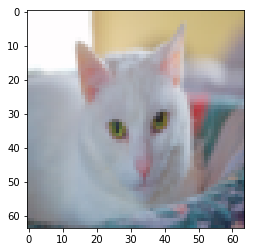

In [405]:
# The predict_classes function outputs the highest probability class
# according to the trained classifier for each input example.
predicted_classes = m.predict_classes(X_test)

print("\r\n")
print(predicted_classes.T)
print(Y_test.T)

plt.imshow(test_set_x_orig[2])

[[ 1.]] y=1.0
The image you input is a cat !

[[ 0.]] y=0.0
The image you input is none cat !

[[ 1.]] y=1.0
The image you input is a cat !

[[ 1.]] y=1.0
The image you input is a cat !

[[ 1.]] y=1.0
The image you input is a cat !

[[ 0.]] y=0.0
The image you input is none cat !

[[ 0.]] y=0.0
The image you input is none cat !

[[ 1.]] y=1.0
The image you input is a cat !

[[ 1.]] y=1.0
The image you input is a cat !

[[ 1.]] y=1.0
The image you input is a cat !



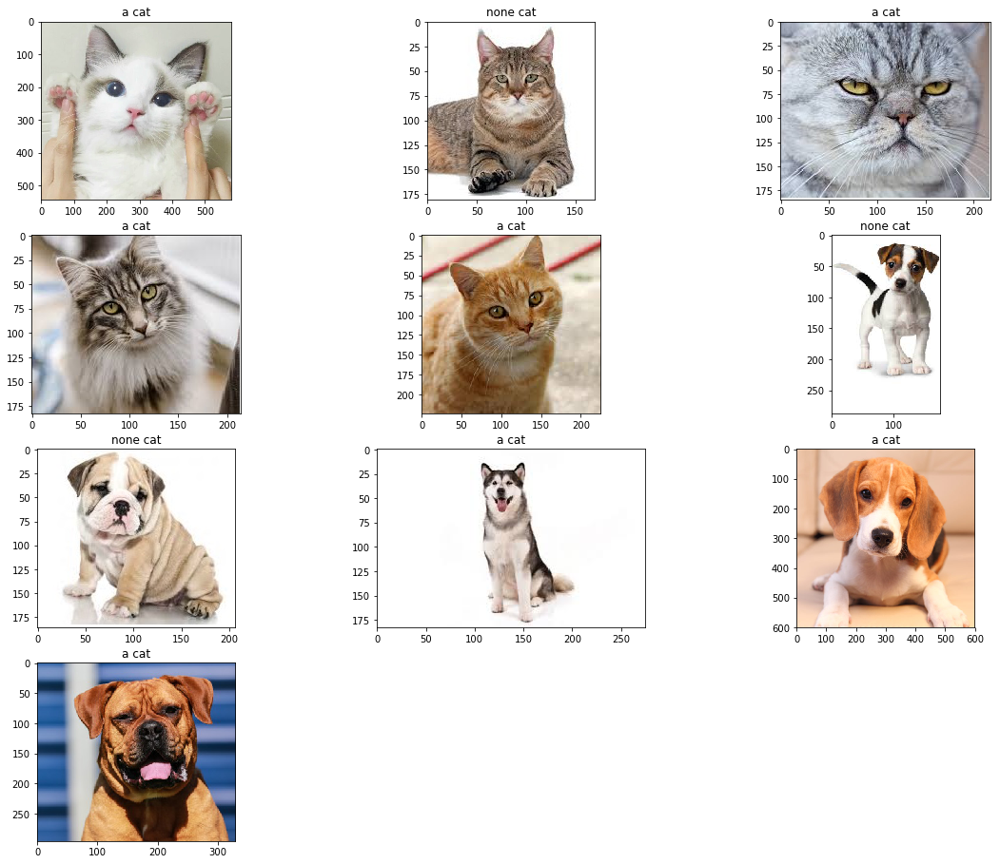

In [498]:
## START CODE HERE ## (PUT YOUR IMAGE NAME) 

my_images = ["catA.jpg","cat2.jpg","cat3.jpg","cat1.jpg","cat5.jpg","dog1.jpg" ,"dog2.jpg","dog5.jpg","dog3.jpg","dog4.jpg"]
pos = 1
rows = len(my_images)/2

plt.figure(figsize=(20,20))

for my_image in my_images:
    ## END CODE HERE ##
    num_px = 64
    num_px = 64

    # We preprocess the image to fit your algorithm.
    fname = "images/" + my_image
    image = np.array(ndimage.imread(fname, flatten=False))
    my_image = scipy.misc.imresize(image, size=(num_px,num_px,3)).reshape((1, num_px*num_px*3)).T

    my_predicted_image = m.predict(my_image.T)

    #round to 0.0x to control the float
    resulty = np.squeeze(np.round(my_predicted_image,0))
    print(my_predicted_image,"y=" + str(resulty))

    plt.subplot(rows,3,pos)
    plt.title(str(result[int(resulty)]))

    pos=pos+1
        
    plt.imshow(image)
    result=['none cat','a cat']
    print("The image you input is",str(result[int(resulty)]),"!\r\n")

plt.show()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_214 (Dense)            (None, 128)               1572992   
_________________________________________________________________
activation_208 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_215 (Dense)            (None, 64)                8256      
_________________________________________________________________
activation_209 (Activation)  (None, 64)                0         
_________________________________________________________________
dense_216 (Dense)            (None, 16)                1040      
_________________________________________________________________
activation_210 (Activation)  (None, 16)                0         
__________

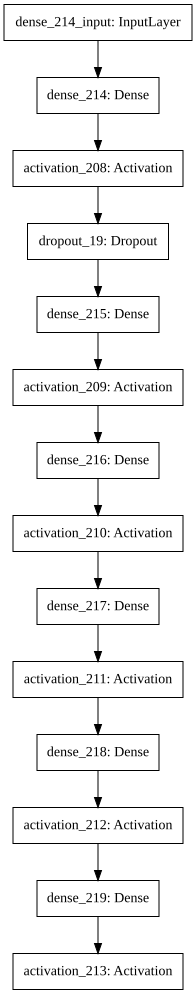

In [464]:
from keras.utils import plot_model
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
print(m.summary())
SVG(model_to_dot(m).create(prog='dot', format='svg'))